<h1 style="color: blue "> IMPORT LIBRARIES
</h1>

In [ ]:
# Import the necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import sqlite3
# import tabulate
from IPython.display import display
# from mlxtend.preprocessing import TransactionEncoder
# from mlxtend.frequent_patterns import apriori, association_rules
from sklearn.linear_model import LinearRegression
from wordcloud import WordCloud
import re
import warnings
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", message="should_run_async will not call transform_cell automatically in the future")
%matplotlib inline
pd.set_option('display.max_columns', None)

<h1 style="color: blue "> EXPLORATORY DATA ANALYSIS
</h1>

<h3 style="color: blue "> Database Data Process ("accident_data_v1.0.0_2023.db")
</h3>

In [ ]:
# creating class with different methods to process accident database data

class DatabaseProcess:
    def __init__(self, db_name):
        self.connect = sqlite3.connect(db_name)
        self.cursor = self.connect.cursor()

    def get_table_list(self):
        """Retrieve the names of all tables in the database."""
        table_list = self.cursor.execute("""
            SELECT name
            FROM sqlite_master
            WHERE type='table'
            ORDER BY name
        """).fetchall()
        return [table[0] for table in table_list]

    def get_column_info(self, table_name):
        """Retrieve column information for a specific table."""
        self.cursor.execute(f"PRAGMA table_info({table_name})")
        return self.cursor.fetchall()

    def get_table_lengths(self):
        """Retrieve the length of each table in the database."""
        table_lengths = {}
        table_list = self.get_table_list()
        for table in table_list:
            self.cursor.execute(f"SELECT COUNT(*) FROM {table}")
            count_result = self.cursor.fetchone()
            table_length = count_result[0]
            table_lengths[table] = table_length
        return table_lengths

    def execute_query(self, query):
        """Execute an SQL query and fetch the results."""
        return self.cursor.execute(query).fetchall()

    def create_dataframe_from_query(self, query, columns):
        """Create a DataFrame from the results of an SQL query."""
        data = self.execute_query(query)
        return pd.DataFrame(data, columns=columns)

    def export_dataframe_to_csv(self, dataframe, filename):
        """Export a DataFrame to a CSV file."""
        dataframe.to_csv(filename, index=False)

    def get_table_data(self, table_name, year=None):
        """Retrieve data from a specific table, optionally filtered by year."""
        if year:
            query = f"""
                SELECT *
                FROM {table_name}
                WHERE accident_year = {year}
            """
        else:
            query = f"""
                SELECT *
                FROM {table_name}
            """
        columns = [column[1] for column in self.get_column_info(table_name)]
        return self.create_dataframe_from_query(query, columns)

In [ ]:
# create instance of the class object
accident_database = DatabaseProcess("accident_data_v1.0.0_2023.db")

In [ ]:
# Get table list
table_list = accident_database.get_table_list()
print("Tables in the database:")
for table in table_list:
    print(table)

Tables in the database:
accident
casualty
lsoa
vehicle


In [ ]:
# Get table lengths
table_lengths = accident_database.get_table_lengths()
print("Table lengths:")
for table, length in table_lengths.items():
    print(f"Length of {table}: {length}")

Table lengths:
Length of accident: 461352
Length of casualty: 600332
Length of lsoa: 34378
Length of vehicle: 849091


In [ ]:
# Get column information for a specific table
accident_columns_info = accident_database.get_column_info("accident")
print("Column information for the accident table:")
for column in accident_columns_info:
    print(column[0:2])

Column information for the accident table:
(0, 'accident_index')
(1, 'accident_year')
(2, 'accident_reference')
(3, 'location_easting_osgr')
(4, 'location_northing_osgr')
(5, 'longitude')
(6, 'latitude')
(7, 'police_force')
(8, 'accident_severity')
(9, 'number_of_vehicles')
(10, 'number_of_casualties')
(11, 'date')
(12, 'day_of_week')
(13, 'time')
(14, 'local_authority_district')
(15, 'local_authority_ons_district')
(16, 'local_authority_highway')
(17, 'first_road_class')
(18, 'first_road_number')
(19, 'road_type')
(20, 'speed_limit')
(21, 'junction_detail')
(22, 'junction_control')
(23, 'second_road_class')
(24, 'second_road_number')
(25, 'pedestrian_crossing_human_control')
(26, 'pedestrian_crossing_physical_facilities')
(27, 'light_conditions')
(28, 'weather_conditions')
(29, 'road_surface_conditions')
(30, 'special_conditions_at_site')
(31, 'carriageway_hazards')
(32, 'urban_or_rural_area')
(33, 'did_police_officer_attend_scene_of_accident')
(34, 'trunk_road_flag')
(35, 'lsoa_of_ac

<h3 style="color: blue ">
Create Dataframe for The Four Tables
</h3>

In [ ]:
# Defining a function to create dataframe
def get_data(database, table_name, year=None):
    if year is not None:
        return database.get_table_data(table_name, year=year)
    else:
        return database.get_table_data(table_name)

# Setting display options to show all columns
pd.set_option('display.max_columns', None)

# create database table dataframe by calling the function
df_accident = get_data(accident_database, "accident", year=2020)
print("Accident data for the year 2020:")
display(df_accident)

df_casualty = get_data(accident_database, "casualty", year=2020)
print("\n Casualty data for the year 2020:")
display(df_casualty)

df_vehicle = get_data(accident_database, "vehicle", year=2020)
print("\n Vehicle data for the year 2020:")
display(df_vehicle)

df_lsoa = get_data(accident_database, "lsoa")
print("\n LSOA data:")
display(df_lsoa)


# Save DataFrames to CSV
# accident_database.export_dataframe_to_csv(df_accident, "accident_2020.csv")
# accident_database.export_dataframe_to_csv(df_casualty, "casualty_2020.csv")
# accident_database.export_dataframe_to_csv(df_vehicle, "vehicle_2020.csv")
# accident_database.export_dataframe_to_csv(df_lsoa, "lsoa.csv")

Accident data for the year 2020:


,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,1,04/02/2020,3,09:00,10,E09000032,E09000032,6,0,6,20,0,-1,0,-1,9,9,1,9,9,0,0,1,3,2,E01004576
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,2,27/04/2020,2,13:55,9,E09000022,E09000022,3,3036,6,20,9,2,6,0,0,4,1,1,1,0,0,1,1,2,E01003034
2,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,1,01/01/2020,4,01:25,1,E09000033,E09000033,5,0,6,30,3,1,6,0,0,0,4,1,2,0,0,1,1,2,E01004726
3,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,1,01/01/2020,4,01:50,17,E09000025,E09000025,3,11,6,30,0,-1,0,-1,0,4,4,1,1,0,0,1,1,2,E01003617
4,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,2,01/01/2020,4,02:25,1,E09000033,E09000033,3,40,6,30,3,4,5,0,0,0,4,1,1,0,0,1,1,2,E01004763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,99,2,2,1,12/08/2020,4,14:30,918,S12000042,S12000042,4,959,6,30,1,4,4,959,0,0,1,1,1,0,0,1,1,-1,-1
91195,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,1,13/11/2020,6,15:05,922,S12000011,S12000011,6,0,9,30,3,4,6,0,0,0,1,1,1,0,0,1,2,-1,-1
91196,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,1,15/04/2020,4,12:42,910,S12000033,S12000033,4,979,6,60,8,-1,6,0,0,0,1,1,1,0,0,2,1,-1,-1
91197,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,1,15/12/2020,3,14:00,932,S12000044,S12000044,6,0,6,30,3,4,6,0,0,0,1,1,1,0,0,1,2,-1,-1



 Casualty data for the year 2020:


,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,484748,2020010219808,2020,010219808,1,1,3,1,31,6,3,9,5,0,0,0,0,1,4
1,484749,2020010220496,2020,010220496,1,1,3,2,2,1,3,1,1,0,0,0,0,1,2
2,484750,2020010220496,2020,010220496,1,2,3,2,4,1,3,1,1,0,0,0,0,1,2
3,484751,2020010228005,2020,010228005,1,1,3,1,23,5,3,5,9,0,0,0,0,1,3
4,484752,2020010228006,2020,010228006,1,1,3,1,47,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115579,600327,2020991027064,2020,991027064,2,1,1,1,11,3,2,0,0,0,0,0,1,1,2
115580,600328,2020991029573,2020,991029573,1,1,3,2,63,9,3,10,1,0,0,0,0,1,10
115581,600329,2020991030297,2020,991030297,2,1,1,1,38,7,2,0,0,0,0,0,5,2,9
115582,600330,2020991030900,2020,991030900,2,1,1,1,76,11,3,0,0,0,0,0,1,1,9



 Vehicle data for the year 2020:


,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,681716,2020010219808,2020,010219808,1,9,9,5,1,5,0,0,0,0,0,0,4,9,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,681717,2020010220496,2020,010220496,1,9,0,4,2,6,0,2,0,0,0,0,1,1,2,1,45,7,1395,1,2,AUDI A1,7,1
2,681718,2020010228005,2020,010228005,1,9,0,18,-1,-1,0,0,0,0,0,0,1,1,6,3,-1,-1,-1,-1,-1,-1,-1,-1
3,681719,2020010228006,2020,010228006,1,8,0,18,1,5,0,0,0,0,0,0,1,1,1,1,44,7,1798,8,8,TOYOTA PRIUS,2,1
4,681720,2020010228011,2020,010228011,1,9,0,18,3,7,9,1,0,0,0,0,1,1,6,1,20,4,2993,2,4,BMW 4 SERIES,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167370,849086,2020991030297,2020,991030297,1,9,0,7,8,2,0,6,0,0,0,0,3,1,1,1,57,9,1968,2,2,AUDI A5,7,1
167371,849087,2020991030297,2020,991030297,2,5,0,16,6,2,0,1,0,0,0,0,1,1,5,1,38,7,1301,1,2,KTM 1290 SUPERDUKE,9,2
167372,849088,2020991030900,2020,991030900,1,9,0,7,8,2,0,6,0,0,0,0,3,1,6,2,68,10,1995,2,1,BMW X3,5,1
167373,849089,2020991030900,2020,991030900,2,1,0,18,6,2,4,8,0,0,0,0,1,1,6,1,76,11,-1,-1,-1,-1,9,1



 LSOA data:


,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,1.298652e+05,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43
1,2,E01000002,City of London 001B,City of London 001B,2.284189e+05,2707.986202,937edbc3-c1bf-4d35-b274-b0a1480a7c09
2,3,E01000003,City of London 001C,City of London 001C,5.905477e+04,1224.774479,2686dcaf-10b9-4736-92af-4788d4feaa69
3,4,E01000004,City of London 001D,City of London 001D,2.544551e+06,10718.466240,3c493140-0b3f-4b9a-b358-22011dc5fb89
4,5,E01000005,City of London 001E,City of London 001E,1.895782e+05,2275.809358,b569093d-788d-41be-816c-d6d7658b2311
...,...,...,...,...,...,...,...
34373,34374,W01001892,Cardiff 020D,Caerdydd 020D,2.699088e+05,2537.220060,1a25aa1e-5db5-4d32-8355-473409dbd69f
34374,34375,W01001893,Cardiff 010B,Caerdydd 010B,4.288488e+06,9807.284401,b6af5e24-eb2a-404a-98a6-a282037b3e10
34375,34376,W01001894,Cardiff 010C,Caerdydd 010C,3.337511e+05,2929.546177,72d16f53-115d-4926-936d-2f1b1d659d46
34376,34377,W01001895,Cardiff 010D,Caerdydd 010D,1.360174e+06,8141.281226,8e105eb9-f68e-4cdb-bca6-b49f6592cb71


<h3 style="color: blue ">
Check Columns (and Common Columns) of The Dataframes
</h3>


In [ ]:
# Get the list of columns of dataframe
accident_columns_list = df_accident.columns.tolist()
casualty_columns_list = df_casualty.columns.tolist()
vehicle_columns_list = df_vehicle.columns.tolist()
lsoa_columns_list = df_lsoa.columns.tolist()

# print the columns
print('Accident Columns List: \n' ,accident_columns_list)

# print the columns
print('\n Casualty Columns List: \n', casualty_columns_list)

# print the columns
print('\n Vehicle Columns List: \n' , vehicle_columns_list)

# print the columns
print('\n LSOA Columns List: \n' , lsoa_columns_list)


# Converting the column lists to sets
accident_columns_set = set(accident_columns_list)
casualty_columns_set = set(casualty_columns_list)
vehicle_columns_set = set(vehicle_columns_list)
lsoa_columns_set = set(lsoa_columns_list)

# Finding the common column names
common_columns = accident_columns_set.intersection(casualty_columns_set, vehicle_columns_set)

# Converting the common columns set back to a list
common_columns_list = list(common_columns)

# Print the common column names
print("\n Common Columns List:\n", common_columns_list)

Accident Columns List: 
 ['accident_index', 'accident_year', 'accident_reference', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'police_force', 'accident_severity', 'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week', 'time', 'local_authority_district', 'local_authority_ons_district', 'local_authority_highway', 'first_road_class', 'first_road_number', 'road_type', 'speed_limit', 'junction_detail', 'junction_control', 'second_road_class', 'second_road_number', 'pedestrian_crossing_human_control', 'pedestrian_crossing_physical_facilities', 'light_conditions', 'weather_conditions', 'road_surface_conditions', 'special_conditions_at_site', 'carriageway_hazards', 'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident', 'trunk_road_flag', 'lsoa_of_accident_location']

 Casualty Columns List: 
 ['casualty_index', 'accident_index', 'accident_year', 'accident_reference', 'vehicle_reference', 'casualty_reference', 'casualty_class', 'sex_

<h3 style="color: blue ">
Merge The Four Dataframes
</h3>

In [ ]:
# Columns in the original dataframes
accident_columns = ['accident_index', 'accident_year', 'accident_reference', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'police_force', 'accident_severity', 'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week', 'time', 'local_authority_district', 'local_authority_ons_district', 'local_authority_highway', 'first_road_class', 'first_road_number', 'road_type', 'speed_limit', 'junction_detail', 'junction_control', 'second_road_class', 'second_road_number', 'pedestrian_crossing_human_control', 'pedestrian_crossing_physical_facilities', 'light_conditions', 'weather_conditions', 'road_surface_conditions', 'special_conditions_at_site', 'carriageway_hazards', 'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident', 'trunk_road_flag', 'lsoa_of_accident_location']
casualty_columns = ['casualty_index', 'accident_index', 'accident_year', 'accident_reference', 'vehicle_reference', 'casualty_reference', 'casualty_class', 'sex_of_casualty', 'age_of_casualty', 'age_band_of_casualty', 'casualty_severity', 'pedestrian_location', 'pedestrian_movement', 'car_passenger', 'bus_or_coach_passenger', 'pedestrian_road_maintenance_worker', 'casualty_type', 'casualty_home_area_type', 'casualty_imd_decile']
vehicle_columns = ['vehicle_index', 'accident_index', 'accident_year', 'accident_reference', 'vehicle_reference', 'vehicle_type', 'towing_and_articulation', 'vehicle_manoeuvre', 'vehicle_direction_from', 'vehicle_direction_to', 'vehicle_location_restricted_lane', 'junction_location', 'skidding_and_overturning', 'hit_object_in_carriageway', 'vehicle_leaving_carriageway', 'hit_object_off_carriageway', 'first_point_of_impact', 'vehicle_left_hand_drive', 'journey_purpose_of_driver', 'sex_of_driver', 'age_of_driver', 'age_band_of_driver', 'engine_capacity_cc', 'propulsion_code', 'age_of_vehicle', 'generic_make_model', 'driver_imd_decile', 'driver_home_area_type']
lsoa_columns = ['objectid', 'lsoa01cd', 'lsoa01nm', 'lsoa01nmw', 'shape__area', 'shape__length', 'globalid']


In [ ]:
# Merging DataFrames
merged_df = df_accident.merge(df_casualty, on=['accident_year', 'accident_index', 'accident_reference'], how="outer")

merged_df = merged_df.merge(df_vehicle, on=['accident_year', 'accident_index', 'accident_reference'], how='outer')

# df = df.merge(df_lsoa, left_on='lsoa_of_accident_location', right_on='lsoa01cd', how='outer')


In [ ]:
# Drop redundant columns
# We'll be dropping vehicle_reference_x in casualty, as it only making reference to vehicle_reference_y according to stat20 form
merged_df.drop(columns=['vehicle_reference_x'], inplace=True)

# rename vehicle_reference_y to the normal vehicle_reference
merged_df.rename(columns={'vehicle_reference_y': 'vehicle_reference'}, inplace=True)
merged_df.head(0)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type


<h3 style="color: blue ">
Make Copy of Merged Dataframes
</h3>

In [ ]:
# let make a copy and start data exploration and cleaning
df = merged_df.copy()

# let check the copied dataframe
df.head(1)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,1,04/02/2020,3,09:00,10,E09000032,E09000032,6,0,6,20,0,-1,0,-1,9,9,1,9,9,0,0,1,3,2,E01004576,484748,1,3,1,31,6,3,9,5,0,0,0,0,1,4,681716,1,9,9,5,1,5,0,0,0,0,0,0,4,9,6,2,32,6,1968,2,6,AUDI Q5,4,1


<h3 style="color: blue ">
Map and Replace Code Values in The Dataframe
</h3>

<h4 style="color: blue ">
Accident Variables
</h4>

In [ ]:
# Dictionary mapping accident weather codes to their meanings
weather_condition_map = {1:'Fine without high winds', 2:'Raining without high winds', 3:'Snowing without high winds',
                         4:'Fine with high winds', 5:'Raining with high winds', 6:'Snowing with high winds',
                         7:'Fog or mist — if hazard', 8:'Other', 9:'Unknown'}

# Dictionary mapping accident junction details codes to their meanings
junction_detail_map = {
    0: "Not at or within 20 metres of junction",
    1: "Roundabout",
    2: "Mini roundabout",
    3: "T or staggered junction",
    5: "Slip road",
    6: "Crossroads",
    7: "Junction more than four arms (not RAB)",
    8: "Using private drive or entrance",
    9: "Other junction"
}

# Dictionary mapping accident severity codes to their meanings
accident_severity_map = {
    1: "Fatal",
        2: "Serious",
    3: "Slight"
}

# Dictionary mapping accident first road class codes to their meanings
first_road_class_map = {
    1: 'Motorway',
    2: 'A(M)',
    3: 'A',
    4: 'B',
    5: 'C',
    6: 'Unclassified'
}

# Dictionary mapping accident road type codes to their meanings
road_type_map = {
    1: 'Roundabout',
    2: 'One way street',
    3: 'Dual carriageway',
    6: 'Single carriageway',
    7: 'Slip Road',
    9: 'Unknow'
}

# Dictionary mapping accident junction control codes to their meanings
junction_control_map = {
    1: 'Authorised person',
    2: 'Automatic traffic signal',
    3: 'Stop sign',
    4: 'Give way or uncontrolled'
}

# Dictionary mapping accident second road class codes to their meanings
second_road_class_map = {
    1: 'Motorway',
    2: 'A(M)',
    3: 'A',
    4: 'B',
    5: 'C',
    6: 'Unclassified'
}

# Dictionary mapping accident pedestrian crossing human control codes to their meanings
pedestrian_crossing_human_control_map = {
    0: 'None within 50 metres',
    1: 'Control by school crossing patrol',
    2: 'Control by other authorised person'
}

# Dictionary mapping accident pedestrian crossing physical facilities codes to their meanings
pedestrian_crossing_physical_facilities_map = {
    0: 'No physical crossing facility within 50 metres',
    1: 'Zebra crossing',
    4: 'Pelican, puffin, toucan or similar non-junction pedestrian light crossing',
    5: 'Pedestrian phase at traffic signal junction',
    7: 'Footbridge or subway',
    8: 'Central refuge - no other controls'
}

# Dictionary mapping accident light conditions codes to their meanings
light_conditions_map = {
    1: 'Daylight',
    4: 'Darkness: street lights present and lit',
    5: 'Darkness: street lights present but unlit',
    6: 'Darkness: no street lighting',
    7: 'Darkness: street lighting unknown'
}

# Dictionary mapping accident road surface conditions codes to their meanings
road_surface_conditions_map = {
    1: 'Dry',
    2: 'Wet/Damp',
    3: 'Snow',
    4: 'Frost/Ice',
    5: 'Flood (surface water over 3cm deep)'
}

# Dictionary mapping accident special conditions at site codes to their meanings
special_conditions_at_site_map = {
    0: 'None',
    1: 'Automatic traffic signal out',
    2: 'Automatic traffic signal partially defective',
    3: 'Permanent road signing or marking defective or obscured',
    4: 'Roadworks',
    5: 'Road surface defective',
    6: 'Oil or diesel',
    7: 'Mud'
}

# Dictionary mapping accident carriageway hazards codes to their meanings
carriageway_hazards_map = {
    0: 'None',
    1: 'Dislodged vehicle load in carriageway',
    2: 'Other object in carriageway',
    3: 'Involvement with previous accident',
    6: 'Pedestrian in carriageway - not injured',
    7: 'Any animal in carriageway (except ridden horse)'
}

# Dictionary mapping accident 'did police officer attend scene of accident' codes to their meanings
did_police_officer_attend_scene_of_accident_map = {
    1: 'Yes',
    2: 'No',
    3: 'No – self reporting'
}

# Dictionary mapping accident trunk_road_flag codes to their meanings
trunk_road_flag_map = {
    21: 'New vehicle record',
    25: 'Amended vehicle record'
}

# Dictionary mapping accident trunk_road_flag codes to their meanings
trunk_road_flag_map = {
    21: 'New vehicle record',
    25: 'Amended vehicle record'
}

# Dictionary mapping accident urban or rural area codes to their meanings
urban_or_rural_area_map = {
    1: 'Urban Area', # about 70% of this are inputed, which implies it is urban, as more accident due to higher population
    2: 'Rural Area', # about 30%, less accident recorded, likely due to lower population
#     3: 'invalid_input' # Mapping unexpected values to a placeholder, this is just about 14 in total in the dataset
}

# Dictionary mapping accident local authority district codes to their meanings
local_authority_district_map = {'E09000001': 'City of London', 'E07000117': 'Burnley', 'E09000002': 'Barking and Dagenham', 'E07000118': 'Chorley', 'E09000003': 'Barnet', 'E07000119': 'Fylde', 'E09000004': 'Bexley', 'E07000120': 'Hyndburn', 'E09000005': 'Brent', 'E07000121': 'Lancaster', 'E09000006': 'Bromley', 'E07000122': 'Pendle', 'E09000007': 'Camden', 'E07000123': 'Preston', 'E09000008': 'Croydon', 'E07000124': 'Ribble Valley', 'E09000009': 'Ealing', 'E07000125': 'Rossendale', 'E09000010': 'Enfield', 'E07000126': 'South Ribble', 'E09000011': 'Greenwich', 'E07000127': 'West Lancashire', 'E09000012': 'Hackney', 'E07000128': 'Wyre', 'E09000013': 'Hammersmith and Fulham', 'E09000014': 'Haringey', 'E09000015': 'Harrow', 'E09000016': 'Havering', 'E06000008': 'Blackburn with Darwen', 'E09000017': 'Hillingdon', 'E06000009': 'Blackpool', 'E09000018': 'Hounslow', 'E09000019': 'Islington', 'E09000020': 'Kensington and Chelsea', 'E09000021': 'Kingston upon Thames', 'E09000022': 'Lambeth', 'E08000011': 'Knowsley', 'E09000023': 'Lewisham', 'E08000012': 'Liverpool', 'E09000024': 'Merton', 'E08000013': 'St. Helens', 'E09000025': 'Newham', 'E08000014': 'Sefton', 'E09000026': 'Redbridge', 'E08000015': 'Wirral', 'E09000027': 'Richmond upon Thames', 'E09000028': 'Southwark', 'E09000029': 'Sutton', 'E09000030': 'Tower Hamlets', 'E09000031': 'Waltham Forest', 'E08000001': 'Bolton', 'E09000032': 'Wandsworth', 'E08000002': 'Bury', 'E09000033': 'Westminster', 'E08000003': 'Manchester', 'E08000004': 'Oldham', 'E08000005': 'Rochdale', 'E08000006': 'Salford', 'E08000007': 'Stockport', 'E08000008': 'Tameside', 'E08000009': 'Trafford', 'E08000010': 'Wigan', 'E07000026': 'Allerdale', 'E07000027': 'Barrow-in-Furness', 'E07000028': 'Carlisle', 'E07000029': 'Copeland', 'E07000030': 'Eden', 'E07000031': 'South Lakeland', 'EHEATHROW': 'London Airport (Heathrow)', 'E06000049': 'Cheshire East', 'E06000010': 'Kingston upon Hull, City of', 'E06000050': 'Cheshire West and Chester', 'E06000011': 'East Riding of Yorkshire', 'E06000006': 'Halton', 'E06000007': 'Warrington', 'E06000013': 'North Lincolnshire', 'E06000012': 'North East Lincolnshire', 'E06000048': 'Northumberland', 'E06000001': 'Hartlepool', 'E06000003': 'Redcar and Cleveland', 'E06000002': 'Middlesbrough', 'E06000004': 'Stockton-on-Tees', 'E08000020': 'Gateshead', 'E08000022': 'Newcastle upon Tyne', 'E08000023': 'South Tyneside', 'E08000025': 'Birmingham', 'E08000024': 'Sunderland', 'E08000026': 'Coventry', 'E08000027': 'Dudley', 'E08000028': 'Sandwell', 'E08000029': 'Solihull', 'E06000047': 'County Durham', 'E08000030': 'Walsall', 'E08000031': 'Wolverhampton', 'E06000005': 'Darlington', 'E07000163': 'Craven', 'E07000164': 'Hambleton', 'E07000165': 'Harrogate', 'E07000166': 'Richmondshire', 'E07000167': 'Ryedale', 'E07000168': 'Scarborough', 'E07000169': 'Selby', 'E06000014': 'York', 'E07000192': 'Cannock Chase', 'E07000193': 'East Staffordshire', 'E07000194': 'Lichfield', 'E07000195': 'Newcastle-under-Lyme', 'E07000196': 'South Staffordshire', 'E07000197': 'Stafford', 'E07000198': 'Staffordshire Moorlands', 'E07000199': 'Tamworth', 'E06000021': 'Stoke-on-Trent', 'E08000033': 'Calderdale', 'E08000032': 'Bradford', 'E08000034': 'Kirklees', 'E07000234': 'Bromsgrove', 'E08000035': 'Leeds', 'E07000235': 'Malvern Hills', 'E08000036': 'Wakefield', 'E07000236': 'Redditch', 'E07000237': 'Worcester', 'E07000238': 'Wychavon', 'E08000016': 'Barnsley', 'E08000017': 'Doncaster', 'E08000018': 'Rotherham', 'E08000019': 'Sheffield', 'E07000239': 'Wyre Forest', 'E06000019': 'Herefordshire, County of', 'E06000051': 'Shropshire', 'E06000020': 'Telford and Wrekin', 'E07000218': 'North Warwickshire', 'E07000129': 'Blaby', 'E07000219': 'Nuneaton and Bedworth', 'E07000132': 'Hinckley and Bosworth', 'E07000220': 'Rugby', 'E07000130': 'Charnwood', 'E07000221': 'Stratford-upon-Avon', 'E07000131': 'Harborough', 'E07000222': 'Warwick', 'E07000133': 'Melton', 'E07000134': 'North West Leicestershire', 'E07000135': 'Oadby and Wigston', 'E07000032': 'Amber Valley', 'E07000033': 'Bolsover', 'E07000034': 'Chesterfield', 'E07000036': 'Erewash', 'E07000037': 'High Peak', 'E07000038': 'North East Derbyshire', 'E07000039': 'South Derbyshire', 'E07000035': 'Derbyshire Dales', 'E06000016': 'Leicester', 'E06000017': 'Rutland', 'E07000150': 'Corby', 'E07000151': 'Daventry', 'E06000015': 'Derby', 'E07000152': 'East Northamptonshire', 'E07000153': 'Kettering', 'E07000154': 'Northampton', 'E07000155': 'South Northamptonshire', 'E07000156': 'Wellingborough', 'E07000170': 'Ashfield', 'E07000171': 'Bassetlaw', 'E07000172': 'Broxtowe', 'E07000173': 'Gedling', 'E07000174': 'Mansfield', 'E07000175': 'Newark and Sherwood', 'E07000176': 'Rushcliffe', 'E07000008': 'Cambridge', 'E07000009': 'East Cambridgeshire', 'E07000010': 'Fenland', 'E07000011': 'Huntingdonshire', 'E07000012': 'South Cambridgeshire', 'E07000142': 'West Lindsey', 'E07000136': 'Boston', 'E07000137': 'East Lindsey', 'E07000138': 'Lincoln', 'E07000139': 'North Kesteven', 'E07000140': 'South Holland', 'E07000141': 'South Kesteven', 'E07000018': 'Nottingham', 'E06000031': 'Peterborough', 'E07000143': 'Breckland', 'E07000144': 'Broadland', 'E07000145': 'Great Yarmouth', 'E07000148': 'Norwich', 'E07000147': 'North Norfolk', 'E07000149': 'South Norfolk', 'E07000146': "King's Lynn and West Norfolk", 'E07000200': 'Babergh', 'E07000201': 'Forest Heath', 'E07000202': 'Ipswich', 'E07000203': 'Mid Suffolk', 'E07000204': 'St. Edmundsbury', 'E07000205': 'Suffolk Coastal', 'E07000206': 'Waveney', 'E06000055': 'Bedford', 'E06000032': 'Luton', 'E06000056': 'Central Bedfordshire', 'E07000095': 'Broxbourne', 'E07000096': 'Dacorum', 'E07000097': 'East Hertfordshire', 'E07000098': 'Hertsmere', 'E07000099': 'North Hertfordshire', 'E07000100': 'St. Albans', 'E07000101': 'Stevenage', 'E07000102': 'Three Rivers', 'E07000103': 'Watford', 'E07000104': 'Welwyn Hatfield', 'E07000066': 'Basildon', 'E07000067': 'Braintree', 'E07000068': 'Brentwood', 'E07000069': 'Castle Point', 'E07000070': 'Chelmsford', 'E07000071': 'Colchester', 'E07000072': 'Epping Forest', 'E07000073': 'Harlow', 'E07000074': 'Maldon', 'E07000075': 'Rochford', 'E07000076': 'Tendring', 'E07000077': 'Uttlesford', 'E06000033': 'Southend-on-Sea', 'E06000034': 'Thurrock', 'E06000036': 'Bracknell Forest', 'E06000037': 'West Berkshire', 'E06000038': 'Reading', 'E06000039': 'Slough', 'E06000040': 'Windsor and Maidenhead', 'E06000041': 'Wokingham', 'E07000004': 'Aylesbury Vale', 'E07000006': 'South Bucks', 'E07000005': 'Chiltern', 'E07000007': 'Wycombe', 'E06000042': 'Milton Keynes', 'E07000177': 'Cherwell', 'E07000178': 'Oxford', 'E07000180': 'Vale of White Horse', 'E07000179': 'South Oxfordshire', 'E07000181': 'West Oxfordshire', 'E07000084': 'Basingstoke and Deane', 'E07000086': 'Eastleigh', 'E07000087': 'Fareham', 'E07000088': 'Gosport', 'E07000089': 'Hart', 'E07000090': 'Havant', 'E07000091': 'New Forest', 'E07000085': 'East Hampshire', 'E07000092': 'Rushmoor', 'E07000093': 'Test Valley', 'E07000094': 'Winchester', 'E06000046': 'Isle of Wight', 'E06000044': 'Portsmouth', 'E06000045': 'Southampton', 'E07000208': 'Epsom and Ewell', 'E07000213': 'Spelthorne', 'E07000207': 'Elmbridge', 'E07000209': 'Guildford', 'E07000210': 'Mole Valley', 'E07000211': 'Reigate and Banstead', 'E07000212': 'Runnymede', 'E07000214': 'Surrey Heath', 'E07000215': 'Tandridge', 'E07000216': 'Waverley', 'E07000217': 'Woking', 'E07000105': 'Ashford', 'E07000106': 'Canterbury', 'E07000107': 'Dartford', 'E07000108': 'Dover', 'E07000109': 'Gravesham', 'E07000110': 'Maidstone', 'E07000111': 'Sevenoaks', 'E07000112': 'Shepway', 'E07000113': 'Swale', 'E07000114': 'Thanet', 'E07000115': 'Tonbridge and Malling', 'E07000116': 'Tunbridge Wells', 'E06000035': 'Medway', 'E07000061': 'Eastbourne', 'E07000062': 'Hastings', 'E07000063': 'Lewes', 'E07000064': 'Rother', 'E07000065': 'Wealden', 'E06000043': 'Brighton and Hove', 'E07000223': 'Adur', 'E07000224': 'Arun', 'E07000225': 'Chichester', 'E07000226': 'Crawley', 'E07000227': 'Horsham', 'E07000228': 'Mid Sussex', 'E07000229': 'Worthing', 'E07000040': 'East Devon', 'E07000041': 'Exeter', 'E07000043': 'North Devon', 'E07000044': 'South Hams', 'E07000045': 'Teignbridge', 'E07000042': 'Mid Devon', 'E07000046': 'Torridge', 'E07000047': 'West Devon', 'E06000026': 'Plymouth', 'E06000027': 'Torbay', 'E06000052': 'Cornwall', 'E06000022': 'Bath and North East Somerset', 'E06000023': 'Bristol, City of', 'E06000024': 'North Somerset', 'E06000025': 'South Gloucestershire', 'E07000187': 'Mendip', 'E07000188': 'Sedgemoor', 'E07000190': 'Taunton Deane', 'E07000191': 'West Somerset', 'E07000189': 'South Somerset', 'E07000078': 'Cheltenham', 'E07000079': 'Cotswold', 'E07000080': 'Forest of Dean', 'E07000081': 'Gloucester', 'E07000082': 'Stroud', 'E07000083': 'Tewkesbury', 'E06000030': 'Swindon', 'E06000054': 'Wiltshire', 'E07000048': 'Christchurch', 'E07000050': 'North Dorset', 'E07000051': 'Purbeck', 'E07000052': 'West Dorset', 'E07000053': 'Weymouth and Portland', 'E07000049': 'Purbeck', 'E06000028': 'Bournemouth', 'E06000029': 'Poole', 'W06000001': 'Isle of Anglesey', 'W06000003': 'Conwy', 'W06000002': 'Gwynedd', 'W06000004': 'Denbighshire', 'W06000005': 'Flintshire', 'W06000006': 'Wrexham', 'W06000019': 'Blaenau Gwent', 'W06000018': 'Caerphilly', 'W06000021': 'Monmouthshire', 'W06000022': 'Newport', 'W06000020': 'Monmouthshire', 'W06000024': 'Merthyr Tydfil', 'W06000012': 'Neath Port Talbot', 'W06000013': 'Bridgend', 'W06000015': 'Cardiff', 'W06000016': 'Rhondda, Cynon, Taff', 'W06000011': 'Torfaen', 'W06000014': 'The Vale of Glamorgan', 'W06000008': 'Ceredigion', 'W06000010': 'Carmarthenshire', 'W06000009': 'Pembrokeshire', 'W06000023': 'Powys', 'S12000017': 'Highland', 'S12000035': 'Argyll & Bute', 'S12000023': 'Orkney Islands', 'S12000013': 'Na h-Eileanan an Iar (Western Isles)', 'S12000008': 'East Ayrshire', 'S12000009': 'East Dunbartonshire', 'S12000011': 'East Renfrewshire', 'S12000027': 'Shetland Islands', 'S12000043': 'Glasgow City', 'S12000018': 'Inverclyde', 'S12000021': 'North Ayrshire', 'S12000044': 'North Lanarkshire', 'S12000033': 'Aberdeen City', 'S12000038': 'Renfrewshire', 'S12000028': 'South Ayrshire', 'S12000034': 'Aberdeenshire', 'S12000029': 'South Lanarkshire', 'S12000020': 'Moray', 'S12000039': 'West Dunbartonshire', 'S12000041': 'Angus', 'S12000042': 'Dundee City', 'S12000024': 'Perth and Kinross', 'S12000015': 'Fife', 'S12000006': 'Dumfries & Galloway', 'S12000010': 'East Lothian', 'S12000036': 'Edinburgh, City of', 'S12000019': 'Midlothian', 'S12000026': 'Scottish Borders', 'S12000040': 'West Lothian', 'S12000005': 'Clackmannanshire', 'S12000014': 'Falkirk', 'S12000030': 'Stirling'}

# Dictionary mapping accident police force codes to their meanings
police_force_map = {1: 'Metropolitan Police', 3: 'Cumbria', 4: 'Lancashire', 5: 'Merseyside', 6: 'Greater Manchester', 7: 'Cheshire', 10: 'Northumbria', 11: 'Durham', 12: 'North Yorkshire', 13: 'West Yorkshire', 14: 'South Yorkshire', 16: 'Humberside', 17: 'Cleveland', 20: 'West Midlands', 21: 'Staffordshire', 22: 'West Mercia', 23: 'Warwickshire', 30: 'Derbyshire', 31: 'Nottinghamshire', 32: 'Lincolnshire', 33: 'Leicestershire', 34: 'Northamptonshire', 35: 'Cambridgeshire', 36: 'Norfolk', 37: 'Suffolk', 40: 'Bedfordshire', 41: 'Essex', 42: 'Hertfordshire', 43: 'Thames Valley', 44: 'Hampshire', 45: 'Surrey', 46: 'Kent', 47: 'Sussex', 48: 'City of London', 50: 'Avon and Somerset', 52: 'Devon and Cornwall', 53: 'Wiltshire', 54: 'Gloucestershire', 55: 'Dorset', 60: 'North Wales', 61: 'Gwent', 62: 'South Wales', 63: 'Dyfed-Powys', 91: 'Northern', 92: 'Grampian', 93: 'Tayside', 94: 'Fife', 95: 'Lothian and Borders', 96: 'Central', 97: 'Strathclyde', 98: 'Dumfries and Galloway'}



# Function to replace code values with their meanings in a DataFrame column
def replace_code_with_meaning(dataframe, column, code_meaning_map):
    dataframe[column].replace(code_meaning_map, inplace=True)
    return dataframe


# Replacing code values with their meanings using the function for all columns
replace_code_with_meaning(df, "weather_conditions", weather_condition_map)
replace_code_with_meaning(df, "junction_detail", junction_detail_map)
replace_code_with_meaning(df, "accident_severity", accident_severity_map)
replace_code_with_meaning(df, "police_force", police_force_map)
replace_code_with_meaning(df, "local_authority_ons_district", local_authority_district_map)
replace_code_with_meaning(df, "local_authority_highway", local_authority_district_map)
replace_code_with_meaning(df, "first_road_class", first_road_class_map)
replace_code_with_meaning(df, "road_type", road_type_map)
replace_code_with_meaning(df, "junction_control", junction_control_map)
replace_code_with_meaning(df, "second_road_class", second_road_class_map)
replace_code_with_meaning(df, "pedestrian_crossing_human_control", pedestrian_crossing_human_control_map)
replace_code_with_meaning(df, "pedestrian_crossing_physical_facilities", pedestrian_crossing_physical_facilities_map)
replace_code_with_meaning(df, "light_conditions", light_conditions_map)
replace_code_with_meaning(df, "road_surface_conditions", road_surface_conditions_map)
replace_code_with_meaning(df, "special_conditions_at_site", special_conditions_at_site_map)
replace_code_with_meaning(df, "carriageway_hazards", carriageway_hazards_map)
replace_code_with_meaning(df, "did_police_officer_attend_scene_of_accident", did_police_officer_attend_scene_of_accident_map)
replace_code_with_meaning(df, "trunk_road_flag", trunk_road_flag_map)
replace_code_with_meaning(df, "urban_or_rural_area", urban_or_rural_area_map)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,04/02/2020,3,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,-1,0,-1,9,9,Daylight,Unknown,9,None,None,Urban Area,No – self reporting,2,E01004576,484748,1,3,1,31,6,3,9,5,0,0,0,0,1,4,681716,1,9,9,5,1,5,0,0,0,0,0,0,4,9,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,27/04/2020,2,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,2,E01003034,484749,1,3,2,2,1,3,1,1,0,0,0,0,1,2,681717,1,9,0,4,2,6,0,2,0,0,0,0,1,1,2,1,45,7,1395,1,2,AUDI A1,7,1
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,27/04/2020,2,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,2,E01003034,484750,2,3,2,4,1,3,1,1,0,0,0,0,1,2,681717,1,9,0,4,2,6,0,2,0,0,0,0,1,1,2,1,45,7,1395,1,2,AUDI A1,7,1
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,Metropolitan Police,Slight,1,1,01/01/2020,4,01:25,1,Westminster,Westminster,C,0,Single carriageway,30,T or staggered junction,Authorised person,Unclassified,0,None within 50 metres,No physical crossing facility within 50 metres,Darkness: street lights present and lit,Fine without high winds,Wet/Damp,None,None,Urban Area,Yes,2,E01004726,484751,1,3,1,23,5,3,5,9,0,0,0,0,1,3,681718,1,9,0,18,-1,-1,0,0,0,0,0,0,1,1,6,3,-1,-1,-1,-1,-1,-1,-1,-1
4,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,Metropolitan Police,Serious,1,1,01/01/2020,4,01:50,17,Newham,Newham,A,11,Single carriageway,30,Not at or within 20 metres of junction,-1,0,-1,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Darkness: street lights present and lit,Fine without high winds,Dry,None,None,Urban Area,Yes,2,E01003617,484752,1,3,1,47,8,2,4,1,0,0,0,0,1,3,681719,1,8,0,18,1,5,0,0,0,0,0,0,1,1,1,1,44,7,1798,8,8,TOYOTA PRIUS,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

<h4 style="color: blue ">
Casualty Variables
</h4>

In [ ]:
# Dictionary mapping casualty class codes to their meanings
casualty_class_map = {
    1: 'Driver or rider',
    2: 'Vehicle or pillion passenger',
    3: 'Pedestrian'
}

# Dictionary mapping sex of casualty codes to their meanings
sex_of_casualty_map = {
    1: 'Male',
    2: 'Female'
}

# Dictionary mapping severity of casualty codes to their meanings
casualty_severity_map = {
    1: 'Fatal',
    2: 'Serious',
    3: 'Slight'
}

# Dictionary mapping pedestrian_location codes to their meanings
pedestrian_location_map = {
    1: 'In carriageway, crossing on pedestrian crossing facility',
    2: 'In carriageway, crossing within zig-zag lines at crossing approach',
    3: 'In carriageway, crossing within zig-zag lines at crossing exit',
    4: 'In carriageway, crossing elsewhere within 50 metres of pedestrian crossing',
    5: 'In carriageway, crossing elsewhere',
    6: 'On footway or verge',
    7: 'On refuge, central island or central reservation',
    8: 'In centre of carriageway, not on refuge, central island or central reservation',
    9: 'In carriageway, not crossing',
    10: 'Unknown or other'
}

# Dictionary mapping pedestrian movement codes to their meanings
pedestrian_movement_map = {
    1: "Crossing from driver's nearside",
    2: "Crossing from driver's nearside - masked by parked or stationary vehicle",
    3: "Crossing from driver's offside",
    4: "Crossing from driver's offside - masked by parked or stationary vehicle",
    5: "In carriageway, stationary - not crossing (standing or playing)",
    6: "In carriageway, stationary - not crossing (standing or playing), masked by parked or stationary vehicle",
    7: "Walking along in carriageway - facing traffic",
    8: "Walking along in carriageway - back to traffic",
    9: "Unknown or other"
}

# Dictionary mapping car passenger codes to their meanings
car_passenger_map = {
    0: 'Not a car passenger',
    1: 'Front seat passenger',
    2: 'Rear seat passenger'
}

# Dictionary mapping bus_or_coach_passenger codes to their meanings
bus_or_coach_passenger_map = {
    0: 'Not a bus or coach passenger',
    1: 'Boarding',
    2: 'Alighting',
    3: 'Standing passenger',
    4: 'Seated passenger'
}

# Dictionary mapping casualty_home_area_type codes to their meanings
casualty_home_area_type_map = {
    1: 'Unknown',
    2: 'Non-UK resident'
}

# Dictionary mapping pedestrian_road_maintenance_worker codes to their meanings
pedestrian_road_maintenance_worker_map = {
    0: 'Not applicable',
    1: 'Yes',
    2: 'Not known'
}

# Replacing code values with their meanings using the function for all columns
replace_code_with_meaning(df, "casualty_class", casualty_class_map)
replace_code_with_meaning(df, "sex_of_casualty", sex_of_casualty_map)
replace_code_with_meaning(df, "casualty_severity", casualty_severity_map)
replace_code_with_meaning(df, "pedestrian_location", pedestrian_location_map)
replace_code_with_meaning(df, "pedestrian_movement", pedestrian_movement_map)
replace_code_with_meaning(df, "car_passenger", car_passenger_map)
replace_code_with_meaning(df, "bus_or_coach_passenger", bus_or_coach_passenger_map)
replace_code_with_meaning(df, "casualty_home_area_type", casualty_home_area_type_map)
replace_code_with_meaning(df, "pedestrian_road_maintenance_worker", pedestrian_road_maintenance_worker_map)


,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,04/02/2020,3,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,-1,0,-1,9,9,Daylight,Unknown,9,None,None,Urban Area,No – self reporting,2,E01004576,484748,1,Pedestrian,Male,31,6,Slight,"In carriageway, not crossing","In carriageway, stationary - not crossing (sta...",Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,4,681716,1,9,9,5,1,5,0,0,0,0,0,0,4,9,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,27/04/2020,2,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,2,E01003034,484749,1,Pedestrian,Female,2,1,Slight,"In carriageway, crossing on pedestrian crossin...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,2,681717,1,9,0,4,2,6,0,2,0,0,0,0,1,1,2,1,45,7,1395,1,2,AUDI A1,7,1
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,27/04/2020,2,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,2,E01003034,484750,2,Pedestrian,Female,4,1,Slight,"In carriageway, crossing on pedestrian crossin...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,2,681717,1,9,0,4,2,6,0,2,0,0,0,0,1,1,2,1,45,7,1395,1,2,AUDI A1,7,1
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,Metropolitan Police,Slight,1,1,01/01/2020,4,01:25,1,Westminster,Westminster,C,0,Single carriageway,30,T or staggered junction,Authorised person,Unclassified,0,None within 50 metres,No physical crossing facility within 50 metres,Darkness: street lights present and lit,Fine without high winds,Wet/Damp,None,None,Urban Area,Yes,2,E01004726,484751,1,Pedestrian,Male,23,5,Slight,"In carriageway, crossing elsewhere",Unknown or other,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,3,681718,1,9,0,18,-1,-1,0,0,0,0,0,0,1,1,6,3,-1,-1,-1,-1,-1,-1,-1,-1
4,2020010228006,2020,010228

<h4 style="color: blue ">
Vehicle Variables
</h4>

In [ ]:
# Dictionary mapping vehicle types codes to their meanings
vehicle_type_map = {
    1: 'Pedal cycle',
    2: 'Motorcycle 50cc and under',
    3: 'Motorcycle over 50cc and up to 125cc',
    4: 'Motorcycle over 125cc and up to 500cc',
    5: 'Motorcycle over 500cc',
    97: 'Motorcycle – unknown cc',
    23: 'Electric motorcycle',
    8: 'Taxi/Private hire car',
    9: 'Car',
    10: 'Minibus (8 - 16 passenger seats)',
    11: 'Bus or coach (17 or more passenger seats)',
    16: 'Ridden horse',
    17: 'Agricultural vehicle (includes diggers etc.)',
    18: 'Tram/Light rail',
    19: 'Van/Goods vehicle 3.5 tonnes maximum gross weight (mgw) and under',
    20: 'Goods vehicle over 3.5 tonnes and under 7.5 tonnes mgw',
    21: 'Goods vehicle 7.5 tonnes mgw and over',
    98: 'Goods vehicle – unknown weight',
    22: 'Mobility scooter',
    90: 'Other vehicle'
}

# Dictionary mapping towing and articulation codes to their meanings
towing_and_articulation_map = {
    0: 'No tow or articulation',
    1: 'Articulated vehicle',
    2: 'Double or multiple trailer',
    3: 'Caravan',
    4: 'Single trailer',
    5: 'Other tow'
}

# Dictionary mapping vehicle manoeuvres codes to their meanings
vehicle_manoeuvre_map = {
    1: 'Reversing',
    2: 'Parked',
    3: 'Waiting to go ahead but held up',
    4: 'Slowing or stopping',
    5: 'Moving off',
    6: 'U turn',
    7: 'Turning left',
    8: 'Waiting to turn left',
    9: 'Turning right',
    10: 'Waiting to turn right',
    11: 'Changing lane to left',
    12: 'Changing lane to right',
    13: 'Overtaking moving vehicle on its offside',
    14: 'Overtaking stationary vehicle on its offside',
    15: 'Overtaking on nearside',
    16: 'Going ahead left hand bend',
    17: 'Going ahead right hand bend',
    18: 'Going ahead other'
}


# Dictionary mapping vehicle_location_restricted_lane codes to their meanings
vehicle_location_restricted_lane_map = {
    0: 'On main carriageway - not in restricted lane',
    1: 'Tram/Light rail track',
    2: 'Bus lane',
    3: 'Busway (including guided busway)',
    4: 'Cycle lane (on main carriageway)',
    5: 'Cycleway or shared use footway (not part of main carriageway)',
    6: 'On lay-by or hard shoulder',
    7: 'Entering lay-by or hard shoulder',
    8: 'Leaving lay-by or hard shoulder',
    9: 'Footway (pavement)'
}

# Dictionary mapping junction_location codes to their meanings
junction_location_map = {
    0: 'Not at, or within 20 metres of, junction',
    1: 'Approaching junction or waiting/parked at junction approach',
    2: 'Cleared junction or waiting/parked at junction exit',
    3: 'Leaving roundabout',
    4: 'Entering roundabout',
    5: 'Leaving main road',
    6: 'Entering main road',
    7: 'Entering from slip road',
    8: 'Mid junction - on roundabout or on main road'
}

# Dictionary mapping skidding_and_overturning codes to their meanings
skidding_and_overturning_map = {
    0: 'No skidding, jack-knifing or overturning',
    1: 'Skidded',
    2: 'Skidded and overturned',
    3: 'Jack-knifed',
    4: 'Jack-knifed and overturned',
    5: 'Overturned'
}

# Dictionary mapping hit_object_in_carriageway codes to their meanings
hit_object_in_carriageway_map = {
    0: 'None',
    1: 'Previous accident',
    2: 'Roadworks',
    4: 'Parked vehicle',
    5: 'Bridge - roof',
    6: 'Bridge - side',
    7: 'Bollard/Refuge',
    8: 'Open door of vehicle',
    9: 'Central island of roundabout',
    10: 'Kerb',
    11: 'Other object',
    12: 'Any animal (except ridden horse)'
}
# Dictionary mapping vehicle_leaving_carriageway codes to their meanings
vehicle_leaving_carriageway_map = {
    0: 'Did not leave carriageway',
    1: 'Left carriageway nearside',
    2: 'Left carriageway nearside and rebounded',
    3: 'Left carriageway straight ahead at junction',
    4: 'Left carriageway offside onto central reservation',
    5: 'Left carriageway offside onto central reservation and rebounded',
    6: 'Left carriageway offside and crossed central reservation',
    7: 'Left carriageway offside',
    8: 'Left carriageway offside and rebounded'
}

# Dictionary mapping hit_object_off_carriageway codes to their meanings
hit_object_off_carriageway_map = {
    0: 'None',
    1: 'Road sign/Traffic signal',
    2: 'Lamp post',
    3: 'Telegraph pole/Electricity pole',
    4: 'Tree',
    5: 'Bus stop/Bus shelter',
    6: 'Central crash barrier',
    7: 'Nearside or offside crash barrier',
    8: 'Submerged in water (completely)',
    9: 'Entered ditch',
    11: 'Wall or fence',
    10: 'Other permanent object'
}

# Dictionary mapping first_point_of_impact codes to their meanings
first_point_of_impact_map = {
    0: 'Did not impact',
    1: 'Front',
    2: 'Back',
    3: 'Offside',
    4: 'Nearside'
}

# Dictionary mapping sex_of_driver codes to their meanings
sex_of_driver_map = {
    1: 'Male',
    2: 'Female',
    3: 'Not known'
}

# Dictionary mapping driver_home_area_type codes to their meanings
driver_home_area_type_map = {
    1: 'Unknown',
    2: 'Non-UK resident',
    3: 'Parked and unattended'
}

# Dictionary mapping journey_purpose_of_driver codes to their meanings
journey_purpose_of_driver_map = {
    1: 'Journey as part of work',
    2: 'Commuting to/from work',
    3: 'Taking pupil to/from school',
    4: 'Pupil riding to/from school',
    5: 'Other',
    6: 'Not known'
}

# Dictionary mapping vehicle_left_hand_drive codes to their meanings
vehicle_left_hand_drive_map = {
    1: 'No',
    2: 'Yes'
}

# Dictionary mapping vehicle_direction_to codes to their meanings
vehicle_direction_to_map = {
    1: 'North',
    2: 'North east',
    3: 'East',
    4: 'South east',
    5: 'South',
    6: 'South west',
    7: 'West',
    8: 'North west',
    9: 'Unknown',
    0: 'Parked'
}

# Dictionary mapping vehicle_direction_from codes to their meanings
vehicle_direction_from_map = {
    1: 'North',
    2: 'North east',
    3: 'East',
    4: 'South east',
    5: 'South',
    6: 'South west',
    7: 'West',
    8: 'North west',
    9: 'Unknown',
    0: 'Parked'
}


# Replacing code values with their meanings using the function for all columns
replace_code_with_meaning(df, "vehicle_type", vehicle_type_map)
replace_code_with_meaning(df, "towing_and_articulation", towing_and_articulation_map)
replace_code_with_meaning(df, "vehicle_manoeuvre", vehicle_manoeuvre_map)
replace_code_with_meaning(df, "vehicle_location_restricted_lane", vehicle_location_restricted_lane_map)
replace_code_with_meaning(df, "junction_location", junction_location_map)
replace_code_with_meaning(df, "skidding_and_overturning", skidding_and_overturning_map)
replace_code_with_meaning(df, "hit_object_in_carriageway", hit_object_in_carriageway_map)
replace_code_with_meaning(df, "vehicle_leaving_carriageway", vehicle_leaving_carriageway_map)
replace_code_with_meaning(df, "hit_object_off_carriageway", hit_object_off_carriageway_map)
replace_code_with_meaning(df, "first_point_of_impact", first_point_of_impact_map)
replace_code_with_meaning(df, "sex_of_driver", sex_of_driver_map)
replace_code_with_meaning(df, "driver_home_area_type", driver_home_area_type_map)
replace_code_with_meaning(df, "journey_purpose_of_driver", journey_purpose_of_driver_map)
replace_code_with_meaning(df, "vehicle_left_hand_drive", vehicle_left_hand_drive_map)
replace_code_with_meaning(df, "vehicle_direction_to", vehicle_direction_to_map)
replace_code_with_meaning(df, "vehicle_direction_from", vehicle_direction_to_map)

df.head()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,04/02/2020,3,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,-1,0,-1,9,9,Daylight,Unknown,9,None,None,Urban Area,No – self reporting,2,E01004576,484748,1,Pedestrian,Male,31,6,Slight,"In carriageway, not crossing","In carriageway, stationary - not crossing (sta...",Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,4,681716,1,Car,9,Moving off,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,9,Not known,Female,32,6,1968,2,6,AUDI Q5,4,Unknown
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,27/04/2020,2,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,2,E01003034,484749,1,Pedestrian,Female,2,1,Slight,"In carriageway, crossing on pedestrian crossin...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,2,681717,1,Car,No tow or articulation,Slowing or stopping,North east,South west,On main carriageway - not in restricted lane,Cleared junction or waiting/parked at junction...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Commuting to/from work,Male,45,7,1395,1,2,AUDI A1,7,Unknown
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,27/04/2020,2,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,2,E01003034,484750,2,Pedestrian,Female,4,1,Slight,"In carriageway, crossing on pedestrian crossin...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,2,681717,1,Car,No tow or articulation,Slowing or stopping,North east,South west,On main carriageway - not in restricted lane,Cleared junction or waiting/parked at junction...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Commuting to/fr

<h3 style="color: blue ">
Data Types and Total Missing Values
</h3>

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220435 entries, 0 to 220434
Data columns (total 76 columns):
 #   Column                                       Non-Null Count   Dtype  
---  ------                                       --------------   -----  
 0   accident_index                               220435 non-null  object 
 1   accident_year                                220435 non-null  int64  
 2   accident_reference                           220435 non-null  object 
 3   location_easting_osgr                        220401 non-null  float64
 4   location_northing_osgr                       220401 non-null  float64
 5   longitude                                    220401 non-null  float64
 6   latitude                                     220401 non-null  float64
 7   police_force                                 220435 non-null  object 
 8   accident_severity                            220435 non-null  object 
 9   number_of_vehicles                           220435 non-nul

<h4 style="color: red ">
Result Observation:
    
We have observed missing values in several columns within the dataset. Also, a significant portion of the columns are of object datatype, indicating potential variability in data types within these columns. Therefore, it is imperative to conduct a thorough examination of each column for discrepancies and address them accordingly to ensure data consistency and integrity
</h4>

In [ ]:
def check_abnormal_inputs(df, threshold=10):
    """
    Check a DataFrame for abnormal inputs in each column.

    Parameters: df - pandas DataFrame, the DataFrame to be checked.
                threshold: int, the threshold for the number of abnormal inputs to trigger a summary.

    Returns: Dictionary with column names as keys and lists of indices where abnormal inputs are found as values.
             If the number of abnormal inputs for either type is more than the threshold,it outputs the total length of
             problematic rows for that type
    """
    problematic_columns = {}

    for column in df.columns:
        empty_string_indices = []
        nan_indices = []

        for index, value in df[column].items():
            # Check for empty string/whitespace
            if isinstance(value, str) and value.isspace():
                empty_string_indices.append(index)

            # Check for NaN values
            if pd.isna(value):
                nan_indices.append(index)

        # Filter out NaN values from empty string list
        empty_string_indices = [index for index in empty_string_indices if not pd.isna(df[column][index])]

        # Initialise sub-dictionary for the column
        problematic_columns[column] = {}

        # Process empty string indices
        if empty_string_indices:
            if len(empty_string_indices) > threshold:
                problematic_columns[column]['empty_string'] = len(empty_string_indices)
            else:
                problematic_columns[column]['empty_string'] = empty_string_indices

        # Process NaN indices
        if nan_indices:
            if len(nan_indices) > threshold:
                problematic_columns[column]['nan'] = len(nan_indices)
            else:
                problematic_columns[column]['nan'] = nan_indices

    abnormal_found = False

    for column, result in problematic_columns.items():
        if 'empty_string' in result:
            if isinstance(result['empty_string'], int):
                print(f"More than {threshold} empty string entries found in '{column}' column. Total rows affected: {result['empty_string']}")
            else:
                print(f"Empty string entries found in '{column}' column at indices: {result['empty_string']}")
            abnormal_found = True

        if 'nan' in result:
            if isinstance(result['nan'], int):
                print(f"More than {threshold} NaN entries found in '{column}' column. Total rows affected: {result['nan']}")
            else:
                print(f"NaN entries found in '{column}' column at indices: {result['nan']}")
            abnormal_found = True

    if not abnormal_found:
        print("No abnormal inputs found in the DataFrame.")

# Calling our function to know the number of problematic rows
check_abnormal_inputs(df)

More than 10 NaN entries found in 'location_easting_osgr' column. Total rows affected: 34
More than 10 NaN entries found in 'location_northing_osgr' column. Total rows affected: 34
More than 10 NaN entries found in 'longitude' column. Total rows affected: 34
More than 10 NaN entries found in 'latitude' column. Total rows affected: 34


In [ ]:
# view the rows with containing nan values
locations_isna = df.query('latitude.isna() | longitude.isna() | location_northing_osgr.isna() | location_easting_osgr.isna()')
locations_isna.head()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
57197,2020052002442,2020,052002442,NaN,NaN,NaN,NaN,Merseyside,Serious,2,1,26/11/2020,5,16:00,92,St. Helens,St. Helens,A,5038,Dual carriageway,40,Crossroads,Automatic traffic signal,Unclassified,0,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,3,Yes,2,-1,515064,1,Driver or rider,Female,20,4,Serious,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,9,Unknown,3,728632,1,Car,No tow or articulation,Going ahead other,West,East,On main carriageway - not in restricted lane,Mid junction - on roundabout or on main road,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Offside,No,Journey as part of work,Male,30,6,1598,2,8,SKODA OCTAVIA,5,Unknown
57198,2020052002442,2020,052002442,NaN,NaN,NaN,NaN,Merseyside,Serious,2,1,26/11/2020,5,16:00,92,St. Helens,St. Helens,A,5038,Dual carriageway,40,Crossroads,Automatic traffic signal,Unclassified,0,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,3,Yes,2,-1,515064,1,Driver or rider,Female,20,4,Serious,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,9,Unknown,3,728633,2,Car,No tow or articulation,Going ahead other,West,East,On main carriageway - not in restricted lane,Mid junction - on roundabout or on main road,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,No,Journey as part of work,Female,20,4,999,1,2,AUDI A3,3,Unknown
67235,2020070769852,2020,070769852,NaN,NaN,NaN,NaN,Cheshire,Slight,2,1,19/12/2020,7,11:10,130,Cheshire West and Chester,Cheshire West and Chester,A,5268,Single carriageway,40,T or staggered junction,Stop sign,Unclassified,0,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,3,Yes,2,-1,520183,1,Driver or rider,Male,63,9,Slight,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,19,Unknown,3,736028,1,Van/Goods vehicle 3.5 tonnes maximum gross wei...,No tow or articulation,Going ahead other,North,South,On main carriageway - not in restricted lane,Approaching junction or waiting/parked at junc...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Journey as part of work,Male,63,9,2287,2,4,IVECO DAILY,3,Unknown
67236,2020070769852,2020,070769852,NaN,NaN,NaN,NaN,Cheshire,Slight,2,1,19/12/2020,7,11:10,130,Cheshire West and Chester,Cheshire West and Chester,A,

In [ ]:
locations_isna['accident_index'].nunique()

14

<h4 style="color: blue "> Since we have finished processing our accident database and we now have the tables in dataframe, we can commence data exploration and cleaning process on all the four dataframe (accident, casualty, lsoa and vehicle
</h4>

<h1 style="color: blue ">
    Data Exploration, Cleaning and Outliers Treatment
</h1>

<h3 style="color: blue ">
Examination of Missing Values and Column Discrepancies
</h3>



<h1 style="color: blue "> ACCIDENT VARIABLES
</h1>

In [ ]:
# check the first few rows
df.head(2)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,04/02/2020,3,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,-1,0,-1,9,9,Daylight,Unknown,9,None,None,Urban Area,No – self reporting,2,E01004576,484748,1,Pedestrian,Male,31,6,Slight,"In carriageway, not crossing","In carriageway, stationary - not crossing (sta...",Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,4,681716,1,Car,9,Moving off,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,9,Not known,Female,32,6,1968,2,6,AUDI Q5,4,Unknown
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,27/04/2020,2,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,2,E01003034,484749,1,Pedestrian,Female,2,1,Slight,"In carriageway, crossing on pedestrian crossin...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,2,681717,1,Car,No tow or articulation,Slowing or stopping,North east,South west,On main carriageway - not in restricted lane,Cleared junction or waiting/parked at junction...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Commuting to/from work,Male,45,7,1395,1,2,AUDI A1,7,Unknown


<h3 style="color: blue ">
1. Police force Column
</h3>

In [ ]:
df['police_force'].unique()

array(['Metropolitan Police', 'Cumbria', 'Lancashire', 'Merseyside',
       'Greater Manchester', 'Cheshire', 'Northumbria', 'Durham',
       'North Yorkshire', 'West Yorkshire', 'South Yorkshire',
       'Humberside', 'Cleveland', 'West Midlands', 'Staffordshire',
       'West Mercia', 'Warwickshire', 'Derbyshire', 'Nottinghamshire',
       'Lincolnshire', 'Leicestershire', 'Northamptonshire',
       'Cambridgeshire', 'Norfolk', 'Suffolk', 'Bedfordshire', 'Essex',
       'Hertfordshire', 'Thames Valley', 'Hampshire', 'Surrey', 'Kent',
       'Sussex', 'City of London', 'Avon and Somerset',
       'Devon and Cornwall', 'Wiltshire', 'Gloucestershire', 'Dorset',
       'North Wales', 'Gwent', 'South Wales', 'Dyfed-Powys', 99],
      dtype=object)

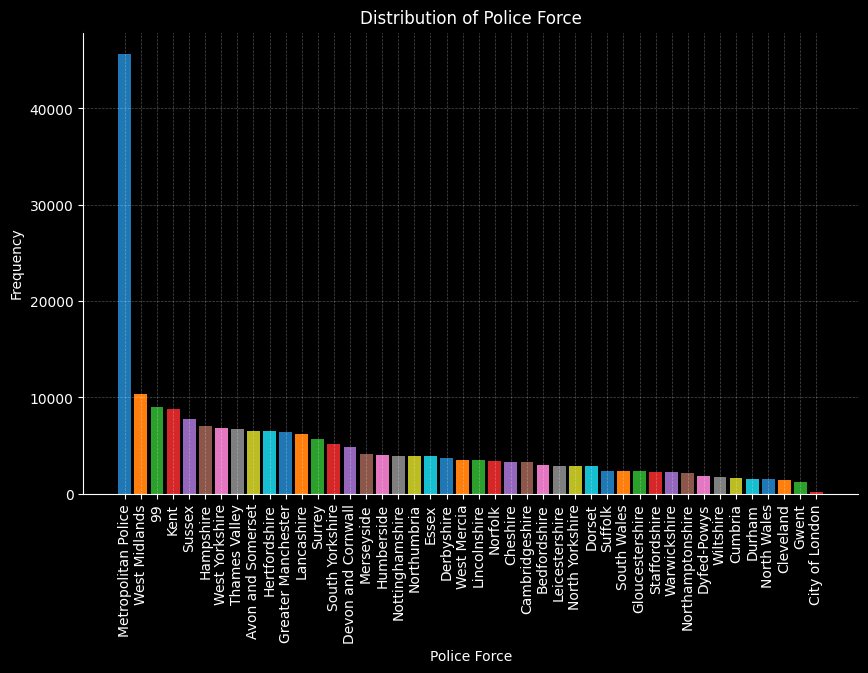

In [ ]:
# function to plot bar chart
def plot_distribution(data, column_name, show_percentages=False):
    # Formatting column name for display
    formatted_column_name = column_name.replace('_', ' ').title()

    # Set the size of the plot and background color
    fig, ax = plt.subplots(figsize=(10, 6))
    background_color = 'black'

    # Plotting the bar chart with repeating colors for bars if needed
    bar_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
    value_counts = data[column_name].value_counts()

    # Ensure that index values are converted to string
    index_as_str = value_counts.index.astype(str)

    bars = ax.bar(index_as_str, value_counts, color=bar_colors * (len(value_counts) // len(bar_colors) + 1))

    # Set background colors
    ax.set_facecolor(background_color)
    fig.patch.set_facecolor(background_color)

    # Adding faint grid lines
    ax.grid(True, which='both', axis='y', linestyle='--', linewidth=0.5, color='white', alpha=0.3)
    ax.grid(True, which='both', axis='x', linestyle='--', linewidth=0.5, color='white', alpha=0.3)

    # Set the colors of the axes, labels, and title to white for visibility
    ax.tick_params(colors='white', which='both')
    ax.spines['bottom'].set_color('white')
    ax.spines['left'].set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.title.set_color('white')

    # Labels and title
    ax.set_xlabel(formatted_column_name, color='white')
    ax.set_ylabel('Frequency', color='white')
    ax.set_title(f'Distribution of {formatted_column_name}', color='white')

    # Optional: Adding percentage labels above each bar if enabled
    if show_percentages:
        total = sum(value_counts)
        for bar in bars:
            height = bar.get_height()
            percentage = f'{(height/total) * 100:.2f}%'
            ax.text(bar.get_x() + bar.get_width() / 2, height, percentage, ha='center', va='bottom', color='white', fontsize=10)

    # Making x-axis labels vertical (rotation 90 degrees)
    ax.set_xticklabels(index_as_str, rotation=90)

    # Show the plot
    plt.show()

# call function
plot_distribution(df, 'police_force')

<h4 style="color: red ">
Result Observation:

We have identified an anomalous input (99) within our dataset, which does not correspond to any defined category in the Road Traffic Accident Statistics Form. Therefore, to ensure data accuracy and consistency, we will replace this code with 'Unknown_Station' to denote the absence of this police station
</h4>


In [ ]:
# Reeplace  99 with Unknown_station for consistency
df['police_force'] = df['police_force'].replace(99, 'Unknown_Station')

df.head(2)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,04/02/2020,3,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,-1,0,-1,9,9,Daylight,Unknown,9,None,None,Urban Area,No – self reporting,2,E01004576,484748,1,Pedestrian,Male,31,6,Slight,"In carriageway, not crossing","In carriageway, stationary - not crossing (sta...",Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,4,681716,1,Car,9,Moving off,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,9,Not known,Female,32,6,1968,2,6,AUDI Q5,4,Unknown
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,27/04/2020,2,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,2,E01003034,484749,1,Pedestrian,Female,2,1,Slight,"In carriageway, crossing on pedestrian crossin...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,2,681717,1,Car,No tow or articulation,Slowing or stopping,North east,South west,On main carriageway - not in restricted lane,Cleared junction or waiting/parked at junction...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Commuting to/from work,Male,45,7,1395,1,2,AUDI A1,7,Unknown


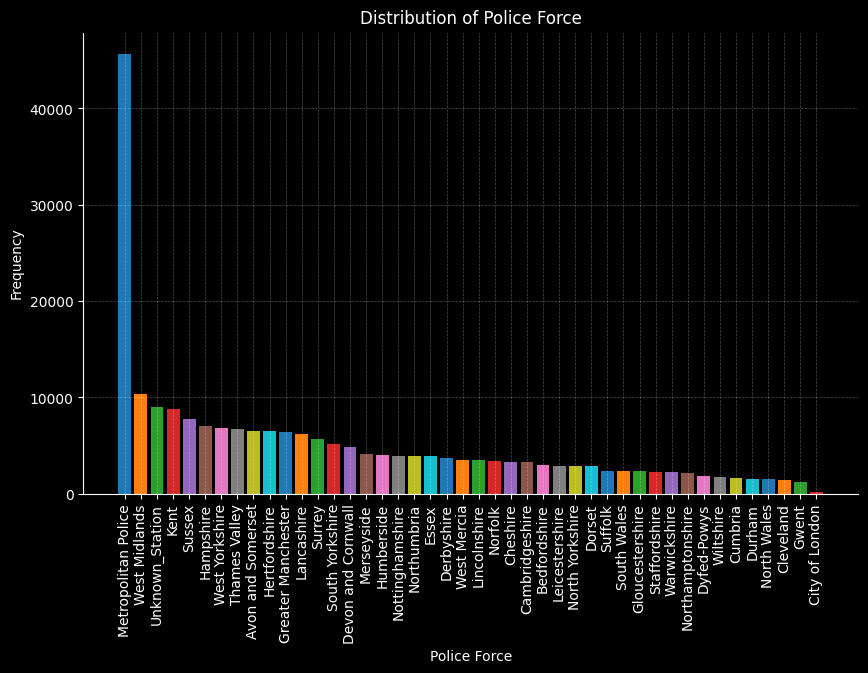

In [ ]:
# let plot again using our function
plot_distribution(df, 'police_force')

<h4 style="color: red ">
Result Observation:

The replacement of '99' with 'Unknown_station', as seen in the bar plot above, has been successfully implemented. Also, the resolution of inconsistencies within the 'police_force' column has been effectively addressed
</h4>

In [ ]:
df.head(2)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,04/02/2020,3,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,-1,0,-1,9,9,Daylight,Unknown,9,None,None,Urban Area,No – self reporting,2,E01004576,484748,1,Pedestrian,Male,31,6,Slight,"In carriageway, not crossing","In carriageway, stationary - not crossing (sta...",Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,4,681716,1,Car,9,Moving off,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,9,Not known,Female,32,6,1968,2,6,AUDI Q5,4,Unknown
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,27/04/2020,2,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,2,E01003034,484749,1,Pedestrian,Female,2,1,Slight,"In carriageway, crossing on pedestrian crossin...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,2,681717,1,Car,No tow or articulation,Slowing or stopping,North east,South west,On main carriageway - not in restricted lane,Cleared junction or waiting/parked at junction...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Commuting to/from work,Male,45,7,1395,1,2,AUDI A1,7,Unknown


<h3 style="color: blue ">
2. Accident Severity Column
</h3>

In [ ]:
# check unique values in the accident severity column
df['accident_severity'].unique()

array(['Slight', 'Serious', 'Fatal'], dtype=object)

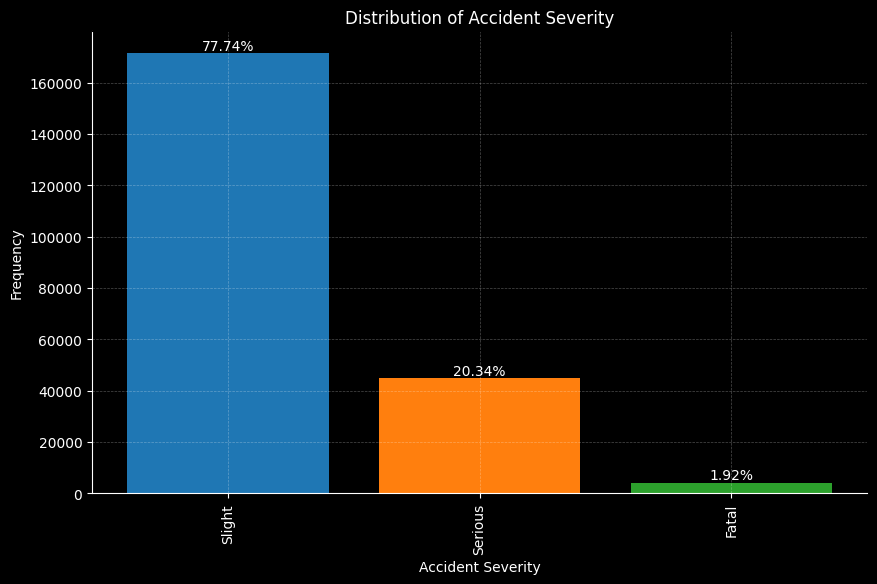

In [ ]:
# plot distribution
plot_distribution(df, 'accident_severity', show_percentages=True)

<h4 style="color: red ">
Result Observation:

No anomalies were detected in the Accident Severity column. It is worth noting that 'Slight' represents the highest severity level, while 'Fatal' is the lowest severity level
</h4>

In [ ]:
df.head(2)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,04/02/2020,3,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,-1,0,-1,9,9,Daylight,Unknown,9,None,None,Urban Area,No – self reporting,2,E01004576,484748,1,Pedestrian,Male,31,6,Slight,"In carriageway, not crossing","In carriageway, stationary - not crossing (sta...",Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,4,681716,1,Car,9,Moving off,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,9,Not known,Female,32,6,1968,2,6,AUDI Q5,4,Unknown
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,27/04/2020,2,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,2,E01003034,484749,1,Pedestrian,Female,2,1,Slight,"In carriageway, crossing on pedestrian crossin...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,2,681717,1,Car,No tow or articulation,Slowing or stopping,North east,South west,On main carriageway - not in restricted lane,Cleared junction or waiting/parked at junction...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Commuting to/from work,Male,45,7,1395,1,2,AUDI A1,7,Unknown


<h3 style="color: blue ">
3. Number of Vehicles Column
</h3>

In [ ]:
# check unique values in the number_of_vehicles column
df['number_of_vehicles'].unique()

array([ 1,  2,  3,  4,  8,  6,  7,  5,  9, 10, 11, 13, 12], dtype=int64)

In [ ]:
# check value counts of the number_of_vehicles column
df['number_of_vehicles'].value_counts()

number_of_vehicles
2     145664
3      30396
1      29255
4       9528
5       2995
6       1398
7        483
8        432
9         90
10        90
11        66
13        26
12        12
Name: count, dtype: int64

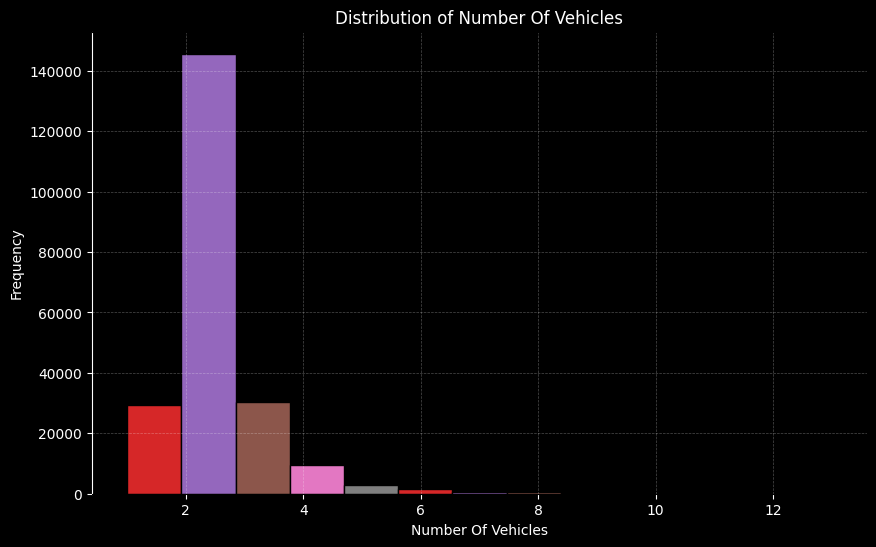

In [ ]:
# create histogram function
def plot_histogram(data, column_name, bins=13, colors=["#d62728", "#9467bd", "#8c564b", "#e377c2", "#7f7f7f"]):
    # Formatting column name for display
    formatted_column_name = column_name.replace('_', ' ').title()

    # Set the size of the plot and background color
    fig, ax = plt.subplots(figsize=(10, 6))
    background_color = 'black'

    # Plotting the histogram
    counts, bins, patches = ax.hist(data[column_name], bins=bins, edgecolor='black')

    # Color the bars based on repeating color pattern
    bin_colors = colors * (len(bins) // len(colors) + 1)
    for patch, color in zip(patches, bin_colors[:len(patches)]):
        patch.set_facecolor(color)

    # Set background colors
    ax.set_facecolor(background_color)
    fig.patch.set_facecolor(background_color)

    # Adding faint grid lines
    ax.grid(True, which='both', axis='y', linestyle='--', linewidth=0.5, color='white', alpha=0.3)
    ax.grid(True, which='both', axis='x', linestyle='--', linewidth=0.5, color='white', alpha=0.3)

    # Set the colors of the axes, labels, and title to white for visibility
    ax.tick_params(colors='white', which='both')
    ax.spines['left'].set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.title.set_color('white')

    # Labels and title
    ax.set_xlabel(formatted_column_name, color='white')
    ax.set_ylabel('Frequency', color='white')
    ax.set_title(f'Distribution of {formatted_column_name}', color='white')

    # Show the plot
    plt.show()

# call function
plot_histogram(df, 'number_of_vehicles')


<h4 style="color: red ">
Result Observation:

No anomalies were detected in the Number of Vehicles column. It is worth noting that '2' represents the highest Number of Vehicles involved in accident, while '12' shows the lowest
</h4>

In [ ]:
df.head(1)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,04/02/2020,3,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,-1,0,-1,9,9,Daylight,Unknown,9,None,None,Urban Area,No – self reporting,2,E01004576,484748,1,Pedestrian,Male,31,6,Slight,"In carriageway, not crossing","In carriageway, stationary - not crossing (sta...",Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,4,681716,1,Car,9,Moving off,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,9,Not known,Female,32,6,1968,2,6,AUDI Q5,4,Unknown


<h3 style="color: blue ">
4. Number of Casualty Column
</h3>

In [ ]:
# check unique values in the number_of_vehicles column
df['number_of_casualties'].unique()

array([ 1,  2,  4,  3,  6,  5,  9, 11,  7,  8, 10, 17, 41, 13, 12, 19],
      dtype=int64)

In [ ]:
# check value counts of the number_of_vehicles column
df['number_of_casualties'].value_counts()

number_of_casualties
1     131463
2      49978
3      21309
4       9712
5       4280
6       1908
7        868
8        352
11       176
9        153
10        90
41        41
19        38
13        26
12        24
17        17
Name: count, dtype: int64

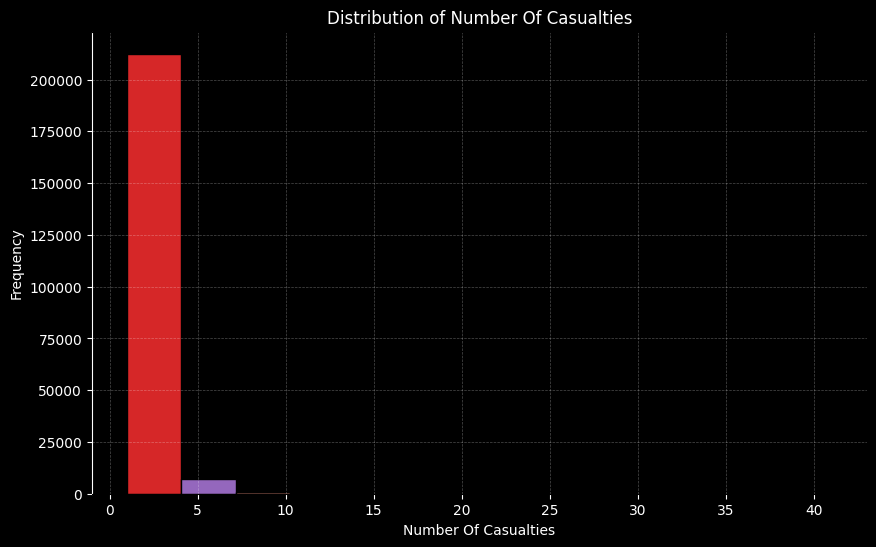

In [ ]:
# plot histogram of the number_of_casualties column

plot_histogram(df, 'number_of_casualties')

<h4 style="color: red ">
Result Observation:

No anomalies were detected in the Number of Casualties column. It is worth noting that '1' represents the highest Number of casualty involved in accident, while '17' shows the lowest
</h4>

In [ ]:
df.head(3)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,04/02/2020,3,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,-1,0,-1,9,9,Daylight,Unknown,9,None,None,Urban Area,No – self reporting,2,E01004576,484748,1,Pedestrian,Male,31,6,Slight,"In carriageway, not crossing","In carriageway, stationary - not crossing (sta...",Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,4,681716,1,Car,9,Moving off,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,9,Not known,Female,32,6,1968,2,6,AUDI Q5,4,Unknown
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,27/04/2020,2,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,2,E01003034,484749,1,Pedestrian,Female,2,1,Slight,"In carriageway, crossing on pedestrian crossin...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,2,681717,1,Car,No tow or articulation,Slowing or stopping,North east,South west,On main carriageway - not in restricted lane,Cleared junction or waiting/parked at junction...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Commuting to/from work,Male,45,7,1395,1,2,AUDI A1,7,Unknown
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,27/04/2020,2,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,2,E01003034,484750,2,Pedestrian,Female,4,1,Slight,"In carriageway, crossing on pedestrian crossin...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,2,681717,1,Car,No tow or articulation,Slowing or stopping,North east,South west,On main carriageway - not in restricted lane,Cleared junction or waiting/parked at junction...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Commuting to/fr

<h3 style="color: blue ">
5. Date Column
</h3>

In [ ]:
# changing the date column to the standard format
df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y')

df.head(1)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,2020-02-04,3,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,-1,0,-1,9,9,Daylight,Unknown,9,None,None,Urban Area,No – self reporting,2,E01004576,484748,1,Pedestrian,Male,31,6,Slight,"In carriageway, not crossing","In carriageway, stationary - not crossing (sta...",Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,4,681716,1,Car,9,Moving off,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,9,Not known,Female,32,6,1968,2,6,AUDI Q5,4,Unknown


<h3 style="color: blue ">
6. Day of Week Column
</h3>

In [ ]:
# check unique values in the number_of_vehicles column
df['day_of_week'].unique()

array([3, 2, 4, 5, 6, 7, 1], dtype=int64)

In [ ]:
# Convert numerical day of the week to day name
df['day_of_week'] = df['date'].dt.day_name()

In [ ]:
# check value counts of the number_of_vehicles column
df['day_of_week'].value_counts()

day_of_week
Friday       35938
Thursday     33447
Wednesday    32692
Tuesday      31491
Monday       30677
Saturday     30530
Sunday       25660
Name: count, dtype: int64

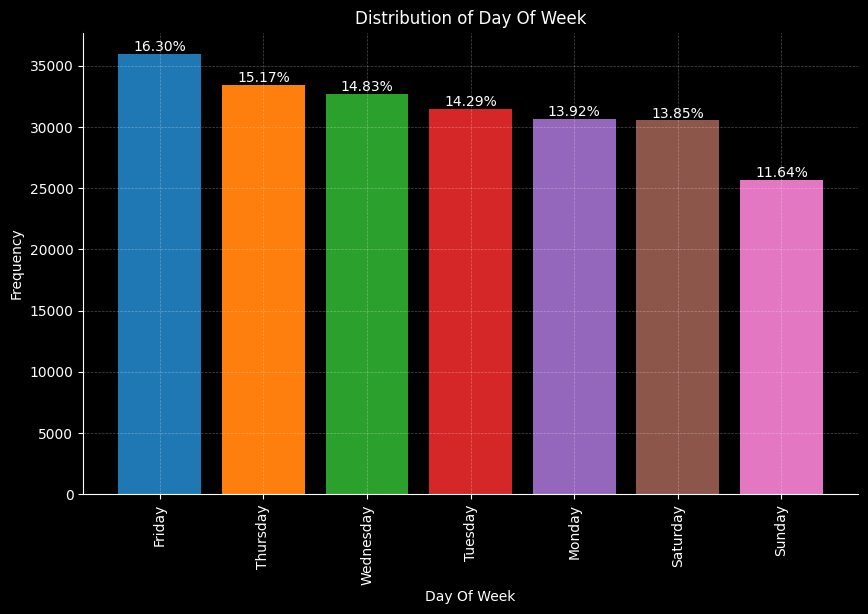

In [ ]:
# Plot the distribution of the categorical column
plot_distribution(df, 'day_of_week', show_percentages=True)

<h4 style="color: red ">
Result Observation:

No anomalies were detected in the Day of week column. It is worth noting that 'Friday' represents the highest day of  accident, while 'Sunday' shows the lowest
</h4>

<h3 style="color: blue ">
7. Time Column
</h3>

In [ ]:
# check unique values in the number_of_vehicles column
df['time'].unique()

array(['09:00', '13:55', '01:25', ..., '04:51', '05:11', '04:42'],
      dtype=object)

In [ ]:
# Convert 'time' column to string type to handle potential mixed types
# df['time'] = df['time'].astype(str)

# Check for inconsistencies in formatting
inconsistent_formats = df[~df['time'].str.match(r'\b\d{2}:\d{2}\b')]

# Print the rows with inconsistent formats
if not inconsistent_formats.empty:
    print("Rows with inconsistent time formats:")
    print(inconsistent_formats)
else:
    print("No inconsistencies found in time formatting.")

No inconsistencies found in time formatting.


In [ ]:
# check unique values in the time column
df['time'].value_counts()

time
17:00    1974
15:00    1758
16:00    1752
17:30    1734
18:00    1678
         ... 
04:31       2
03:46       2
04:39       1
04:33       1
04:58       1
Name: count, Length: 1438, dtype: int64

<h4 style="color: red ">
Result Observation:

No inconsistencies found in time formatting in the time column. It is worth noting that '17:00' represents the most time   accident occured, while '04:58' shows the lowest
</h4>

<h3 style="color: blue ">
8. Local Authority District Column
</h3>

this column proved problematic because we can convert the code vlaues to their respective value, as it couldnt be found in the Road Traffic Accident Statistics Form

In [ ]:
# check unique values in the number_of_vehicles column
df['local_authority_district'].unique()

array([ 10,   9,   1,  17,   7,   6,   5,  31,  32,  19,  15,  21,   3,
        28,  20,  12,  30,  14,  16,  23,   4,   8,  22,  26,   2,  25,
        11,  27,  13,  18,  24,  29,  57,  -1,  63,  64,  62,  65,  60,
        61,  71,  82,  85,  79,  77,  74,  76,  70,  75,  72,  84,  83,
        73,  80,  91,  95,  90,  93,  92, 102, 107, 110, 109, 100, 114,
       112, 101, 106, 104, 128, 130, 129, 124, 147, 150, 139, 148, 146,
       149, 169, 161, 180, 186, 185, 189, 182, 187, 181, 184, 204, 203,
       206, 200, 202, 211, 210, 215, 213, 228, 232, 233, 231, 240, 241,
       243, 245, 306, 305, 300, 309, 307, 303, 302, 253, 252, 255, 251,
       257, 256, 250, 254, 258, 270, 274, 286, 278, 273, 284, 285, 276,
       277, 291, 290, 293, 294, 292, 321, 320, 325, 324, 328, 329, 323,
       327, 322, 340, 344, 343, 345, 341, 346, 342, 347, 354, 350, 352,
       351, 355, 356, 353, 362, 364, 363, 367, 368, 360, 366, 365, 361,
       380, 382, 383, 381, 385, 384, 386, 390, 392, 395, 394, 39

In [ ]:
# count the number of -1 in the local_authority_district column
count = (df['local_authority_district'] == -1).sum()
print("Count of -1:", count)

Count of -1: 2345


In [ ]:
# df['local_authority_district'] = df['local_authority_district'].replace(-1, -9999)

In [ ]:
# check unique values in the number_of_vehicles column
df['local_authority_district'].unique()

array([ 10,   9,   1,  17,   7,   6,   5,  31,  32,  19,  15,  21,   3,
        28,  20,  12,  30,  14,  16,  23,   4,   8,  22,  26,   2,  25,
        11,  27,  13,  18,  24,  29,  57,  -1,  63,  64,  62,  65,  60,
        61,  71,  82,  85,  79,  77,  74,  76,  70,  75,  72,  84,  83,
        73,  80,  91,  95,  90,  93,  92, 102, 107, 110, 109, 100, 114,
       112, 101, 106, 104, 128, 130, 129, 124, 147, 150, 139, 148, 146,
       149, 169, 161, 180, 186, 185, 189, 182, 187, 181, 184, 204, 203,
       206, 200, 202, 211, 210, 215, 213, 228, 232, 233, 231, 240, 241,
       243, 245, 306, 305, 300, 309, 307, 303, 302, 253, 252, 255, 251,
       257, 256, 250, 254, 258, 270, 274, 286, 278, 273, 284, 285, 276,
       277, 291, 290, 293, 294, 292, 321, 320, 325, 324, 328, 329, 323,
       327, 322, 340, 344, 343, 345, 341, 346, 342, 347, 354, 350, 352,
       351, 355, 356, 353, 362, 364, 363, 367, 368, 360, 366, 365, 361,
       380, 382, 383, 381, 385, 384, 386, 390, 392, 395, 394, 39

<h3 style="color: blue ">
9. Local Authority Ons District Column
</h3>

In [ ]:
# check unique values in the number_of_vehicles column
df['local_authority_ons_district'].unique()

array(['Wandsworth', 'Lambeth', 'Westminster', 'Newham', 'Lewisham',
       'Greenwich', 'Tower Hamlets', 'Haringey', 'Enfield', 'Bromley',
       'Havering', 'Sutton', 'Islington', 'Brent', 'Croydon',
       'Kensington and Chelsea', 'Barnet', 'Redbridge',
       'Barking and Dagenham', 'Kingston upon Thames', 'Hackney',
       'Southwark', 'Merton', 'Hillingdon', 'Hounslow',
       'Hammersmith and Fulham', 'Ealing', 'Waltham Forest', 'Bexley',
       'Richmond upon Thames', 'Camden', 'Harrow',
       'London Airport (Heathrow)', 'Copeland', 'Eden', 'Carlisle',
       'South Lakeland', 'Allerdale', 'Barrow-in-Furness', 'Blackpool',
       'Rossendale', 'Wyre', 'Preston', 'Pendle', 'Fylde', 'Lancaster',
       'Blackburn with Darwen', 'Hyndburn', 'Burnley', 'West Lancashire',
       'South Ribble', 'Chorley', 'Ribble Valley', 'St. Helens', 'Wirral',
       'Knowsley', 'Liverpool', 'Sefton', 'Stockport', 'Wigan', 'Bolton',
       'Rochdale', 'Manchester', 'Salford', 'Tameside', 'Traffo

In [ ]:
# check the district that does not have their code meaning meaning
filtered_district = df[df['local_authority_ons_district'].str.startswith('E0')]['local_authority_ons_district'].unique()
filtered_district

array(['E08000021', 'E06000018', 'E07000244', 'E07000245', 'E07000243',
       'E07000242', 'E07000240', 'E07000241'], dtype=object)

In [ ]:
# replace the district that does not have their code meaning meaning with 'Unknown District'
mask = df['local_authority_ons_district'].str.startswith('E0')
df.loc[mask, 'local_authority_ons_district'] = 'Unknown District'

In [ ]:
# check again the district that does not have their code meaning meaning
filtered_district = df[df['local_authority_ons_district'].str.startswith('E0')]['local_authority_ons_district'].unique()
filtered_district

array([], dtype=object)

<h4 style="color: red ">
Result Observation:

We have successfully resolved inconsistencies in the 'Local Authority ONS District' column by replacing all undefined codes, which lack corresponding meanings in the Road Traffic Accident Statistics Form, with the label 'Unknown District'
</h4>

<h3 style="color: blue ">
10. Local Authority Highway Column
</h3>

In [ ]:
# check unique values in the number_of_vehicles column
df['local_authority_highway'].unique()

array(['Wandsworth', 'Lambeth', 'Westminster', 'Newham', 'Lewisham',
       'Greenwich', 'Tower Hamlets', 'Haringey', 'Enfield', 'Bromley',
       'Havering', 'Sutton', 'Islington', 'Brent', 'Croydon',
       'Kensington and Chelsea', 'Barnet', 'Redbridge',
       'Barking and Dagenham', 'Kingston upon Thames', 'Hackney',
       'Southwark', 'Merton', 'Hillingdon', 'Hounslow',
       'Hammersmith and Fulham', 'Ealing', 'Waltham Forest', 'Bexley',
       'Richmond upon Thames', 'Camden', 'Harrow',
       'London Airport (Heathrow)', 'E10000006', 'Blackpool', 'E10000017',
       'Blackburn with Darwen', 'St. Helens', 'Wirral', 'Knowsley',
       'Liverpool', 'Sefton', 'Stockport', 'Wigan', 'Bolton', 'Rochdale',
       'Manchester', 'Salford', 'Tameside', 'Trafford', 'Bury', 'Oldham',
       'Warrington', 'Halton', 'Cheshire West and Chester',
       'Cheshire East', 'E08000021', 'Sunderland', 'Northumberland',
       'Newcastle upon Tyne', 'Gateshead', 'South Tyneside',
       'County Du

In [ ]:
# check the highway that does not have their code meaning meaning
filtered_highway = df[df['local_authority_highway'].str.startswith(('E1','E0'))]['local_authority_highway'].unique()
filtered_highway

array(['E10000006', 'E10000017', 'E08000021', 'E10000023', 'E10000028',
       'E10000034', 'E10000031', 'E10000007', 'E10000024', 'E06000018',
       'E10000019', 'E10000018', 'E10000021', 'E10000003', 'E10000020',
       'E10000029', 'E10000015', 'E10000012', 'E10000025', 'E10000002',
       'E10000014', 'E10000030', 'E10000016', 'E10000032', 'E10000011',
       'E10000008', 'E10000027', 'E10000013', 'E10000009'], dtype=object)

In [ ]:
# replace the district that does not have their code meaning meaning with 'Unknown District'
mask = df['local_authority_highway'].str.startswith(('E1','E0'))
df.loc[mask, 'local_authority_highway'] = 'Unknown Highway'

In [ ]:
# check again the highway that does not have their code meaning meaning
filtered_highway = df[df['local_authority_highway'].str.startswith(('E1','E0'))]['local_authority_highway'].unique()
filtered_highway

array([], dtype=object)

<h4 style="color: red ">
Result Observation:

We have successfully resolved inconsistencies in the 'Local Authority Highway' column by replacing all undefined codes, which lack corresponding meanings in the Road Traffic Accident Statistics Form, with the label 'Unknown Highway'
</h4>

<h3 style="color: blue ">
11. First Road Class
</h3>

In [ ]:
# check unique values in the first_road_class column
df['first_road_class'].unique()

array(['Unclassified', 'A', 'C', 'B', 'Motorway', 'A(M)'], dtype=object)

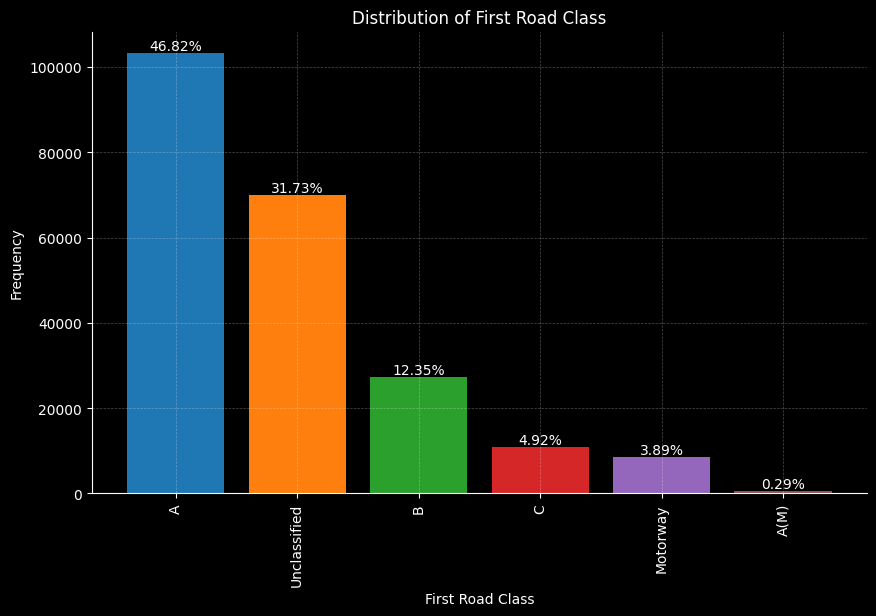

In [ ]:
# plot distribution of first_road_class
plot_distribution(df, 'first_road_class', show_percentages=True)

<h4 style="color: red ">
Result Observation:

No inconsistencies found in time First Road Class column. It is worth noting that 'A' class represents the highest, while 'A(M)' class shows the lowest
</h4>

<h3 style="color: blue ">
12. First Road Number Column
</h3>

In [ ]:
# check unique values in the first_road_class column
df['first_road_number'].unique()

array([   0, 3036,   11, ..., 7003, 6404, 9057], dtype=int64)

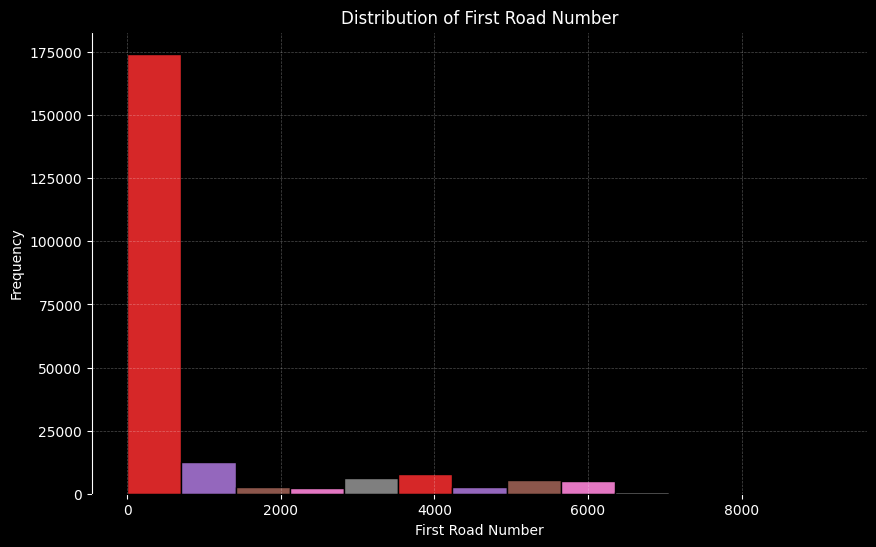

In [ ]:
# plot histogram of the first_road_number column

plot_histogram(df,'first_road_number' )

In [ ]:
# count the number of 0 in the First Road Number column
count_zero = (df['first_road_number'] == 0).sum()
print("Count of Zero(0):", count_zero)

Count of Zero(0): 80794


In [ ]:
# Define the valid road classes
valid_road_classes = ['Motorway', 'A(M)', 'A', 'B']

# Filter rows where 'first_road_class' is one of the valid road classes
filtered_road = df[df['first_road_class'].isin(valid_road_classes)]

# Check if 'first_road_number' contains a valid road number
invalid_road_numbers = filtered_road[filtered_road['first_road_number'].isna()]['first_road_number']

# If invalid_road_numbers is not empty, it means there are rows where first_road_number is NaN
if not invalid_road_numbers.empty:
    print("There are rows where 'first_road_class' is valid but 'first_road_number' is missing or invalid:")
    print(invalid_road_numbers)
else:
    print("All rows where 'first_road_class' is valid also have a valid 'first_road_number'.")

All rows where 'first_road_class' is valid also have a valid 'first_road_number'.


<h3 style="color: blue ">
13. Road Type Column
</h3>

In [ ]:
# check unique values in the first_road_class column
df['road_type'].unique()

array(['Single carriageway', 'One way street', 'Dual carriageway',
       'Slip Road', 'Roundabout', 'Unknow'], dtype=object)

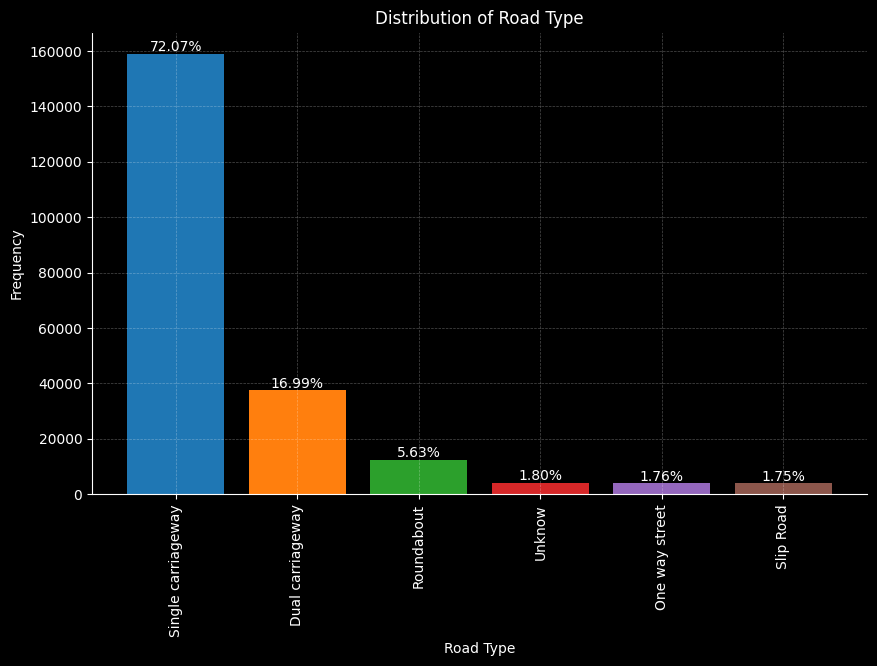

In [ ]:
# Plot the distribution of the road_type categorical column

plot_distribution(df, 'road_type', show_percentages=True)

<h4 style="color: red ">
Result Observation:

No inconsistencies found in the Road Type column. It is worth noting that 'Single carriageway' class represents the highest, while 'Slip Road' class shows the lowest
</h4>

<h3 style="color: blue ">
14. Speed Limit Column
</h3>

In [ ]:
# check unique values in the speed_limit column
df['speed_limit'].unique()

array([20, 30, 40, 50, 60, 70, -1], dtype=int64)

In [ ]:
# check unique values in the speed_limit column
df['speed_limit'].value_counts()

speed_limit
 30    119608
 60     30390
 20     22675
 40     21168
 70     15290
 50     11290
-1         14
Name: count, dtype: int64

In [ ]:
# import math to help round up mean
import math

# Calculate the mean of the speed_limit column, excluding -1 values
mean_speed_limit = df.loc[df['speed_limit'] != -1, 'speed_limit'].mean()

# Round the mean up to the nearest ten
mean_speed_limit = math.ceil(mean_speed_limit / 10.0) * 10

# Replace -1 values with the calculated mean
df['speed_limit'] = df['speed_limit'].replace(-1, mean_speed_limit)

# Check unique values again in the speed_limit column
df['speed_limit'].unique()

array([20, 30, 40, 50, 60, 70], dtype=int64)

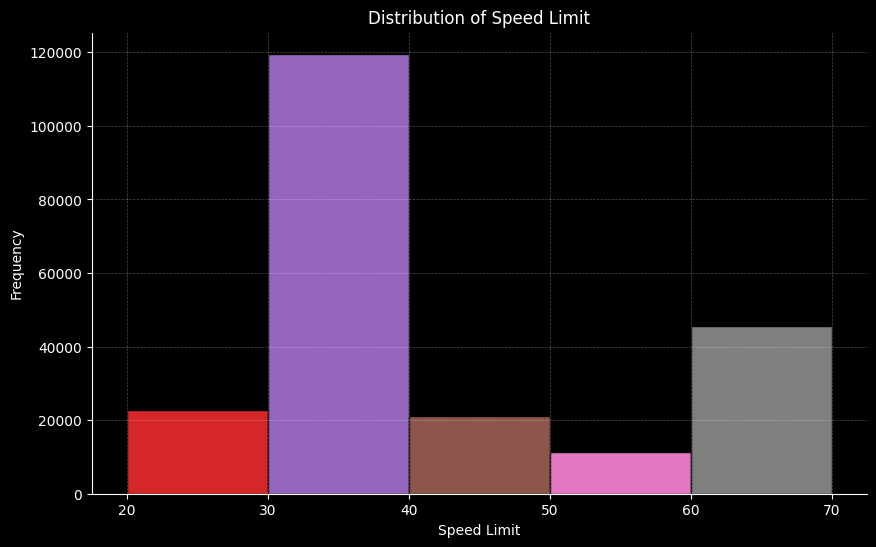

In [ ]:
# plot of hitogram for columns containing
def plot_histogram2(data, column_name, bins=13, colors=["#d62728", "#9467bd", "#8c564b", "#e377c2", "#7f7f7f"]):
    # Formatting column name for display
    formatted_column_name = column_name.replace('_', ' ').title()

    # Set the size of the plot and background color
    fig, ax = plt.subplots(figsize=(10, 6))
    background_color = 'black'

    # Plotting the histogram
    counts, bins, patches = ax.hist([x for x in data[column_name] if x != -9999], bins=5, edgecolor='black')

    # Color the bars based on repeating color pattern
    bin_colors = colors * (len(bins) // len(colors) + 1)
    for patch, color in zip(patches, bin_colors[:len(patches)]):
        patch.set_facecolor(color)

    # Set background colors
    ax.set_facecolor(background_color)
    fig.patch.set_facecolor(background_color)

    # Adding faint grid lines
    ax.grid(True, which='both', axis='y', linestyle='--', linewidth=0.5, color='white', alpha=0.3)
    ax.grid(True, which='both', axis='x', linestyle='--', linewidth=0.5, color='white', alpha=0.3)

    # Set the colors of the axes, labels, and title to white for visibility
    ax.tick_params(colors='white', which='both')
    ax.spines['bottom'].set_color('white')
    ax.spines['left'].set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.title.set_color('white')

    # Labels and title
    ax.set_xlabel(formatted_column_name, color='white')
    ax.set_ylabel('Frequency', color='white')
    ax.set_title(f'Distribution of {formatted_column_name}', color='white')

    # Show the plot
    plt.show()

# call function
plot_histogram2(df, 'speed_limit')

<h4 style="color: red ">
Result Observation:

We have effectively addressed the inconsistency identified in the 'speed_limit' column by substituting '-1' with mean 40 (37.9, round up to 40), as '-1' is an implausible speed limit value. Our distribution plot reveals that the most frequent speed limits fall within the range of 30-40, closely followed by 60-70, with the least occurrence observed between 50-60
</h4>

<h3 style="color: blue ">
15. Junction Detail Column
</h3>

In [ ]:
# check unique values in the speed_limit column
df['junction_detail'].value_counts()

junction_detail
Not at or within 20 metres of junction    92981
T or staggered junction                   60925
Crossroads                                22483
Roundabout                                16634
Other junction                            10762
Using private drive or entrance            4553
Slip road                                  3080
Junction more than four arms (not RAB)     3078
99                                         3017
Mini roundabout                            2918
-1                                            4
Name: count, dtype: int64

In [ ]:
# Replace -1 with Unkown junction detail
df['junction_detail'] = df['junction_detail'].replace(-1, 'Unknown junction detail')

# Replace 99 with Unkown junction detail
df['junction_detail'] = df['junction_detail'].replace(99, 'Unknown junction detail')

In [ ]:
# check unique values in the speed_limit column
df['junction_detail'].value_counts()

junction_detail
Not at or within 20 metres of junction    92981
T or staggered junction                   60925
Crossroads                                22483
Roundabout                                16634
Other junction                            10762
Using private drive or entrance            4553
Slip road                                  3080
Junction more than four arms (not RAB)     3078
Unknown junction detail                    3021
Mini roundabout                            2918
Name: count, dtype: int64

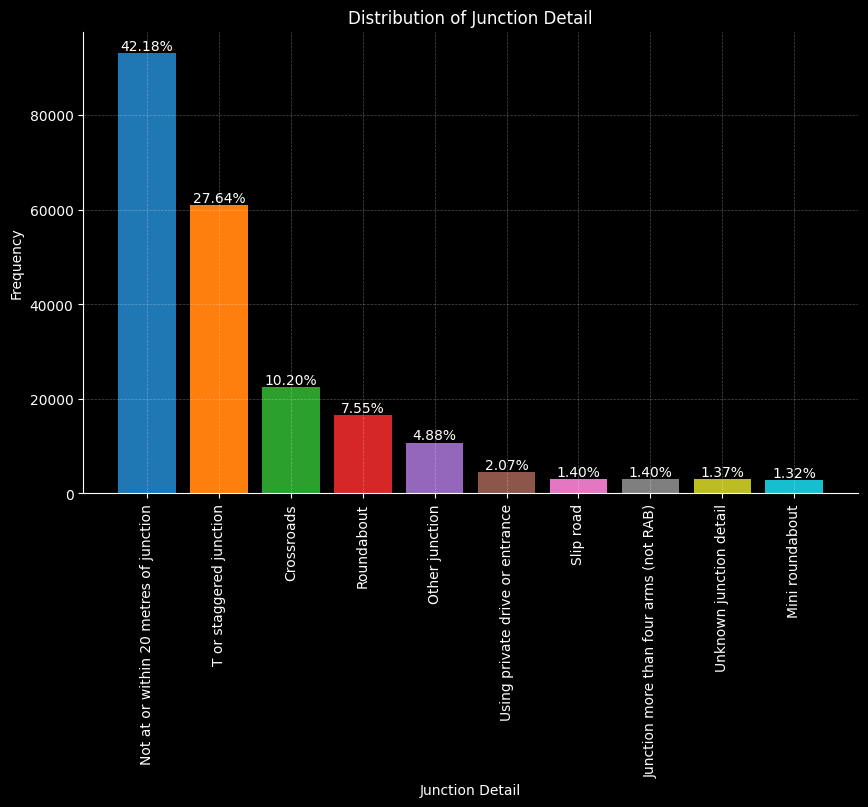

In [ ]:
# Plot the distribution

plot_distribution(df, 'junction_detail' , show_percentages=True)

<h3 style="color: blue ">
16. Junction Control Column
</h3>

In [ ]:
# check unique values in the junction_control column
df['junction_control'].value_counts()

junction_control
Give way or uncontrolled    95846
-1                          93721
Automatic traffic signal    25545
9                            3000
Stop sign                    1462
Authorised person             861
Name: count, dtype: int64

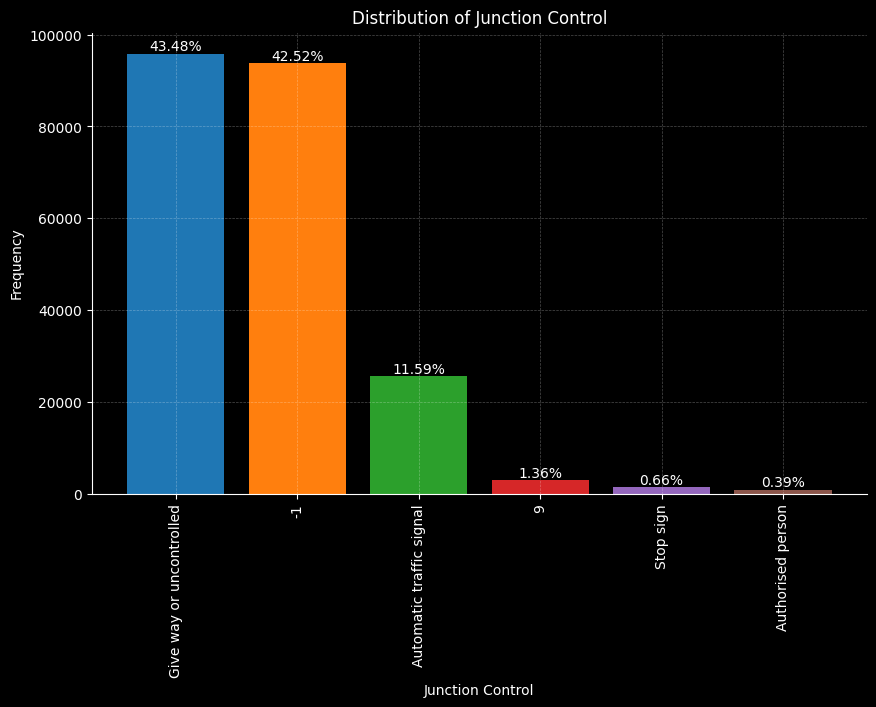

In [ ]:
# Plot the distribution
plot_distribution(df, 'junction_control', show_percentages=True)

<h4 style="color: red ">
Result Observation:
    
Based on our analysis, we have identified a total of 93,721 instances where the value is -1. However, according to the Road Traffic Accident Statistics Form, our valid code values range from 1 to 4. Upon closer examination, we noted that code value 1 corresponds to 'Authorised person' (defined as a police officer, traffic warden in uniform, or school crossing patrol controlling traffic) in the form. Given the significant occurrence of -1 (93,721 instances) and our observations, we have determined that -1 was erroneously entered instead of 1 (Authorised person). Therefore, we will replace instances of -1 with 'Authorised person', corresponding to code 1 from the Road Traffic Accident Statistics Form.

Furthermore, as there is no code value of 9 designated in the Road Traffic Accident Statistics Form for the junction control column, we will substitute instances of 9 with 'Unknown junction control'.
</h4>

In [ ]:
# Replace -1 with Unkown junction control
df['junction_control'] = df['junction_control'].replace(-1, 'Authorised person')

# Replace 99 with Unkown junction control
df['junction_control'] = df['junction_control'].replace(9, 'Unknown junction control')

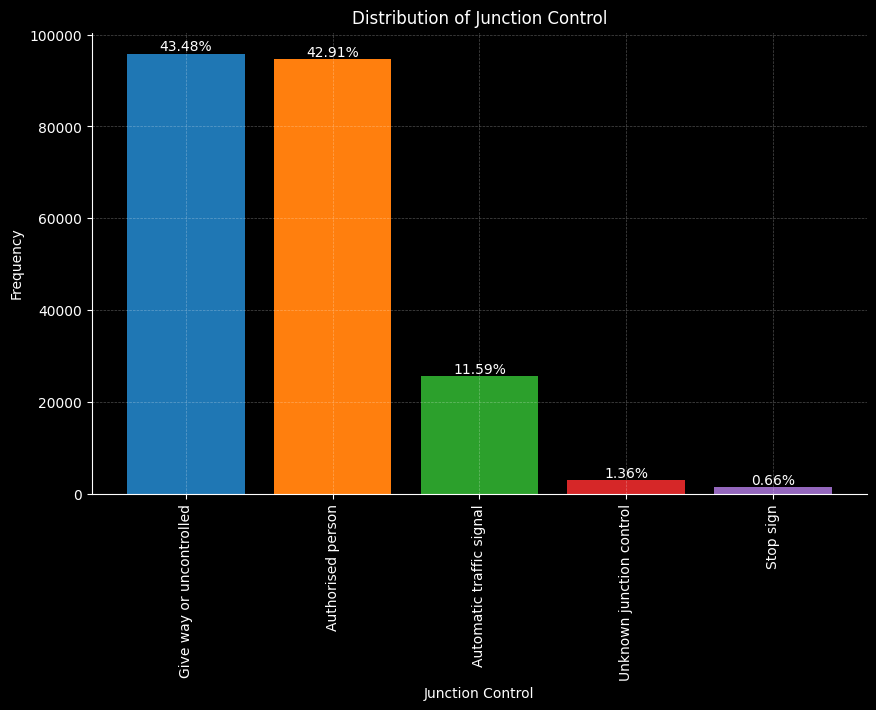

In [ ]:
# Plot the distribution again since we have replace erroneous values
plot_distribution(df, 'junction_control', show_percentages=True)

<h4 style="color: red ">
    Result Observation:
    
We have now successfully addressed all erroneous inputs in the 'junction_control' column</h4>

<h3 style="color: blue ">
17. Second Road Class Column
</h3>

In [ ]:
# check unique values in the speed_limit column
df['second_road_class'].value_counts()

second_road_class
0               92826
Unclassified    87283
A               22552
B                8955
C                7500
Motorway          938
-1                281
A(M)              100
Name: count, dtype: int64

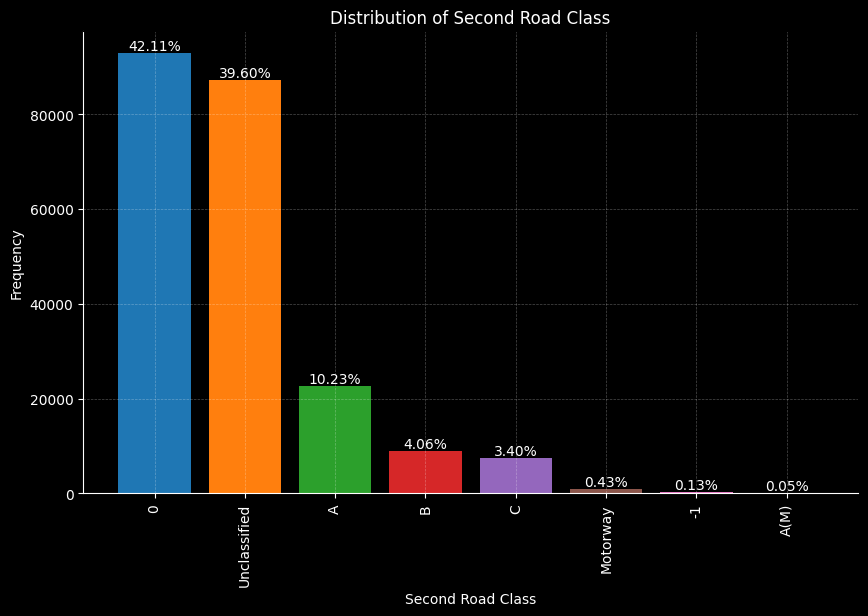

In [ ]:
# Plot the distribution
plot_distribution(df, 'second_road_class', show_percentages=True)

<h4 style="color: red ">
    Result Observation:
    
It has been observed from our results above that the highest frequency (92,826 occurrences) in the second_road_class column is represented by the code value 0. However, according to the Road Traffic Accident Statistics Form, there is no code value of 0 designated for the second_road_class. Similarly, there are 281 instances where the value is -1, which also does not align with any valid code in the form. Consequently, we will be replacing these erroneously inputted code values with 'Unknown second road class'.
</h4>

In [ ]:
# Replace -1 with Unkown second_road_class
df['second_road_class'] = df['second_road_class'].replace(0, 'Unknown second road class')

# Replace 99 with Unkown junction control
df['second_road_class'] = df['second_road_class'].replace(-1, 'Unknown second road class')

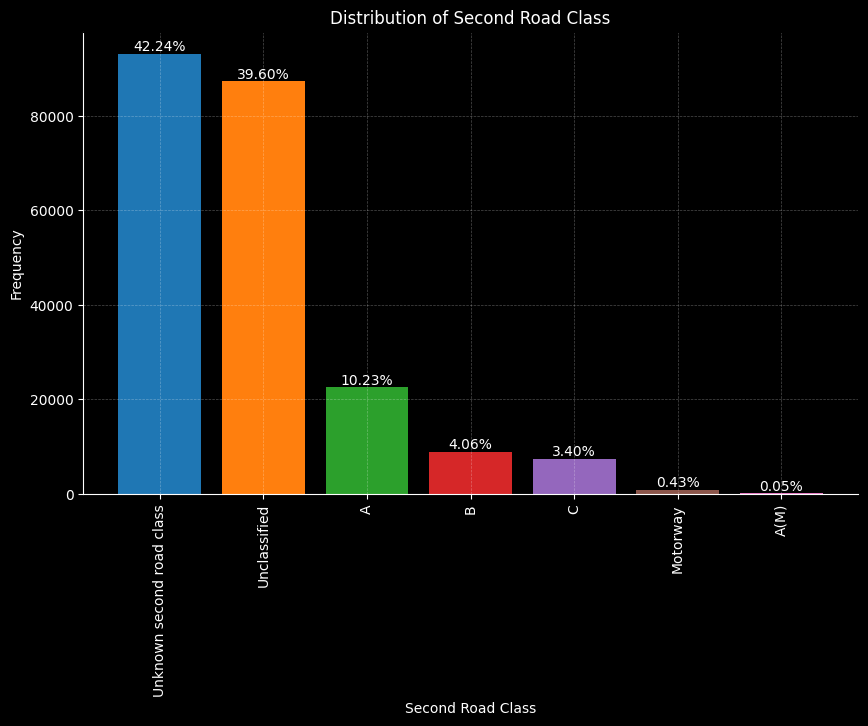

In [ ]:
# Plot the distribution again
plot_distribution(df, 'second_road_class', show_percentages=True)

<h4 style="color: red ">
    Result Observation:
    
We have now successfully addressed all erroneous inputs in the 'Second Road Class' column</h4>

<h3 style="color: blue ">
18. Second Road Number Column
</h3>

In [ ]:
# check unique values in the speed_limit column
df['second_road_number'].value_counts()

second_road_number
 0       94783
-1       93118
 1         406
 406       369
 4         319
         ...  
 2248        1
 1021        1
 3126        1
 836         1
 2114        1
Name: count, Length: 2274, dtype: int64

In [ ]:
# Replace -1 with -9999 to indicate these values are missing
df['second_road_number'] = df['second_road_number'].replace(-1, -9999)

# check unique values againin the second_road_number column
df['second_road_number'].unique()

array([-9999,     0,   406, ...,   999,    87,  7019], dtype=int64)

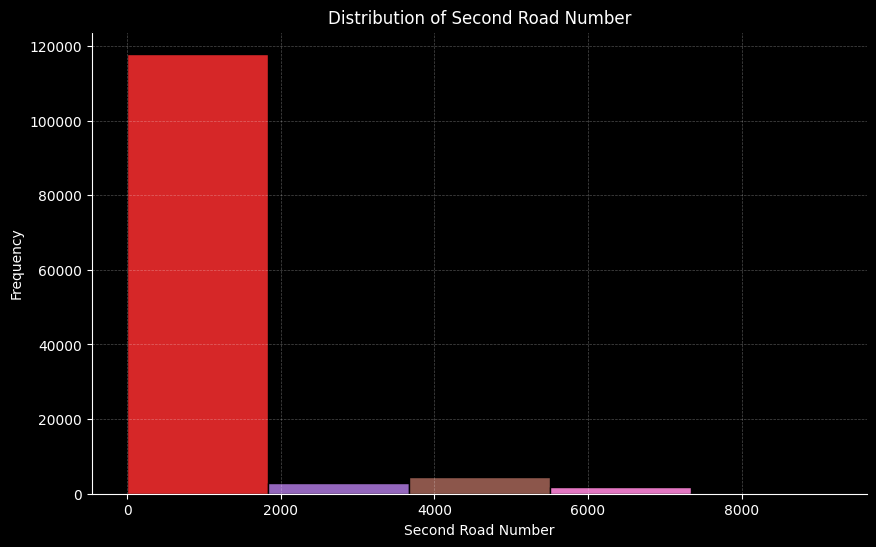

In [ ]:
# plot histogram of the Number of second_road_number column
plot_histogram2(df,'second_road_number')

<h4 style="color: red ">
Result Observation:

We have effectively addressed the inconsistency identified in the 'Second Road Number' column by substituting '-1' with -9999 to signify it as an outlier, as '-1' is an implausible Second Road Number value.
</h4>

<h3 style="color: blue ">
19.   Pedestrian crossing Human Control Column
</h3>

In [ ]:
# check unique values in the pedestrian_crossing_human_control column
df['pedestrian_crossing_human_control'].value_counts()

pedestrian_crossing_human_control
None within 50 metres                 210531
9                                       6781
Control by other authorised person      2022
Control by school crossing patrol        780
-1                                       321
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation:
    
Given that the pedestrian_crossing_human_control column comprises only three coded values (0, 1, 2), it can be seen from our result that there are additional coded values present (-1, 9). As these additional values are not specified in the stat form, we will proceed to replace them with 'Unknown'.
</h4>



In [ ]:
# Replace -1 with Unknown pedestrian_crossing_human_control
df['pedestrian_crossing_human_control'] = df['pedestrian_crossing_human_control'].replace(9, 'Unknown')

# Replace 99 with Unknown
df['pedestrian_crossing_human_control'] = df['pedestrian_crossing_human_control'].replace(-1, 'Unknown')

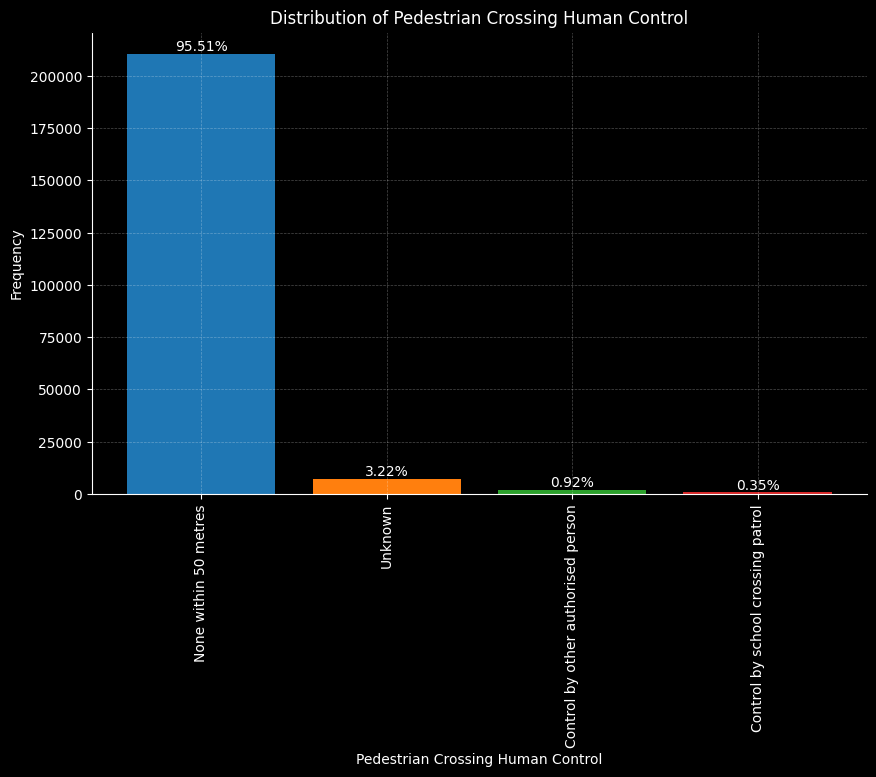

In [ ]:
# Plot the distribution
plot_distribution(df, 'pedestrian_crossing_human_control', show_percentages=True)

<h4 style="color: red ">
Result Observation:

We have effectively addressed the inconsistency identified in the 'Pedestrian Crossing Human Control' column

<h3 style="color: blue ">
20. Pedestrian Crossing Physical Facilities Column
</h3>

In [ ]:
# check unique values in the pedestrian_crossing_physical_facilities column
df['pedestrian_crossing_physical_facilities'].value_counts()

pedestrian_crossing_physical_facilities
No physical crossing facility within 50 metres                               172508
Pedestrian phase at traffic signal junction                                   17555
Pelican, puffin, toucan or similar non-junction pedestrian light crossing     10607
Zebra crossing                                                                 7702
9                                                                              5945
Central refuge - no other controls                                             5329
Footbridge or subway                                                            475
-1                                                                              314
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation:
    
Given that the pedestrian_crossing_physical_facilities column comprises only SIX coded values (0, 1, 4, 5, 7, 8), it can be seen from our result that there are additional coded values present (-1, 9). As these additional values are not specified in the stat form, we will proceed to replace them with 'Unknown'.
</h4>


In [ ]:
# Replace -1 with Unknown pedestrian_crossing_physical_facilities
df['pedestrian_crossing_physical_facilities'] = df['pedestrian_crossing_physical_facilities'].replace(9, 'Unknown')

# Replace 99 with Unknown
df['pedestrian_crossing_physical_facilities'] = df['pedestrian_crossing_physical_facilities'].replace(-1, 'Unknown')

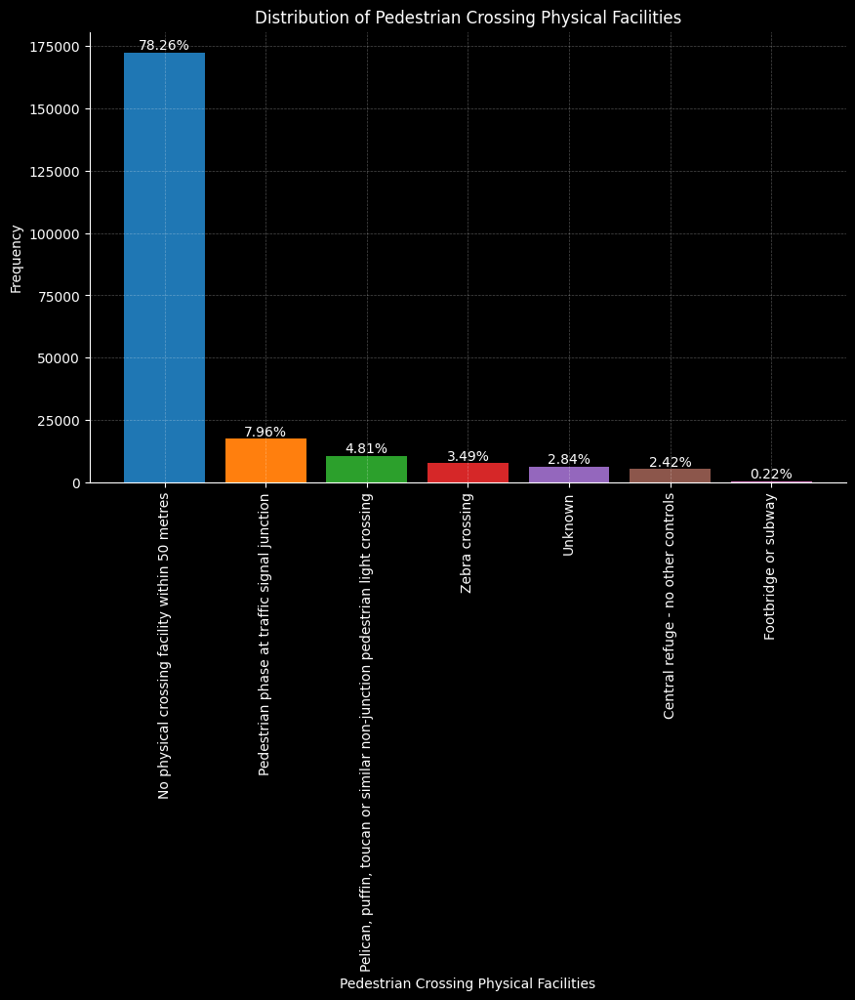

In [ ]:
# Plot the distribution

plot_distribution(df, 'pedestrian_crossing_physical_facilities', show_percentages=True)

<h4 style="color: red ">
Result Observation:

We have effectively addressed the inconsistency identified in the 'Pedestrian Crossing Physical Facilities' column
    </h4>

<h3 style="color: blue ">
21. Light Conditions Column
</h3>

In [ ]:
# check unique values in the light_conditions column
df['light_conditions'].value_counts()

light_conditions
Daylight                                     156641
Darkness: street lights present and lit       45609
Darkness: no street lighting                  12020
Darkness: street lighting unknown              4635
Darkness: street lights present but unlit      1529
-1                                                1
Name: count, dtype: int64

In [ ]:
# check and inspect the problematic row
df[df['light_conditions'] == -1]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
193170,2020520002488,2020,520002488,343681.0,154706.0,-2.809007,51.288686,Devon and Cornwall,Fatal,1,1,2020-06-24,Wednesday,01:15,-1,Sedgemoor,Unknown Highway,A,371,Single carriageway,60,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,Unknown,Unknown,-1,-1,-1,-1,-1,Rural Area,-1,2,E01029085,585645,1,Driver or rider,Male,24,5,Fatal,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,9,Non-UK resident,7,828736,1,Car,No tow or articulation,Going ahead other,West,East,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Left carriageway nearside,Tree,Front,No,Not known,Male,24,5,-1,-1,-1,-1,7,Non-UK resident


<h4 style="color: red ">
Result Observation:

Upon investigation, it can be observed that the erroneous data entry occurred at 01:15 hours and pertains to a fatal accident. Therefore, we have decided to rectify this inconsistency by updating the corresponding entry in the light condition column to reflect 'Darkness: no street lighting'

</h4 >

In [ ]:
# Replace -1 with 'Darkness: no street lighting' to indicate these values are missing
df['light_conditions'] = df['light_conditions'].replace(-1, 'Darkness: no street lighting')

In [ ]:
# check unique values in the light_conditions column again
df['light_conditions'].value_counts()

light_conditions
Daylight                                     156641
Darkness: street lights present and lit       45609
Darkness: no street lighting                  12021
Darkness: street lighting unknown              4635
Darkness: street lights present but unlit      1529
Name: count, dtype: int64

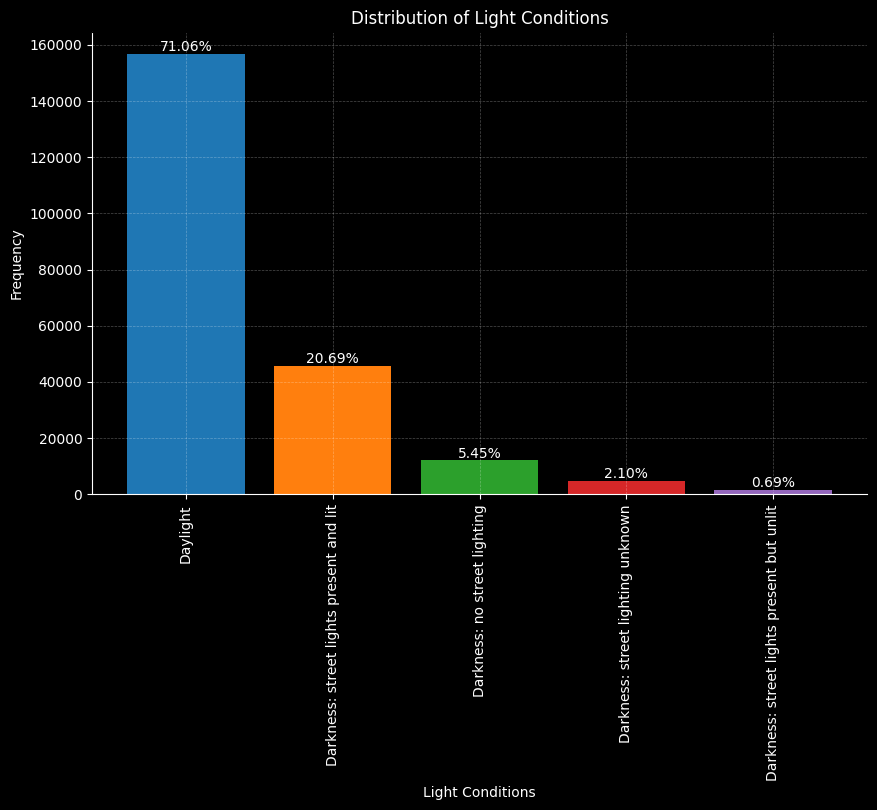

In [ ]:
# Plot the distribution

plot_distribution(df, 'light_conditions', show_percentages=True)

<h4 style="color: red ">
Result Observation:

We have effectively addressed the inconsistency identified in the 'light_conditions' column, with the highest accident happening in 'Daylight' and the lowest being 'Darkness: street lights present but unlit'
</h4>

<h3 style="color: blue ">
22. Light Conditions Column
</h3>

In [ ]:
# check unique values in the light_conditions column
df['weather_conditions'].value_counts()

weather_conditions
Fine without high winds       172135
Raining without high winds     27953
Other                           6116
Unknown                         4872
Raining with high winds         3974
Fine with high winds            3416
Fog or mist — if hazard         1304
Snowing without high winds       498
Snowing with high winds          166
-1                                 1
Name: count, dtype: int64

In [ ]:
# check and inspect the problematic row
df[df['weather_conditions'] == -1]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
193170,2020520002488,2020,520002488,343681.0,154706.0,-2.809007,51.288686,Devon and Cornwall,Fatal,1,1,2020-06-24,Wednesday,01:15,-1,Sedgemoor,Unknown Highway,A,371,Single carriageway,60,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,Unknown,Unknown,Darkness: no street lighting,-1,-1,-1,-1,Rural Area,-1,2,E01029085,585645,1,Driver or rider,Male,24,5,Fatal,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,9,Non-UK resident,7,828736,1,Car,No tow or articulation,Going ahead other,West,East,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Left carriageway nearside,Tree,Front,No,Not known,Male,24,5,-1,-1,-1,-1,7,Non-UK resident


<h4 style="color: red ">
Result Observation:

In addressing the row containing a value of -1 in the 'weather_conditions' column, we will substitute this entry with 'Unknown', as 'Unknown' is among the specified input values listed for the weather conditions column in the stat form.

</h4 >

In [ ]:
# Replace -1 with 'Unknown' to indicate these values are missing
df['weather_conditions'] = df['weather_conditions'].replace(-1, 'Unknown')

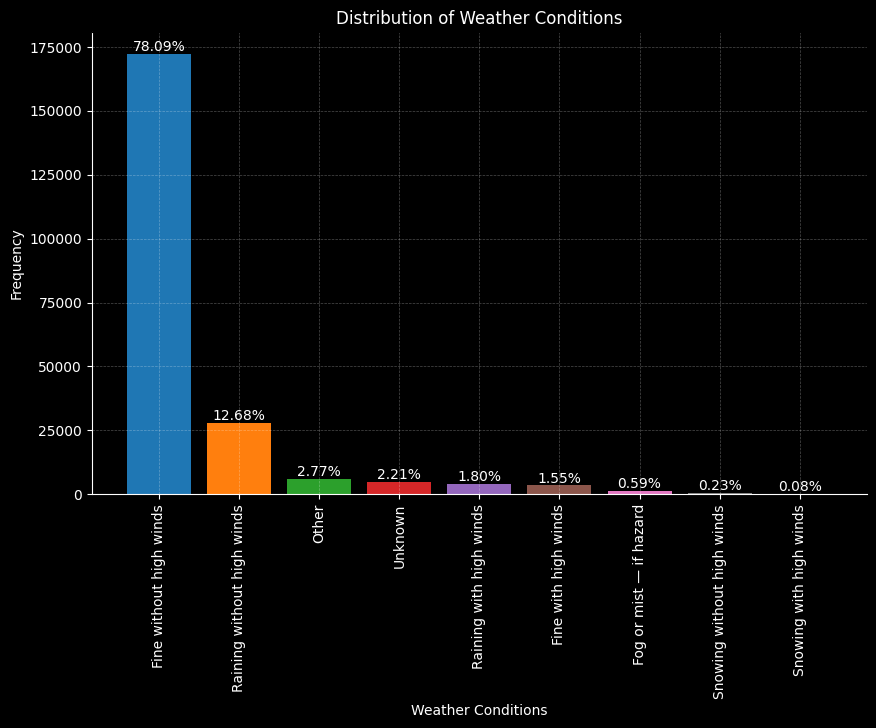

In [ ]:
# Plot the distribution
plot_distribution(df,'weather_conditions', show_percentages=True)

<h4 style="color: red ">
Result Observation:

We have effectively addressed the inconsistency identified in the 'weather_conditions' column, with the highest accident happening in 'Fine without high winds' and the lowest is 'Snowing with high winds'
</h4>

<h3 style="color: blue ">
23. Road Surface Conditions Column
</h3>

In [ ]:
# check unique values in the light_conditions column
df['road_surface_conditions'].value_counts()

road_surface_conditions
Dry                                    151085
Wet/Damp                                64669
Frost/Ice                                1653
9                                        1618
-1                                        666
Flood (surface water over 3cm deep)       375
Snow                                      369
Name: count, dtype: int64

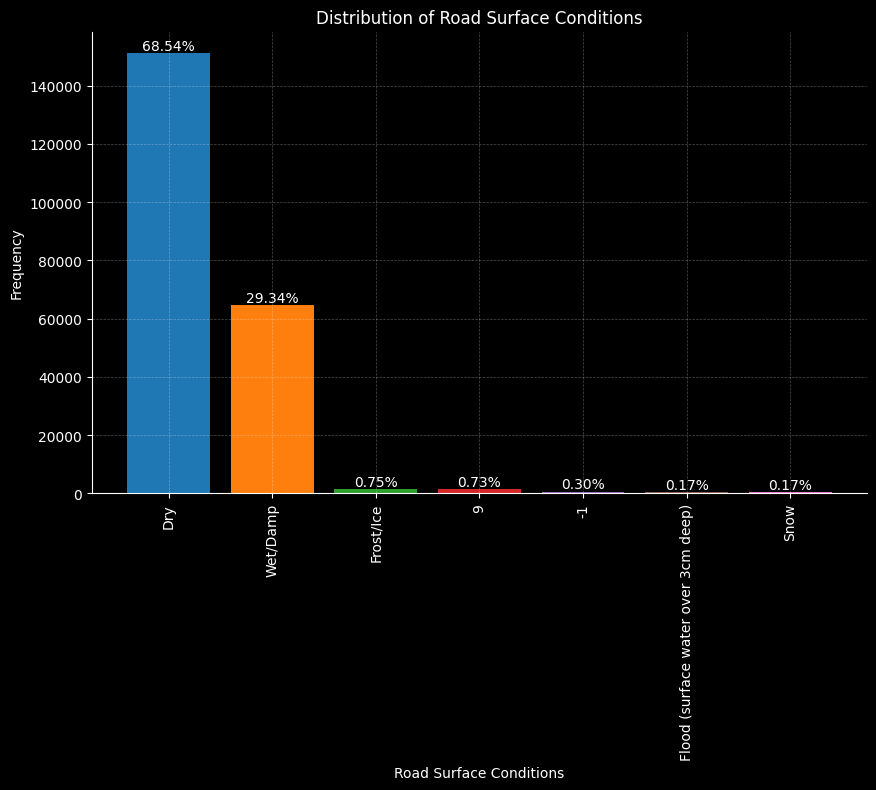

In [ ]:
# Plot the distribution
plot_distribution(df, 'road_surface_conditions', show_percentages=True)

<h4 style="color: red ">
Result Observation:

Upon review, it has been noted that there are erroneous entries in the 'road_surface_conditions' column, specifically values of 9 and -1. Accordingly, we will proceed to replace these inaccurate values with 'Unknown'
</h4>

In [ ]:
# Replace -1 with Unknown pedestrian_crossing_physical_facilities
df['road_surface_conditions'] = df['road_surface_conditions'].replace(9, 'Unknown')

# Replace 99 with Unknown
df['road_surface_conditions'] = df['road_surface_conditions'].replace(-1, 'Unknown')

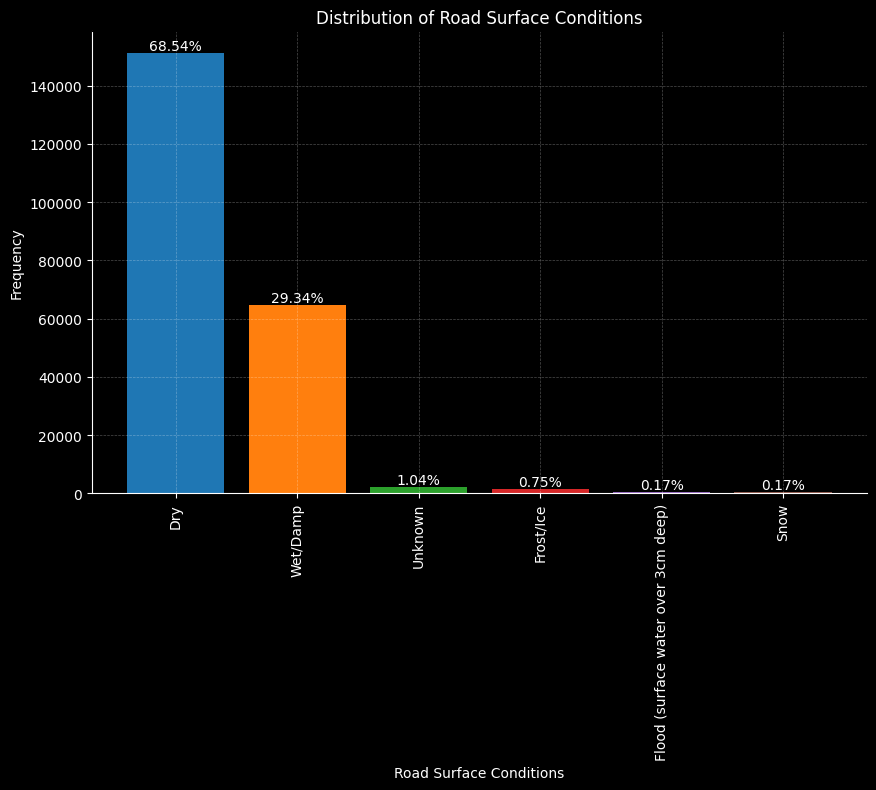

In [ ]:
# Plot the distribution
plot_distribution(df, 'road_surface_conditions', show_percentages=True)

<h4 style="color: red ">
Result Observation:

We have effectively addressed the inconsistency identified in the 'road_surface_conditions' column, with the highest accident happening in 'Dry' and the lowest is 'Snow' road surface conditions.
</h4>

<h3 style="color: blue ">
24. Special Conditions At Site Column
</h3>

In [ ]:
# check unique values in the light_conditions column
df['special_conditions_at_site'].value_counts()

special_conditions_at_site
None                                                       211680
Roadworks                                                    3094
9                                                            2784
Mud                                                           633
Automatic traffic signal out                                  548
-1                                                            488
Road surface defective                                        409
Permanent road signing or marking defective or obscured       393
Oil or diesel                                                 292
Automatic traffic signal partially defective                  114
Name: count, dtype: int64

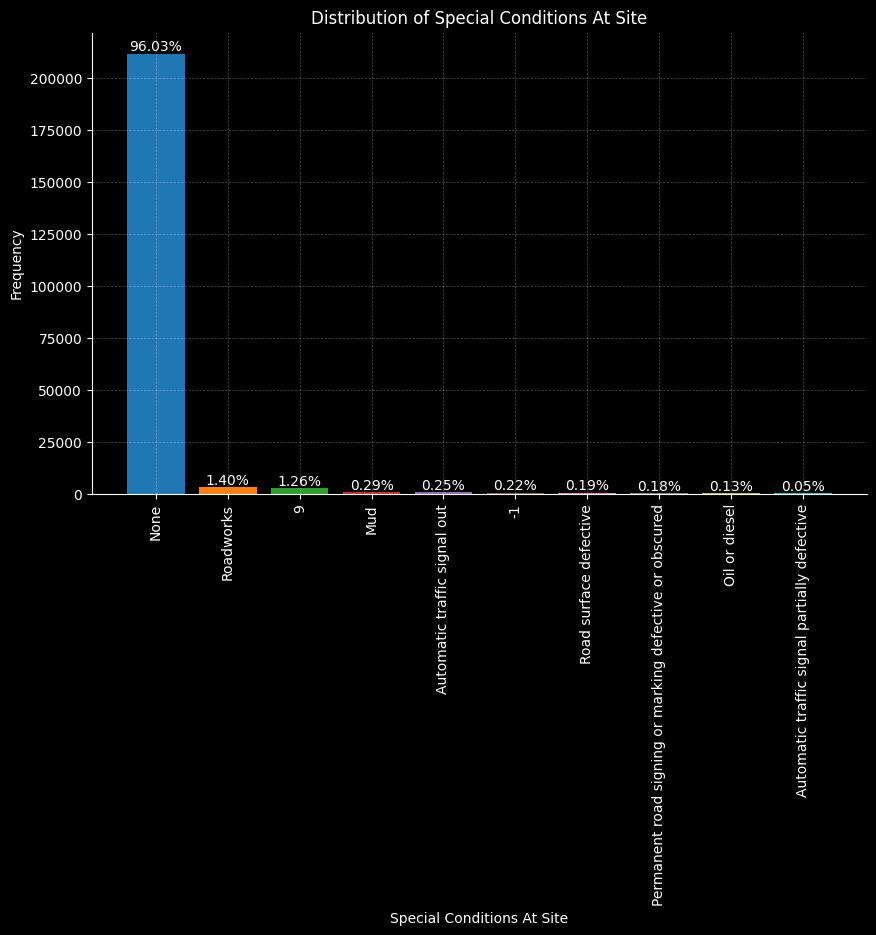

In [ ]:
# Plot the distribution
plot_distribution(df, 'special_conditions_at_site', show_percentages=True)

<h4 style="color: red ">
Result Observation:

Upon review, it has been noted that there are erroneous entries in the 'Special Conditions At Site' column, specifically values of 9 and -1. Accordingly, we will proceed to replace these inaccurate values with 'Unknown'
</h4>

In [ ]:
# Replace 9 with Unknown pedestrian_crossing_physical_facilities
df['special_conditions_at_site'] = df['special_conditions_at_site'].replace(9, 'Unknown')

# Replace -1 with Unknown
df['special_conditions_at_site'] = df['special_conditions_at_site'].replace(-1, 'Unknown')

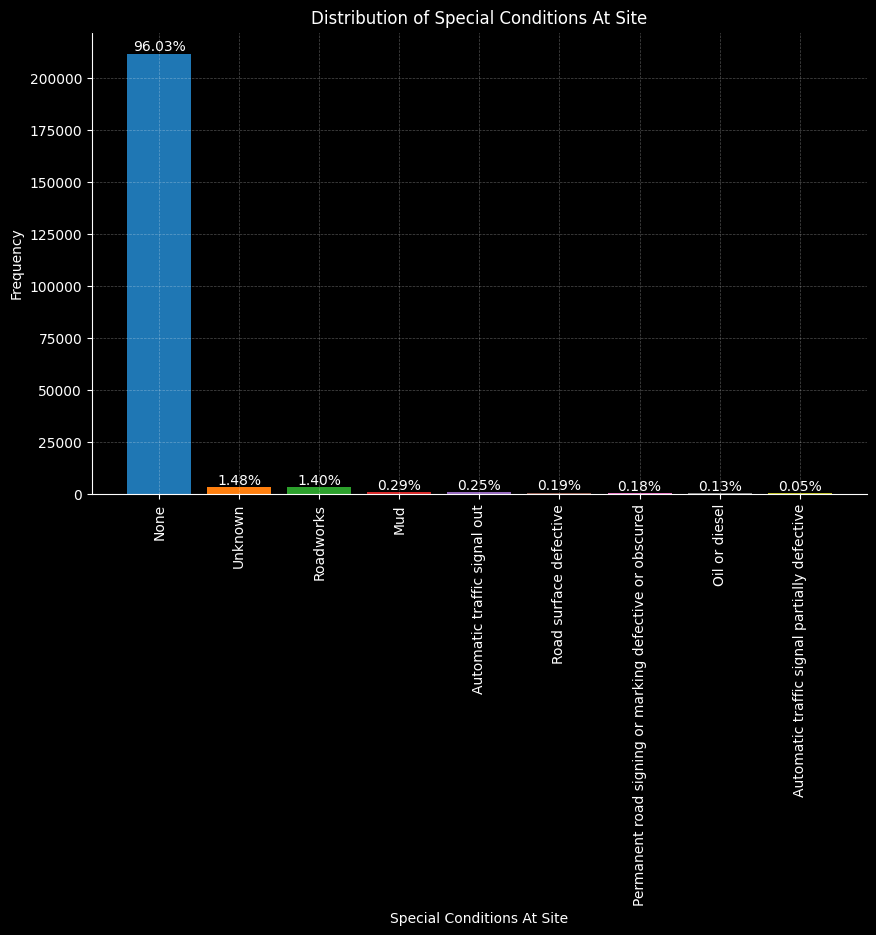

In [ ]:
# Plot the distribution
plot_distribution(df, 'special_conditions_at_site', show_percentages=True)

<h4 style="color: red ">
Result Observation:

We have effectively addressed the inconsistency identified in the 'special_conditions_at_site' column, with the highest accident happening in 'None' and the lowest is 'Automatic traffic signal partially defective' in the Special Conditions At Site column.
</h4>

<h3 style="color: blue ">
25. Carriageway Hazards Column
</h3>

In [ ]:
# check unique values in the carriageway_hazards column
df['carriageway_hazards'].value_counts()

carriageway_hazards
None                                               213131
Other object in carriageway                          2482
9                                                    2254
Involvement with previous accident                    720
Any animal in carriageway (except ridden horse)       554
Dislodged vehicle load in carriageway                 541
-1                                                    469
Pedestrian in carriageway - not injured               284
Name: count, dtype: int64

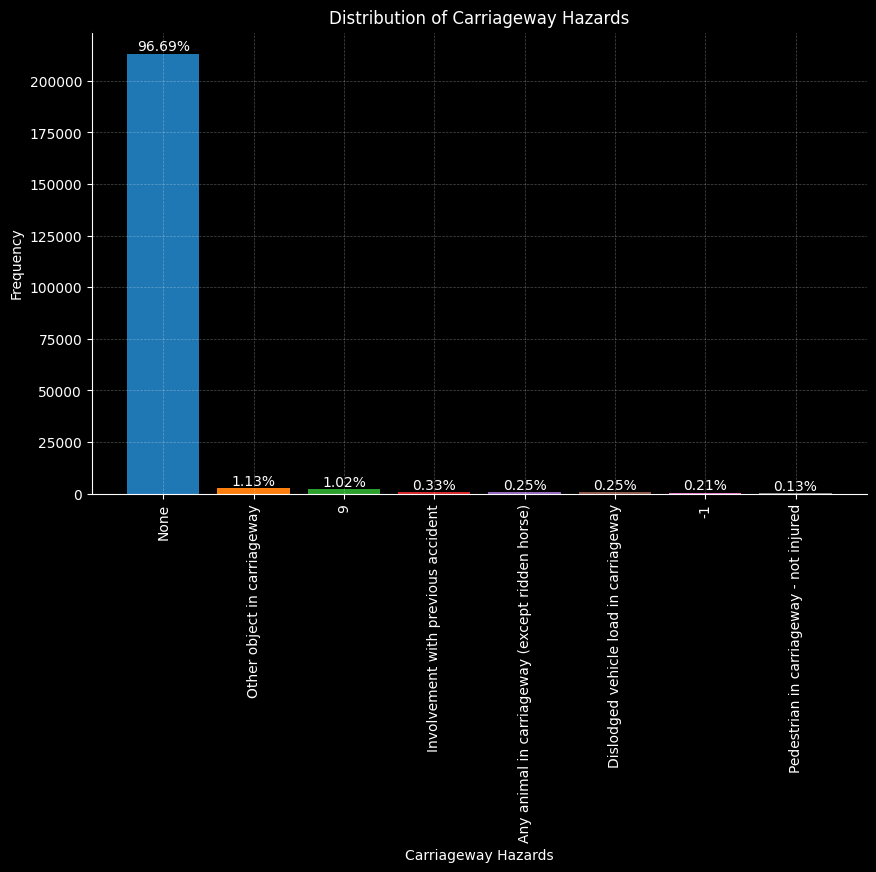

In [ ]:
# Plot the distribution
plot_distribution(df, 'carriageway_hazards', show_percentages=True)

<h4 style="color: red ">
Result Observation:

Upon review, it has been noted that there are erroneous entries in the 'Carriageway Hazards' column, specifically values of 9 and -1. Accordingly, we will proceed to replace these inaccurate values with 'Unknown'
</h4>

In [ ]:
# Replace -1 with Unknown carriageway_hazards
df['carriageway_hazards'] = df['carriageway_hazards'].replace(9, 'Unknown')

# Replace 99 with Unknown
df['carriageway_hazards'] = df['carriageway_hazards'].replace(-1, 'Unknown')

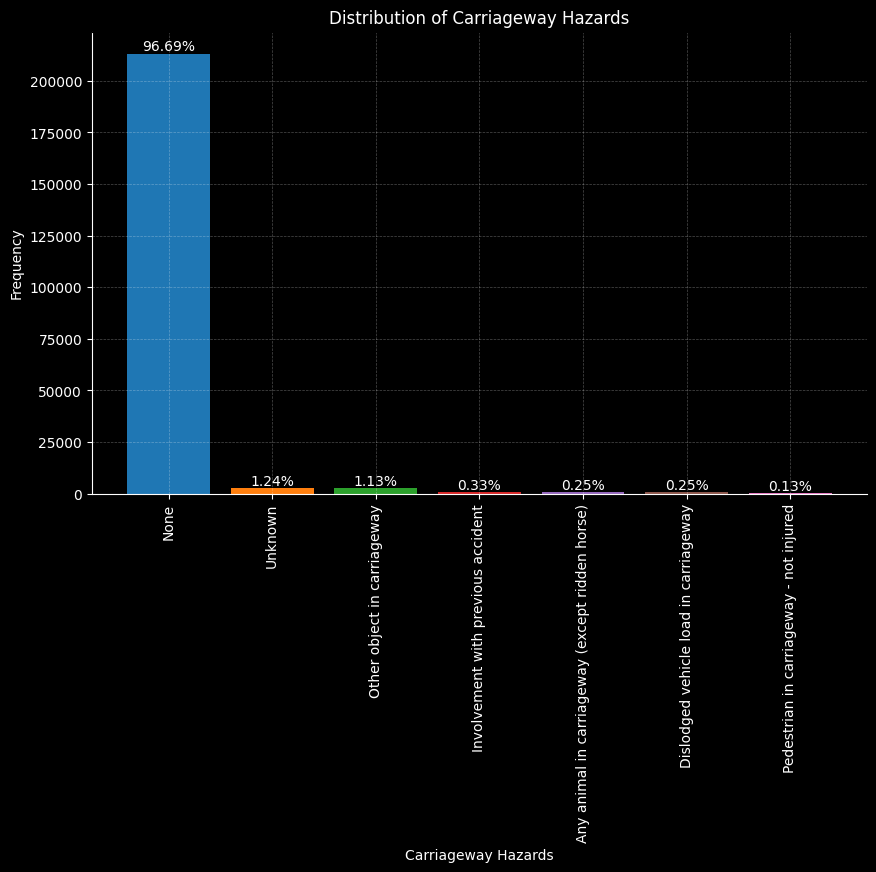

In [ ]:
# Plot the distribution
plot_distribution(df,'carriageway_hazards', show_percentages=True)

<h4 style="color: red ">
Result Observation:

We have effectively addressed the inconsistency identified in the 'Carriageway Hazards' column, with the highest accident happening in 'None' and the lowest is 'Pedestrian in carriageway - not injured' in the Special Conditions At Site column.
</h4>

<h3 style="color: blue ">
26. Urban or Rural Area Column
</h3>

In [ ]:
# check unique values in the carriageway_hazards column
df['urban_or_rural_area'].value_counts()

urban_or_rural_area
Urban Area    141659
Rural Area     78742
3                 34
Name: count, dtype: int64

In [ ]:
# df[df['urban_or_rural_area'] == 3]

<h3 style="color: blue ">
27. Did Police Officer Attend Scene of Accident Column
</h3>

In [ ]:
# check unique values in the carriageway_hazards column
df['did_police_officer_attend_scene_of_accident'].value_counts()

did_police_officer_attend_scene_of_accident
Yes                    158740
No                      42923
No – self reporting     18771
-1                          1
Name: count, dtype: int64

In [ ]:
df[df['did_police_officer_attend_scene_of_accident'] == -1]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
193170,2020520002488,2020,520002488,343681.0,154706.0,-2.809007,51.288686,Devon and Cornwall,Fatal,1,1,2020-06-24,Wednesday,01:15,-1,Sedgemoor,Unknown Highway,A,371,Single carriageway,60,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,Unknown,Unknown,Darkness: no street lighting,Unknown,Unknown,Unknown,Unknown,Rural Area,-1,2,E01029085,585645,1,Driver or rider,Male,24,5,Fatal,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,9,Non-UK resident,7,828736,1,Car,No tow or articulation,Going ahead other,West,East,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Left carriageway nearside,Tree,Front,No,Not known,Male,24,5,-1,-1,-1,-1,7,Non-UK resident


<h4 style="color: red ">
Result Observation:

Upon review, it has been noted that there is an erroneous entry of '-1' in the 'did_police_officer_attend_scene_of_accident' column. We believe since other columns are given accordingly, to have this information, we believe it is self reporting, though no police force attended the scene. Therefore, we will proceed to replace these inaccurate value with 'No – self reporting'.
</h4>

In [ ]:
# Replace -1 with '' to indicate these values are missing
df['did_police_officer_attend_scene_of_accident'] = df['did_police_officer_attend_scene_of_accident'].replace(-1, 'No – self reporting')

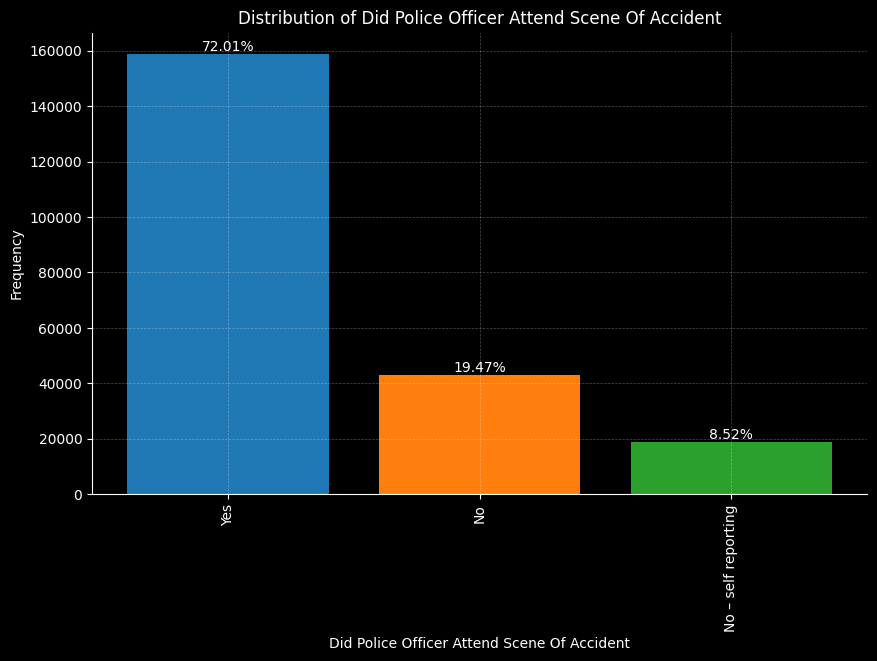

In [ ]:
# Plot the distribution
plot_distribution(df, 'did_police_officer_attend_scene_of_accident', show_percentages=True)

<h3 style="color: blue ">28. Trunk Road Flag Column
</h3> `

In [ ]:
# check unique values in the  column
df['trunk_road_flag'].value_counts()

trunk_road_flag
 2    187060
 1     17565
-1     15810
Name: count, dtype: int64

In [ ]:
# inspect coded value 1
display(df[df['trunk_road_flag'] == 1].head(2))
len(df[df['trunk_road_flag'] == 1 & (df['casualty_class'] == 'Pedestrian')])

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
175,2020010228319,2020,010228319,504746.0,174889.0,-0.493556,51.463292,Metropolitan Police,Slight,2,1,2020-01-03,Friday,04:57,26,Hillingdon,Hillingdon,A,3044,Roundabout,50,Roundabout,Give way or uncontrolled,A,3113,None within 50 metres,No physical crossing facility within 50 metres,Darkness: street lights present and lit,Raining without high winds,Wet/Damp,None,None,Rural Area,Yes,1,E01002444,484847,1,Driver or rider,Female,37,7,Slight,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,9,Unknown,5,681857,1,Car,No tow or articulation,Turning right,East,North west,On main carriageway - not in restricted lane,Entering roundabout,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Commuting to/from work,Female,34,6,1390,1,15,VOLKSWAGEN POLO,8,Unknown
176,2020010228319,2020,010228319,504746.0,174889.0,-0.493556,51.463292,Metropolitan Police,Slight,2,1,2020-01-03,Friday,04:57,26,Hillingdon,Hillingdon,A,3044,Roundabout,50,Roundabout,Give way or uncontrolled,A,3113,None within 50 metres,No physical crossing facility within 50 metres,Darkness: street lights present and lit,Raining without high winds,Wet/Damp,None,None,Rural Area,Yes,1,E01002444,484847,1,Driver or rider,Female,37,7,Slight,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,9,Unknown,5,681858,2,Car,No tow or articulation,Turning right,West,South east,On main carriageway - not in restricted lane,Leaving roundabout,Skidded,None,Left carriageway nearside,None,Nearside,No,Commuting to/from work,Female,37,7,1995,2,7,BMW 3 SERIES,5,Unknown


137

In [ ]:
# inspect coded value 2
# df[df['trunk_road_flag'] == 2]
len(df[(df['trunk_road_flag'] == 2) & (df['casualty_class'] == 'Pedestrian')])

14505

In [ ]:
# inspect coded value -1
# df[df['trunk_road_flag'] == -1]
len(df[(df['trunk_road_flag'] == -1) & (df['casualty_class'] == 'Pedestrian')])


1368

<h4 style="color: red ">
Result Observation: <br>
    

Upon reviewing the provided data, it's seen that the 'trunk_road_flag' column's coded values were not included in the stat form.

After thorough analysis, we observed correlations between certain column values such as speed limit, pedestrian crossing, and casualty class. Trunk roads, known for their higher speed limits and potential lack of pedestrian crossings and traffic calming measures, tend to exhibit distinct accident patterns. For instance, incidents involving pedestrians accounted for 0.78% of accidents in coded value 1, compared to 7.75% in coded value 2 and 8.65% in coded value -1.

In light of these insights, we propose the following adjustments:

1. Replace coded value 1 with 'trunk road'.
2. Replace coded values 2 and -1 with 'non-trunk road'.
</h4>

In [ ]:
# Replacing coded values in trunk_road_flag column
df['trunk_road_flag'] = df['trunk_road_flag'].replace(1, 'Trunk road')

df['trunk_road_flag'] = df['trunk_road_flag'].replace(2, 'Non-trunk road')
df['trunk_road_flag'] = df['trunk_road_flag'].replace(-1, 'Non-trunk road')

In [ ]:
# check unique values in the  column
df['trunk_road_flag'].value_counts()

trunk_road_flag
Non-trunk road    202870
Trunk road         17565
Name: count, dtype: int64

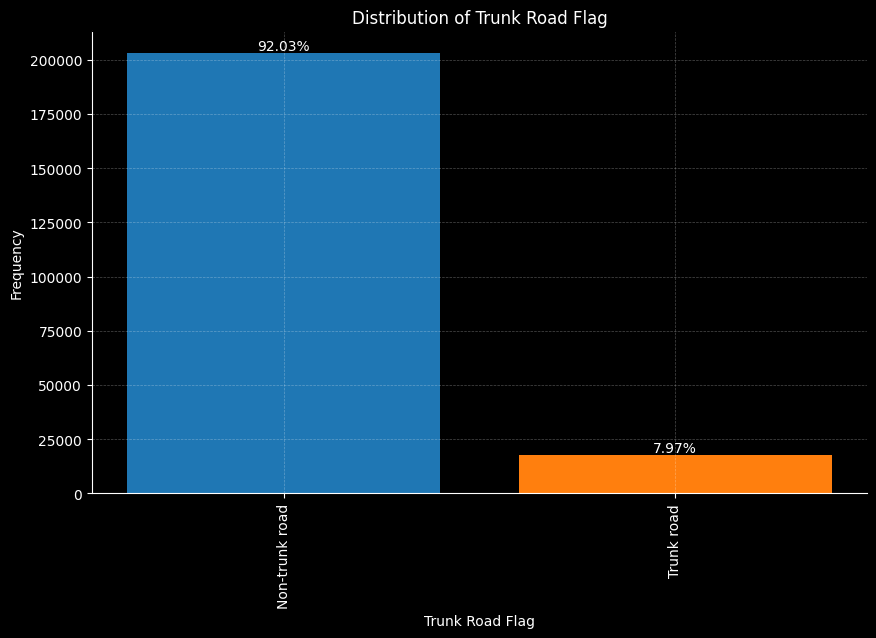

In [ ]:
# Plot the bar chart
plot_distribution(df, 'trunk_road_flag', show_percentages=True)

<h4 style="color: red ">
Result Observation:

We have effectively replaced the coded values and inconsistency identified in the 'Trunk Road Flag' column
</h4>


<h1 style="color: blue "> CASUALTY VARIABLES
</h1>

<h3 style="color: blue ">29 Casualty Reference Column
</h3> `

In [ ]:
# check unique values in the  column
df['casualty_reference'].unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  40,  12,
        13,  14,  15,  16,  17,  33,  18,  19,  20,  21,  22,  23,  24,
        25,  26,  27,  28,  29,  30,  31,  32,  34,  35,  36,  37,  38,
        39,  41, 902, 992], dtype=int64)

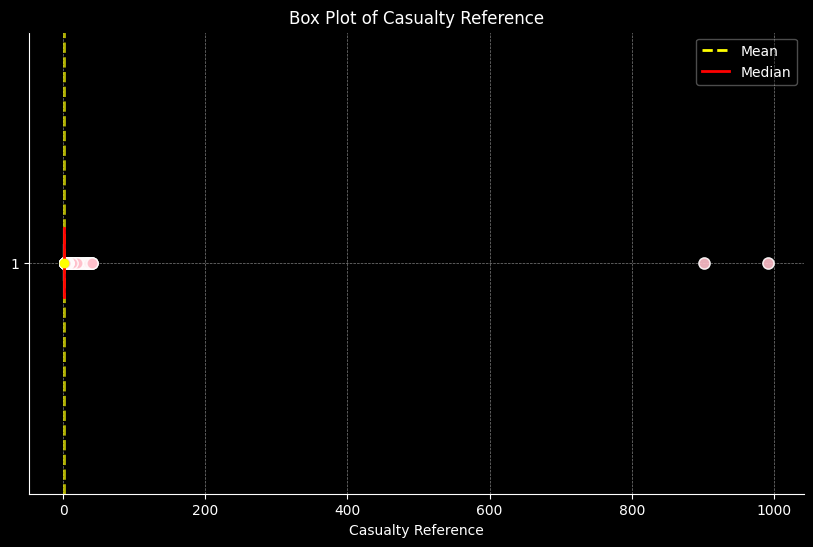

In [ ]:
# Function to check unique values and plot box plot for a specified column
def plot_boxplot(df, column_name):
    # Check unique values in the specified column
#     unique_values = df[column_name].unique()
#     print(f"Unique values in '{column_name}' column:", unique_values)

    # Formatting column name for display
    formatted_column_name = column_name.replace('_', ' ').title()

    # Set the size of the plot and background color
    fig, ax = plt.subplots(figsize=(10, 6))
    background_color = 'black'

    # Plotting boxplot with properties set for visibility on black background
    boxprops = dict(facecolor='grey', color='white', linewidth=1.5)
    whiskerprops = dict(color='white', linewidth=1.5)
    capprops = dict(color='white', linewidth=1.5)
    medianprops = dict(color='red', linewidth=2)
    flierprops = dict(marker='o', markerfacecolor='pink', markeredgecolor='white', markersize=8, alpha=0.7)  # Adjusting fliers for visibility

    # Create the boxplot
    boxplot_elements = ax.boxplot(df[column_name], vert=False, patch_artist=True,
                                  boxprops=boxprops, whiskerprops=whiskerprops,
                                  capprops=capprops, medianprops=medianprops,
                                  flierprops=flierprops, showfliers=True)


    # Calculate mean and plot it
    mean = df[column_name].mean()
    ax.scatter(mean, 1, color='yellow', zorder=3, label='Mean')

    # Highlight the mean
    ax.axvline(mean, color='yellow', linestyle='--', linewidth=2, alpha=0.7)

    # Set background colors
    ax.set_facecolor(background_color)
    fig.patch.set_facecolor(background_color)

    # Adding faint grid lines
    ax.grid(True, which='both', axis='y', linestyle='--', linewidth=0.5, color='white', alpha=0.5)
    ax.grid(True, which='both', axis='x', linestyle='--', linewidth=0.5, color='white', alpha=0.5)

    # Set the colors of the axes, labels, and title to white for visibility
    ax.tick_params(colors='white', which='both')
    ax.spines['bottom'].set_color('white')
    ax.spines['left'].set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.title.set_color('white')

    # Labels and title
    ax.set_xlabel(formatted_column_name, color='white')
    ax.set_title(f'Box Plot of {formatted_column_name}', color='white')

    # Add a legend for the mean and median with white text
    median_line = plt.Line2D([0], [0], color='red', linewidth=2, label='Median')
    mean_line = plt.Line2D([0], [0], color='yellow', linestyle='--', linewidth=2, label='Mean')
    legend = ax.legend(handles=[mean_line, median_line], facecolor=background_color, edgecolor='white', fontsize=10, framealpha=0.3)

    # Set legend text color to white
    for text in legend.get_texts():
        text.set_color('white')

    # Show the plot
    plt.show()

# Call the function for the 'casualty_reference' column
plot_boxplot(df, 'casualty_reference')

<h4 style="color: red ">
Result Observation: <br>

Based on our observations, it appears that there may be outlier values present in the Casualty Reference Column. To address this, we will conduct a Grubbs test. Given that the Grubbs test examines outliers one at a time within a given array, we will implement a function and loop to iteratively identify all outliers.
</h4>

<h4 style="color: blue ">Outlier Detection (IQR Test) in Casualty Reference Column
</h4> `

In [ ]:
# IQR Test method for outlier detection
def iqr_test(dataframe, column_name):
    """
    Detect and display outliers in a specified column of a DataFrame using the IQR method.
    """
    # Ensure the column exists in the DataFrame
    if column_name not in dataframe.columns:
        print(f"Column {column_name} not found in DataFrame.")
        return

    # Extract the data for the specified column, handling NaN values and getting unique entries
    data = dataframe[column_name].dropna().unique()

    # Calculate Q1 (25th percentile) and Q3 (75th percentile)
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)

    # Calculate IQR
    IQR = Q3 - Q1

    # Determine outlier bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify outliers
    outliers = data[(data < lower_bound) | (data > upper_bound)]

    # Print the results
    print("Outliers identified:", outliers)
    print("Lower bound:", lower_bound, "Upper bound:", upper_bound)


# call function to check and print outlier
iqr_test(df, 'casualty_reference')

Outliers identified: [902 992]
Lower bound: -20.0 Upper bound: 64.0


<h4 style="color: blue ">Outlier Detection (Grubbs Test) in Casualty Reference Column
</h4> `

In [ ]:
from scipy import stats

# create class to use grubbs test for outlier detection without removing them
class GrubbsTest:
    def __init__(self, dataframe, alpha=0.05):
        """
        Initialize with a DataFrame and an alpha value for determining statistical significance.
        """
        self.df = dataframe
        self.alpha = alpha

    def grubbs_test(self, data):
        """
        Perform Grubbs' test to identify the most extreme value in the data.
        """
        avg = np.mean(data)
        std_dev = np.std(data)
        abs_deviations = np.abs(data - avg)
        max_index = np.argmax(abs_deviations)
        G = abs_deviations[max_index] / std_dev
        return G, max_index

    def get_critical_G(self, size):
        """
        Calculate the critical G value for a given sample size.
        """
        t_dist = stats.t.ppf(1 - self.alpha / (2 * size), size - 2)
        numerator = (size - 1) * np.sqrt(np.square(t_dist))
        denominator = np.sqrt(size) * np.sqrt(size - 2 + np.square(t_dist))
        return numerator / denominator

    def display_outliers(self, column_name):
        """
        Identify outliers from a specified column of the DataFrame using iterative Grubbs' test
        without removing them.
        """
        data = self.df[column_name].dropna().unique()  # Handle NaN values and get unique entries
        outliers = []

        outliers_identified = False
        while not outliers_identified:
            G, outlier_index = self.grubbs_test(data)
            G_critical = self.get_critical_G(len(data))

            if G > G_critical:
                outliers.append(data[outlier_index])
                data = np.delete(data, outlier_index)
            else:
                outliers_identified = True

        return data, outliers

# create object of class
detector = GrubbsTest(df)
clean_data, outliers = detector.display_outliers('casualty_reference')
print("Dataset without outliers marked:", clean_data)
print("Outliers identified:", outliers)


Dataset without outliers marked: [ 1  2  3  4  5  6  7  8  9 10 11 40 12 13 14 15 16 17 33 18 19 20 21 22
 23 24 25 26 27 28 29 30 31 32 34 35 36 37 38 39 41]
Outliers identified: [992, 902]


<h4 style="color: red ">
Result Observation: <br>

Following the execution of the IQR test and Grubbs test, outliers with the values 992 and 902 were identified within the Casualty Reference Column. Our next step involves conducting a thorough investigation to determine the most appropriate way to address these outliers.
</h4>

In [ ]:
# check rows having the outliers 992
df[df['casualty_reference'] == 992]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
192134,2020501008741,2020,501008741,163236.0,40534.0,-5.320284,50.217313,Avon and Somerset,Slight,2,3,2020-12-04,Friday,16:58,596,Cornwall,Cornwall,A,30,Dual carriageway,70,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,No physical crossing facility within 50 metres,Darkness: no street lighting,Fine without high winds,Dry,None,None,Rural Area,Yes,Trunk road,E01018876,585084,992,Vehicle or pillion passenger,Male,18,4,Slight,0,0,Rear seat passenger,Not a bus or coach passenger,Not applicable,9,Unknown,3,827999,1,Car,No tow or articulation,Going ahead other,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction",Skidded,None,Left carriageway nearside,None,Front,No,Other,Male,23,5,1896,2,20,AUDI A4,2,Non-UK resident
192135,2020501008741,2020,501008741,163236.0,40534.0,-5.320284,50.217313,Avon and Somerset,Slight,2,3,2020-12-04,Friday,16:58,596,Cornwall,Cornwall,A,30,Dual carriageway,70,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,No physical crossing facility within 50 metres,Darkness: no street lighting,Fine without high winds,Dry,None,None,Rural Area,Yes,Trunk road,E01018876,585084,992,Vehicle or pillion passenger,Male,18,4,Slight,0,0,Rear seat passenger,Not a bus or coach passenger,Not applicable,9,Unknown,3,828000,2,Car,No tow or articulation,Going ahead other,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Left carriageway offside,None,Back,No,Other,Female,70,10,998,1,4,KIA PICANTO,5,Non-UK resident


In [ ]:
# check all the casualties involved in the accident
df[192129:192137]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
192129,2020501008737,2020,501008737,246090.0,99326.0,-4.184202,50.773035,Avon and Somerset,Serious,1,1,2020-12-06,Sunday,13:38,589,West Devon,Unknown Highway,Unclassified,0,Single carriageway,60,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Frost/Ice,None,None,Rural Area,Yes,Non-trunk road,E01020322,585081,1,Driver or rider,Male,59,9,Serious,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,1,Unknown,4,827998,1,Pedal cycle,No tow or articulation,Going ahead other,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction",Skidded,None,Did not leave carriageway,None,Offside,No,Other,Male,59,9,-1,-1,-1,-1,4,Unknown
192130,2020501008741,2020,501008741,163236.0,40534.0,-5.320284,50.217313,Avon and Somerset,Slight,2,3,2020-12-04,Friday,16:58,596,Cornwall,Cornwall,A,30,Dual carriageway,70,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,No physical crossing facility within 50 metres,Darkness: no street lighting,Fine without high winds,Dry,None,None,Rural Area,Yes,Trunk road,E01018876,585082,1,Driver or rider,Male,23,5,Slight,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,9,Non-UK resident,2,827999,1,Car,No tow or articulation,Going ahead other,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction",Skidded,None,Left carriageway nearside,None,Front,No,Other,Male,23,5,1896,2,20,AUDI A4,2,Non-UK resident
192131,2020501008741,2020,501008741,163236.0,40534.0,-5.320284,50.217313,Avon and Somerset,Slight,2,3,2020-12-04,Friday,16:58,596,Cornwall,Cornwall,A,30,Dual carriageway,70,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,No physical crossing facility within 50 metres,Darkness: no street lighting,Fine without high winds,Dry,None,None,Rural Area,Yes,Trunk road,E01018876,585082,1,Driver or rider,Male,23,5,Slight,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,9,Non-UK resident,2,828000,2,Car,No tow or articulation,Going ahead other,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Left carriageway offside,None,Back,No,Other,Female,70,10,998,1,4,KIA PICANTO,5,Non-

In [ ]:
# Replace 992 with 4
df['casualty_reference'] = df['casualty_reference'].replace(992, 4)

In [ ]:
# check again the rows having the outliers 992
df[df['casualty_reference'] == 992]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type


<h4 style="color: red ">
Result Observation: <br>

Upon identifying the problematic rows, it was determined that the value 992 indeed constituted an outlier. Subsequent analysis revealed the specific accident associated with these outliers, and upon further investigation, the true value of these outliers was established to be 4. Consequently, we proceeded to replace the value 992 with 4.
</h4>

In [ ]:
# check rows having the outliers 902
df[df['casualty_reference'] == 902]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
190438,2020500986881,2020,500986881,278989.0,104641.0,-3.719616,50.828611,Avon and Somerset,Slight,2,2,2020-09-17,Thursday,15:52,586,Mid Devon,Unknown Highway,Unclassified,0,Single carriageway,60,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,Rural Area,Yes,Non-trunk road,E01020069,584166,902,Driver or rider,Male,22,5,Slight,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,4,3,5,826717,1,Car,No tow or articulation,Going ahead right hand bend,South west,East,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Commuting to/from work,Female,38,7,1997,2,13,FORD MONDEO,4,Parked and unattended
190439,2020500986881,2020,500986881,278989.0,104641.0,-3.719616,50.828611,Avon and Somerset,Slight,2,2,2020-09-17,Thursday,15:52,586,Mid Devon,Unknown Highway,Unclassified,0,Single carriageway,60,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,Rural Area,Yes,Non-trunk road,E01020069,584166,902,Driver or rider,Male,22,5,Slight,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,4,3,5,826718,2,Motorcycle over 125cc and up to 500cc,No tow or articulation,Going ahead left hand bend,East,South west,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Pupil riding to/from school,Male,22,5,125,1,6,HONDA CBR125R,5,Parked and unattended


In [ ]:
# check all the casualties involved in the accident
df[190435:190441]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
190435,2020500986846,2020,500986846,249356.0,55626.0,-4.120207,50.381168,Avon and Somerset,Slight,2,1,2020-09-23,Wednesday,11:22,583,Plymouth,Plymouth,Unclassified,0,Single carriageway,30,T or staggered junction,Give way or uncontrolled,Unclassified,0,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Raining without high winds,Wet/Damp,None,None,Urban Area,Yes,Non-trunk road,E01015061,584164,1,Driver or rider,Male,86,11,Slight,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,9,Unknown,3,826716,2,Car,No tow or articulation,Going ahead other,East,West,On main carriageway - not in restricted lane,Approaching junction or waiting/parked at junc...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,No,Other,Male,86,11,1124,1,9,CITROEN C3,3,Unknown
190436,2020500986881,2020,500986881,278989.0,104641.0,-3.719616,50.828611,Avon and Somerset,Slight,2,2,2020-09-17,Thursday,15:52,586,Mid Devon,Unknown Highway,Unclassified,0,Single carriageway,60,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,Rural Area,Yes,Non-trunk road,E01020069,584165,1,Driver or rider,Female,38,7,Slight,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,9,3,4,826717,1,Car,No tow or articulation,Going ahead right hand bend,South west,East,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Commuting to/from work,Female,38,7,1997,2,13,FORD MONDEO,4,Parked and unattended
190437,2020500986881,2020,500986881,278989.0,104641.0,-3.719616,50.828611,Avon and Somerset,Slight,2,2,2020-09-17,Thursday,15:52,586,Mid Devon,Unknown Highway,Unclassified,0,Single carriageway,60,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,Rural Area,Yes,Non-trunk road,E01020069,584165,1,Driver or rider,Female,38,7,Slight,0,0,Not a car passenger,Not a bus or coach passenger,Not applicable,9,3,4,826718,2,Motorcycle over 125cc and up to 500cc,No tow or articulation,Going ahead left hand bend,East,South west,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No 

In [ ]:
# Replace 902 with 2
df['casualty_reference'] = df['casualty_reference'].replace(902, 2)

In [ ]:
# check again the rows having the outliers 902
df[df['casualty_reference'] == 902]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type


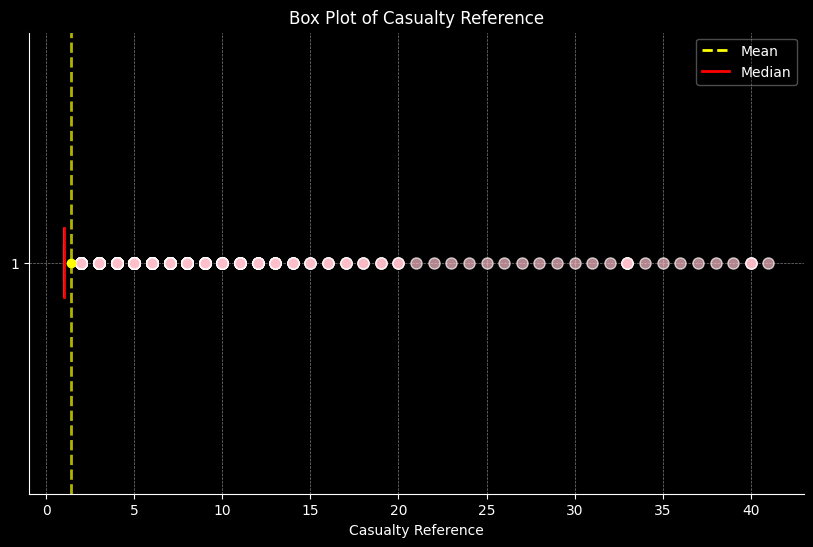

In [ ]:
# Call the function for the 'casualty_reference' column
plot_boxplot(df, 'casualty_reference')

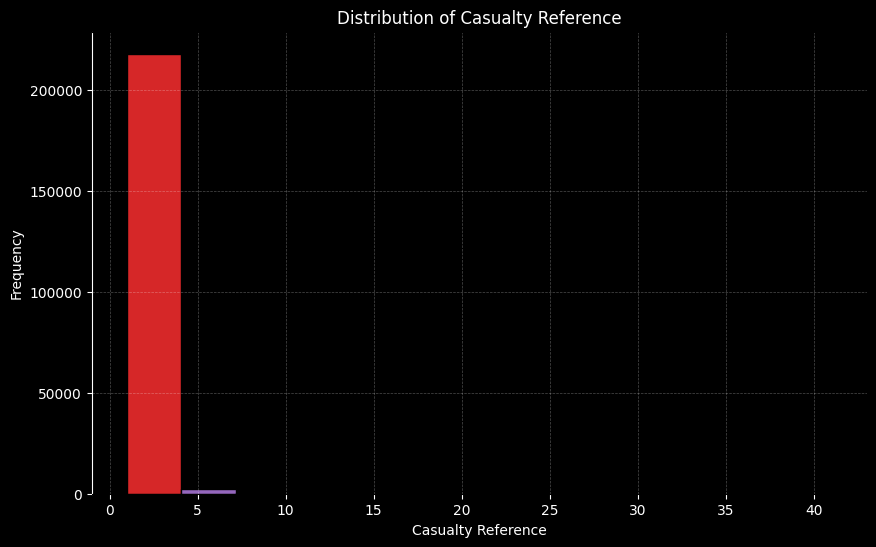

In [ ]:
# plot histogram of the  column
plot_histogram(df, 'casualty_reference')

<h4 style="color: red ">
Result Observation: <br>

Upon identifying the problematic rows, it was determined that the value 902 indeed constituted an outlier. Subsequent analysis revealed the specific accident associated with these outliers, and upon further investigation, the true value of these outliers was established to be 2. Consequently, we proceeded to replace the value 902 with 2.
</h4>

<h3 style="color: blue "> 30. Casualty Class Column
</h3> `

In [ ]:
# check unique values in the  column
df['casualty_class'].value_counts()

casualty_class
Driver or rider                 161430
Vehicle or pillion passenger     42995
Pedestrian                       16010
Name: count, dtype: int64

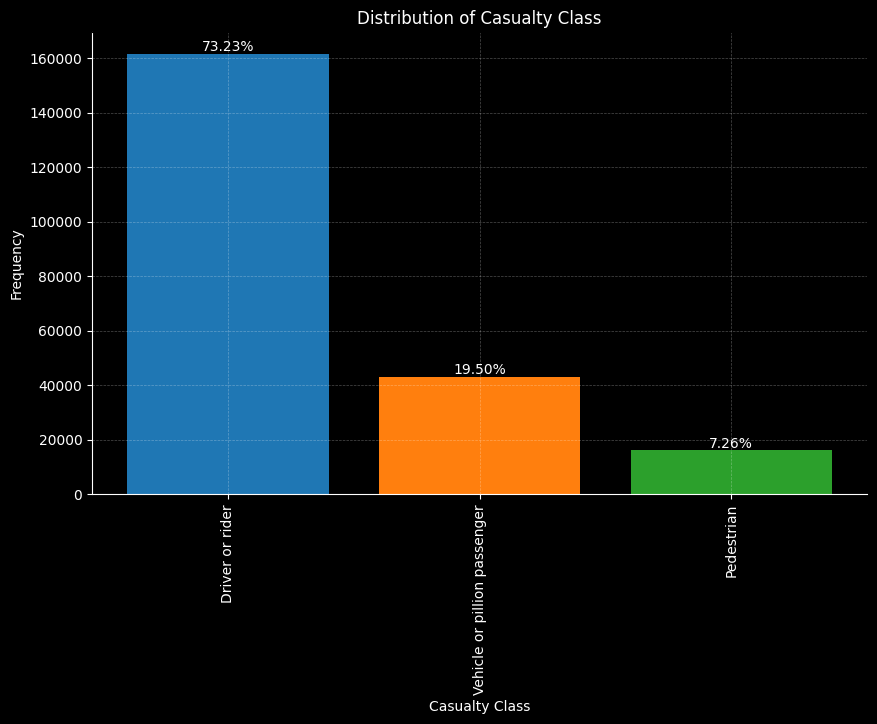

In [ ]:
# plot distribution
plot_distribution(df, 'casualty_class', show_percentages=True)


<h4 style="color: red ">
Result Observation: <br>

Our analysis revealed no discrepancies in the casualty class column. The predominant casualty type in accidents is the Driver or Rider, comprising 73.2% of total casualties. Vehicle or pillion passenger casualties account for 19.5%, while pedestrian casualties are the least frequent, constituting 7.3% of total casualties.
</h4>

<h3 style="color: blue ">31. Sex of Casualty Column
</h3> `

In [ ]:
# check unique values in the  column
df['sex_of_casualty'].value_counts()

sex_of_casualty
Male      137918
Female     81115
-1          1393
9              9
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

We've identified discrepancies in the 'sex_of_casualty' column, specifically concerning values of -1 and 9. Given the sensitivity of accurately recording an individual's sex, we deem it necessary to address these discrepancies promptly. Firstly, we will check sex_of_driver column to see if we have the corrected input there, since driver are the highest casuaty with 73.2% . Thereafter, we will replace these questionable values with 'Unknown', a designation we consider more appropriate in such cases.
</h4>

In [ ]:
# Identify and correct anywhere we have -1 and 9 in sex_of_casualty with Male and Female if found in sex_of_driver column

# create a function
def correct_rows(df, col1, col2):
    # Initialize a counter to track the number of corrected rows
    num_corrected_rows = 0

    # Loop through the DataFrame rows
    for index, row in df.iterrows():
        # Check if the value in col1 is -1
        if row[col1] == -1:
            # Check if the corresponding value in col2 is not -1
            if row[col2] != -1:
                # Replace the value in col1 with the value in col2
                df.at[index, col1] = row[col2]
                # Increment the counter
                num_corrected_rows += 1

    # Return the DataFrame with corrected rows and the total number of rows corrected
    return df, num_corrected_rows

# Call the function with column names and print the total number of rows corrected
df_corrected, num_corrected = correct_rows(df, 'sex_of_casualty', 'sex_of_driver')
print(f"Total number of rows corrected: {num_corrected}")

Total number of rows corrected: 1392


<h4 style="color: red ">
Result Observation: <br>

After conducting the necessary corrections using the above code, we have successfully rectified 760 out of 1402 rows in the 'sex_of_casualty' column, accounting for approximately 54% of the total discrepancies. These corrections were made by aligning the values with those present in the 'sex_of_driver' column, where applicable. we will now go ahead and replace the remaining values with 'Unknown', a designation we consider more appropriate in such cases.
</h4>

In [ ]:
# check unique values in the  column
df['sex_of_casualty'].value_counts()

sex_of_casualty
Male         138432
Female        81352
Not known       641
9                 9
-1                1
Name: count, dtype: int64

In [ ]:
# Replace -1 and 9 with Unknown
df['sex_of_casualty'] = df['sex_of_casualty'].replace(-1, 'Unknown')
df['sex_of_casualty'] = df['sex_of_casualty'].replace(9, 'Unknown')

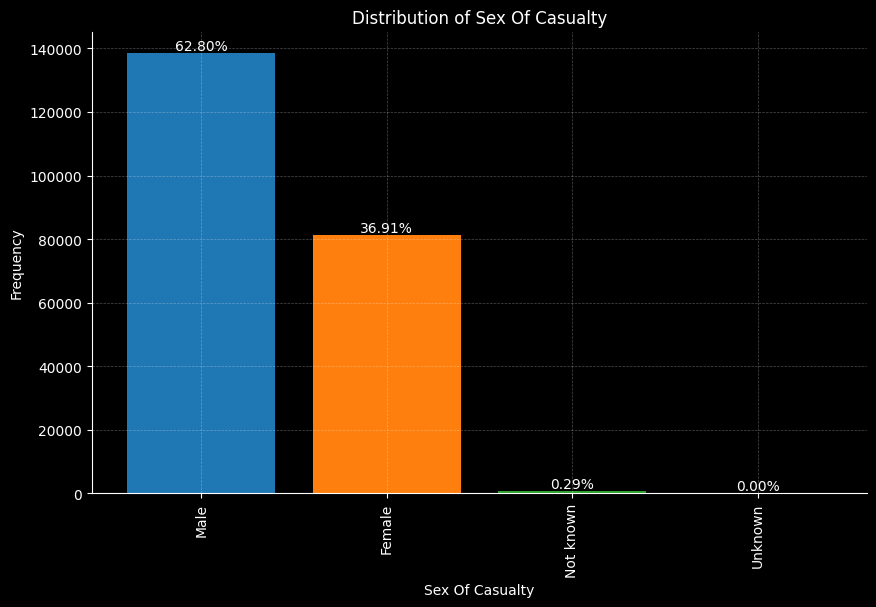

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df, 'sex_of_casualty', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

After effectively handling the discrepancies by assigning them as 'Unknown', which accounted for only 0.3% of the total casualties, our analysis showed that the majority of casualties were males, representing the highest proportion at 62.8%. Females accounted for 36.9% of the casualties.
</h4>

<h3 style="color: blue ">32. Age of Casualty
</h3> `

In [ ]:
# check unique values in the  column
df['age_of_casualty'].unique()

array([31,  2,  4, 23, 47, 32, 33, 25, 41, 50, 62, 37, -1, 20, 42, 30, 18,
       26, 29, 38, 39, 80, 19, 21, 48,  7, 79, 45, 27, 44, 51, 83, 52, 43,
       22, 59, 60, 77, 12, 54, 10, 40, 56, 24, 88, 11,  9, 35,  5,  3, 16,
       57, 67,  6, 49, 46, 53, 28, 69, 15, 76, 36, 55, 61, 85, 34,  8, 87,
       58, 73, 64, 65,  0, 78, 71, 14, 13, 17,  1, 68, 91, 66, 92, 74, 75,
       63, 70, 84, 86, 94, 72, 90, 81, 82, 89, 93, 96, 95, 98, 99, 97],
      dtype=int64)

In [ ]:
print(f'Mininum age of casualty: {df["age_of_casualty"].min()}')
print(f'Maximum age of casualty: {df["age_of_casualty"].max()}')

Mininum age of casualty: -1
Maximum age of casualty: 99


In [ ]:
# check the length of -1
len(df[df["age_of_casualty"] == -1])

4654

<h4 style="color: red ">
Result Observation: <br>

We have identified a discrepancy of -1, totaling 4654 instances, in the 'age_of_casualty' column. Given that drivers represent the highest proportion of casualties at 72.3%, we will investigate if the discrepancy in 'age_of_casualty' aligns with corrected values present in the 'age_of_driver' column. If such alignment exists, we will proceed to replace the discrepancies accordingly.
</h4>

In [ ]:
# Call the function with column names and print the total number of rows corrected
df_corrected, num_corrected = correct_rows(df, 'age_of_casualty', 'age_of_driver')
print(f"Total number of rows corrected: {num_corrected}")

Total number of rows corrected: 2437


<h4 style="color: red ">
Result Observation: <br>

After conducting the necessary corrections using the above code, we have successfully rectified 2437 out of 4654 rows in the 'age_of_casualty' column, accounting for approximately 52% of the total discrepancies. These corrections were made by aligning the values with those present in the 'age_of_driver' column, where applicable. we will now go ahead and replace the remaining values with '-9999', a designation we consider more appropriate to indicat, it is erroneous input
</h4>

In [ ]:
# Replace -1 and 9 with Unknown
# df['age_of_casualty'] = df['age_of_casualty'].replace(-1, -9999)

# check again the length of -1
len(df[df["age_of_casualty"] == -1])

2217

In [ ]:
# check unique values in the  column
df['age_of_casualty'].describe()

count    220435.000000
mean         37.234836
std          18.255024
min          -1.000000
25%          24.000000
50%          34.000000
75%          50.000000
max          99.000000
Name: age_of_casualty, dtype: float64

In [ ]:
# check unique values in the  column
df['age_of_casualty'].mode()

0    30
Name: age_of_casualty, dtype: int64

<h4 style="color: red ">
Result Observation: <br>
    
We have successfully replaced most 52% (2437) of -1 in the age_of_casualty column, we will perform some analysis and possibly replace the remaining 48% (2217) with mode (30) since 50% of the casualties are 34 years belows from our analysis
</h4>

In [ ]:
# Replace the remaining -1
df['age_of_casualty'] = df['age_of_casualty'].replace(-1, df['age_of_casualty'].mode()[0])

In [ ]:
# check unique values in the  column
df['age_of_casualty'].unique()

array([31,  2,  4, 23, 47, 32, 33, 25, 41, 50, 62, 37, 30, 20, 42, 18, 26,
       29, 38, 39, 80, 19, 21, 48,  7, 79, 45, 27, 44, 51, 83, 52, 43, 22,
       59, 60, 77, 12, 54, 10, 40, 56, 24, 88, 11,  9, 35,  5,  3, 16, 57,
       67,  6, 49, 46, 53, 28, 69, 15, 76, 36, 55, 61, 85, 34,  8, 87, 58,
       73, 64, 65,  0, 78, 71, 14, 13, 17,  1, 68, 91, 66, 92, 74, 75, 63,
       70, 84, 86, 94, 72, 90, 81, 82, 89, 93, 96, 95, 98, 99, 97],
      dtype=int64)

<h4 style="color: red ">
Result Observation: <br>
    
We have successfully replaced -1 with -9999, a value we consider more appropriate to indicate erroneous input.
</h4>

<h3 style="color: blue ">33. Age Band of Casualty
</h3> `

In [ ]:
# check unique values in the  column
df['age_band_of_casualty'].unique()

array([ 6,  1,  5,  8,  7,  9, -1,  4, 11,  2,  3, 10], dtype=int64)

In [ ]:
# check the length of -1
len(df[df["age_band_of_casualty"] == -1])

4654

In [ ]:
# Call the function with column names and print the total number of rows corrected
df_corrected, num_corrected = correct_rows(df, 'age_band_of_casualty', 'age_band_of_driver')
print(f"Total number of rows corrected: {num_corrected}")


Total number of rows corrected: 2437


In [ ]:
# Replace -1 and 9 with Unknown
# df['age_band_of_casualty'] = df['age_band_of_casualty'].replace(-1, -9999)

# check again the length of -1
len(df[df["age_band_of_casualty"] == -1])

2217

In [ ]:
# Replace the remaining -1
df['age_band_of_casualty'] = df['age_band_of_casualty'].replace(-1, df['age_band_of_casualty'].mode()[0])

In [ ]:
# check again the length of -1
len(df[df["age_band_of_casualty"] == -1])

0

In [ ]:
df["age_band_of_casualty"].unique()

array([ 6,  1,  5,  8,  7,  9,  4, 11,  2,  3, 10], dtype=int64)

<h4 style="color: red ">
Result Observation: <br>

After conducting the necessary corrections, we have successfully rectified 2437 out of 4654 rows in the 'age_band_of_casualty' column, accounting for approximately 52% of the total discrepancies. we will replace the remaining 48% will mode value just like we did for age of casualty
</h4>

<h3 style="color: blue ">34. Casualty Severity Column
</h3> `

In [ ]:
# check unique values in the  column
df['casualty_severity'].unique()

array(['Slight', 'Serious', 'Fatal'], dtype=object)

In [ ]:
# check unique values in the  column
df['casualty_severity'].value_counts()

casualty_severity
Slight     182535
Serious     35332
Fatal        2568
Name: count, dtype: int64

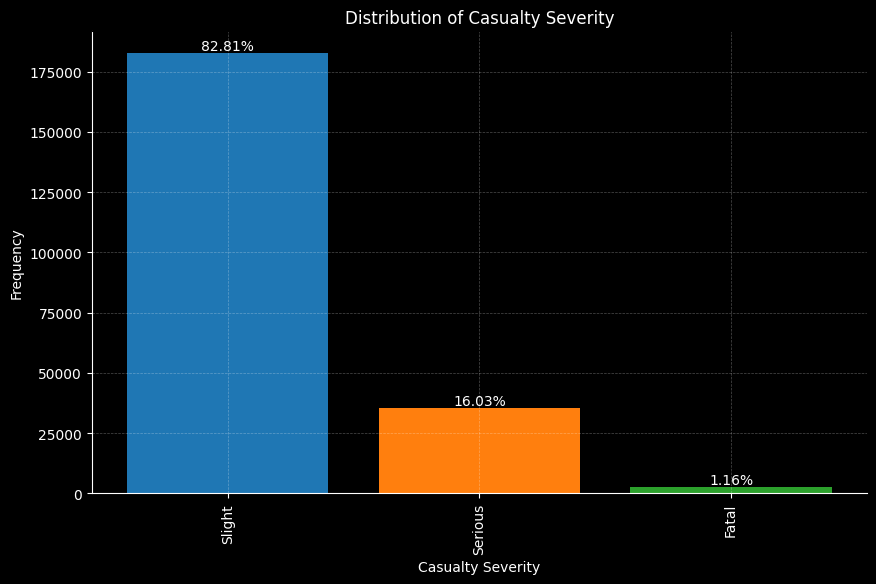

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df, 'casualty_severity', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

The casualty_severity column shows no discrepancies, with 82.8% classified as slight accidents, 16.0% as serious accidents, and just 1.2% categorized as fatal accidents.
</h4>

<h3 style="color: blue "> 35. Pedestrian Location Column
</h3> `

In [ ]:
# check unique values in the  column
df['pedestrian_location'].value_counts()

pedestrian_location
0                                                                                 204425
In carriageway, crossing elsewhere                                                  6027
In carriageway, crossing on pedestrian crossing facility                            2494
On footway or verge                                                                 2044
In carriageway, not crossing                                                        1999
Unknown or other                                                                    1576
In carriageway, crossing elsewhere within 50 metres of pedestrian crossing           859
In centre of carriageway, not on refuge, central island or central reservation       816
On refuge, central island or central reservation                                     100
In carriageway, crossing within zig-zag lines at crossing approach                    71
In carriageway, crossing within zig-zag lines at crossing exit                        22
-

In [ ]:
# Replace -1 and 0 with Unknown
df['pedestrian_location'] = df['pedestrian_location'].replace(-1, 'Unknown or other')
df['pedestrian_location'] = df['pedestrian_location'].replace(0, 'Unknown or other')


In [ ]:
# check again unique values in the  column
df['pedestrian_location'].value_counts()

pedestrian_location
Unknown or other                                                                  206003
In carriageway, crossing elsewhere                                                  6027
In carriageway, crossing on pedestrian crossing facility                            2494
On footway or verge                                                                 2044
In carriageway, not crossing                                                        1999
In carriageway, crossing elsewhere within 50 metres of pedestrian crossing           859
In centre of carriageway, not on refuge, central island or central reservation       816
On refuge, central island or central reservation                                     100
In carriageway, crossing within zig-zag lines at crossing approach                    71
In carriageway, crossing within zig-zag lines at crossing exit                        22
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

After observing discrepancies of -1 and 0 in the pedestrian_location column, we proceeded to address these issues by replacing them with 'Unknown or other', which is one of the category names in the column.
    
</h4>

<h3 style="color: blue ">36. Pedestrian Movement Column
</h3> `

In [ ]:
# check unique value count in the  column
df['pedestrian_movement'].value_counts()

pedestrian_movement
0                                                                                                          204423
Unknown or other                                                                                             4750
Crossing from driver's nearside                                                                              4719
Crossing from driver's offside                                                                               3178
In carriageway, stationary - not crossing (standing or playing)                                              1024
Crossing from driver's nearside - masked by parked or stationary vehicle                                      791
Crossing from driver's offside - masked by parked or stationary vehicle                                       600
Walking along in carriageway - back to traffic                                                                442
Walking along in carriageway - facing traffic                       

In [ ]:
# Replace -1 and 0 with Unknown
df['pedestrian_movement'] = df['pedestrian_movement'].replace(-1, 'Unknown or other')
df['pedestrian_movement'] = df['pedestrian_movement'].replace(0, 'Unknown or other')


In [ ]:
# check again unique values in the  column
df['pedestrian_location'].value_counts()

pedestrian_location
Unknown or other                                                                  206003
In carriageway, crossing elsewhere                                                  6027
In carriageway, crossing on pedestrian crossing facility                            2494
On footway or verge                                                                 2044
In carriageway, not crossing                                                        1999
In carriageway, crossing elsewhere within 50 metres of pedestrian crossing           859
In centre of carriageway, not on refuge, central island or central reservation       816
On refuge, central island or central reservation                                     100
In carriageway, crossing within zig-zag lines at crossing approach                    71
In carriageway, crossing within zig-zag lines at crossing exit                        22
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

After observing discrepancies of -1 and 0 in the pedestrian_movement column, we proceeded to address these issues by replacing them with 'Unknown or other', which is one of the category names in the column.
    
</h4>

<h3 style="color: blue ">37. Car Passenger Column
</h3> `

In [ ]:
# check unique value count in the  column
df['car_passenger'].value_counts()

car_passenger
Not a car passenger     181913
Front seat passenger     24653
Rear seat passenger      13031
-1                         631
9                          207
Name: count, dtype: int64

In [ ]:
# Replace -1 and 0 with Unknown
df['car_passenger'] = df['car_passenger'].replace(-1, 'Unknown')
df['car_passenger'] = df['car_passenger'].replace(9, 'Unknown')


In [ ]:
# check unique value count in the  column
df['car_passenger'].value_counts()

car_passenger
Not a car passenger     181913
Front seat passenger     24653
Rear seat passenger      13031
Unknown                    838
Name: count, dtype: int64

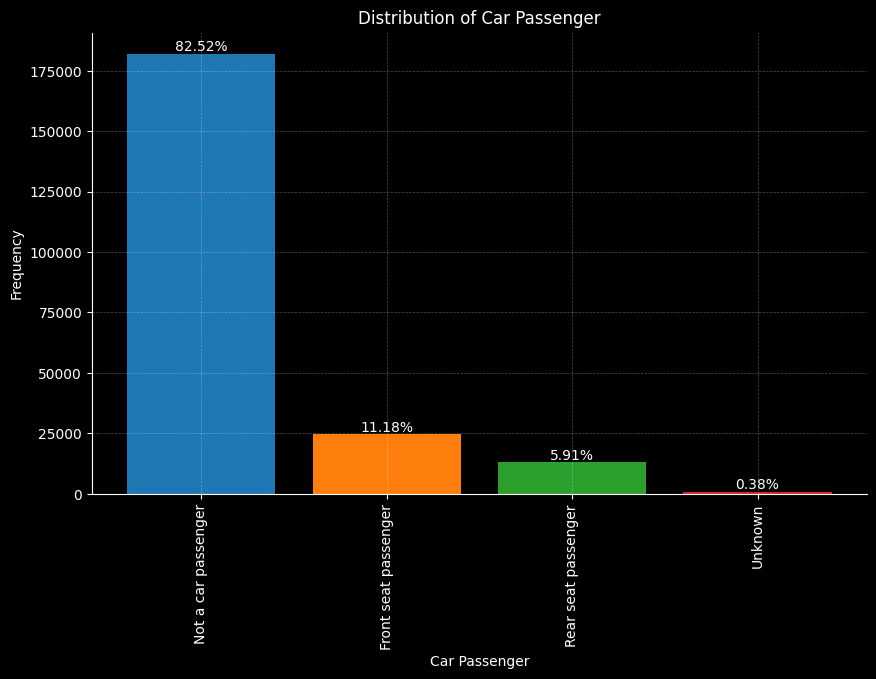

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df,'car_passenger', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully resolved the inconsistencies of -1 and 9 found in the car_passenger column by replacing them with 'Unknown'. Our plot analysis further reveals that 82.5% are classified as 'Not a car passenger', 11.2% as 'Front seat passengers', 5.9% as 'Rear seat passengers', and only 0.4% as 'Unknown'.
    
</h4>

<h3 style="color: blue ">38. Bus or Coach Passenger Column
</h3> `

In [ ]:
# check unique value count in the  column
df['bus_or_coach_passenger'].value_counts()

bus_or_coach_passenger
Not a bus or coach passenger    218493
Seated passenger                  1317
Standing passenger                 435
Alighting                           85
Boarding                            57
-1                                  34
9                                   14
Name: count, dtype: int64

In [ ]:
# Replace -1 and 0 with Unknown
df['bus_or_coach_passenger'] = df['bus_or_coach_passenger'].replace(-1, 'Unknown')
df['bus_or_coach_passenger'] = df['bus_or_coach_passenger'].replace(9, 'Unknown')

In [ ]:
# check unique value count in the  column
df['bus_or_coach_passenger'].value_counts()

bus_or_coach_passenger
Not a bus or coach passenger    218493
Seated passenger                  1317
Standing passenger                 435
Alighting                           85
Boarding                            57
Unknown                             48
Name: count, dtype: int64

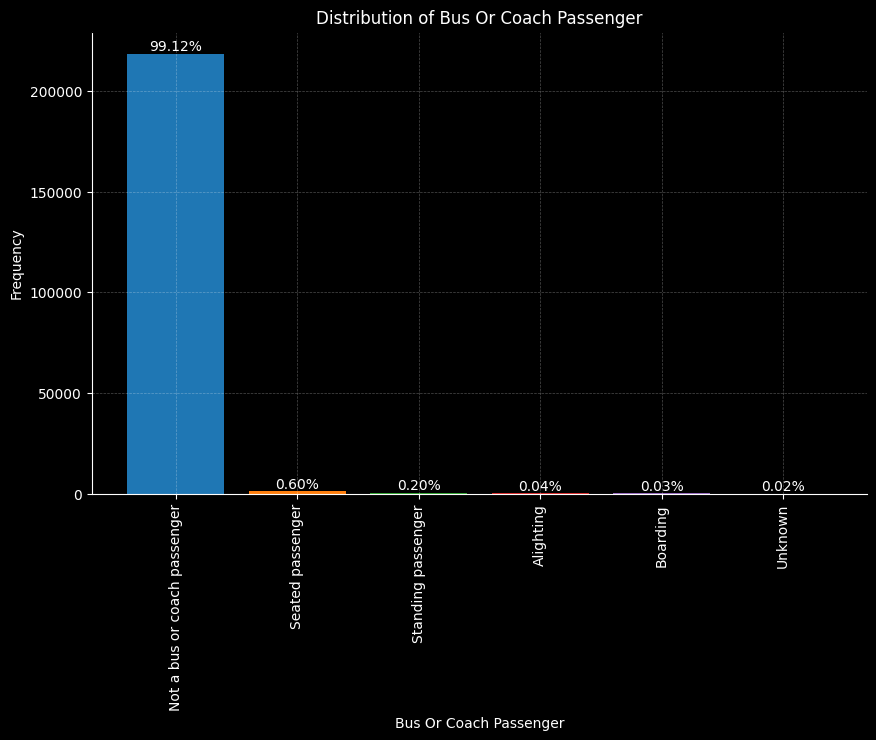

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df,'bus_or_coach_passenger', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully resolved the inconsistencies of -1 and 9 found in the bus_or_coach_passenger column by replacing them with 'Unknown'. Our plot analysis further reveals that 92.12% are classified as 'Not a bus or coach passenger', 0.60% as 'Seated passenger', 0.20% as 'Standing passengers', and Alighting, Boarding and Unknown with 0.09% altogether.
    
</h4>

<h3 style="color: blue ">39. Pedestrian Road Maintenance Worker Column
</h3> `

In [ ]:
# check unique value count in the  column
df['pedestrian_road_maintenance_worker'].value_counts()

pedestrian_road_maintenance_worker
Not applicable    219435
Not known            810
-1                   103
Yes                   87
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

We have identified an inconsistency of -1 in the pedestrian_road_maintenance_worker column. To address this issue, we will replace this inconsistency with 'Not known', as this is also one of the categories in the column.
    
</h4>

In [ ]:
# Replace -1 with Not known
df['pedestrian_road_maintenance_worker'] = df['pedestrian_road_maintenance_worker'].replace(-1, 'Not known')

In [ ]:
# check unique value count in the  column
df['pedestrian_road_maintenance_worker'].value_counts()

pedestrian_road_maintenance_worker
Not applicable    219435
Not known            913
Yes                   87
Name: count, dtype: int64

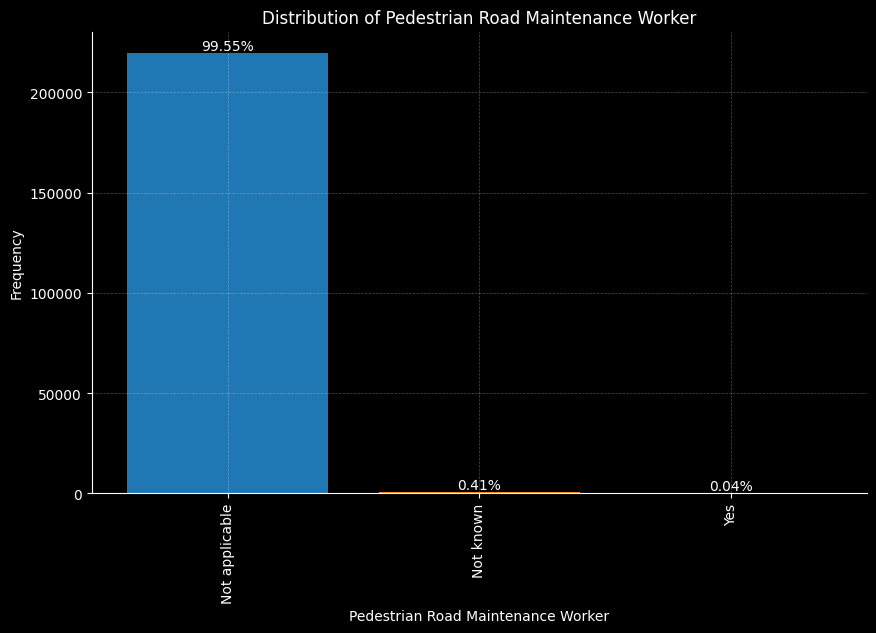

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df, 'pedestrian_road_maintenance_worker', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully resolved the inconsistencies of -1 found in the pedestrian_road_maintenance_worker column by replacing them with 'Not unknown'. Our plot analysis further reveals that 99.55% are classified as 'Not applicable', 0.41% as 'Not known', and only 0.04% as 'Yes'.
    
</h4>

<h3 style="color: blue ">40. Casualty Type Column
</h3> `

In [ ]:
# check unique value count in the  column
df['casualty_type'].value_counts()

casualty_type
9     129672
1      32442
0      16010
3      13502
5       6924
19      6912
4       2918
8       2862
11      2349
2       1908
90      1333
21       943
20       601
97       540
98       445
22       303
10       279
16       190
23       164
17       134
18         4
Name: count, dtype: int64

In [ ]:
# check unique values in the  column
df['casualty_type'].unique()

array([ 0,  9,  3,  8,  2, 11,  1, 19,  4,  5, 20, 90, 21, 23, 98, 22, 10,
       97, 17, 16, 18], dtype=int64)

In [ ]:
# check the stastitical values
df['casualty_type'].mean()

7.877914124345045

<h4 style="color: blue ">Boxplot to visualize Outliers
</h4> `

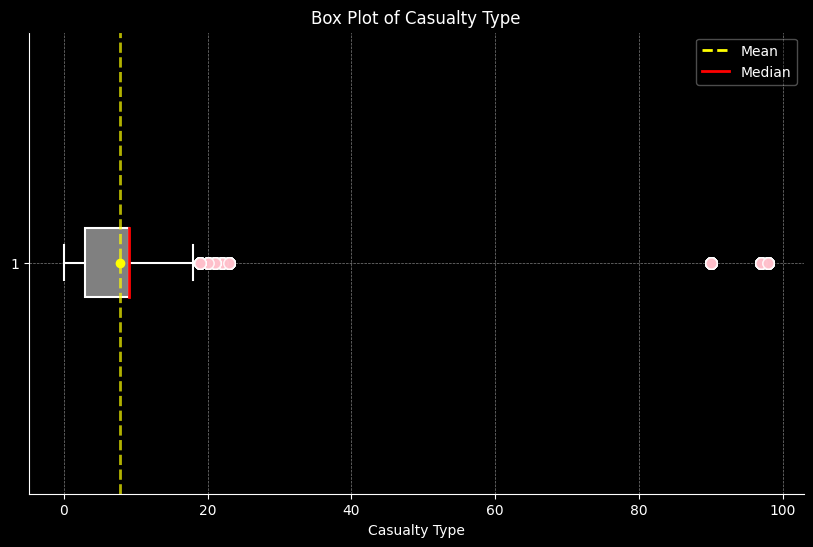

In [ ]:
# Call the function for the 'casualty_type' column
plot_boxplot(df, 'casualty_type')

<h4 style="color: red ">
Result Observation: <br>

We suspect the presence of an outlier in the 'casualty_type' column. To verify this, we will conduct a outlier test to detect any outliers in this column.
</h4>

<h4 style="color: blue ">Outlier Detection (IQR Test) in Vehicle Reference Column
</h4> `

In [ ]:
# let call our iqr_test function to check
iqr_test(df, 'casualty_type')

Outliers identified: [90 98 97]
Lower bound: -19.0 Upper bound: 45.0


<h4 style="color: blue ">Outlier Detection (Grubbs Test) in Vehicle Reference Column
</h4> `

In [ ]:
# create object of class to perform grubbs test
detector = GrubbsTest(df)
clean_data, outliers = detector.display_outliers('casualty_type')
print("Dataset without outliers marked:", clean_data)
print("Outliers identified:", outliers)

Dataset without outliers marked: [ 0  9  3  8  2 11  1 19  4  5 20 90 21 23 98 22 10 97 17 16 18]
Outliers identified: []


<h4 style="color: red ">
Result Observation: <br>

Our Grubbs test indicates that there are no outliers in the 'casualty_type' column, but IQR test confirmed we have three outliers which i agreed to. Consequently, we will go ahead treat these outliers accordingly.
    
</h4>

In [ ]:
# Step 1: Calculate the mean excluding 90, 97, 98
mean_casualty_type = df.loc[~df['casualty_type'].isin([90, 97, 98]), 'casualty_type'].mean()

# Step 2: Round the mean up to the nearest ten
mean_casualty_type_rounded = math.ceil(mean_casualty_type / 10.0) * 10

# Step 3: Replace 90, 97, 98 values with the calculated mean in the DataFrame
df['casualty_type'] = df['casualty_type'].replace([90, 97, 98], mean_casualty_type_rounded)

# Step 4: Check the unique values again in the casualty_type column
unique_values = df['casualty_type'].unique()

<h4 style="color: blue ">Boxplot After Outliers Addressed
</h4>

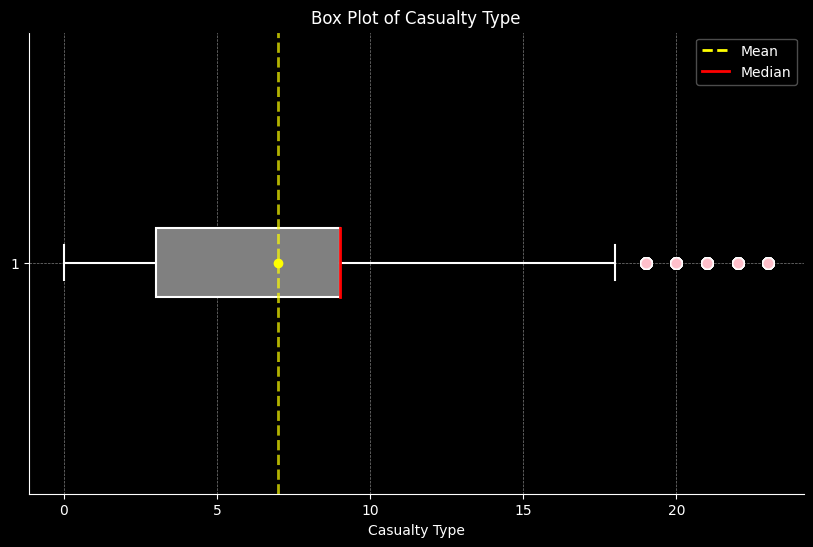

In [ ]:
# Call the function for the 'casualty_type' column
plot_boxplot(df, 'casualty_type')

<h3 style="color: blue ">41. Casualty Home Area Type Column
</h3> `

In [ ]:
# check unique value count in the  column
df['casualty_home_area_type'].value_counts()

casualty_home_area_type
Unknown            162848
3                   20616
-1                  20270
Non-UK resident     16701
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

Upon reviewing the stat form and conducting our own analysis, we've determined that only 'Non-UK resident' and 'Unknown' categories require specific identification, while the remaining entries can be categorized as 'UK resident'. Consequently, we will interpret code values of 3 and -1 as indicating 'UK resident' and proceed accordingly.
    
</h4>

In [ ]:
# Replace -1 and 3 with UK resident
df['casualty_home_area_type'] = df['casualty_home_area_type'].replace(-1, 'UK resident')
df['casualty_home_area_type'] = df['casualty_home_area_type'].replace(3, 'UK resident')

In [ ]:
# check unique value count in the  column
df['casualty_home_area_type'].value_counts()

casualty_home_area_type
Unknown            162848
UK resident         40886
Non-UK resident     16701
Name: count, dtype: int64

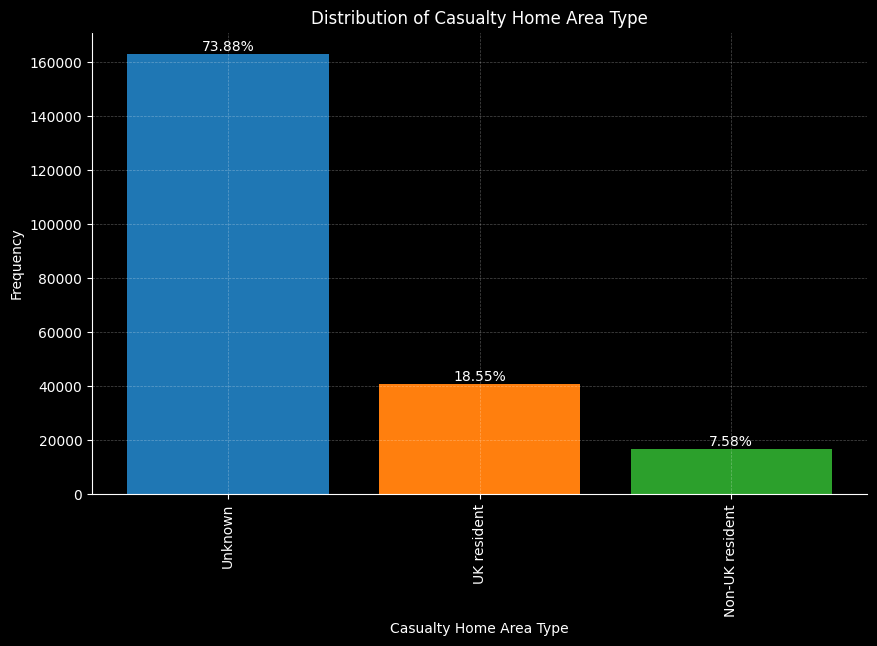

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df,'casualty_home_area_type', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully corrected the inconsistencies found in the 'casualty_home_area_type' column. The majority of entries are classified as 'Unknown', accounting for 73.88% of the total. This is followed by 'UK resident' with 18.55%, and the lowest proportion is attributed to 'Non-UK resident' with 7.58%.
    
</h4>

<h3 style="color: blue ">42. Casualty Indices of multiple deprivation (IMD) decile Column
</h3> `

In [ ]:
# check unique value count in the  column
df['casualty_imd_decile'].value_counts()

casualty_imd_decile
 2     25680
 3     24379
 1     24267
 4     22110
 5     20875
-1     20559
 6     19538
 7     17742
 8     16229
 9     15700
 10    13356
Name: count, dtype: int64

In [ ]:
df['casualty_imd_decile'].describe()

count    220435.000000
mean          4.387389
std           3.172119
min          -1.000000
25%           2.000000
50%           4.000000
75%           7.000000
max          10.000000
Name: casualty_imd_decile, dtype: float64

<h4 style="color: red ">
Result Observation: <br>

As the IMD decile ranks areas from 1 to 10, with decile 1 representing the most deprived areas and decile 10 representing the least deprived areas according to official (sources: <a href="https://www.gov.uk/government/statistics/reported-road-casualties-great-britain-casualties-and-deprivation-factsheet-england/reported-road-casualties-great-britain-casualties-and-deprivation">UK GOVERNMENT</a>
 ), it is imperative to address the erroneous value of -1 for consistency. <br>
    
A reasonable approach to address this error is to replace the -1 values with 5. Considering that the IMD decile ranks areas from 1 to 10, with decile 1 representing the most deprived areas and decile 10 representing the least deprived areas, assigning a value of 5 implies a midpoint between these extremes. Therefore, replacing -1 with 5 indicates that the area is neither the most nor the least deprived.
    
</h4>

In [ ]:
# Replace -1 with 5
df['casualty_imd_decile'] = df['casualty_imd_decile'].replace(-1, 5)

In [ ]:
# check unique value count in the  column
df['casualty_imd_decile'].value_counts()

casualty_imd_decile
5     41434
2     25680
3     24379
1     24267
4     22110
6     19538
7     17742
8     16229
9     15700
10    13356
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the error values in the 'casualty_imd_decile' column.
    
</h4>


<h1 style="color: blue "> VEHICLE VARIABLES
</h1>

<h3 style="color: blue ">43. Vehicle Reference Column
</h3> `

In [ ]:
# check unique value count in the  column
df['vehicle_reference'].value_counts()

vehicle_reference
1      115535
2       86333
3       13530
4        3373
5         984
6         384
7         151
8          82
9          29
10         18
11         10
12          3
13          2
999         1
Name: count, dtype: int64

In [ ]:
# check unique value count in the  column
df['vehicle_reference'].unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11, 999,  12,
        13], dtype=int64)

<h4 style="color: red ">
Result Observation: <br>

Based on our observations, it appears that there may be outlier values present in the Vehicle Reference Column. To address this, we will conduct a Grubbs test. Given that the Grubbs test examines outliers one at a time within a given array, we will implement a function and loop to iteratively identify all outliers.
</h4>

<h4 style="color: blue ">Boxplot to Visualize Outliers
</h4> `

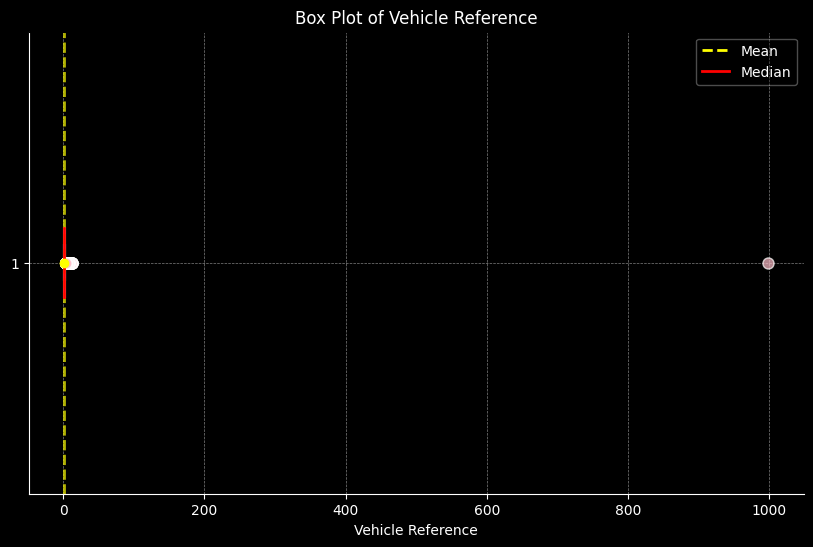

In [ ]:
# Call the function for the 'casualty_reference' column
plot_boxplot(df, 'vehicle_reference')

<h4 style="color: blue ">Outlier Detection (IQR Test) in Vehicle Reference Column
</h4> `

In [ ]:
# let call our iqr_test function to check
iqr_test(df, 'vehicle_reference')

Outliers identified: [999]
Lower bound: -5.5 Upper bound: 20.5


<h4 style="color: blue ">Outlier Detection (Grubbs Test) in Vehicle Reference Column
</h4> `

In [ ]:
# create object of class
detector = GrubbsTest(df)
clean_data, outliers = detector.display_outliers('vehicle_reference')
print("Dataset without outliers marked:", clean_data)
print("Outliers identified:", outliers)

Dataset without outliers marked: [ 1  2  3  4  5  6  7  8  9 10 11 12 13]
Outliers identified: [999]


<h4 style="color: red ">
Result Observation: <br>

Following the execution of the Grubbs test, outlier with the value 999 was identified within the Vehicle Reference Column. Our next step involves conducting a thorough investigation to determine the most appropriate way to address this outlier.
</h4>

In [ ]:
# check rows having the outliers 992
df[df['vehicle_reference'] == 999]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
68466,2020100942290,2020,100942290,440419.0,559182.0,-1.370865,54.925705,Northumbria,Serious,2,1,2020-03-23,Monday,16:00,150,Sunderland,Sunderland,Unclassified,0,Single carriageway,30,T or staggered junction,Give way or uncontrolled,Unclassified,0,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01008792,520838,1,Driver or rider,Male,15,3,Serious,Unknown or other,Unknown or other,Not a car passenger,Not a bus or coach passenger,Not applicable,1,Unknown,7,736901,999,Pedal cycle,No tow or articulation,Going ahead other,South,North,On main carriageway - not in restricted lane,Approaching junction or waiting/parked at junc...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Not known,Male,15,3,-1,-1,-1,-1,7,Unknown


In [ ]:
# check all the vehicles involved in the accident
df[68464:68468]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
68464,2020100942038,2020,100942038,399045.0,652615.0,-2.016799,55.766874,Northumbria,Slight,2,1,2020-03-22,Sunday,12:00,139,Northumberland,Northumberland,A,698,Single carriageway,30,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,Rural Area,No,Non-trunk road,E01027387,520837,1,Driver or rider,Male,73,10,Slight,Unknown or other,Unknown or other,Not a car passenger,Not a bus or coach passenger,Not applicable,9,Unknown,10,736899,2,Car,No tow or articulation,Going ahead other,West,East,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Other,Male,73,10,1339,1,5,HONDA JAZZ,10,Unknown
68465,2020100942290,2020,100942290,440419.0,559182.0,-1.370865,54.925705,Northumbria,Serious,2,1,2020-03-23,Monday,16:00,150,Sunderland,Sunderland,Unclassified,0,Single carriageway,30,T or staggered junction,Give way or uncontrolled,Unclassified,0,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01008792,520838,1,Driver or rider,Male,15,3,Serious,Unknown or other,Unknown or other,Not a car passenger,Not a bus or coach passenger,Not applicable,1,Unknown,7,736900,2,Car,No tow or articulation,Going ahead other,East,West,On main carriageway - not in restricted lane,Approaching junction or waiting/parked at junc...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,No,Other,Male,48,8,1499,2,3,FORD FOCUS,5,Unknown
68466,2020100942290,2020,100942290,440419.0,559182.0,-1.370865,54.925705,Northumbria,Serious,2,1,2020-03-23,Monday,16:00,150,Sunderland,Sunderland,Unclassified,0,Single carriageway,30,T or staggered junction,Give way or uncontrolled,Unclassified,0,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01008792,520838,1,Driver or rider,Male,15,3,Serious,Unknown or other,Unknown or other,Not a car passenger,Not a bus or coach passenger,Not applicable,1,Unknown,7,736901,999,Pedal cycle,No tow or articulation,Going ahead other,South,North,On main carriageway - not in restricted lane,Approaching junction or waiting/parked at junc...,"No skidding, jack-knifing or overturning",None

<h4 style="color: red ">
Result Observation: <br>

From our analysis, it is evident that only two vehicles are involved in this accident having accident_index of	2020100942290. According to the stat form, vehicle reference numbers must be unique and in sequence. As the number 2 has already been allocated to the first vehicle, we will allocate 1 to the second vehicle by replacing the outlier (999) with 1.
</h4>

In [ ]:
# Replace -1 with 5
df['vehicle_reference'] = df['vehicle_reference'].replace(999, 1)

In [ ]:
# check unique value count in the  column
df['vehicle_reference'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13], dtype=int64)

<h4 style="color: blue ">Boxplot After Outliers Addressed
</h4> `

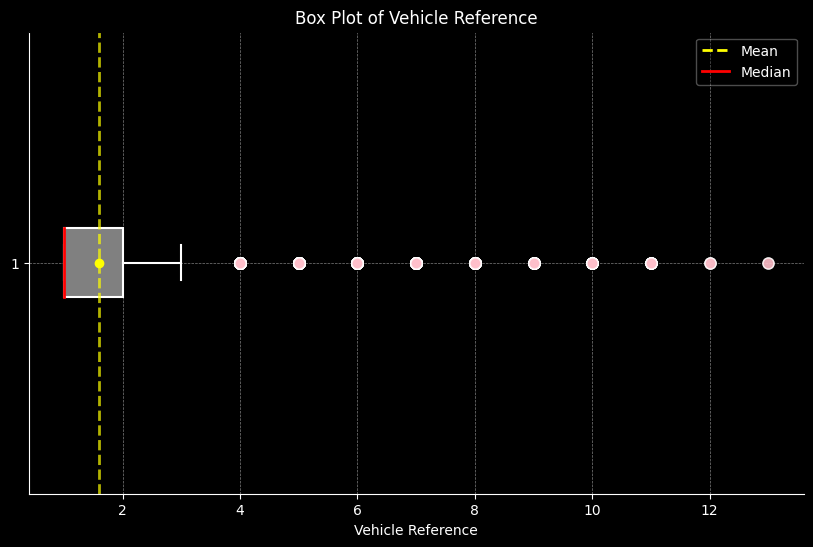

In [ ]:
# Call the function for the 'casualty_type' column
plot_boxplot(df, 'vehicle_reference')

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the error values in the 'vehicle_reference' column.
    
</h4>

<h3 style="color: blue ">44. Vehicle Type Column
</h3>

In [ ]:
# check unique value count in the  column
df['vehicle_type'].value_counts()

vehicle_type
Car                                                                  158331
Pedal cycle                                                           17458
Van/Goods vehicle 3.5 tonnes maximum gross weight (mgw) and under     13647
Motorcycle over 50cc and up to 125cc                                   8026
Motorcycle over 500cc                                                  4393
Goods vehicle 7.5 tonnes mgw and over                                  3385
Taxi/Private hire car                                                  3355
Bus or coach (17 or more passenger seats)                              2921
Motorcycle over 125cc and up to 500cc                                  1863
Other vehicle                                                          1412
Goods vehicle – unknown weight                                         1372
Goods vehicle over 3.5 tonnes and under 7.5 tonnes mgw                 1237
Motorcycle 50cc and under                                              1194

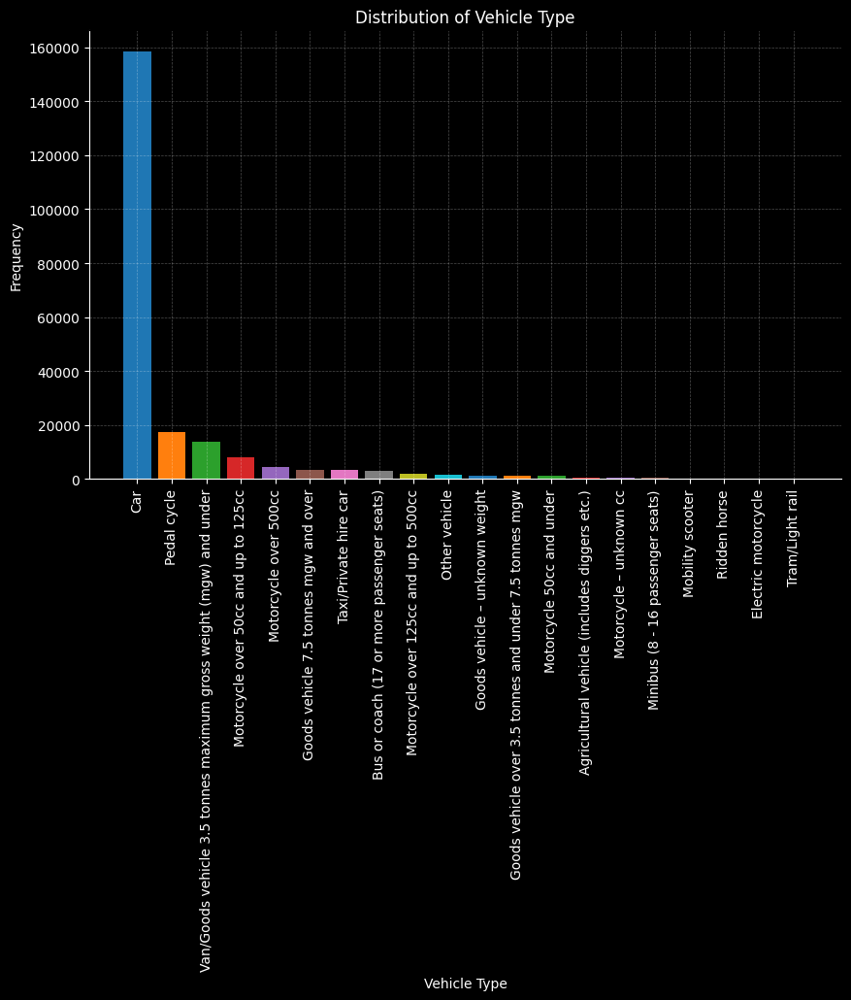

In [ ]:
# Plot the bar chart
plot_distribution(df, 'vehicle_type')

<h4 style="color: red ">
Result Observation: <br>

Based on the analysis, there are no inconsistencies observed in the 'vehicle_type' column. The most frequently involved vehicle type in accidents is the Car, with 158,331 occurrences (71.83%), while the least involved is the Tram/Light rail, with only 11 occurrences.
    
</h4>

<h3 style="color: blue ">45. Towing and Articulation Column
</h3>

In [ ]:
# check unique value count in the  column
df['towing_and_articulation'].value_counts()

towing_and_articulation
No tow or articulation        212615
9                               3942
Articulated vehicle             1800
-1                               816
Single trailer                   815
Other tow                        303
Caravan                          117
Double or multiple trailer        27
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

It appears that there are inconsistencies present in the 'towing_and_articulation' column. To rectify these erroneous values, we will replace occurrences of 9 and -1 with 'Unknown'.
</h4>

In [ ]:
# Replace -1 with Unknown
df['towing_and_articulation'] = df['towing_and_articulation'].replace(-1, 'Unknown')
# Replace 9 with Unknown
df['towing_and_articulation'] = df['towing_and_articulation'].replace(9, 'Unknown')

In [ ]:
# check unique value count in the  column
df['towing_and_articulation'].value_counts()

towing_and_articulation
No tow or articulation        212615
Unknown                         4758
Articulated vehicle             1800
Single trailer                   815
Other tow                        303
Caravan                          117
Double or multiple trailer        27
Name: count, dtype: int64

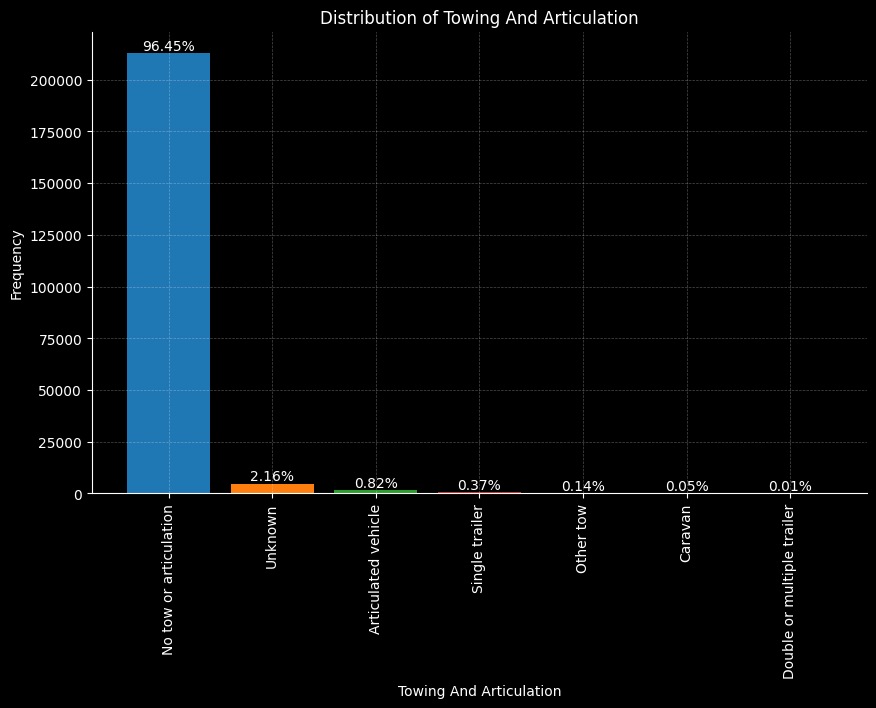

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df, 'towing_and_articulation', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'towing_and_articulation' column. The majority of entries are categorized as 'No tow or articulation', accounting for 96.45% of the total, while 'Double or multiple trailer' represents the lowest proportion with only 0.01%.
    
</h4>

<h3 style="color: blue ">46. Vehicle Manoeuvre Column
</h3>

In [ ]:
# check unique value count in the  column
df['vehicle_manoeuvre'].value_counts()

vehicle_manoeuvre
Going ahead other                               105203
Turning right                                    18950
99                                               14142
Slowing or stopping                              12936
Waiting to go ahead but held up                  10045
Parked                                            9488
Moving off                                        9133
Going ahead right hand bend                       7763
Going ahead left hand bend                        6860
Turning left                                      6634
Overtaking moving vehicle on its offside          4041
Waiting to turn right                             3185
Reversing                                         2381
Changing lane to right                            1753
Overtaking stationary vehicle on its offside      1677
U turn                                            1559
Changing lane to left                             1532
Overtaking on nearside                         

<h4 style="color: red ">
Result Observation: <br>

It appears that there are inconsistencies present in the 'vehicle_manoeuvre	' column. To rectify these erroneous values, we will replace occurrences of 99 and -1 with 'Unknown'.
</h4>

In [ ]:
# Replace -1 with Unknown
df['vehicle_manoeuvre'] = df['vehicle_manoeuvre'].replace(-1, 'Unknown')
# Replace 99 with Unknown
df['vehicle_manoeuvre'] = df['vehicle_manoeuvre'].replace(99, 'Unknown')

In [ ]:
# check unique value count in the  column
df['vehicle_manoeuvre'].value_counts()

vehicle_manoeuvre
Going ahead other                               105203
Turning right                                    18950
Unknown                                          14973
Slowing or stopping                              12936
Waiting to go ahead but held up                  10045
Parked                                            9488
Moving off                                        9133
Going ahead right hand bend                       7763
Going ahead left hand bend                        6860
Turning left                                      6634
Overtaking moving vehicle on its offside          4041
Waiting to turn right                             3185
Reversing                                         2381
Changing lane to right                            1753
Overtaking stationary vehicle on its offside      1677
U turn                                            1559
Changing lane to left                             1532
Overtaking on nearside                         

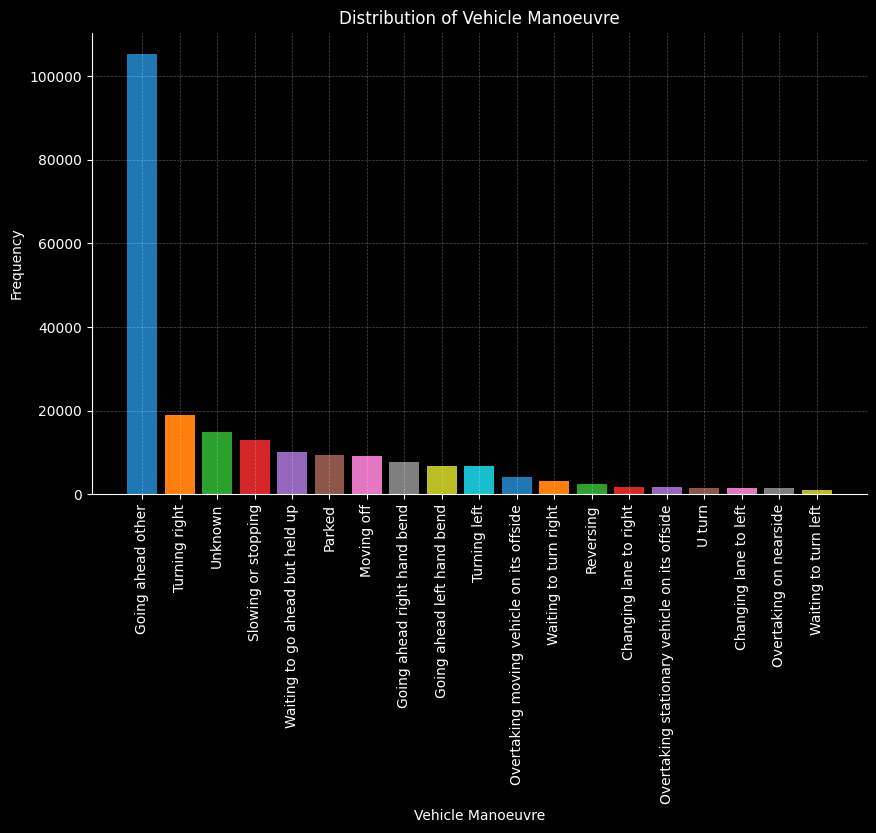

In [ ]:
# Plot the bar chart
plot_distribution(df, 'vehicle_manoeuvre')

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'vehicle_manoeuvre' column. The majority of entries are categorized as 'Going ahead other', accounting for 47.73% of the total, while 'Waiting to turn left' represents the lowest proportion with only 0.43%.
    
</h4>

<h3 style="color: blue ">47. Vehicle Direction from Column
</h3>

In [ ]:
# check unique value count in the  column
df['vehicle_direction_from'].value_counts()

vehicle_direction_from
North         33993
South         31343
East          29636
West          28729
North east    18420
South west    18327
North west    17405
South east    17115
Unknown       14291
Parked         9214
-1             1962
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

We have identified inconsistencies of -1 in the 'vehicle_direction_from' column. To address this issue, we will replace these inconsistencies with 'Unknown', as 'Unknown' is already included as one of the entries in the 'vehicle_direction_from' column.
    
</h4>

In [ ]:
# Replace -1 with Unknown
df['vehicle_direction_from'] = df['vehicle_direction_from'].replace(-1, 'Unknown')

In [ ]:
# check unique value count in the  column
df['vehicle_direction_from'].value_counts()

vehicle_direction_from
North         33993
South         31343
East          29636
West          28729
North east    18420
South west    18327
North west    17405
South east    17115
Unknown       16253
Parked         9214
Name: count, dtype: int64

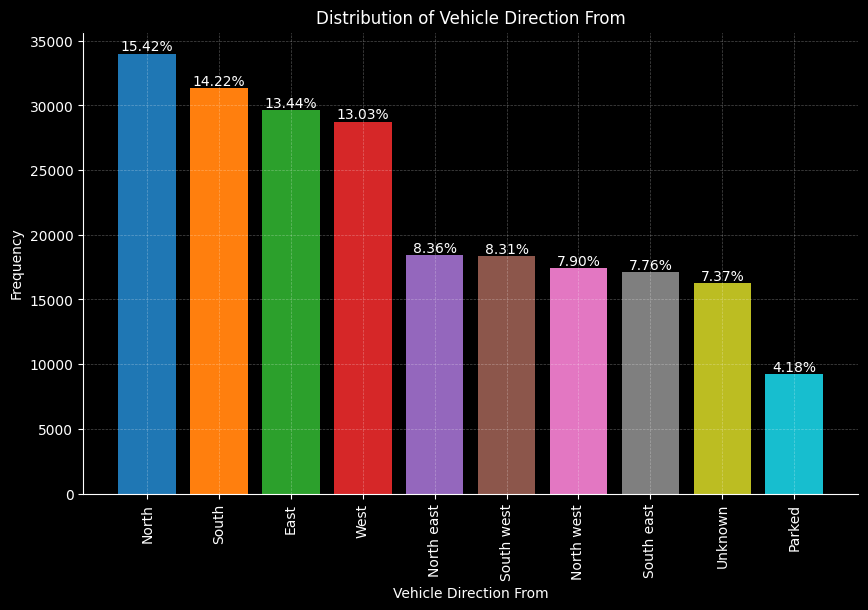

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df,'vehicle_direction_from', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'vehicle_direction_from' column. The highest entries are categorized as 'North', accounting for 15.42% of the total, while 'Parked' represents the lowest proportion with only 4.18%.
    
</h4>

<h3 style="color: blue "> 48. Vehicle Direction to Column
</h3>

In [ ]:
# check unique value count in the  column
df['vehicle_direction_to'].value_counts()

vehicle_direction_to
South         32422
North         31112
West          29540
East          29390
North east    19448
South west    18105
South east    17837
North west    17372
Unknown       14291
Parked         8939
-1             1979
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

We have identified inconsistencies of -1 in the 'vehicle_direction_to' column. To address this issue, we will replace these inconsistencies with 'Unknown', as 'Unknown' is already included as one of the entries in the 'vehicle_direction_from' column.
    
</h4>

In [ ]:
# Replace -1 with Unknown
df['vehicle_direction_to'] = df['vehicle_direction_to'].replace(-1, 'Unknown')

In [ ]:
# check unique value count in the  column
df['vehicle_direction_to'].value_counts()

vehicle_direction_to
South         32422
North         31112
West          29540
East          29390
North east    19448
South west    18105
South east    17837
North west    17372
Unknown       16270
Parked         8939
Name: count, dtype: int64

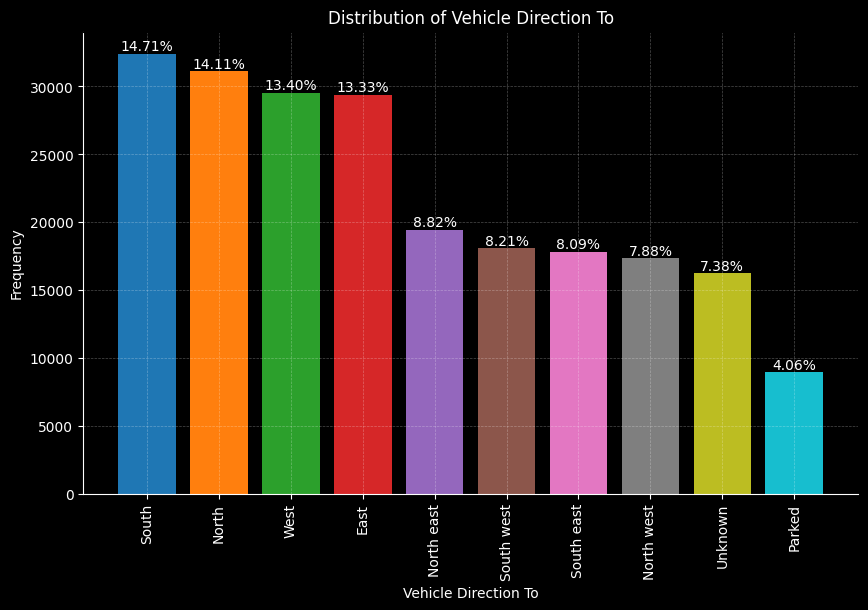

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df,'vehicle_direction_to', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'vehicle_direction_from' column. The highest entries are categorized as 'South', accounting for 14.71% of the total, while 'Parked' still represents the lowest proportion with only 4.06%.
    
</h4>

<h3 style="color: blue ">49. Vehicle Location Restricted Lane Column
</h3>

In [ ]:
# check unique value count in the  column
df['vehicle_location_restricted_lane'].value_counts()

vehicle_location_restricted_lane
On main carriageway - not in restricted lane                     199546
99                                                                13620
Footway (pavement)                                                 3003
Bus lane                                                            846
On lay-by or hard shoulder                                          840
-1                                                                  773
Cycle lane (on main carriageway)                                    742
Cycleway or shared use footway (not part of main carriageway)       360
Leaving lay-by or hard shoulder                                     303
Tram/Light rail track                                               173
Entering lay-by or hard shoulder                                    156
Busway (including guided busway)                                     73
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

It appears that there are inconsistencies present in the 'vehicle_location_restricted_lane	' column. To rectify these erroneous values, we will replace occurrences of 99 and -1 with 'Unknown'.
</h4>

In [ ]:
# Replace -1 with Unknown
df['vehicle_location_restricted_lane'] = df['vehicle_location_restricted_lane'].replace(-1, 'Unknown')
# Replace 99 with Unknown
df['vehicle_location_restricted_lane'] = df['vehicle_location_restricted_lane'].replace(99, 'Unknown')

In [ ]:
# check unique value count in the  column
df['vehicle_location_restricted_lane'].value_counts()

vehicle_location_restricted_lane
On main carriageway - not in restricted lane                     199546
Unknown                                                           14393
Footway (pavement)                                                 3003
Bus lane                                                            846
On lay-by or hard shoulder                                          840
Cycle lane (on main carriageway)                                    742
Cycleway or shared use footway (not part of main carriageway)       360
Leaving lay-by or hard shoulder                                     303
Tram/Light rail track                                               173
Entering lay-by or hard shoulder                                    156
Busway (including guided busway)                                     73
Name: count, dtype: int64

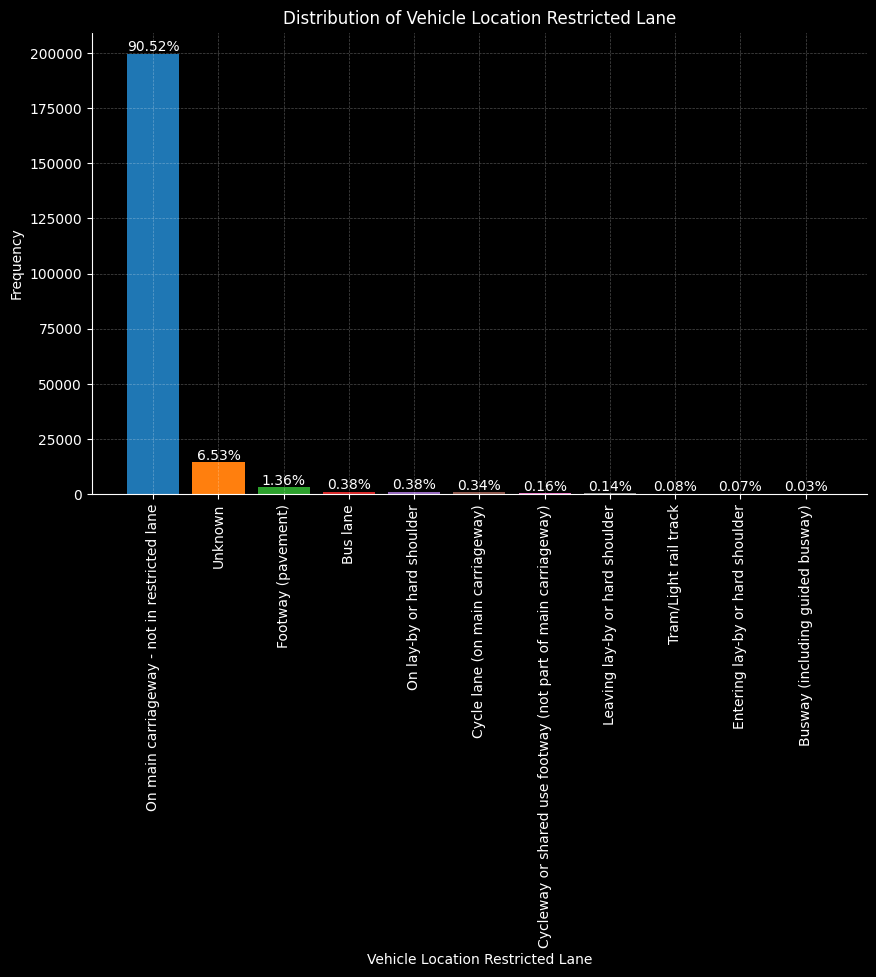

In [ ]:
# Plot the bar chart
plot_distribution(df, 'vehicle_location_restricted_lane', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'Vehicle Location Restricted Lane' column. The majority of entries are categorized as 'On main carriageway - not in restricted lane', accounting for 90.52% of the total, while 'Busway (including guided busway)' represents the lowest proportion with only 0.03%.
    
</h4>

<h3 style="color: blue ">50. Junction Location Column
</h3>

In [ ]:
# check unique value count in the  column
df['junction_location'].value_counts()

junction_location
Not at, or within 20 metres of, junction                       92981
Approaching junction or waiting/parked at junction approach    47981
Mid junction - on roundabout or on main road                   33683
Cleared junction or waiting/parked at junction exit            11470
9                                                              10211
Entering main road                                              8714
Entering roundabout                                             6240
Leaving main road                                               4806
Leaving roundabout                                              3264
Entering from slip road                                          716
-1                                                               369
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

It appears that there are inconsistencies present in the 'junction_location	' column. To rectify these erroneous values, we will replace occurrences of 9 and -1 with 'Unknown'.
</h4>

In [ ]:
# Replace -1 with Unknown
df['junction_location'] = df['junction_location'].replace(-1, 'Unknown')
# Replace 9 with Unknown
df['junction_location'] = df['junction_location'].replace(9, 'Unknown')

In [ ]:
# check unique value count in the  column
df['junction_location'].value_counts()

junction_location
Not at, or within 20 metres of, junction                       92981
Approaching junction or waiting/parked at junction approach    47981
Mid junction - on roundabout or on main road                   33683
Cleared junction or waiting/parked at junction exit            11470
Unknown                                                        10580
Entering main road                                              8714
Entering roundabout                                             6240
Leaving main road                                               4806
Leaving roundabout                                              3264
Entering from slip road                                          716
Name: count, dtype: int64

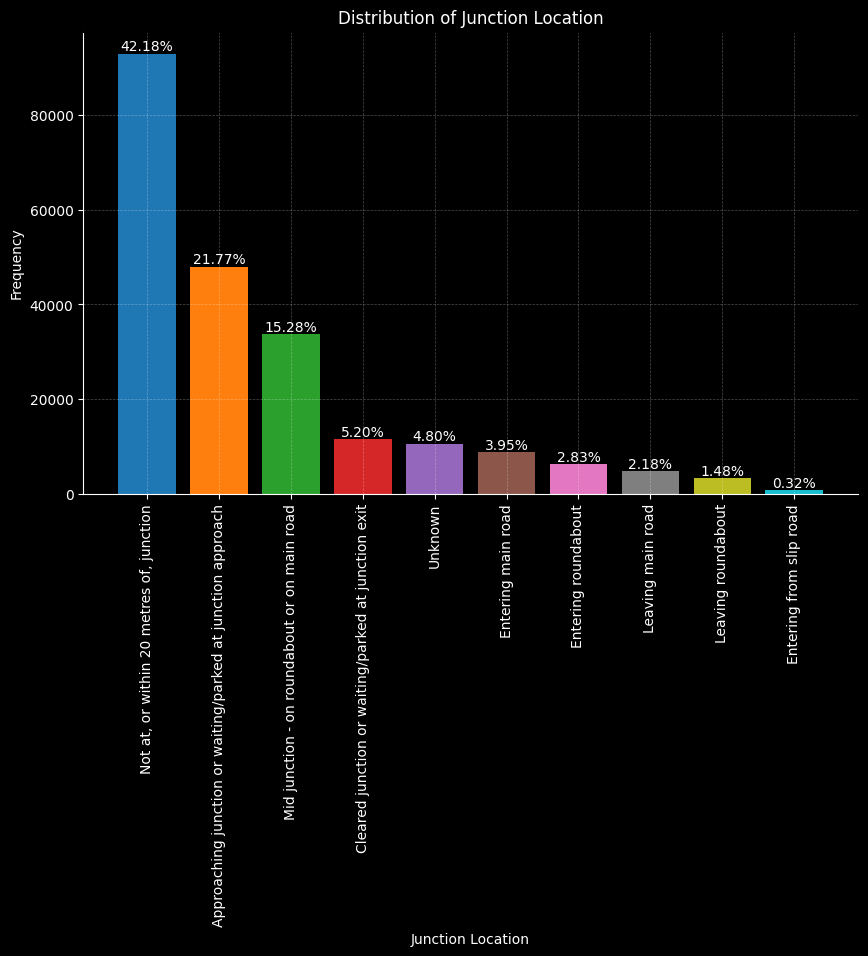

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df,'junction_location', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'junction_location' column. The majority of entries are categorized as 'Not at, or within 20 metres of, junction', accounting for 42.18% of the total, while 'Entering from slip road' represents the lowest proportion with only 0.32%.
    
</h4>

<h3 style="color: blue ">51. Skidding and Overturning Column
</h3>

In [ ]:
# check unique value count in the  column
df['skidding_and_overturning'].value_counts()

skidding_and_overturning
No skidding, jack-knifing or overturning    181099
Skidded                                      14735
9                                            14355
Overturned                                    5495
Skidded and overturned                        3836
-1                                             815
Jack-knifed                                     66
Jack-knifed and overturned                      34
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

It also appears that there are inconsistencies present in the 'skidding_and_overturning' column. To rectify these erroneous values, we will replace occurrences of 9 and -1 with 'Unknown'.
</h4>

In [ ]:
# Replace -1 with Unknown
df['skidding_and_overturning'] = df['skidding_and_overturning'].replace(-1, 'Unknown')
# Replace 9 with Unknown
df['skidding_and_overturning'] = df['skidding_and_overturning'].replace(9, 'Unknown')

In [ ]:
# check unique value count in the  column
df['skidding_and_overturning'].value_counts()

skidding_and_overturning
No skidding, jack-knifing or overturning    181099
Unknown                                      15170
Skidded                                      14735
Overturned                                    5495
Skidded and overturned                        3836
Jack-knifed                                     66
Jack-knifed and overturned                      34
Name: count, dtype: int64

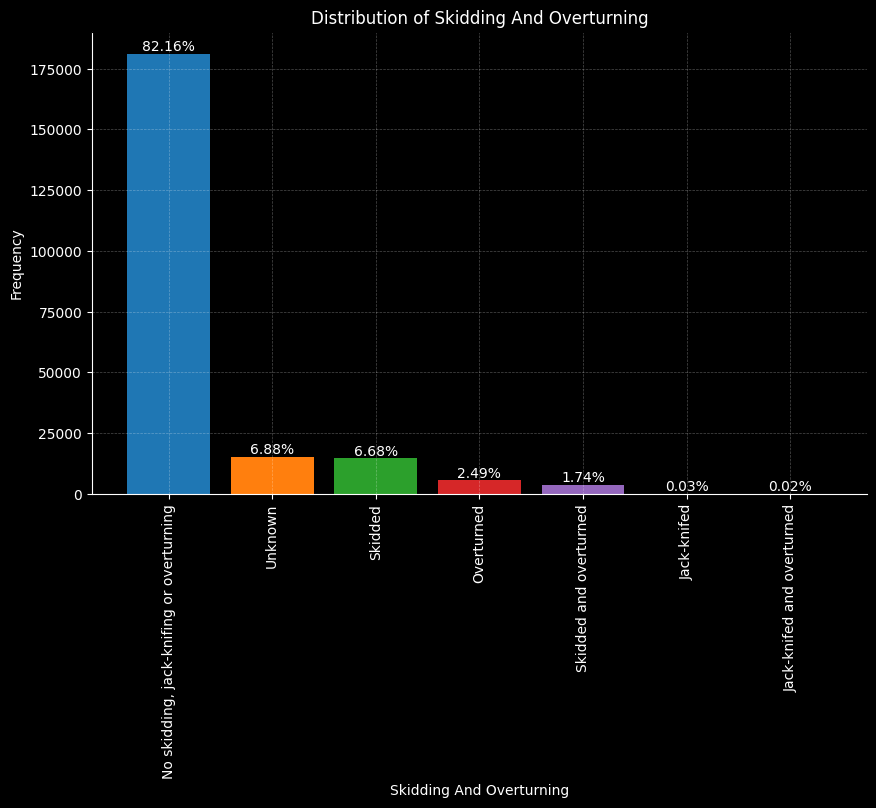

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df,'skidding_and_overturning', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'skidding_and_overturning' column. The majority of entries are categorized as 'No skidding, jack-knifing or overturning', accounting for 82.16% of the total, while 'Jack-knifed and overturned' represents the lowest proportion with only 0.02%.
    
</h4>

<h3 style="color: blue ">52. Hit Object in Carriageway Column
</h3>

In [ ]:
# check unique value count in the  column
df['hit_object_in_carriageway'].value_counts()

hit_object_in_carriageway
None                                194123
99                                   13927
Parked vehicle                        4238
Kerb                                  3604
Bollard/Refuge                        1262
Other object                          1055
-1                                     780
Central island of roundabout           296
Open door of vehicle                   288
Any animal (except ridden horse)       260
Previous accident                      199
Bridge - side                          182
Roadworks                              155
Bridge - roof                           66
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

It also appears that there are inconsistencies present in the 'hit_object_in_carriageway' column. To rectify these erroneous values, we will replace occurrences of 99 and -1 with 'Unknown'.
</h4>

In [ ]:
# Replace -1 with Unknown
df['hit_object_in_carriageway'] = df['hit_object_in_carriageway'].replace(-1, 'Unknown')
# Replace 99 with Unknown
df['hit_object_in_carriageway'] = df['hit_object_in_carriageway'].replace(99, 'Unknown')

In [ ]:
# check unique value count in the  column
df['hit_object_in_carriageway'].value_counts()

hit_object_in_carriageway
None                                194123
Unknown                              14707
Parked vehicle                        4238
Kerb                                  3604
Bollard/Refuge                        1262
Other object                          1055
Central island of roundabout           296
Open door of vehicle                   288
Any animal (except ridden horse)       260
Previous accident                      199
Bridge - side                          182
Roadworks                              155
Bridge - roof                           66
Name: count, dtype: int64

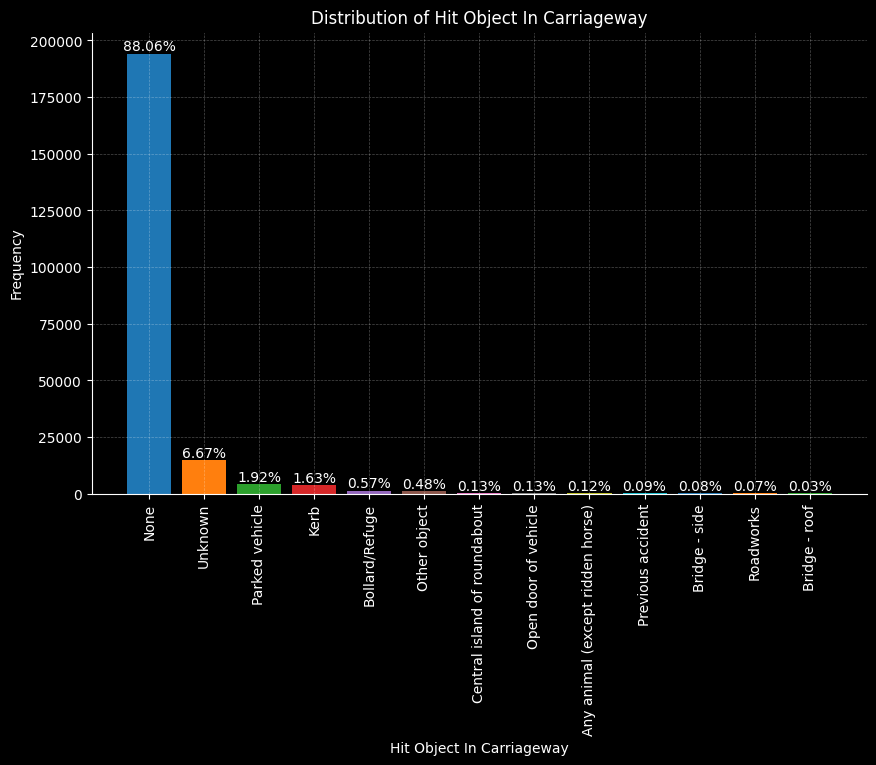

In [ ]:
# Plot the bar chart
plot_distribution(df, 'hit_object_in_carriageway', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'hit_object_in_carriageway' column. The majority of entries are categorized as 'None', accounting for 88.06% of the total, while 'Bridge - roof' represents the lowest proportion with only 0.03%.
    
</h4>

<h3 style="color: blue ">53. Vehicle Leaving Carriageway Column
</h3>

In [ ]:
# check unique value count in the  column
df['vehicle_leaving_carriageway'].value_counts()

vehicle_leaving_carriageway
Did not leave carriageway                                          180195
9                                                                   13707
Left carriageway nearside                                           13441
Left carriageway offside                                             6968
Left carriageway nearside and rebounded                              1665
Left carriageway straight ahead at junction                          1197
Left carriageway offside and rebounded                                894
-1                                                                    798
Left carriageway offside onto central reservation                     797
Left carriageway offside onto central reservation and rebounded       518
Left carriageway offside and crossed central reservation              255
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

It also appears that there are inconsistencies present in the 'vehicle_leaving_carriageway' column. To rectify these erroneous values, we will replace occurrences of 9 and -1 with 'Unknown'.
</h4>

In [ ]:
# Replace -1 with Unknown
df['vehicle_leaving_carriageway'] = df['vehicle_leaving_carriageway'].replace(-1, 'Unknown')
# Replace 9 with Unknown
df['vehicle_leaving_carriageway'] = df['vehicle_leaving_carriageway'].replace(9, 'Unknown')

In [ ]:
# check unique value count in the  column
df['vehicle_leaving_carriageway'].value_counts()

vehicle_leaving_carriageway
Did not leave carriageway                                          180195
Unknown                                                             14505
Left carriageway nearside                                           13441
Left carriageway offside                                             6968
Left carriageway nearside and rebounded                              1665
Left carriageway straight ahead at junction                          1197
Left carriageway offside and rebounded                                894
Left carriageway offside onto central reservation                     797
Left carriageway offside onto central reservation and rebounded       518
Left carriageway offside and crossed central reservation              255
Name: count, dtype: int64

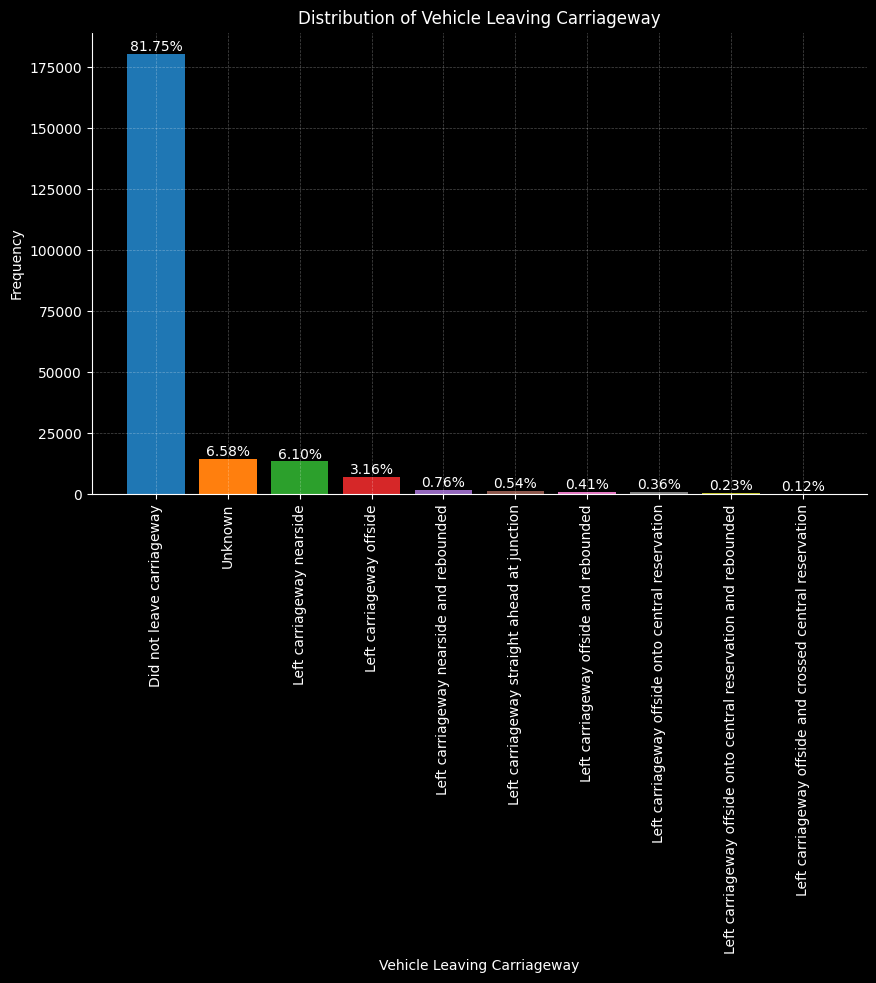

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df,'vehicle_leaving_carriageway', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'hit_object_in_carriageway' column. The majority of entries are categorized as 'Did not leave carriageway', accounting for 88.06% of the total, while 'Left carriageway offside and crossed central reservation' represents the lowest proportion with only 0.12%.
    
</h4>

<h3 style="color: blue ">54. Hit Object off Carriageway Column
</h3>

In [ ]:
# check unique value count in the  column
df['hit_object_off_carriageway'].value_counts()

hit_object_off_carriageway
None                                 191222
99                                    14042
Wall or fence                          3204
Tree                                   2822
Other permanent object                 2577
Road sign/Traffic signal               1476
Entered ditch                          1439
Lamp post                              1226
Nearside or offside crash barrier       974
Central crash barrier                   867
Telegraph pole/Electricity pole         454
Bus stop/Bus shelter                    102
Submerged in water (completely)          25
-1                                        5
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

It also appears that there are inconsistencies present in the 'hit_object_off_carriageway' column. To rectify these erroneous values, we will replace occurrences of 99 and -1 with 'Unknown'.
</h4>

In [ ]:
# Replace -1 with Unknown
df['hit_object_off_carriageway'] = df['hit_object_off_carriageway'].replace(-1, 'Unknown')
# Replace 99 with Unknown
df['hit_object_off_carriageway'] = df['hit_object_off_carriageway'].replace(99, 'Unknown')

In [ ]:
# check unique value count in the  column
df['hit_object_off_carriageway'].value_counts()

hit_object_off_carriageway
None                                 191222
Unknown                               14047
Wall or fence                          3204
Tree                                   2822
Other permanent object                 2577
Road sign/Traffic signal               1476
Entered ditch                          1439
Lamp post                              1226
Nearside or offside crash barrier       974
Central crash barrier                   867
Telegraph pole/Electricity pole         454
Bus stop/Bus shelter                    102
Submerged in water (completely)          25
Name: count, dtype: int64

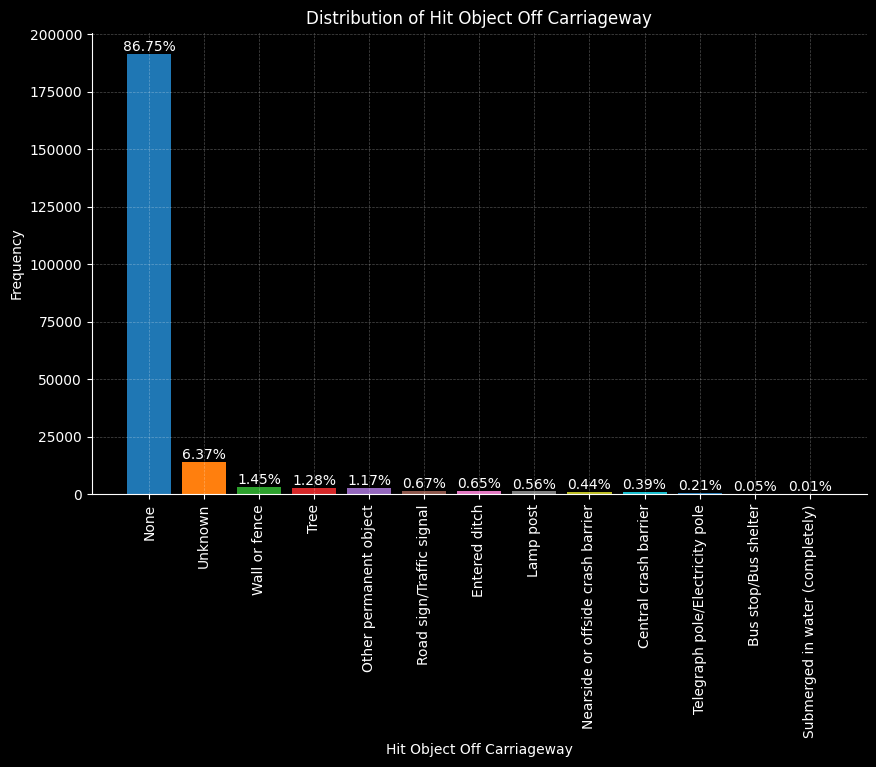

In [ ]:
# Plot the bar chart
plot_distribution(df,'hit_object_off_carriageway', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'hit_object_of_carriageway' column. The majority of entries are categorized as 'None', accounting for 86.75% of the total, while 'Submerged in water (completely)' represents the lowest proportion with only 0.01%.
    
</h4>

<h3 style="color: blue ">55. First Point of Impact Column
</h3>

In [ ]:
# check unique value count in the  column
df['first_point_of_impact'].value_counts()

first_point_of_impact
Front             110793
Back               36814
Offside            29117
Nearside           24762
Did not impact     11521
9                   6287
-1                  1141
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

It also appears that there are inconsistencies present in the 'first_point_of_impact' column. To rectify these erroneous values, we will replace occurrences of 9 and -1 with 'Unknown'.
</h4>

In [ ]:
# Replace -1 with Unknown
df['first_point_of_impact'] = df['first_point_of_impact'].replace(-1, 'Unknown')
# Replace 9 with Unknown
df['first_point_of_impact'] = df['first_point_of_impact'].replace(9, 'Unknown')

In [ ]:
# check unique value count in the  column
df['first_point_of_impact'].value_counts()

first_point_of_impact
Front             110793
Back               36814
Offside            29117
Nearside           24762
Did not impact     11521
Unknown             7428
Name: count, dtype: int64

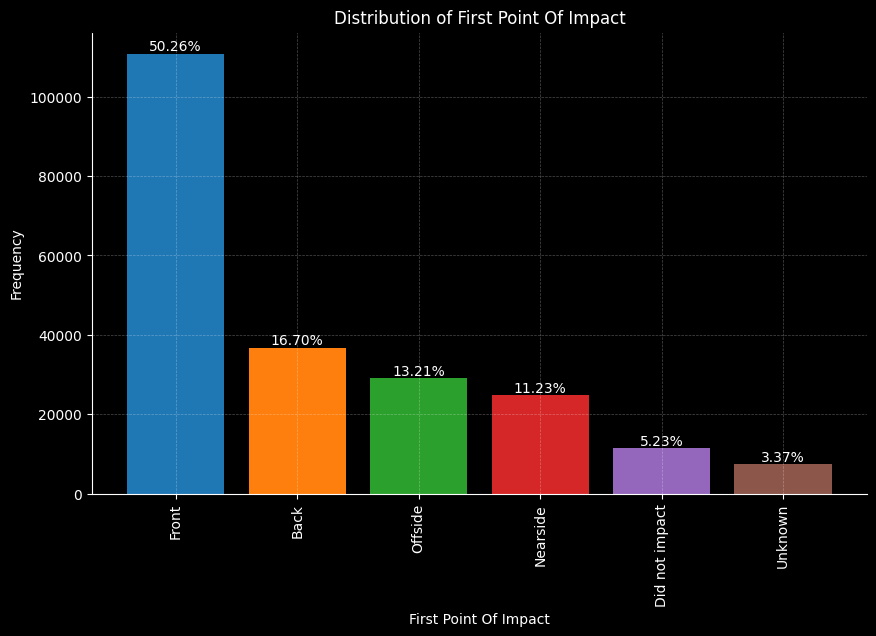

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df,'first_point_of_impact', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'hit_object_of_carriageway' column. The majority of entries are categorized as 'Front', accounting for 50.26% of the total, while 'Did not impact' represents the lowest proportion with only 5.23% aside the 'Unknown' with 3.37%
    
</h4>

<h3 style="color: blue ">56. Vehicle Left Hand Drive Column
</h3>

In [ ]:
# check unique value count in the  column
df['vehicle_left_hand_drive'].value_counts()

vehicle_left_hand_drive
No     207053
9       10722
Yes      1750
-1        910
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

It also appears that there are inconsistencies present in the 'vehicle_left_hand_drive' column. To rectify these erroneous values, we will replace occurrences of 9 and -1 with 'Unknown'.
</h4>

In [ ]:
# Replace -1 with Unknown
df['vehicle_left_hand_drive'] = df['vehicle_left_hand_drive'].replace(-1, 'Unknown')
# Replace 9 with Unknown
df['vehicle_left_hand_drive'] = df['vehicle_left_hand_drive'].replace(9, 'Unknown')

In [ ]:
# check unique value count in the  column
df['vehicle_left_hand_drive'].value_counts()

vehicle_left_hand_drive
No         207053
Unknown     11632
Yes          1750
Name: count, dtype: int64

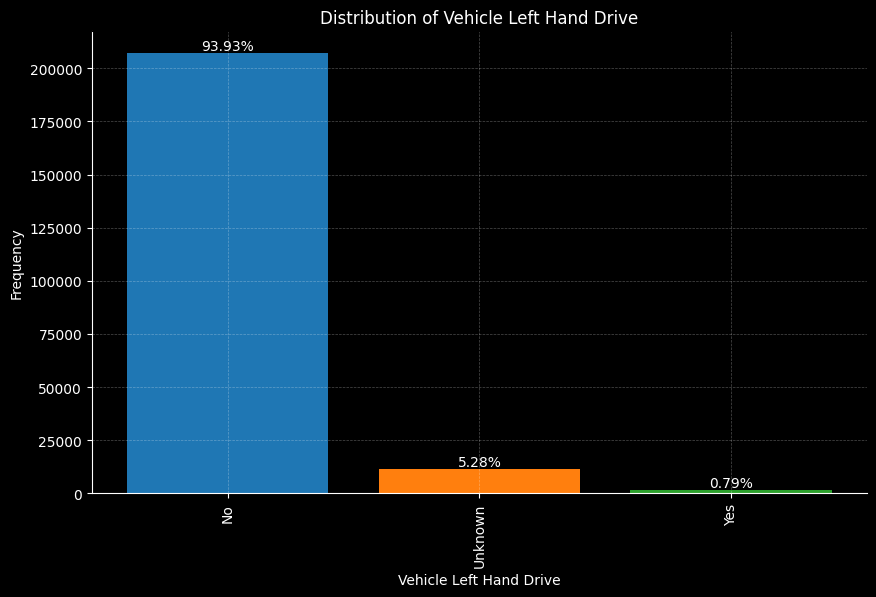

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df,'vehicle_left_hand_drive', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'vehicle_left_hand_drive' column. The majority of entries are categorized as 'No', accounting for 93.93% of the total, while 'Yes' represents the lowest proportion with only 0.79%.
    
</h4>

<h3 style="color: blue ">57. Journey Purpose of Driver Column
</h3>

In [ ]:
# check unique value count in the  column
df['journey_purpose_of_driver'].value_counts()

journey_purpose_of_driver
Not known                      128428
Other                           37226
Journey as part of work         29940
Commuting to/from work          21615
Taking pupil to/from school      2303
Pupil riding to/from school       692
-1                                231
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

In the 'journey_purpose_of_driver' column, inconsistencies have been detected, particularly with occurrences of -1. To rectify these erroneous values, we will replace them with 'Not known', as 'Not known' is already included as one of the possible inputs in this column.
</h4>

In [ ]:
# Replace -1 with Not known
df['journey_purpose_of_driver'] = df['journey_purpose_of_driver'].replace(-1, 'Not known')

In [ ]:
# check unique value count in the  column
df['journey_purpose_of_driver'].value_counts()

journey_purpose_of_driver
Not known                      128659
Other                           37226
Journey as part of work         29940
Commuting to/from work          21615
Taking pupil to/from school      2303
Pupil riding to/from school       692
Name: count, dtype: int64

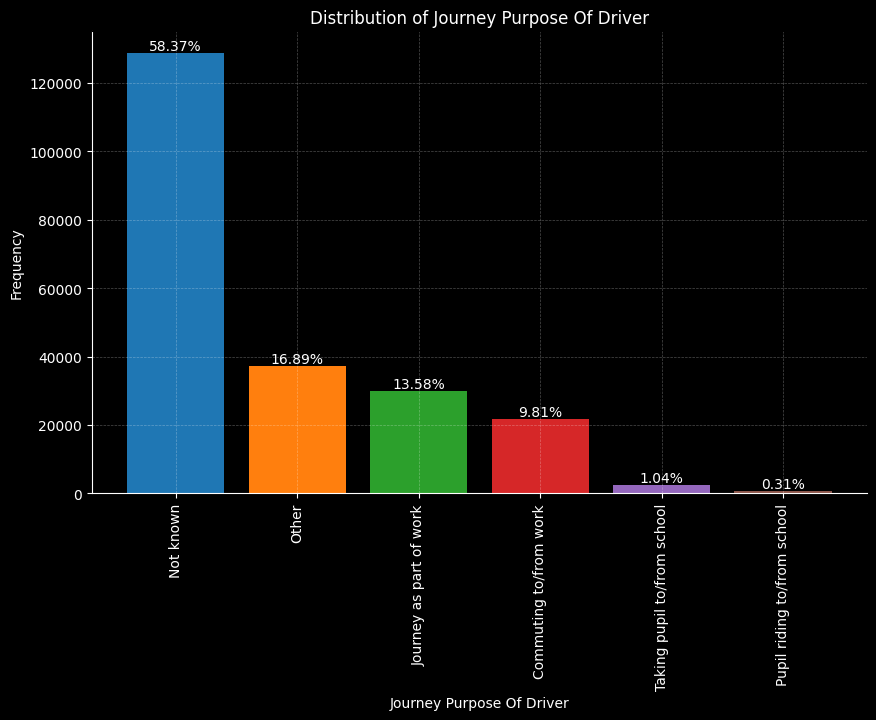

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df,'journey_purpose_of_driver', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'journey_purpose_of_driver' column. The majority of entries are categorized as 'Not known', accounting for 58.37% of the total, while 'Pupil riding to/from school' represents the lowest proportion with only 0.31%.
    
</h4>

<h3 style="color: blue ">58. Sex of Driver Column
</h3>

In [ ]:
# check unique value count in the  column
df['sex_of_driver'].value_counts()

sex_of_driver
Male         140676
Female        57393
Not known     22351
-1               15
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

In the 'sex_of_driver' column, inconsistencies have been detected, particularly with occurrences of -1. To rectify these erroneous values, we will replace them with 'Not known', as 'Not known' is already included as one of the possible inputs in this column.
</h4>

In [ ]:
# Replace -1 with Not known
df['sex_of_driver'] = df['sex_of_driver'].replace(-1, 'Not known')

In [ ]:
# check unique value count in the  column
df['sex_of_driver'].value_counts()

sex_of_driver
Male         140676
Female        57393
Not known     22366
Name: count, dtype: int64

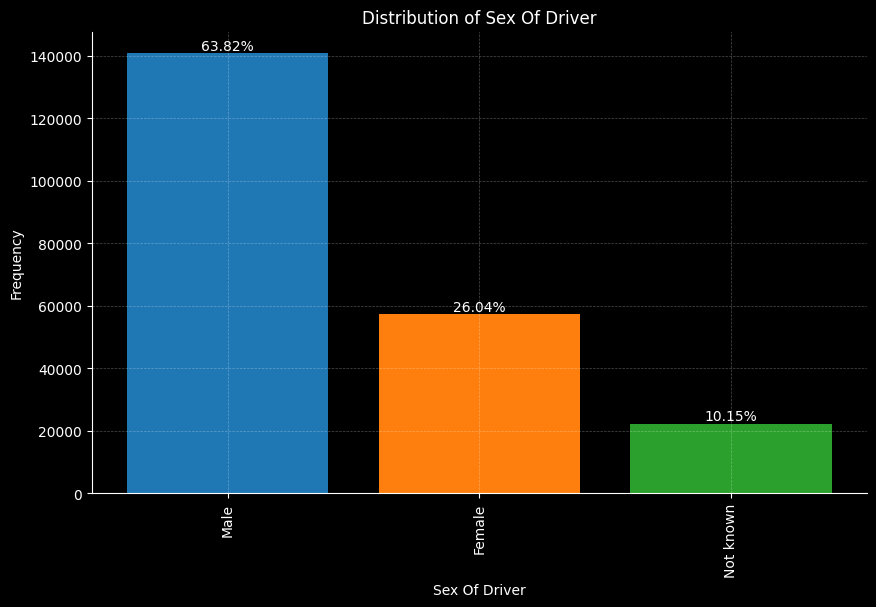

In [ ]:
# calling the function to plot the bar chart
plot_distribution(df,'sex_of_driver', show_percentages=True)

<h4 style="color: red ">
Result Observation: <br>

We have successfully addressed the erroneous values in the 'sex_of_driver' column. The majority of entries are categorized as 'Male', accounting for 63.82% of the total, while 'Female' represents  26.04%, and the lowest is 'Not Known' with 10.15%
</h4>

<h3 style="color: blue ">59. Age of Driver Column
</h3>

In [ ]:
# check unique value count in the  column
df['age_of_driver'].unique()

array([ 32,  45,  -1,  44,  20,  25,  41,  19,  26,  62,  37,  40,  33,
        51,  30,  18,  29,  24,  38,  77,  48,  50,  79,  42,  52,  22,
        31,  28,  57,  81,  59,  67,  34,  23,  54,  53,  27,  39,  56,
        43,  88,  35,  46,  16,  49,  21,  80,  66,  55,  47,  60,  36,
        58,  70,  71,  17,  85,  69,  61,  87,  73,  64,  65,  63,  83,
        78,  72,  68,  14,  82,  74,  75,  11,  76,  15,  86,  90,   9,
        10,  91,  84,  13,   8,  89,  93,  94,  92,   6,  12,   5,   4,
         7,  97,  95,   3,  98, 100,  99,  96], dtype=int64)

In [ ]:
# check unique value count in the  column
df['age_of_driver'].describe()

count    220435.000000
mean         35.156604
std          20.428323
min          -1.000000
25%          23.000000
50%          34.000000
75%          49.000000
max         100.000000
Name: age_of_driver, dtype: float64

In [ ]:
# check unique value count in the  column
df['age_of_driver'].value_counts()

age_of_driver
-1      27373
 30      6948
 29      4990
 28      4908
 25      4907
        ...  
 97         4
 98         4
 99         3
 3          2
 100        1
Name: count, Length: 99, dtype: int64

In [ ]:
# Call the function with column names and print the total number of rows corrected
df_corrected, num_corrected = correct_rows(df, 'age_of_driver', 'age_of_casualty')
print(f"Total number of rows corrected: {num_corrected}")

Total number of rows corrected: 27373


In [ ]:
# check unique value count in the  column
len(df[df['age_of_driver'] == -1])

0

In [ ]:
# check unique value count in the  column
df['age_of_driver'].unique()

array([ 32,  45,  23,  44,  20,  25,  41,  19,  26,  62,  37,  40,  30,
        33,  51,  18,  29,  24,  38,  80,  77,  21,  48,  50,  79,  27,
        42,  52,  43,  22,  31,  28,  57,  81,  59,  67,  34,  54,  53,
        39,  56,  88,  35,  46,  16,  49,  66,  55,  47,  60,  83,  36,
        58,  70,  71,  17,  85,  69,  61,  87,  73,  64,  65,  12,   9,
        63,  13,  15,  78,  72,  68,  14,  82,  74,  75,  10,   0,  11,
        76,  86,  90,   6,  91,  84,   4,   2,   8,  89,  93,   5,   1,
         3,  94,   7,  92,  97,  95,  98, 100,  99,  96], dtype=int64)

<h4 style="color: red ">
Result Observation: <br>

The erroneous value of -1 encountered in the 'age_of_driver' column was replaced with the corresponding value from the 'age_of_casualty' column where real values were available. As all drivers are considered casualties, any erroneous values for drivers were identified within the casualty data and successfully replaced.
</h4>

<h3 style="color: blue ">60. Age Band of Driver Column
</h3>

In [ ]:
# check unique value count in the  column
df['age_band_of_driver'].value_counts()

age_band_of_driver
 6     48851
 7     36529
 8     31802
-1     27373
 5     22630
 9     20796
 4     15150
 10     9541
 11     5809
 3      1610
 2       309
 1        35
Name: count, dtype: int64

In [ ]:
# Call the function with column names and print the total number of rows corrected
df_corrected, num_corrected = correct_rows(df, 'age_band_of_driver', 'age_band_of_casualty')
print(f"Total number of rows corrected: {num_corrected}")

Total number of rows corrected: 27373


In [ ]:
# check unique value count in the  column
df['age_band_of_driver'].value_counts()

age_band_of_driver
6     57764
7     40989
8     35068
5     25928
9     22656
4     17556
10    10353
11     6394
3      2620
2       735
1       372
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

The erroneous value of -1 encountered in the 'age_band_of_driver' column was replaced with the corresponding value from the 'age_band_of_casualty' column where real values were available. As all drivers are considered casualties, any erroneous values for drivers were identified within the casualty data and successfully replaced.
</h4>

<h3 style="color: blue ">61. Engine Capacity Column
</h3>

In [ ]:
# check total number of unique values
df['engine_capacity_cc'].nunique()

985

In [ ]:
# check unique value count in the  column
len(df[df['engine_capacity_cc'] == -1])

51172

In [ ]:
# check stats of engine capacity
df['engine_capacity_cc'].describe()

count    220435.000000
mean       1407.144061
std        1542.884192
min          -1.000000
25%         125.000000
50%        1398.000000
75%        1968.000000
max       17696.000000
Name: engine_capacity_cc, dtype: float64

In [ ]:
# check stats of engine capacity
df['engine_capacity_cc'].value_counts()

engine_capacity_cc
-1       51172
 1598    12830
 1995     7761
 1968     7612
 998      6587
         ...  
 6500        1
 192         1
 1310        1
 6124        1
 6781        1
Name: count, Length: 985, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

It is apparent that '-1' represents the mode within the 'engine_capacity_cc' column. Consequently, an alternative approach is warranted, wherein '-1' is excluded from the computation. The subsequent most frequent value in the sequence will serve as the mode
</h4>

In [ ]:
# function to replace -1 with mode
def replace_erroneous_values(df, column):
    # Check if mode is -1
    if df[column].mode()[0] == -1:
        # Exclude -1 when calculating mode
        mode_excluding_minus_one = df[column][df[column] != -1].mode()
        if not mode_excluding_minus_one.empty:
            mode_value = mode_excluding_minus_one[0]
            # Replace -1 with the mode value excluding -1
            df[column] = df[column].replace(-1, mode_value)
        else:
            print("No mode value found excluding -1")
    else:
        # Replace all -1 with the mode
        df[column] = df[column].replace(-1, df[column].mode()[0])

# call function ro replace -1
replace_erroneous_values(df, 'engine_capacity_cc')

In [ ]:
# check stats of engine capacity
df['engine_capacity_cc'].value_counts()

engine_capacity_cc
1598    64002
1995     7761
1968     7612
998      6587
1560     5350
        ...  
6500        1
192         1
1310        1
6124        1
6781        1
Name: count, Length: 984, dtype: int64

In [ ]:
# check unique value count in the  column
len(df[df['engine_capacity_cc'] == -1])

0

<h4 style="color: red ">
Result Observation: <br>

We have successfully replaced all erroneous values of -1 found in the 'engine_capacity_cc' column with the mode value
</h4>

In [ ]:
df.head(1)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,2020-02-04,Tuesday,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,Unknown,Unknown,Daylight,Unknown,Unknown,None,None,Urban Area,No – self reporting,Non-trunk road,E01004576,484748,1,Pedestrian,Male,31,6,Slight,"In carriageway, not crossing","In carriageway, stationary - not crossing (sta...",Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,4,681716,1,Car,Unknown,Moving off,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,Unknown,Not known,Female,32,6,1968,2,6,AUDI Q5,4,Unknown


<h3 style="color: blue ">62. Propulsion Code Column
</h3>

In [ ]:
df['propulsion_code'].unique()

array([ 2,  1, -1,  8, 12,  3,  5,  7,  6,  4,  9], dtype=int64)

In [ ]:
df['propulsion_code'].value_counts()

propulsion_code
 1     89809
 2     74494
-1     50389
 8      4909
 3       614
 7        90
 12       78
 6        27
 5        23
 4         1
 9         1
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

Upon review of the accident stat form, it is evident that the 'propulsion_code' column lacks meaningful code values. Consequently, we will proceed to replace the suspected erroneous values.
</h4>

In [ ]:
 # Replace all -1 with the mode
df['propulsion_code'] = df['propulsion_code'].replace(-1, df['propulsion_code'].mode()[0])

In [ ]:
df['propulsion_code'].unique()

array([ 2,  1,  8, 12,  3,  5,  7,  6,  4,  9], dtype=int64)

<h4 style="color: red ">
Result Observation: <br>

We have successfully replaced all erroneous values of -1 found in the 'engine_capacity_cc' column with the mode value
</h4>

<h3 style="color: blue ">63. Age of Vehicle Column
</h3>

In [ ]:
# check unique value of age of vehicle
df['age_of_vehicle'].unique()

array([ 6,  2, -1,  8,  4,  5,  0,  1, 14,  9, 16, 20, 12, 10, 13, 18,  7,
        3, 19, 22, 15, 11, 17, 28, 21, 32, 24, 25, 23, 27, 30, 26, 29, 31,
       34, 37, 44, 39, 57, 38, 51, 54, 33, 62, 46, 43, 41, 48, 45, 36, 58,
       60, 64, 86, 50, 61, 53, 35, 55, 49, 92, 88, 42, 67, 84, 40, 52, 66,
       56, 78, 47, 96, 68, 63, 93], dtype=int64)

In [ ]:
df['age_of_vehicle'].value_counts()

age_of_vehicle
-1     50460
 4     12611
 1     12549
 5     11835
 3     11661
       ...  
 47        1
 96        1
 68        1
 64        1
 93        1
Name: count, Length: 75, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

It is apparent that '-1' represents the mode within the 'age_of_vehicle' column. Consequently, an alternative approach is warranted, wherein '-1' is excluded from the computation. The subsequent most frequent value in the sequence will serve as the mode
</h4>

In [ ]:
# replace all erroneous values of -1 in the 'age_of_vehicle' column of df using the function created earlier
replace_erroneous_values(df, 'age_of_vehicle')

In [ ]:
# check again unique value of age of vehicle
df['age_of_vehicle'].unique()

array([ 6,  2,  4,  8,  5,  0,  1, 14,  9, 16, 20, 12, 10, 13, 18,  7,  3,
       19, 22, 15, 11, 17, 28, 21, 32, 24, 25, 23, 27, 30, 26, 29, 31, 34,
       37, 44, 39, 57, 38, 51, 54, 33, 62, 46, 43, 41, 48, 45, 36, 58, 60,
       64, 86, 50, 61, 53, 35, 55, 49, 92, 88, 42, 67, 84, 40, 52, 66, 56,
       78, 47, 96, 68, 63, 93], dtype=int64)

<h4 style="color: red ">
Result Observation: <br>

We have successfully replaced all erroneous values of -1 found in the 'age_of_vehicle' column with the mode value
</h4>

<h3 style="color: blue ">64. Generic Make Model Column
</h3>

In [ ]:
# check again unique value of age of vehicle
df['generic_make_model'].unique()

array(['AUDI Q5', 'AUDI A1', '-1', 'TOYOTA PRIUS', 'BMW 4 SERIES',
       'VOLVO V60', 'MERCEDES C CLASS', 'JAGUAR XF SERIES', 'BMW X5',
       'YAMAHA XC115', 'BMW 1 SERIES', 'PORSCHE CAYENNE', 'AUDI A4',
       'VOLKSWAGEN CADDY', 'HONDA CRV', 'VAUXHALL CORSA',
       'VOLKSWAGEN POLO', 'VOLKSWAGEN GOLF', 'BMW 5 SERIES', 'FIAT 500',
       'MAZDA 323', 'HONDA INSIGHT', 'TOYOTA AYGO', 'TOYOTA YARIS',
       'JAGUAR X TYPE', 'PEUGEOT TWEET 125', 'VOLVO MODEL MISSING',
       'NISSAN NOTE', 'FORD KA', 'TOYOTA COROLLA', 'TOYOTA MODEL MISSING',
       'MITSUBISHI OUTLANDER', 'FORD FOCUS', 'MERCEDES A CLASS',
       'SMART FORTWO', 'AUDI A6', 'VAUXHALL MOKKA', 'HONDA GLR 125',
       'LAND ROVER RANGE ROVER', 'BMW 6 SERIES', 'FIAT DUCATO',
       'FORD FIESTA', 'PEUGEOT 108', 'ALEXANDER DENNIS MODEL MISSING',
       'VOLKSWAGEN TRANSPORTER', 'CITROEN C4', 'FORD TRANSIT',
       'PEUGEOT EXPERT', 'HONDA WW125', 'BMW M3', 'WRIGHTBUS NB4L',
       'FORD TRANSIT CONNECT', 'AUDI A3', 'MERCEDES 

In [ ]:
# count unique value of age of vehicle
df['generic_make_model'].value_counts()

generic_make_model
-1                   55789
FORD FIESTA           6931
VAUXHALL CORSA        5762
VAUXHALL ASTRA        5346
VOLKSWAGEN GOLF       5279
                     ...  
HONDA C90               11
TRIUMPH SPRINT ST       10
HONDA CBF600N           10
KEEWAY RK 125           10
YAMAHA MW125            10
Name: count, Length: 692, dtype: int64

In [ ]:
# Replace -1 with Not known
df['generic_make_model'] = df['generic_make_model'].replace(-1, 'Unknown')

In [ ]:
# check  count of -1 in the  column
len(df[df['generic_make_model'] == -1])

0

<h4 style="color: red ">
Result Observation: <br>

We identified erroneous values of -1 within the 'generic_make_model' column, and these have been successfully replaced with 'Unknown'
</h4>

<h3 style="color: blue ">65. Driver IMD Decile Column
</h3>

In [ ]:
# count unique value of age of vehicle
df['driver_imd_decile'].value_counts()

driver_imd_decile
-1     38272
 2     21896
 3     21386
 1     21091
 4     20079
 5     19428
 6     18405
 7     16678
 8     15563
 9     14860
 10    12777
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

It is apparent that '-1' represents the mode within the 'driver_imd_decile' column. Consequently, an alternative approach is warranted, wherein '-1' is excluded from the computation. The subsequent most frequent value in the sequence will serve as the mode
</h4>

In [ ]:
# replace all erroneous values of -1 in the 'driver_imd_decile' column of df using the function created earlier
replace_erroneous_values(df, 'driver_imd_decile')

In [ ]:
# count unique value of age of vehicle
df['driver_imd_decile'].unique()

array([ 4,  7,  2,  3,  8,  6,  5,  1,  9, 10], dtype=int64)

<h4 style="color: red ">
Result Observation: <br>

We have successfully replaced all erroneous values of -1 found in the 'driver_imd_decile' column with the mode value
</h4>

<h3 style="color: blue ">66. Driver Home Area Type Column
</h3>

In [ ]:
# count unique value of age of driver_home_area_type
df['driver_home_area_type'].value_counts()

driver_home_area_type
Unknown                  145563
-1                        37985
Parked and unattended     21039
Non-UK resident           15848
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

We have identified an erroneous value of -1 within the 'driver_home_area_type' column. Given that 'Unknown' is already included as part of the values in the column, we will replace it accordingly with 'Unknown'
</h4>

In [ ]:
# Replace -1 with Unknown
df['driver_home_area_type'] = df['driver_home_area_type'].replace(-1, 'Unknown')

In [ ]:
# count unique value of age of driver_home_area_type
df['driver_home_area_type'].value_counts()

driver_home_area_type
Unknown                  183548
Parked and unattended     21039
Non-UK resident           15848
Name: count, dtype: int64

<h4 style="color: red ">
Result Observation: <br>

We have successfully replaced all erroneous values of -1 found in the 'driver_home_area_type' column with the Unknown
</h4>

<h2 style="color: blue "> Split the Merged Dataframes (Accident, Casualty and Vehicle)  
</h2>

Now that we have finished fixing all erroneus columns, we will now split our dataframe back

In [ ]:
# Columns in the original dataframes
accident_columns = ['accident_index', 'accident_year', 'accident_reference', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'police_force', 'accident_severity', 'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week', 'time', 'local_authority_district', 'local_authority_ons_district', 'local_authority_highway', 'first_road_class', 'first_road_number', 'road_type', 'speed_limit', 'junction_detail', 'junction_control', 'second_road_class', 'second_road_number', 'pedestrian_crossing_human_control', 'pedestrian_crossing_physical_facilities', 'light_conditions', 'weather_conditions', 'road_surface_conditions', 'special_conditions_at_site', 'carriageway_hazards', 'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident', 'trunk_road_flag', 'lsoa_of_accident_location']
casualty_columns = ['casualty_index', 'accident_index', 'accident_year', 'accident_reference', 'vehicle_reference', 'casualty_reference', 'casualty_class', 'sex_of_casualty', 'age_of_casualty', 'age_band_of_casualty', 'casualty_severity', 'pedestrian_location', 'pedestrian_movement', 'car_passenger', 'bus_or_coach_passenger', 'pedestrian_road_maintenance_worker', 'casualty_type', 'casualty_home_area_type', 'casualty_imd_decile']
vehicle_columns = ['vehicle_index', 'accident_index', 'accident_year', 'accident_reference', 'vehicle_reference', 'vehicle_type', 'towing_and_articulation', 'vehicle_manoeuvre', 'vehicle_direction_from', 'vehicle_direction_to', 'vehicle_location_restricted_lane', 'junction_location', 'skidding_and_overturning', 'hit_object_in_carriageway', 'vehicle_leaving_carriageway', 'hit_object_off_carriageway', 'first_point_of_impact', 'vehicle_left_hand_drive', 'journey_purpose_of_driver', 'sex_of_driver', 'age_of_driver', 'age_band_of_driver', 'engine_capacity_cc', 'propulsion_code', 'age_of_vehicle', 'generic_make_model', 'driver_imd_decile', 'driver_home_area_type']
lsoa_columns = ['objectid', 'lsoa01cd', 'lsoa01nm', 'lsoa01nmw', 'shape__area', 'shape__length', 'globalid']



In [ ]:
# Separating the merged DataFrame back into original structure
# Dropping duplicates based on the 'accident_index' column and keeping none of the duplicates
accident = df.drop_duplicates(subset=['accident_index'])[accident_columns].reset_index(drop=True)
casualty = df.drop_duplicates(subset=['casualty_index'])[casualty_columns].reset_index(drop=True)
vehicle = df.drop_duplicates(subset=['vehicle_index'])[vehicle_columns].reset_index(drop=True)

# show dataframes
display(accident)
display (casualty)
display(vehicle)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,2020-02-04,Tuesday,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,Unknown,Unknown,Daylight,Unknown,Unknown,None,None,Urban Area,No – self reporting,Non-trunk road,E01004576
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,2020-04-27,Monday,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01003034
2,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,Metropolitan Police,Slight,1,1,2020-01-01,Wednesday,01:25,1,Westminster,Westminster,C,0,Single carriageway,30,T or staggered junction,Authorised person,Unclassified,0,None within 50 metres,No physical crossing facility within 50 metres,Darkness: street lights present and lit,Fine without high winds,Wet/Damp,None,None,Urban Area,Yes,Non-trunk road,E01004726
3,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,Metropolitan Police,Serious,1,1,2020-01-01,Wednesday,01:50,17,Newham,Newham,A,11,Single carriageway,30,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Darkness: street lights present and lit,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01003617
4,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,Metropolitan Police,Slight,1,2,2020-01-01,Wednesday,02:25,1,Westminster,Westminster,A,40,Single carriageway,30,T or staggered junction,Give way or uncontrolled,C,0,None within 50 metres,No physical crossing facility within 50 metres,Darkness: street lights present and lit,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01004763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,Unknown_Station,Serious,2,1,2020-08-12,Wednesday,14:30,918,Dundee City,Dundee City,B,959,Single carriageway,30,Roundabout,Give way or uncontrolled,B,959,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,-1
91195,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,Unknown_Station,Slight,1,1,2020-11-13,Friday,15:05,922,East Renfrewshire,East Renfrewshire,Unclassified,0,Unknow,30,T or staggered junction,Give way or uncontrolled,Unclassified,0,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,Urban Area,No,Non-trunk road,-1
91196,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,Unknown_Station,Serious,2,1,2020-04-15,Wednesday,12:42,910,Aberdeen City,Aberdeen City,B,979,Single carriageway,60,Using private drive or entrance,Authorised person,Unclassified,0,None within 50 metres,No physical crossing facility wi

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,484748,2020010219808,2020,010219808,1,1,Pedestrian,Male,31,6,Slight,"In carriageway, not crossing","In carriageway, stationary - not crossing (sta...",Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,4
1,484749,2020010220496,2020,010220496,1,1,Pedestrian,Female,2,1,Slight,"In carriageway, crossing on pedestrian crossin...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,2
2,484750,2020010220496,2020,010220496,1,2,Pedestrian,Female,4,1,Slight,"In carriageway, crossing on pedestrian crossin...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,2
3,484751,2020010228005,2020,010228005,1,1,Pedestrian,Male,23,5,Slight,"In carriageway, crossing elsewhere",Unknown or other,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,3
4,484752,2020010228006,2020,010228006,1,1,Pedestrian,Male,47,8,Serious,"In carriageway, crossing elsewhere within 50 m...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115579,600327,2020991027064,2020,991027064,1,1,Driver or rider,Male,11,3,Serious,Unknown or other,Unknown or other,Not a car passenger,Not a bus or coach passenger,Not applicable,1,Unknown,2
115580,600328,2020991029573,2020,991029573,1,1,Pedestrian,Female,63,9,Slight,Unknown or other,Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,10
115581,600329,2020991030297,2020,991030297,1,1,Driver or rider,Male,38,7,Serious,Unknown or other,Unknown or other,Not a car passenger,Not a bus or coach passenger,Not applicable,5,Non-UK resident,9
115582,600330,2020991030900,2020,991030900,1,1,Driver or rider,Male,76,11,Slight,Unknown or other,Unknown or other,Not a car passenger,Not a bus or coach passenger,Not applicable,1,Unknown,9


,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,681716,2020010219808,2020,010219808,1,Car,Unknown,Moving off,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,Unknown,Not known,Female,32,6,1968,2,6,AUDI Q5,4,Unknown
1,681717,2020010220496,2020,010220496,1,Car,No tow or articulation,Slowing or stopping,North east,South west,On main carriageway - not in restricted lane,Cleared junction or waiting/parked at junction...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Commuting to/from work,Male,45,7,1395,1,2,AUDI A1,7,Unknown
2,681718,2020010228005,2020,010228005,1,Car,No tow or articulation,Going ahead other,Unknown,Unknown,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Not known,Not known,23,5,1598,1,4,-1,2,Unknown
3,681719,2020010228006,2020,010228006,1,Taxi/Private hire car,No tow or articulation,Going ahead other,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Journey as part of work,Male,44,7,1798,8,8,TOYOTA PRIUS,2,Unknown
4,681720,2020010228011,2020,010228011,1,Car,No tow or articulation,Going ahead other,East,West,Footway (pavement),Approaching junction or waiting/parked at junc...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Not known,Male,20,4,2993,2,4,BMW 4 SERIES,2,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167370,849086,2020991030297,2020,991030297,1,Car,No tow or articulation,Turning left,North west,North east,On main carriageway - not in restricted lane,Entering main road,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Offside,No,Journey as part of work,Male,57,9,1968,2,2,AUDI A5,7,Unknown
167371,849087,2020991030297,2020,991030297,2,Motorcycle over 500cc,No tow or articulation,Going ahead left hand bend,South west,North east,On main carriageway - not in restricted lane,Approaching junction or waiting/parked at junc...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Other,Male,38,7,1301,1,2,KTM 1290 SUPERDUKE,9,Non-UK resident
167372,849088,2020991030900,2020,991030900,1,Car,No tow or articulation,Turning left,North west,North east,On main carriageway - not in restricted lane,Entering main road,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Offside,No,Not known,Female,68,10,1995,2,1,BMW X3,5,Unknown
167373,849089,2020991030900,2020,991030900,2,Pedal cycle,No tow or articulation,Going ahead other,South west,North east,Cycle lane (on main carriageway),Mid junction - on roundabout or on main road,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Not known,Male,76,11,1598,1,4,-1,9,Unknown


In [ ]:
# Merging the accident and df_lsoa
merged_accident_lsoa = pd.merge(accident, df_lsoa, left_on='lsoa_of_accident_location', right_on='lsoa01cd', how='left')

# Display the merged dataframe
merged_accident_lsoa.head(2)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,2020-02-04,Tuesday,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,Unknown,Unknown,Daylight,Unknown,Unknown,None,None,Urban Area,No – self reporting,Non-trunk road,E01004576,4576.0,E01004576,Wandsworth 013D,Wandsworth 013D,445625.061623,4486.70113,c7ddebfb-d730-4be6-b67e-938adb21309e
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,2020-04-27,Monday,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01003034,3034.0,E01003034,Lambeth 012A,Lambeth 012A,114698.446686,1719.14086,cb2e7f50-252f-469e-9b13-a56794f5d5d6


<h1 style="color: blue "> Analysis on 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude' Columns to Predict Missing Values
</h1>

<h3 style="color: blue "> Police Force Column Data Approach
</h3>

We applied the Chi-Square test to assess the correlation between the 'Police Force' and the missing values in the dataset.

In [ ]:
# Import the necessary function
from scipy.stats import chi2_contingency

# Binning numerical columns
accident['location_easting_osgr_binned'] = pd.qcut(accident['location_easting_osgr'], q=4, duplicates='drop')  # 4 quantiles
accident['location_northing_osgr_binned'] = pd.qcut(accident['location_northing_osgr'], q=4, duplicates='drop')
accident['longitude_binned'] = pd.qcut(accident['longitude'], q=4, duplicates='drop')
accident['latitude_binned'] = pd.qcut(accident['latitude'], q=4, duplicates='drop')

# Function to perform Chi-Square Test
def perform_chi_square_test(accident, col):
    contingency_table = pd.crosstab(accident[col], accident['police_force'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f"Chi-Square Test for {col}:")
    print("Chi-squared Statistic:", chi2)
    print("P-value:", p)
    print("\n")

# Perform Chi-Square Test for each binned column
perform_chi_square_test(accident, 'location_easting_osgr_binned')
perform_chi_square_test(accident, 'location_northing_osgr_binned')
perform_chi_square_test(accident, 'longitude_binned')
perform_chi_square_test(accident, 'latitude_binned')


Chi-Square Test for location_easting_osgr_binned:
Chi-squared Statistic: 188300.46074682396
P-value: 0.0


Chi-Square Test for location_northing_osgr_binned:
Chi-squared Statistic: 214840.0629506962
P-value: 0.0


Chi-Square Test for longitude_binned:
Chi-squared Statistic: 186703.06246490724
P-value: 0.0


Chi-Square Test for latitude_binned:
Chi-squared Statistic: 213901.09357101907
P-value: 0.0




<h4 style="color: red ">
Result Observation: <br>

This result shows strong correclations, let visualize and then analyze
</h4>

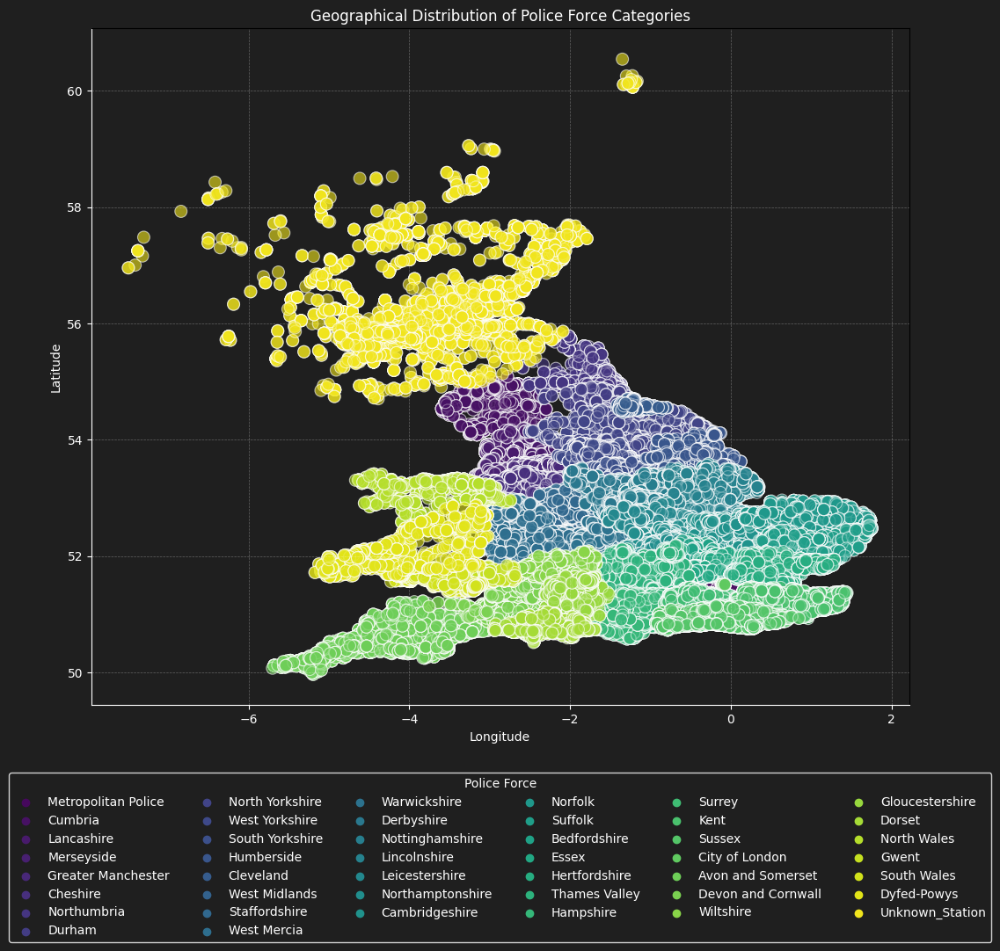

In [ ]:
# Define colors and styles
background_color = '#1f1f1f'
text_color = 'white'

# Create a figure and axes with a custom size
fig, ax = plt.subplots(figsize=(12, 10))
scatter = sns.scatterplot(data=df, x='longitude', y='latitude', hue='police_force', palette='viridis', s=100, alpha=0.6, ax=ax)

# Set chart title and labels with style adjustments
ax.set_title('Geographical Distribution of Police Force Categories', color=text_color)
ax.set_xlabel('Longitude', color=text_color)
ax.set_ylabel('Latitude', color=text_color)

# Set the background color of the figure and axes
fig.patch.set_facecolor(background_color)
ax.set_facecolor(background_color)

# Adding faint grid lines for better visibility and aesthetics
ax.grid(True, which='both', axis='both', linestyle='--', linewidth=0.5, color='white', alpha=0.3)

# Set the colors of the axes and tick labels to a lighter color for visibility
ax.tick_params(colors=text_color, which='both')
ax.spines['bottom'].set_color(text_color)
ax.spines['left'].set_color(text_color)

# Configure legend to fit better with the dark theme
handles, labels = ax.get_legend_handles_labels()
legend = ax.legend(handles=handles, labels=labels, title='Police Force', loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=6, borderaxespad=0., facecolor=background_color, edgecolor=text_color)
plt.setp(legend.get_texts(), color=text_color)
legend.get_title().set_color(text_color)

# Display the plot
plt.show()


<h4 style="color: red ">
Result Observation: <br>
    
The results from the Chi-Square tests and visualization indicate a very strong correlation between the 'police_force' category and each of the binned geographical variables ('location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude'). Given that the Chi-squared statistic is very high and the p-value is 0.0 for all variables, we can reject the null hypothesis that there is no correlations between the geographical variables and the 'police_force' categories.

 The p-values of 0.0 suggest that the differences in the distributions of these geographical variables across different 'police_force' categories are statistically significant. This implies that different police forces operate in geographically distinct areas as seen in the visualization.
    
While this strong correction gave an excellent insight and can help in filling the missing entries in 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude' Columns. However, since the missing values are numerical, machine learning approach will also be explored.

</h4>



<h3 style="color: blue "> Deep Learning Model Approch For Predict 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude' Columns
</h3>

In [ ]:
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split

# Isolate rows with NaN geolocations
nan_rows = accident[accident[['location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude']].isna().any(axis=1)]

# Combine to ensure all categories are known to the encoder
combined = pd.concat([accident, nan_rows])

# Check and convert data types
categorical_columns = ['police_force', 'local_authority_district', 'local_authority_ons_district', 'local_authority_highway', 'road_type', 'junction_detail']
for col in categorical_columns:
    # Convert all columns to string type
    combined[col] = combined[col].astype(str)

# Preprocessing steps
encoder = LabelEncoder()

# Applying the LabelEncoder to combined data for categorical columns
for col in categorical_columns:
    combined[col] = encoder.fit_transform(combined[col])


# Split the data back
train_df = combined.loc[accident.index]
nan_rows = combined.loc[nan_rows.index]

# Isolate rows with NaN geolocations and separate features and targets
features = train_df.dropna(subset=['location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude'])[[*categorical_columns]]
targets = train_df.dropna(subset=['location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude'])[['location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude']]

# Scaling features
scaler = MinMaxScaler()
features_scaled = scaler.fit_transform(features)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(features_scaled, targets, test_size=0.2, random_state=42)

# Build the model
model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.1),
    Dense(64, activation='relu'),
    Dense(4)  # Predicting four values: location_easting_osgr, location_northing_osgr, longitude, latitude
])

# optimizer = Adam(learning_rate=0.01)
model.compile(optimizer='adam', loss='mse')

# Train the model
model.fit(X_train, y_train, epochs=20, validation_split=0.2)

# Preprocess nan_rows for prediction using the same scaler
nan_features = nan_rows[categorical_columns]
nan_features_scaled = scaler.transform(nan_features)

# Predict the missing geolocations
predicted_locs = model.predict(nan_features_scaled)

# Assign predictions back to the NaN rows if necessary
nan_rows.loc[:, 'location_easting_osgr'] = predicted_locs[:, 0]
nan_rows.loc[:, 'location_northing_osgr'] = predicted_locs[:, 1]
nan_rows.loc[:, 'longitude'] = predicted_locs[:, 2]
nan_rows.loc[:, 'latitude'] = predicted_locs[:, 3]


Epoch 1/20
1824/1824 [==============================] - 3s 1ms/step - loss: 48745164800.0000 - val_loss: 12426843136.0000
Epoch 2/20
1824/1824 [==============================] - 2s 1ms/step - loss: 10294430720.0000 - val_loss: 9730087936.0000
Epoch 3/20
1824/1824 [==============================] - 2s 1ms/step - loss: 9418228736.0000 - val_loss: 9036342272.0000
Epoch 4/20
1824/1824 [==============================] - 3s 1ms/step - loss: 8769299456.0000 - val_loss: 8420946944.0000
Epoch 5/20
1824/1824 [==============================] - 2s 1ms/step - loss: 8254439936.0000 - val_loss: 7955469312.0000
Epoch 6/20
1824/1824 [==============================] - 3s 1ms/step - loss: 7874449920.0000 - val_loss: 7630635008.0000
Epoch 7/20
1824/1824 [==============================] - 2s 1ms/step - loss: 7609447424.0000 - val_loss: 7418301952.0000
Epoch 8/20
1824/1824 [==============================] - 3s 2ms/step - loss: 7461111296.0000 - val_loss: 7303710208.0000
Epoch 9/20
1824/1824 [===============

<h4 style="color: blue "> Make prediction
</h4>

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Make predictions on the test data
y_pred = model.predict(X_test)

# Calculate MSE and RMSE
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print("Mean Squared Error on Test Data:", mse)
print("Root Mean Squared Error on Test Data:", rmse)

570/570 [==============================] - 1s 833us/step
Mean Squared Error on Test Data: 7229959346.699716
Root Mean Squared Error on Test Data: 85029.16762323218


<h4 style="color: blue "> Visualization of of Predicted and Actual Values
</h4>

Mean Squared Error on Test Data: 7229959346.699716
Root Mean Squared Error on Test Data: 85029.16762323218
R-squared on Test Data: -5.027171323660584


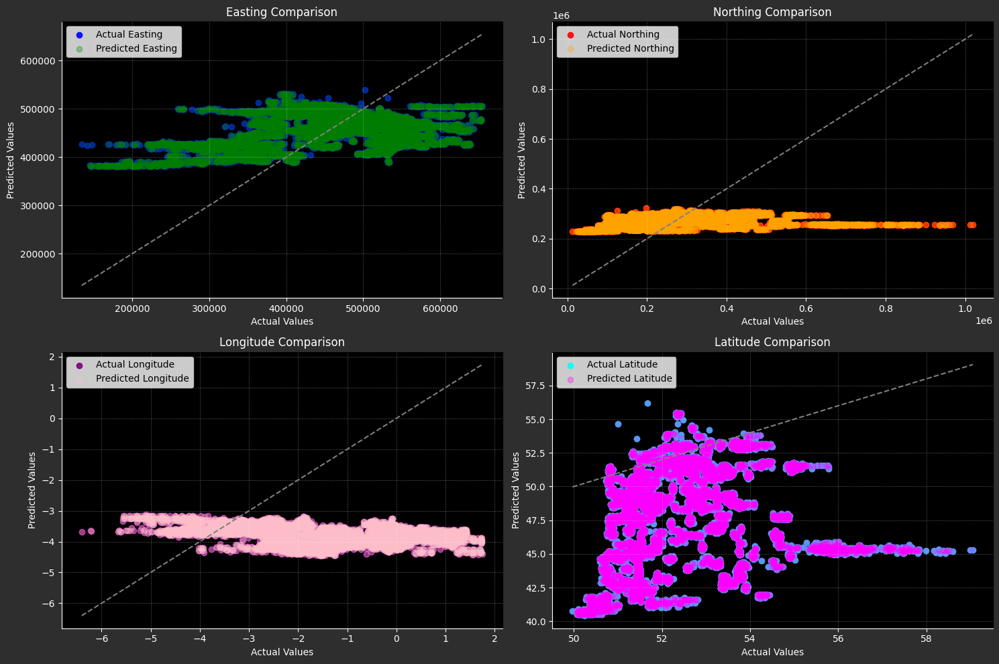

In [ ]:
# function to plot predicted values and actual values
def plot_actual_vs_predicted(y_test, y_pred):
    # Ensure y_pred and y_test are numpy arrays
    y_pred = np.array(y_pred)  # Convert if not already an array
    y_test = np.array(y_test)  # Convert if not already an array

    # Calculate MSE and RMSE
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    print("Mean Squared Error on Test Data:", mse)
    print("Root Mean Squared Error on Test Data:", rmse)

    # Calculate R-squared for the model
    r_squared = r2_score(y_test, y_pred)
    print("R-squared on Test Data:", r_squared)

    # Plotting actual vs predicted values for all four metrics
    fig, axs = plt.subplots(2, 2, figsize=(15, 10), facecolor='#2e2e2e')

    # Setup background and grid properties
    background_color = 'black'
    grid_color = 'white'
    grid_alpha = 0.3  # Transparency of grid lines

    # Define colors for actual and predicted data points
    colors = [('blue', 'green'), ('red', 'orange'), ('purple', 'pink'), ('cyan', 'magenta')]
    labels = [('Actual Easting', 'Predicted Easting'), ('Actual Northing', 'Predicted Northing'),
              ('Actual Longitude', 'Predicted Longitude'), ('Actual Latitude', 'Predicted Latitude')]

    # Iterate over each subplot
    for i, ax in enumerate(axs.flat):
        # Scatter plot for actual vs predicted
        ax.scatter(y_test[:, i], y_pred[:, i], alpha=0.9, color=colors[i][0], label=labels[i][0])
        ax.scatter(y_test[:, i], y_pred[:, i], alpha=0.3, color=colors[i][1], label=labels[i][1])
        ax.plot([y_test[:, i].min(), y_test[:, i].max()], [y_test[:, i].min(), y_test[:, i].max()],
                color='gray', linestyle='--')

        # Set plot title and labels
        ax.set_title(labels[i][0].split()[1] + ' Comparison', color='white')
        ax.set_xlabel('Actual Values', color='white')
        ax.set_ylabel('Predicted Values', color='white')

        # Customize grid, spines, ticks, and legend
        ax.set_facecolor(background_color)
        ax.grid(True, linestyle='--', linewidth=0.5, color=grid_color, alpha=grid_alpha)
        ax.tick_params(colors='white', which='both')  # Ticks
        ax.spines['bottom'].set_color('white')
        ax.spines['left'].set_color('white')
        ax.legend()

    plt.tight_layout()
    plt.show()


# call function to plots
plot_actual_vs_predicted(y_test, y_pred)


<h4 style="color: blue "> Reinsert Predicted Rows Back into the Original DataFrame (Accident)
</h4>

In [ ]:
# remove duplicates, keeping the first occurrence
accident = accident.drop_duplicates(subset='accident_index', keep='first')
nan_rows = nan_rows.drop_duplicates(subset='accident_index', keep='first')

# Rechecking the merge
accident = pd.merge(accident, nan_rows[['accident_index', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude']],
                  on='accident_index', how='left', suffixes=('', '_pred'))

# Filling NaN values and cleaning up
for col in ['location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude']:
    accident[col] = accident[col].fillna(accident[f"{col}_pred"])

accident.drop([col + '_pred' for col in ['location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude']], axis=1, inplace=True)

# check info to count or check if we still have nan
accident.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91199 entries, 0 to 91198
Data columns (total 40 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   accident_index                               91199 non-null  object        
 1   accident_year                                91199 non-null  int64         
 2   accident_reference                           91199 non-null  object        
 3   location_easting_osgr                        91199 non-null  float64       
 4   location_northing_osgr                       91199 non-null  float64       
 5   longitude                                    91199 non-null  float64       
 6   latitude                                     91199 non-null  float64       
 7   police_force                                 91199 non-null  object        
 8   accident_severity                            91199 non-null  object        


In [ ]:
# check if we still rows with containing nan values
locations_isna = accident.query('latitude.isna() | longitude.isna() | location_northing_osgr.isna() | location_easting_osgr.isna()')
locations_isna


,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,location_easting_osgr_binned,location_northing_osgr_binned,longitude_binned,latitude_binned


<h4 style="color: red ">
Result Observation: <br>

Using a deep learning method, we successfully filled the missing values in the columns 'accident_index', 'location_easting_osgr', 'location_northing_osgr', 'longitude', and 'latitude'. This approach proved most appropriate, as evidenced by the strong correlation between actual and predicted values in the visualizations.
</h4>

<h1 style="color: blue "> DATA INSIGHT
</h1>

In [ ]:
# Ignore deprecation warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Merging the clean dataframes
total_data = accident.merge(casualty, on=['accident_year', 'accident_index', 'accident_reference'], how="outer")

total_data = total_data.merge(vehicle, on=['accident_year', 'accident_index', 'accident_reference'], how='outer')

total_data.head()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,location_easting_osgr_binned,location_northing_osgr_binned,longitude_binned,latitude_binned,casualty_index,vehicle_reference_x,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference_y,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,2020-02-04,Tuesday,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,Unknown,Unknown,Daylight,Unknown,Unknown,None,None,Urban Area,No – self reporting,Non-trunk road,E01004576,"(465545.0, 530168.0]","(174569.0, 208599.0]","(-1.047, -0.125]","(51.457, 51.763]",484748,1,1,Pedestrian,Male,31,6,Slight,"In carriageway, not crossing","In carriageway, stationary - not crossing (sta...",Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,4,681716,1,Car,Unknown,Moving off,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,Unknown,Not known,Female,32,6,1968,2,6,AUDI Q5,4,Unknown
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,2020-04-27,Monday,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01003034,"(465545.0, 530168.0]","(174569.0, 208599.0]","(-1.047, -0.125]","(51.457, 51.763]",484749,1,1,Pedestrian,Female,2,1,Slight,"In carriageway, crossing on pedestrian crossin...",Crossing from driver's nearside,Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,2,681717,1,Car,No tow or articulation,Slowing or stopping,North east,South west,On main carriageway - not in restricted lane,Cleared junction or waiting/parked at junction...,"No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Front,No,Commuting to/from work,Male,45,7,1395,1,2,AUDI A1,7,Unknown
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,2020-04-27,Monday,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01003034,"(465545.0, 530168.0]","(174569.0, 208599.0]","(-1.047, -0.12

In [ ]:
# Drop redundant columns
# We'll be dropping vehicle_reference_x in casualty, as it only making reference to vehicle_reference_y according to stat20 form
total_data.drop(columns=['vehicle_reference_x'], inplace=True)

# rename vehicle_reference_y to the normal vehicle_reference
total_data.rename(columns={'vehicle_reference_y': 'vehicle_reference'}, inplace=True)
total_data.head(0)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,location_easting_osgr_binned,location_northing_osgr_binned,longitude_binned,latitude_binned,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type


<h3 style="color: blue "> Analysis of Age Distribution of Accident
</h3>

<h4 style="color: blue "> Age Pyramid
</h4>

In [ ]:
# create a function to plot age pyramid
def gender_age_pyramid(df, age_col, gender_col):
    """
    Calculate and plot age distributions by gender from a DataFrame, given specified age and gender columns.

    Parameters:
    - df (pandas.DataFrame): DataFrame containing age and gender data.
    - age_col (str): Column name in df representing the age of individuals.
    - gender_col (str): Column name in df representing the gender of individuals.
    """
    # Define age bins and labels
    age_bins = range(0, 111, 10)
    labels = [f'{i}-{i+9}' for i in age_bins[:-1]]

    # Create age distribution
    df['Age Distribution'] = pd.cut(df[age_col], bins=age_bins, labels=labels, right=False)

    # Split data by gender
    df_male = df[df[gender_col] == 'Male']['Age Distribution'].value_counts().reindex(labels, fill_value=0)
    df_female = df[df[gender_col] == 'Female']['Age Distribution'].value_counts().reindex(labels, fill_value=0)

    # Prepare data for plotting
    age_dist_df = pd.DataFrame({
        'Age Distribution': labels,
        'Male': -df_male.values,  # Negative values for males to display on the left side
        'Female': df_female.values
    })

    # Adjusting the chart to include faint grid lines and horizontal x-axis tick labels
    # Recreate the chart with specified changes
    background_color = 'black'  # Dark gray background
    fig, ax = plt.subplots(figsize=(10, 8))

    # Plotting the age pyramid with seaborn
    sns.barplot(x='Male', y='Age Distribution', data=age_dist_df, color='gold', label='Male', ax=ax)
    sns.barplot(x='Female', y='Age Distribution', data=age_dist_df, color='pink', label='Female', ax=ax)

    # Setting the background color
    fig.patch.set_facecolor(background_color)
    ax.set_facecolor(background_color)

    # Adding faint grid lines
    ax.grid(True, which='both', axis='y', linestyle='--', linewidth=0.5, color='white', alpha=0.3)
    ax.grid(True, which='both', axis='x', linestyle='--', linewidth=0.5, color='white', alpha=0.3)

    # Set the colors of the axes and labels to a lighter color for visibility
    ax.tick_params(colors='white', which='both')
    ax.spines['bottom'].set_color('white')
    ax.spines['left'].set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.title.set_color('white')

    # Format the title
    formatted_title = age_col.replace('_', ' ').title()
    ax.set_title(f'Pyramid - {formatted_title}')

    # Labels
    ax.set_xlabel('Accident Count', color='white')
    ax.set_ylabel('Age Distribution', color='white')

    # Inverts the y-axis to start from lowest to highest
    ax.invert_yaxis()

    # Legend with adjusted colors
    plt.legend(title='Gender')
    plt.show()

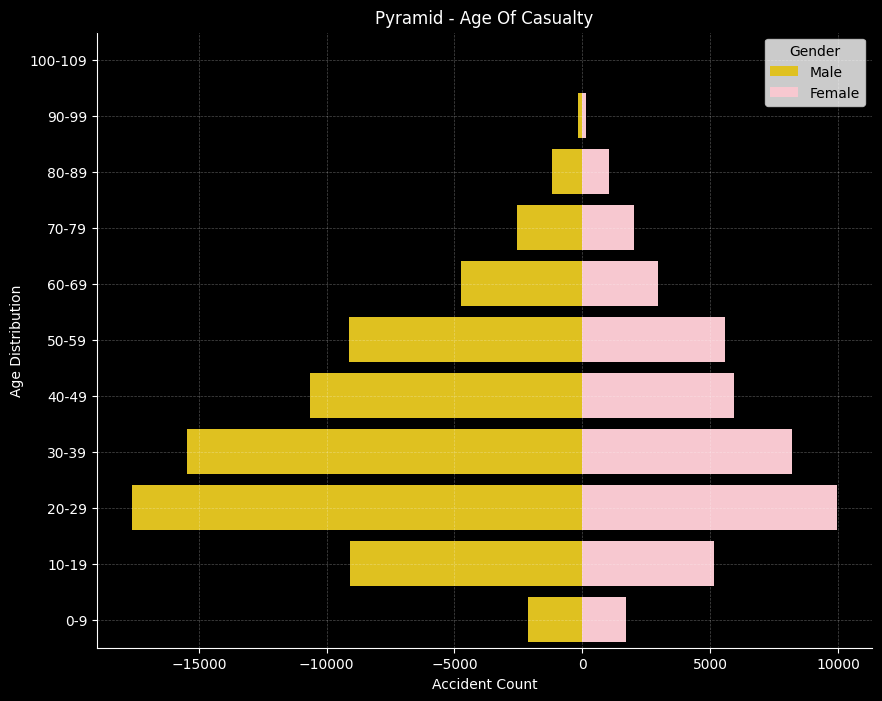

In [ ]:
# plot age ditribution of casualties involved in the accident
gender_age_pyramid(casualty, 'age_of_casualty', 'sex_of_casualty')

<h4 style="color: red ">
Result Observation: <br>

This accident pyramid plot displays the number of accidents by gender across age groups. Males (left) consistently exhibit higher accident counts than females ( right), especially in younger demographics. The disparity decreases with age, approaching parity in the 70-79 age group.
</h4>

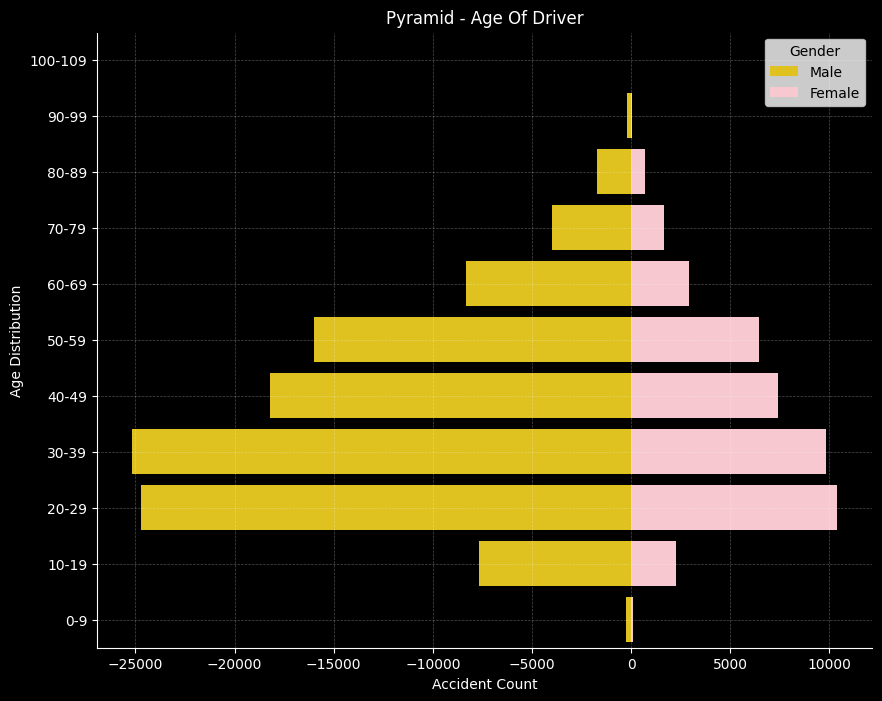

In [ ]:
# plot age ditribution of drivers involved in the accident
gender_age_pyramid(vehicle, 'age_of_driver', 'sex_of_driver')

<h4 style="color: red ">
Result Observation: <br>

This pyramid plot also show accident counts involving male and female drivers across various age groups. The age range is from 0-9 to 100-109, with males (left) generally involved in more accidents than females (right). The disparity in accident counts is prominent in younger ages, with numbers evening out as age increases.
</h4>

<h3 style="color: blue "> Analysis of Accident Incidence
</h3>

<h4 style="color: blue "> Time Series Of Accident
</h4>

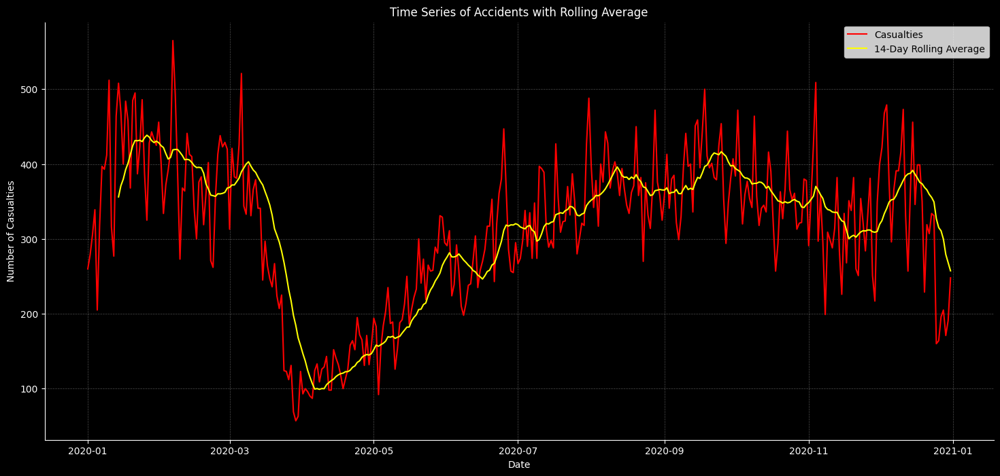

In [ ]:
# function to create time series
def accident_time_series(dataframe):
    """
    Plots the time series of accidents along with a rolling average.

    Args:
    dataframe (pd.DataFrame): DataFrame containing accident data.
    """
    # Creating a DataFrame for time series analysis
    ts_df = pd.DataFrame()
    ts_df["Casualties"] = dataframe.groupby("date")['number_of_casualties'].sum()  # Use sum() if you want total casualties per date

    # Calculate rolling average
    rolling_avg = ts_df["Casualties"].rolling(window=14).mean()

    # Plotting the time series and rolling average
    background_color = 'black'  # Dark gray background
    fig, ax = plt.subplots(figsize=(18, 8))

    # Plot lines
    ax.plot(ts_df.index, ts_df['Casualties'], color='red', label='Casualties')
    ax.plot(ts_df.index, rolling_avg, color='yellow', label='14-Day Rolling Average')

    # Setting plot configurations with themed style
    fig.patch.set_facecolor(background_color)
    ax.set_facecolor(background_color)

    # Grid lines
    ax.grid(True, which='both', axis='y', linestyle='--', linewidth=0.5, color='white', alpha=0.3)
    ax.grid(True, which='both', axis='x', linestyle='--', linewidth=0.5, color='white', alpha=0.3)

    # Set the colors of the axes and labels to a lighter color for visibility
    ax.tick_params(colors='white', which='both')  # Change the colors of the ticks
    ax.spines['bottom'].set_color('white')
    ax.spines['left'].set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.title.set_color('white')

    # Title and labels with formatted text color
    ax.set_title('Time Series of Accidents with Rolling Average', color='white')
    ax.set_xlabel('Date', color='white')
    ax.set_ylabel('Number of Casualties', color='white')

    # Legend with adjusted colors
    ax.legend()

    # Display the plot
    plt.show()

# call function to plot time series
accident_time_series(accident)


<h4 style="color: red ">
Result Observation: <br>

The graph displays a time series of accident casualties of year 2020, overlaid with a 14-day rolling average. The red line represents daily casualty numbers, which show considerable variability, while the yellow line smooths out these fluctuations to reveal underlying trends. Initially, casualties decrease, then gradually rise around mid-year before declining sharply towards the end of the year.
</h4>

<h4 style="color: blue "> Analysis of Caualty Class
</h4>

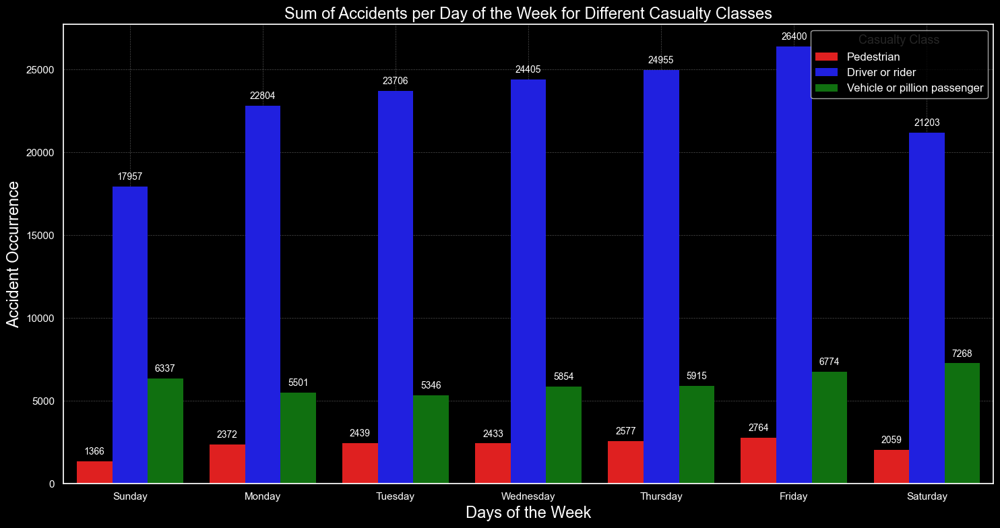

In [ ]:
# function to visualize Sum of Accidents per Day of the Week for Different Casualty Classes
def sum_casualty(dataframe):
    """
    Creates a count plot to visualize the occurrence of accidents involving motorbikes by day of the week.

    Args:
    dataframe (pd.DataFrame): DataFrame containing accident data with columns 'day_of_week' and 'casualty_class'.
    """
    # Define the order of days of the week for plotting
    order = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

    # Setting the plot with specific aesthetic styles
    sns.set_theme(style="darkgrid", rc={"axes.facecolor": "black", "figure.facecolor": "black"})
    plt.figure(figsize=(15, 8))

    # Create a countplot to visualize the relationship between days of the week and accident occurrences
    ax = sns.countplot(x='day_of_week', hue='casualty_class', data=dataframe, order=order,
                       palette=['red', 'blue', 'green'], edgecolor='none', linewidth=0)

    # Annotate each bar in the countplot with its corresponding count
    for p in ax.patches:
        patch_height = p.get_height()
        ax.annotate(f'{int(patch_height)}', (p.get_x() + p.get_width() / 2., patch_height),
                    ha='center', va='center', fontsize=10, color='white', xytext=(0, 10),
                    textcoords='offset points')

    # Customizing plot appearance
    ax.set_xlabel('Days of the Week', fontsize=17, color='white')
    ax.set_ylabel('Accident Occurrence', fontsize=17, color='white')
    ax.set_title('Sum of Accidents per Day of the Week for Different Casualty Classes', fontsize=17, color='white')
    ax.tick_params(axis='x', colors='white')
    ax.tick_params(axis='y', colors='white')
    ax.grid(True, linestyle='--', linewidth=0.5, color='white', alpha=0.3)

    # Adjust the legend with white text
    legend = plt.legend(title='Casualty Class', title_fontsize='13', fontsize='12', loc='upper right')
    plt.setp(legend.get_texts(), color='white')  # Set the color of the legend texts to white

    # Show the plot
    plt.tight_layout()
    plt.show()

# Call function to visualize
sum_casualty(total_data)


<h4 style="color: red ">
Result Observation: <br>
    
The bar chart displays weekly accident occurrences by casualty class: pedestrians (red), drivers/riders (blue), and vehicle passengers (green). Friday sees the highest incidents across all classes, with drivers/riders consistently dominating. Sunday records the fewest accidents. Pedestrian incidents slightly increase on weekends.
</h4>

<h1 style="color: blue "> ANALYSIS
</h1>

<h2 style="color: blue "> Question 1
</h2>
Are there significant hours of the day, and days of the week, on which accidents occur?

In [ ]:
# import FixedLocator and FixedFormatter from matplotlib
from matplotlib.ticker import FixedLocator, FixedFormatter
warnings.filterwarnings("ignore", category=DeprecationWarning) # Ignore deprecation warnings

# create class to analyze hours and days of accident
class TrafficAnalysis:
    def __init__(self, accident):
        """
        Initialize the TrafficAnalysis class with a pandas DataFrame containing accident data.

        Args:
        accident (DataFrame): A pandas DataFrame with traffic accident data.
        """
        self.accident = accident

    def plot_casualties_by_hour(self):
        """
        Plots the sum of casualties for each hour of the day on a polar chart. The plot helps
        visualize the distribution of traffic accident casualties throughout the day.
        """
        self.accident['hour'] = pd.to_datetime(self.accident['time'], format='%H:%M').dt.hour
        casualties_per_hour = self.accident.groupby('hour')['number_of_casualties'].sum()
        full_casualties = np.zeros(24)
        for hour, count in casualties_per_hour.items():
            full_casualties[hour] = count
        full_casualties = np.append(full_casualties, full_casualties[0])
        hours = np.linspace(0, 2 * np.pi, 25, endpoint=True)

        #  set figure property for good visualization
        fig = plt.figure(figsize=(6, 6), facecolor='black')
        ax_polar = fig.add_subplot(111, projection='polar')
        ax_polar.plot(hours, full_casualties, color='red', linewidth=2.5)
        ax_polar.set_facecolor('black')
        ax_polar.set_theta_zero_location('N')
        ax_polar.set_theta_direction(-1)
        ax_polar.set_yticks([max(full_casualties)//4, max(full_casualties)//2, 3*max(full_casualties)//4, max(full_casualties)])
        ax_polar.set_yticklabels([f'{int(y)} casualties' for y in ax_polar.get_yticks()])
        ax_polar.xaxis.set_major_locator(FixedLocator(hours[:-1]))
        ax_polar.xaxis.set_major_formatter(FixedFormatter([f"{i:02d}:00" for i in range(24)]))
        ax_polar.grid(color='white', linestyle='-', linewidth=0.75, alpha=0.5)
        ax_polar.tick_params(axis='both', colors='white')
        ax_polar.set_title("Hourly Distribution of Traffic Accident Casualties", va='bottom', color='white', fontsize=16)
        ax_polar.spines['polar'].set_color('gray')
        ax_polar.spines['polar'].set_alpha(0.5)

        plt.show()

    def plot_accidents_by_hour(self):
        """
        Plots the count of accidents for each hour of the day using a polar chart. This visualization
        illustrates how traffic accident frequencies vary throughout the day.
        """
        accidents_per_hour = self.accident.groupby('hour').size()
        full_accidents = np.zeros(24)
        for hour, count in accidents_per_hour.items():
            full_accidents[hour] = count
        full_accidents = np.append(full_accidents, full_accidents[0])
        hours = np.linspace(0, 2 * np.pi, 25, endpoint=True)

        fig = plt.figure(figsize=(6, 6), facecolor='black')
        ax_polar = fig.add_subplot(111, projection='polar')
        ax_polar.plot(hours, full_accidents, color='red', linewidth=2.5)
        ax_polar.set_facecolor('black')
        ax_polar.set_theta_zero_location('N')
        ax_polar.set_theta_direction(-1)
        ax_polar.set_yticks([max(full_accidents)//4, max(full_accidents)//2, 3*max(full_accidents)//4, max(full_accidents)])
        ax_polar.set_yticklabels([f'{int(y)} accidents' for y in ax_polar.get_yticks()], color='white')
        ax_polar.xaxis.set_major_locator(FixedLocator(hours[:-1]))
        ax_polar.xaxis.set_major_formatter(FixedFormatter([f"{i:02d}:00" for i in range(24)]))
        ax_polar.grid(color='white', linestyle='-', linewidth=0.75, alpha=0.5)
        ax_polar.tick_params(axis='both', colors='white')
        ax_polar.set_title("Hourly Distribution of Traffic Accidents", va='bottom', color='white', fontsize=16)
        ax_polar.spines['polar'].set_color('gray')
        ax_polar.spines['polar'].set_alpha(0.5)

        plt.show()

    def plot_accidents_heatmap(self):
        """
        Plots a heatmap of traffic accidents, grouped by day of the week and hour of the day. This plot provides
        a detailed overview of accident frequencies according to time slots and days, enhancing understanding of peak
        accident times.
        """
        heatmap_data = self.accident.pivot_table(index='day_of_week', columns='hour', values='accident_index', aggfunc='count', fill_value=0)
        weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        heatmap_data = heatmap_data.reindex(weekday_order)
        heatmap_data['Total'] = heatmap_data.sum(axis=1)

        plt.figure(figsize=(14, 8))
        ax = sns.heatmap(heatmap_data.iloc[:, :-1], cmap='viridis', linewidths=.5, annot=True, fmt="d", annot_kws={'color': 'red'},
                         cbar_kws={'orientation': 'horizontal', 'pad': 0.1, 'aspect': 40})
        plt.title('Heatmap of Traffic Accidents by Day of Week and Hour', color='white', fontsize=16)
        plt.xlabel('Hour of the Day', color='white', fontsize=14)
        plt.ylabel('Day of the Week', color='white', fontsize=14)
        for i, total in enumerate(heatmap_data['Total']):
            ax.text(heatmap_data.shape[1] - 0.5, i, f'{int(total)} Total', va='center', ha='left', color='white', fontsize=12)
        ax.xaxis.set_tick_params(color='white', labelcolor='white')
        ax.yaxis.set_tick_params(color='white', labelcolor='white')
        plt.xticks(color='white')
        plt.yticks(rotation=0, color='white', ha='right')
        cbar = ax.collections[0].colorbar
        cbar.ax.xaxis.set_tick_params(color='white', labelcolor='white')
        cbar.set_label('Number of Accidents', color='white', fontsize=12)
        cbar.ax.xaxis.label.set_color('white')
        for _, spine in ax.spines.items():
            spine.set_color('white')

        plt.show()


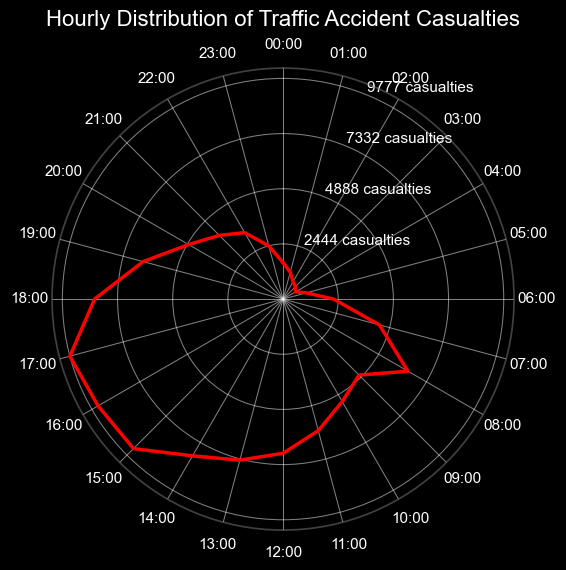

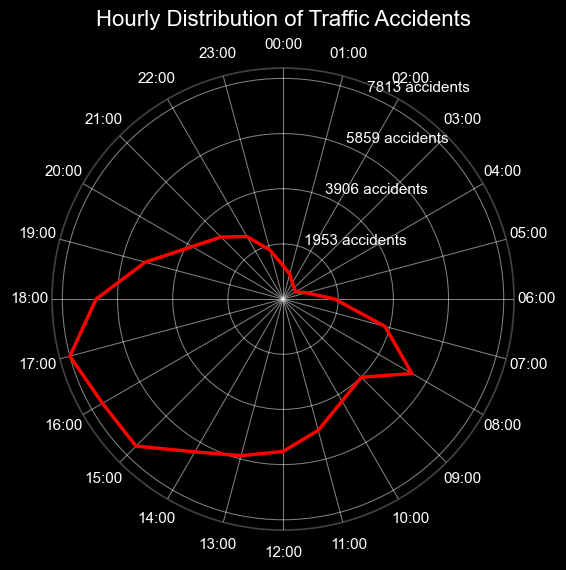

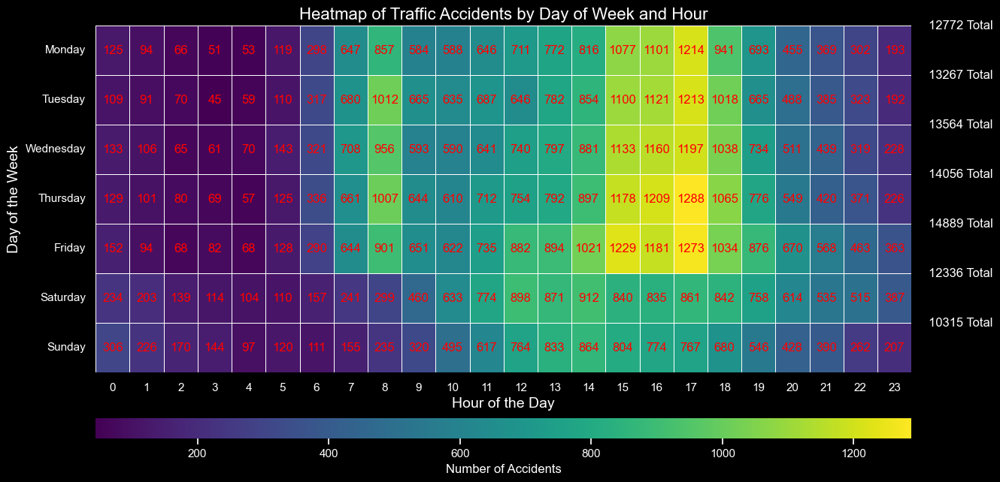

In [ ]:
# Create an instance of TrafficAnalysis
traffic_analysis = TrafficAnalysis(accident)

# Call the methods to plot
traffic_analysis.plot_casualties_by_hour()
traffic_analysis.plot_accidents_by_hour()
traffic_analysis.plot_accidents_heatmap()

<h2 style="color: blue "> Question 2
</h2>
For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur? We suggest a focus on: Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc

In [ ]:
# create class for motocyle analysis
class MotorcycleAccidentAnalysis:
    def __init__(self, accident_data):
        """
        Initialize the class with the accident data DataFrame.

        Parameters:
        - accident_data: pandas.DataFrame with columns necessary for all plotting methods.
        """
        self.accident_data = accident_data

    def plot_motorcycle_casualties_by_hour(self, engine_capacity):
        """
        Plots a polar graph of the number of motorcycle casualties per hour, filtered by engine capacity.

        Parameters:
        - engine_capacity: tuple, defines the engine capacity range to filter motorcycles.
        """
        accident = self.accident_data
        accident['hour'] = pd.to_datetime(accident['time'], format='%H:%M').dt.hour
        motorcycle_accidents = accident[
            (accident['vehicle_type'].str.contains('Motorcycle', na=False)) &
            (accident['engine_capacity_cc'].between(engine_capacity[0], engine_capacity[1]))
        ]
        casualties_per_hour = motorcycle_accidents.groupby('hour')['number_of_casualties'].sum()
        full_casualties = np.zeros(24)
        for hour, count in casualties_per_hour.items():
            full_casualties[hour] = count
        hours = np.linspace(0, 2 * np.pi, 25, endpoint=True)
        full_casualties = np.append(full_casualties, full_casualties[0])
        fig = plt.figure(figsize=(6, 6), facecolor='black')
        ax_polar = fig.add_subplot(111, projection='polar')
        ax_polar.plot(hours, full_casualties, color='red', linewidth=2.5)
        ax_polar.set_facecolor('black')
        ax_polar.set_theta_zero_location('N')
        ax_polar.set_theta_direction(-1)
        ax_polar.set_yticks([max(full_casualties)//4, max(full_casualties)//2, 3*max(full_casualties)//4, max(full_casualties)])
        ax_polar.set_yticklabels([f'{int(y)} casualties' for y in ax_polar.get_yticks()])
        ax_polar.xaxis.set_major_locator(FixedLocator(hours[:-1]))
        ax_polar.xaxis.set_major_formatter(FixedFormatter([f"{i:02d}:00" for i in range(24)]))
        ax_polar.grid(color='white', linestyle='-', linewidth=0.75, alpha=0.5)
        ax_polar.tick_params(axis='both', colors='white')
#         ax_polar.set_title("Hourly Distribution of Motorcycle Casualties", va='bottom', color='white', fontsize=16)
        ax_polar.set_title(f"Hourly Distribution of Motorcycle Casualties\n(Engine: {engine_capacity[0]}cc to {engine_capacity[1]}cc)",
                           va='bottom', color='white', fontsize=16)
        ax_polar.spines['polar'].set_color('gray')
        ax_polar.spines['polar'].set_alpha(0.5)
        plt.show()

    def plot_motorcycle_accidents_by_hour(self, engine_capacity):
        """
        Plots a polar graph of the number of motorcycle accidents per hour, filtered by engine capacity.

        Parameters:
        - engine_capacity: tuple, defines the engine capacity range to filter motorcycles.
        """
        accident = self.accident_data
        if 'hour' not in accident.columns:
            accident['hour'] = pd.to_datetime(accident['time'], format='%H:%M').dt.hour
        motorcycle_accidents = accident[
            (accident['vehicle_type'].str.contains('Motorcycle', na=False)) &
            (accident['engine_capacity_cc'].between(engine_capacity[0], engine_capacity[1]))
        ]
        accidents_per_hour = motorcycle_accidents.groupby('hour').size()
        full_accidents = np.zeros(24)
        for hour, count in accidents_per_hour.items():
            full_accidents[hour] = count
        hours = np.linspace(0, 2 * np.pi, 25, endpoint=True)
        full_accidents = np.append(full_accidents, full_accidents[0])
        fig = plt.figure(figsize=(6, 6), facecolor='black')
        ax_polar = fig.add_subplot(111, projection='polar')
        ax_polar.plot(hours, full_accidents, color='red', linewidth=2.5)
        ax_polar.set_facecolor('black')
        ax_polar.set_theta_zero_location('N')
        ax_polar.set_theta_direction(-1)
        ax_polar.set_yticks([max(full_accidents)//4, max(full_accidents)//2, 3*max(full_accidents)//4, max(full_accidents)])
        ax_polar.set_yticklabels([f'{int(y)} accidents' for y in ax_polar.get_yticks()])
        ax_polar.xaxis.set_major_locator(FixedLocator(hours[:-1]))
        ax_polar.xaxis.set_major_formatter(FixedFormatter([f"{i:02d}:00" for i in range(24)]))
        ax_polar.grid(color='white', linestyle='-', linewidth=0.75, alpha=0.5)
        ax_polar.tick_params(axis='both', colors='white')
        ax_polar.set_title(f"Hourly Distribution of Motorcycle Accidents\n(Engine: {engine_capacity[0]}cc to {engine_capacity[1]}cc)",
                           va='bottom', color='white', fontsize=16)
        ax_polar.spines['polar'].set_color('gray')
        ax_polar.spines['polar'].set_alpha(0.5)
        plt.show()

    def plot_motorcycle_accidents_heatmap(self, engine_capacity):
        """
        Plots an enhanced heatmap of motorcycle accidents by day of the week and hour, filtered by engine capacity.

        Parameters:
        - engine_capacity: tuple, defines the engine capacity range to filter motorcycles.
        """
        accident = self.accident_data
        motorcycle_accidents = accident[
            (accident['vehicle_type'].str.contains('Motorcycle', na=False)) &
            (accident['engine_capacity_cc'].between(engine_capacity[0], engine_capacity[1]))
        ]
        heatmap_data = motorcycle_accidents.pivot_table(index='day_of_week', columns='hour', values='accident_index', aggfunc='count', fill_value=0)
        weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        heatmap_data = heatmap_data.reindex(weekday_order)
        heatmap_data['Total'] = heatmap_data.sum(axis=1)
        plt.figure(figsize=(14, 8), facecolor = 'black')
        ax = sns.heatmap(heatmap_data.iloc[:, :-1], cmap='viridis', linewidths=.5, annot=True, fmt="d", annot_kws={'color': 'red'},
                         cbar_kws={'orientation': 'horizontal', 'pad': 0.1, 'aspect': 40})
        plt.title(f'Heatmap of Motorcycle Accidents by Day of Week and Hour\n(Engine Capacity: {engine_capacity[0]}cc to {engine_capacity[1]}cc)',
                  color='white', fontsize=16)
        plt.xlabel('Hour of the Day', color='white', fontsize=14)
        plt.ylabel('Day of the Week', color='white', fontsize=14)
        for i, total in enumerate(heatmap_data['Total']):
            ax.text(heatmap_data.shape[1] - 0.5, i, f'{int(total)} Total', va='center', ha='left', color='white', fontsize=12)
        ax.xaxis.set_tick_params(color='white', labelcolor='white')
        ax.yaxis.set_tick_params(color='white', labelcolor='white')
        plt.xticks(color='white')
        plt.yticks(rotation=0, color='white', ha='right')
        cbar = ax.collections[0].colorbar
        cbar.ax.xaxis.set_tick_params(color='white', labelcolor='white')
        cbar.set_label('Number of Accidents', color='white', fontsize=12)
        cbar.ax.xaxis.label.set_color('white')
        for _, spine in ax.spines.items():
            spine.set_color('white')
        plt.show()


<h3 style="color: blue "> Analyzing accidents for motorcycles with engine capacity of 125cc and under
</h3>



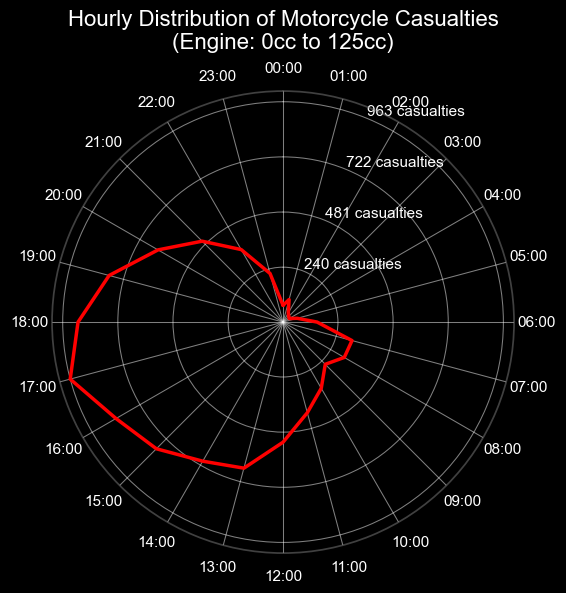

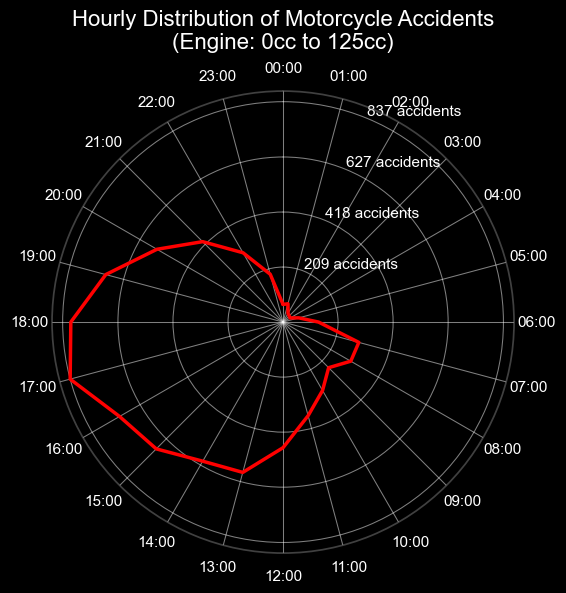

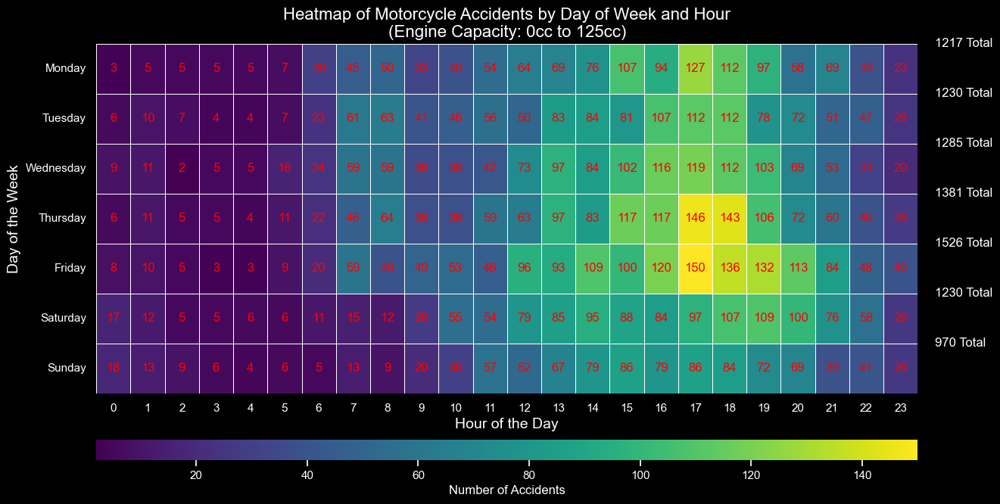

In [ ]:
# Create an instance of TrafficAnalysis
motorbike_analysis = MotorcycleAccidentAnalysis(total_data)

# Call the methods to plot
motorbike_analysis.plot_motorcycle_casualties_by_hour((0, 125))
motorbike_analysis.plot_motorcycle_accidents_by_hour((0, 125))
motorbike_analysis.plot_motorcycle_accidents_heatmap((0, 125))

<h3 style="color: blue "> Analyzing accidents for motorcycles with engine capacity over 125cc and up to 500cc</h3>

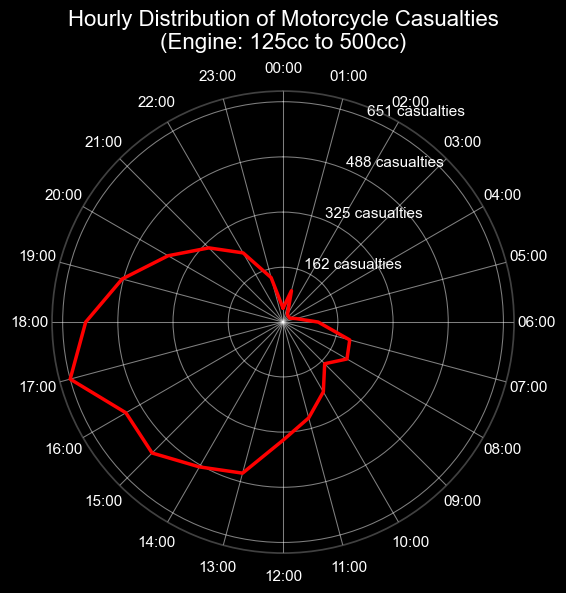

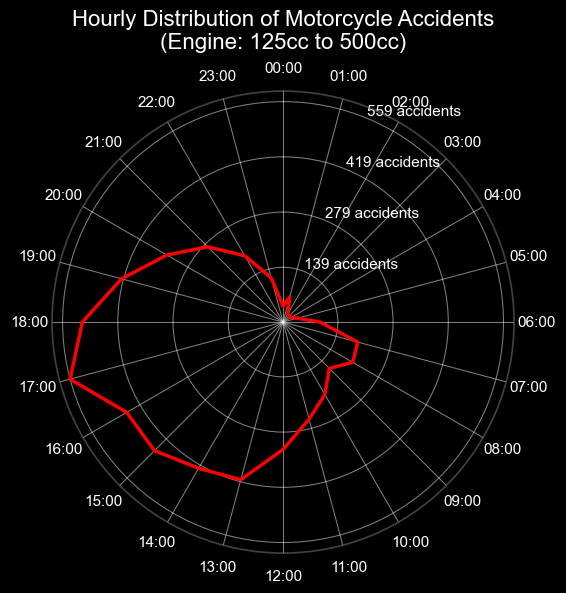

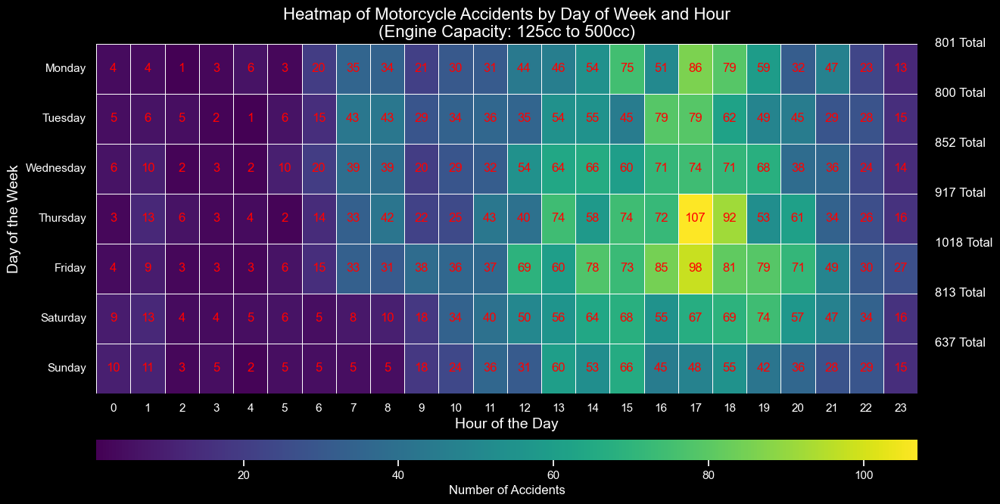

In [ ]:
# Call the methods to plot
motorbike_analysis.plot_motorcycle_casualties_by_hour((125, 500))
motorbike_analysis.plot_motorcycle_accidents_by_hour((125, 500))
motorbike_analysis.plot_motorcycle_accidents_heatmap((125, 500))

<h3 style="color: blue ">Analyzing accidents for motorcycles with engine capacity over 500cc</h3>

In [ ]:
# let check the upper limit of motorcycle types
total_data['vehicle_type'].unique()

array(['Car', 'Taxi/Private hire car',
       'Motorcycle over 50cc and up to 125cc',
       'Motorcycle 50cc and under',
       'Bus or coach (17 or more passenger seats)', 'Pedal cycle',
       'Other vehicle',
       'Van/Goods vehicle 3.5 tonnes maximum gross weight (mgw) and under',
       'Motorcycle over 125cc and up to 500cc', 'Motorcycle over 500cc',
       'Goods vehicle 7.5 tonnes mgw and over', 'Motorcycle – unknown cc',
       'Goods vehicle over 3.5 tonnes and under 7.5 tonnes mgw',
       'Goods vehicle – unknown weight',
       'Minibus (8 - 16 passenger seats)',
       'Agricultural vehicle (includes diggers etc.)',
       'Electric motorcycle', 'Mobility scooter', 'Tram/Light rail',
       'Ridden horse'], dtype=object)

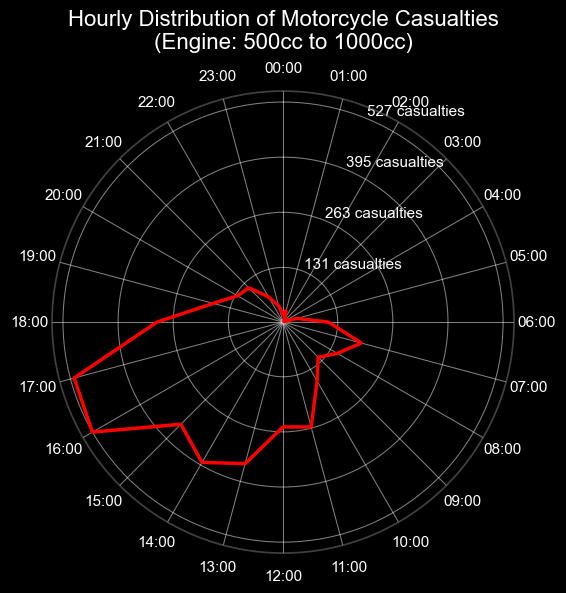

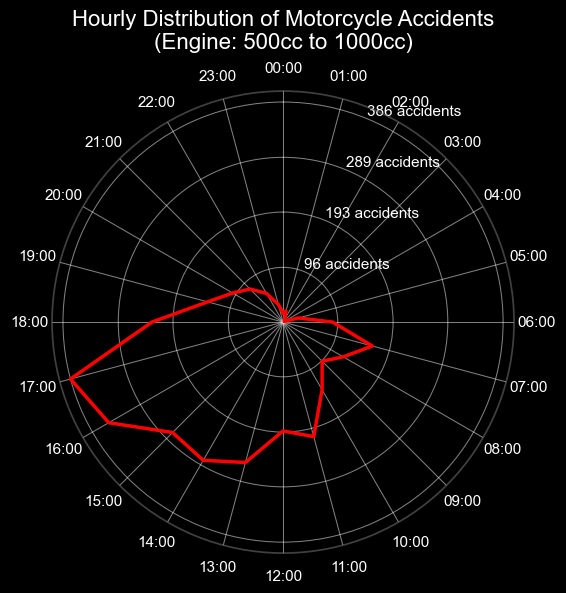

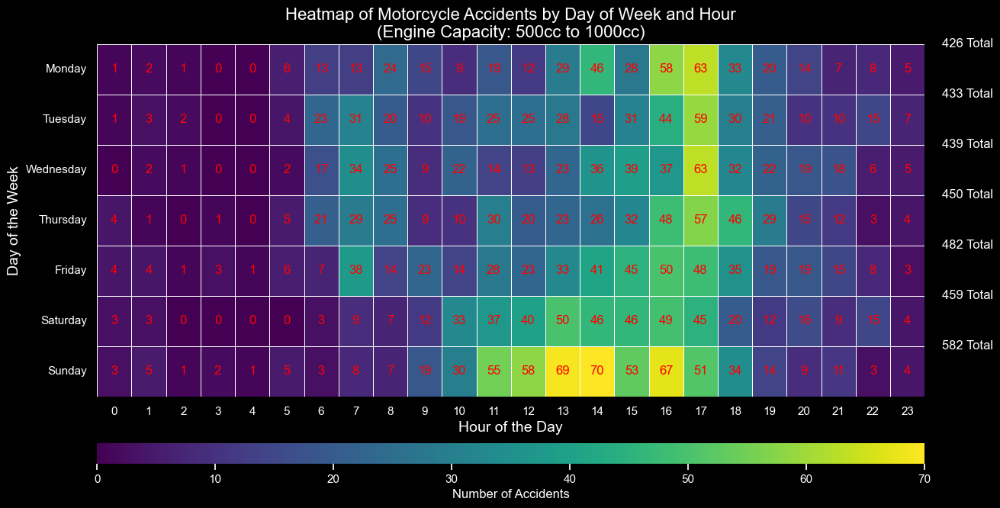

In [ ]:
# Call the methods to plot
motorbike_analysis.plot_motorcycle_casualties_by_hour((500, 1000))
motorbike_analysis.plot_motorcycle_accidents_by_hour((500, 1000))
motorbike_analysis.plot_motorcycle_accidents_heatmap((500, 1000))

<h2 style="color: blue "> Question 3
</h2>
For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?

In [ ]:
# create class for pedestrian analysis
class PedestrianAccidentAnalysis:
    def __init__(self, accident_data):
        """
        Initialize the class with the accident data DataFrame.

        Parameters:
        - accident_data: pandas.DataFrame with columns necessary for all plotting methods.
        """
        self.accident_data = accident_data

    def plot_pedestrian_casualties_by_hour(self):
        """
        Plots a polar graph of the number of pedestrian casualties per hour.
        """
        accident = self.accident_data
        accident['hour'] = pd.to_datetime(accident['time'], format='%H:%M').dt.hour
        pedestrian_accidents = accident[accident['casualty_class'] == 'Pedestrian']
        casualties_per_hour = pedestrian_accidents.groupby('hour')['number_of_casualties'].sum()
        full_casualties = np.zeros(24)
        for hour, count in casualties_per_hour.items():
            full_casualties[hour] = count
        hours = np.linspace(0, 2 * np.pi, 25, endpoint=True)
        full_casualties = np.append(full_casualties, full_casualties[0])
        fig = plt.figure(figsize=(6, 6), facecolor='black')
        ax_polar = fig.add_subplot(111, projection='polar')
        ax_polar.plot(hours, full_casualties, color='red', linewidth=2.5)
        ax_polar.set_facecolor('black')
        ax_polar.set_theta_zero_location('N')
        ax_polar.set_theta_direction(-1)
        ax_polar.set_yticks([max(full_casualties)//4, max(full_casualties)//2, 3*max(full_casualties)//4, max(full_casualties)])
        ax_polar.set_yticklabels([f'{int(y)} casualties' for y in ax_polar.get_yticks()])
        ax_polar.xaxis.set_major_locator(FixedLocator(hours[:-1]))
        ax_polar.xaxis.set_major_formatter(FixedFormatter([f"{i:02d}:00" for i in range(24)]))
        ax_polar.grid(color='white', linestyle='-', linewidth=0.75, alpha=0.5)
        ax_polar.tick_params(axis='both', colors='white')
        ax_polar.set_title("Hourly Distribution of Pedestrian Casualties", va='bottom', color='white', fontsize=16)
        ax_polar.spines['polar'].set_color('gray')
        ax_polar.spines['polar'].set_alpha(0.5)
        plt.show()

    def plot_pedestrian_accidents_by_hour(self):
        """
        Plots a polar graph of the number of pedestrian accidents per hour.
        """
        accident = self.accident_data
        accident['hour'] = pd.to_datetime(accident['time'], format='%H:%M').dt.hour
        pedestrian_accidents = accident[accident['casualty_class'] == 'Pedestrian']
        accidents_per_hour = pedestrian_accidents.groupby('hour').size()
        full_accidents = np.zeros(24)
        for hour, count in accidents_per_hour.items():
            full_accidents[hour] = count
        hours = np.linspace(0, 2 * np.pi, 25, endpoint=True)
        full_accidents = np.append(full_accidents, full_accidents[0])
        fig = plt.figure(figsize=(6, 6), facecolor='black')
        ax_polar = fig.add_subplot(111, projection='polar')
        ax_polar.plot(hours, full_accidents, color='red', linewidth=2.5)
        ax_polar.set_facecolor('black')
        ax_polar.set_theta_zero_location('N')
        ax_polar.set_theta_direction(-1)
        ax_polar.set_yticks([max(full_accidents)//4, max(full_accidents)//2, 3*max(full_accidents)//4, max(full_accidents)])
        ax_polar.set_yticklabels([f'{int(y)} accidents' for y in ax_polar.get_yticks()])
        ax_polar.xaxis.set_major_locator(FixedLocator(hours[:-1]))
        ax_polar.xaxis.set_major_formatter(FixedFormatter([f"{i:02d}:00" for i in range(24)]))
        ax_polar.grid(color='white', linestyle='-', linewidth=0.75, alpha=0.5)
        ax_polar.tick_params(axis='both', colors='white')
        ax_polar.set_title("Hourly Distribution of Pedestrian Accidents", va='bottom', color='white', fontsize=16)
        ax_polar.spines['polar'].set_color('gray')
        ax_polar.spines['polar'].set_alpha(0.5)
        plt.show()

    def plot_pedestrian_accidents_heatmap(self):
        """
        Plots an enhanced heatmap of pedestrian accidents by day of the week and hour.
        """
        accident = self.accident_data
        pedestrian_accidents = accident[accident['casualty_class'] == 'Pedestrian']
        heatmap_data = pedestrian_accidents.pivot_table(index='day_of_week', columns='hour', values='accident_index', aggfunc='count', fill_value=0)
        weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        heatmap_data = heatmap_data.reindex(weekday_order)
        heatmap_data['Total'] = heatmap_data.sum(axis=1)
        plt.figure(figsize=(14, 8), facecolor = 'black')
        ax = sns.heatmap(heatmap_data.iloc[:, :-1], cmap='viridis', linewidths=.5, annot=True, fmt="d", annot_kws={'color': 'red'},
                         cbar_kws={'orientation': 'horizontal', 'pad': 0.1, 'aspect': 40})
        plt.title('Heatmap of Pedestrian Accidents by Day of Week and Hour', color='white', fontsize=16)
        plt.xlabel('Hour of the Day', color='white', fontsize=14)
        plt.ylabel('Day of the Week', color='white', fontsize=14)
        for i, total in enumerate(heatmap_data['Total']):
            ax.text(heatmap_data.shape[1] - 0.5, i, f'{int(total)} Total', va='center', ha='left', color='white', fontsize=12)
        ax.xaxis.set_tick_params(color='white', labelcolor='white')
        ax.yaxis.set_tick_params(color='white', labelcolor='white')
        plt.xticks(color='white')
        plt.yticks(rotation=0, color='white', ha='right')
        cbar = ax.collections[0].colorbar
        cbar.ax.xaxis.set_tick_params(color='white', labelcolor='white')
        cbar.set_label('Number of Accidents', color='white', fontsize=12)
        cbar.ax.xaxis.label.set_color('white')
        for _, spine in ax.spines.items():
            spine.set_color('white')
        plt.show()



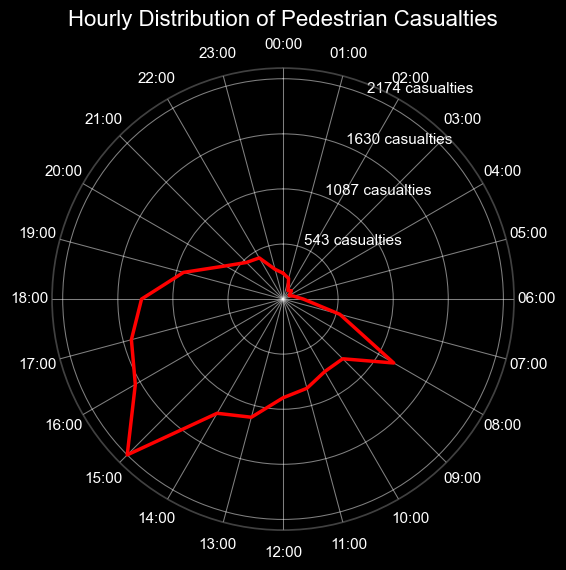

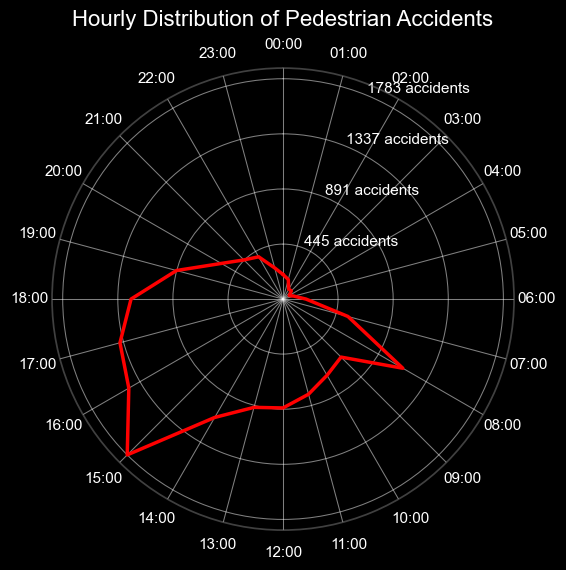

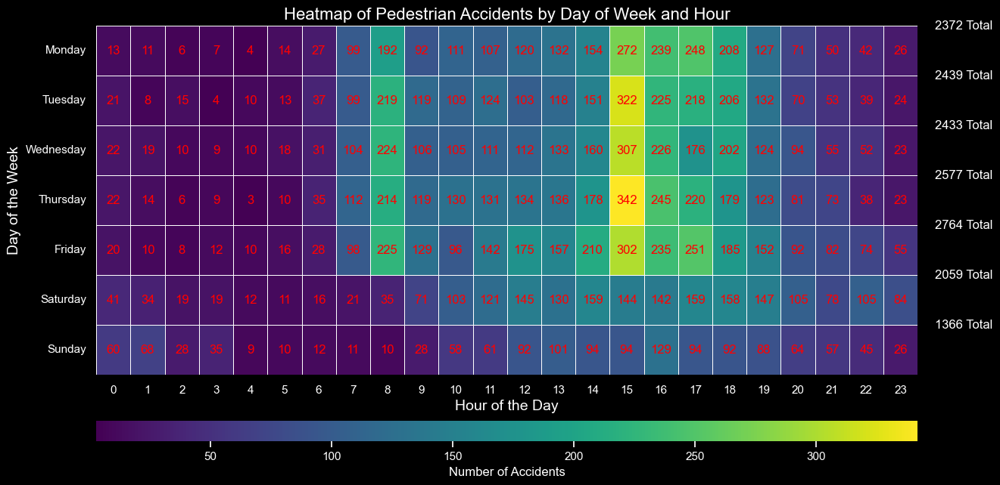

In [ ]:
# create object of the class and visualiz
pedestrian_analysis = PedestrianAccidentAnalysis(total_data)
pedestrian_analysis.plot_pedestrian_casualties_by_hour()
pedestrian_analysis.plot_pedestrian_accidents_by_hour()
pedestrian_analysis.plot_pedestrian_accidents_heatmap()


<h2 style="color: blue "> Question 4
</h2>
Using the apriori algorithm, explore the impact of selected variables on accident severity.

<h5 style="color: blue "> To analyze the impact of selected variables on accident severity using the Apriori algorithm, we can explore the relationships between different categorical variables and the severity of accidents, such as Slight, Serious, and Fatal. The Apriori algorithm is a classic data mining technique used for mining frequent itemsets and relevant association rules.
</h5>

In [ ]:
# import necessary library
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules

# Get copy of accident for this analysis, since we will modifying the table by adding some columns like itemset
accident_apriori = accident.copy()

# Checking if the time data needs conversion or not
if accident_apriori['time'].dtype == object and any(accident_apriori['time'].str.contains(':')):
    accident_apriori['time'] = pd.cut(pd.to_datetime(accident_apriori['time'], format='%H:%M').dt.hour,
                        bins=[0, 6, 12, 18, 24],
                        labels=['Night', 'Morning', 'Afternoon', 'Evening'],
                        right=False)

# Ensuring all items are string type and apply transformation for the Apriori algorithm
accident_apriori['items'] = accident_apriori.apply(lambda row: [str(row['accident_severity']),
                                    str(row['number_of_vehicles']) + '_vehicles',
                                    str(row['number_of_casualties']) + '_casualties',
                                    str(row['day_of_week']),
                                    str(row['time']),
                                    str(row['road_type']),
                                    str(row['speed_limit']) + '_speed',
                                    str(row['weather_conditions']),
                                    str(row['road_surface_conditions']),
                                    str(row['light_conditions']),
                                    str(row['urban_or_rural_area'])], axis=1)

te = TransactionEncoder()
# Fit and transform the data using TransactionEncoder
te_ary = te.fit(accident_apriori['items']).transform(accident_apriori['items'])
df_transformed = pd.DataFrame(te_ary, columns=te.columns_)

# Applying Apriori
frequent_itemsets = apriori(df_transformed, min_support=0.5, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.8)

# Analyze the results
# rules[['antecedents', 'consequents', 'support', 'confidence']]


In [ ]:
# print rule to analyze the result
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(2_vehicles),(1_casualties),0.629305,0.813178,0.507429,0.806332,0.991581,-0.004308,0.964651,-0.022391
1,(Daylight),(1_casualties),0.706784,0.813178,0.579239,0.819541,1.007826,0.004498,1.035264,0.026482
2,(Dry),(1_casualties),0.687486,0.813178,0.565861,0.823088,1.012188,0.006813,1.056021,0.038529
3,(Fine without high winds),(1_casualties),0.775546,0.813178,0.631432,0.814178,1.001230,0.000776,1.005383,0.005474
4,(Single carriageway),(1_casualties),0.733879,0.813178,0.598099,0.814983,1.002220,0.001325,1.009757,0.008324
5,(Slight),(1_casualties),0.783484,0.813178,0.644371,0.822443,1.011394,0.007259,1.052180,0.052029
6,(Urban Area),(1_casualties),0.676948,0.813178,0.573954,0.847855,1.042644,0.023474,1.227919,0.126604
7,(2_vehicles),(Slight),0.629305,0.783484,0.516749,0.821142,1.048065,0.023698,1.210546,0.123714
8,(Daylight),(Fine without high winds),0.706784,0.775546,0.578669,0.818735,1.055688,0.030525,1.238263,0.179904
9,(Dry),(Fine without high winds),0.687486,0.775546,0.645248,0.938563,1.210196,0.112072,3.653383,0.555775


In [ ]:
# filtering rules based on higher thresholds and focusing on the lift to extract value from a large dataset of association rules,

high_impact_rules = rules[(rules['support'] > 0.05) & (rules['confidence'] > 0.7) & (rules['lift'] > 1.2)]
high_impact_rules = high_impact_rules.sort_values(by='lift', ascending=False)

# print result of high-impact rules
high_impact_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
16,"(Fine without high winds, Daylight)",(Dry),0.578669,0.687486,0.504600,0.872001,1.268392,0.106773,2.441545,0.502218
13,"(1_casualties, Fine without high winds)",(Dry),0.631432,0.687486,0.529677,0.838850,1.220171,0.095576,1.939273,0.489578
15,"(Dry, Daylight)",(Fine without high winds),0.534589,0.775546,0.504600,0.943902,1.217081,0.090001,4.001112,0.383236
18,"(Fine without high winds, Slight)",(Dry),0.603186,0.687486,0.503394,0.834557,1.213927,0.088712,1.888959,0.444106
9,(Dry),(Fine without high winds),0.687486,0.775546,0.645248,0.938563,1.210196,0.112072,3.653383,0.555775
10,(Fine without high winds),(Dry),0.775546,0.687486,0.645248,0.831993,1.210196,0.112072,1.860122,0.773823
12,"(1_casualties, Dry)",(Fine without high winds),0.565861,0.775546,0.529677,0.936054,1.206962,0.090825,3.510056,0.394973
17,"(Dry, Slight)",(Fine without high winds),0.538328,0.775546,0.503394,0.935105,1.205738,0.085895,3.458751,0.369598


In [ ]:
# Check what unique values are present in antecedents and consequents
print("Unique antecedents:", rules['antecedents'].unique())
print("Unique consequents:", rules['consequents'].unique())


Unique antecedents: [frozenset({'2_vehicles'}) frozenset({'Daylight'}) frozenset({'Dry'})
 frozenset({'Fine without high winds'}) frozenset({'Single carriageway'})
 frozenset({'Slight'}) frozenset({'Urban Area'})
 frozenset({'1_casualties', 'Dry'})
 frozenset({'1_casualties', 'Fine without high winds'})
 frozenset({'Dry', 'Fine without high winds'})
 frozenset({'Dry', 'Daylight'})
 frozenset({'Fine without high winds', 'Daylight'})
 frozenset({'Dry', 'Slight'})
 frozenset({'Fine without high winds', 'Slight'})]
Unique consequents: [frozenset({'1_casualties'}) frozenset({'Slight'})
 frozenset({'Fine without high winds'}) frozenset({'Dry'})]


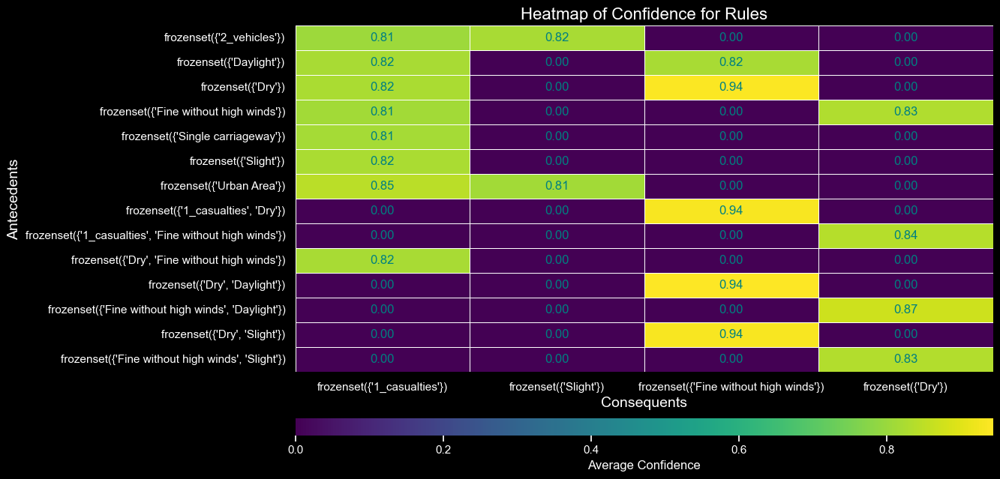

In [ ]:
# create function to plot the heatmap for the rules
def apriori_heatmap(rules):
    if not rules.empty:
        # Creating a pivot table for a heatmap
        pivot_table = rules.pivot_table(index='antecedents', columns='consequents', values='confidence', aggfunc='mean').fillna(0)

        if not pivot_table.empty:
            # Creating the heatmap
            plt.figure(figsize=(12, 8), facecolor='black')
            ax = sns.heatmap(pivot_table, annot=True, cmap='viridis', linewidths=.5, fmt=".2f",
                             annot_kws={'color': 'teal'}, cbar_kws={'orientation': 'horizontal', 'pad': 0.1, 'aspect': 40})
            plt.title('Heatmap of Confidence for Rules', color='white', fontsize=16)
            plt.xlabel('Consequents', color='white', fontsize=14)
            plt.ylabel('Antecedents', color='white', fontsize=14)
            ax.xaxis.set_tick_params(color='white', labelcolor='white')
            ax.yaxis.set_tick_params(color='white', labelcolor='white')
            plt.xticks(color='white')
            plt.yticks(rotation=0, color='white', ha='right')
            cbar = ax.collections[0].colorbar
            cbar.ax.xaxis.set_tick_params(color='white', labelcolor='white')
            cbar.set_label('Average Confidence', color='white', fontsize=12)
            cbar.ax.xaxis.label.set_color('white')
            for _, spine in ax.spines.items():
                spine.set_color('white')
            plt.show()
        else:
            print("Pivot table is empty. Check the filtering criteria.")
    else:
        print("Filtered rules dataframe is empty.")

# call function to plot heatmap
apriori_heatmap(rules)

<h2 style="color: blue "> Question 5
</h2>
Identify accidents in our region: Kingston upon Hull, Humberside, and the East Riding of Yorkshire etc. You can do this by filtering on LSOA, or police region or another method if you can find one. Run clustering on this data. What do these clusters reveal about the distribution of accidents in our region?

In [ ]:
accident.head(2)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,location_easting_osgr_binned,location_northing_osgr_binned,longitude_binned,latitude_binned,hour
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,2020-02-04,Tuesday,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,Unknown,Unknown,Daylight,Unknown,Unknown,None,None,Urban Area,No – self reporting,Non-trunk road,E01004576,"(465545.0, 530168.0]","(174569.0, 208599.0]","(-1.047, -0.125]","(51.457, 51.763]",9
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1,2,2020-04-27,Monday,13:55,9,Lambeth,Lambeth,A,3036,Single carriageway,20,Other junction,Automatic traffic signal,Unclassified,0,None within 50 metres,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01003034,"(465545.0, 530168.0]","(174569.0, 208599.0]","(-1.047, -0.125]","(51.457, 51.763]",13


In [ ]:
df_lsoa.head(1)

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,129865.232552,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43


<h3 style="color: blue "> Select Regions Of Interest For Analysis
</h3>

In [ ]:
# Filter LSOAs for specific regions (you might need a mapping of LSOA codes to regions)
relevant_lsoa_codes = df_lsoa[df_lsoa['lsoa01nm'].str.contains('Kingston upon Hull|Humberside|East Riding of Yorkshire')]['lsoa01cd']

# Filter accidents based on these LSOA codes
filtered_accidents = accident[accident['lsoa_of_accident_location'].isin(relevant_lsoa_codes)]

In [ ]:
# Check the Selected Regions Of Interest For Analysis
filtered_accidents

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,location_easting_osgr_binned,location_northing_osgr_binned,longitude_binned,latitude_binned,hour
37751,2020160914930,2020,160914930,506050.0,428813.0,-0.393424,53.744936,Humberside,Slight,2,1,2020-01-02,Thursday,11:20,228,"Kingston upon Hull, City of","Kingston upon Hull, City of",Unclassified,0,Single carriageway,30,Crossroads,Automatic traffic signal,Unclassified,0,None within 50 metres,Pedestrian phase at traffic signal junction,Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01012777,"(465545.0, 530168.0]","(378366.0, 1184351.0]","(-1.047, -0.125]","(53.297, 60.541]",11
37753,2020160915028,2020,160915028,510449.0,434112.0,-0.324858,53.791630,Humberside,Serious,1,1,2020-01-02,Thursday,17:30,228,"Kingston upon Hull, City of","Kingston upon Hull, City of",Unclassified,0,Single carriageway,30,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,No physical crossing facility within 50 metres,Darkness: street lights present and lit,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01012788,"(465545.0, 530168.0]","(378366.0, 1184351.0]","(-1.047, -0.125]","(53.297, 60.541]",17
37755,2020160915047,2020,160915047,510322.0,431457.0,-0.327733,53.767805,Humberside,Slight,1,1,2020-01-02,Thursday,21:00,228,"Kingston upon Hull, City of","Kingston upon Hull, City of",A,1165,Dual carriageway,30,Roundabout,Give way or uncontrolled,A,1165,None within 50 metres,No physical crossing facility within 50 metres,Darkness: street lights present and lit,Fine without high winds,Dry,None,Involvement with previous accident,Urban Area,Yes,Non-trunk road,E01012817,"(465545.0, 530168.0]","(378366.0, 1184351.0]","(-1.047, -0.125]","(53.297, 60.541]",21
37757,2020160915332,2020,160915332,511596.0,429551.0,-0.309102,53.750410,Humberside,Slight,1,1,2020-01-02,Thursday,12:34,228,"Kingston upon Hull, City of","Kingston upon Hull, City of",Unclassified,0,Single carriageway,30,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,No physical crossing facility within 50 metres,Daylight,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01012810,"(465545.0, 530168.0]","(378366.0, 1184351.0]","(-1.047, -0.125]","(53.297, 60.541]",12
37758,2020160915337,2020,160915337,509786.0,432528.0,-0.335481,53.777540,Humberside,Slight,2,1,2020-01-03,Friday,18:21,228,"Kingston upon Hull, City of","Kingston upon Hull, City of",Unclassified,0,Single carriageway,30,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,None within 50 metres,No physical crossing facility within 50 metres,Darkness: street lights present and lit,Fine without high winds,Dry,None,None,Urban Area,Yes,Non-trunk road,E01012817,"(465545.0, 530168.0]","(378366.0, 1184351.0]","(-1.047, -0.125]","(53.297, 60.541]",18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39452,2020161013646,2020,161013646,502981.0,432285.0,-0.438783,53.776745,Humberside,Slight,2,1,2020-12-22,Tuesday,16:10,231,East Riding of Yorkshire,East Riding of Yorkshire,Unclassified,0,Single carriageway,30,T or staggered junction,Gi

<h3 style="color: blue ">  Determine Number Of Clusters Using Elbow Method
</h3>
To build a clustering model to the selected regions, we will utilize the Elbow Method

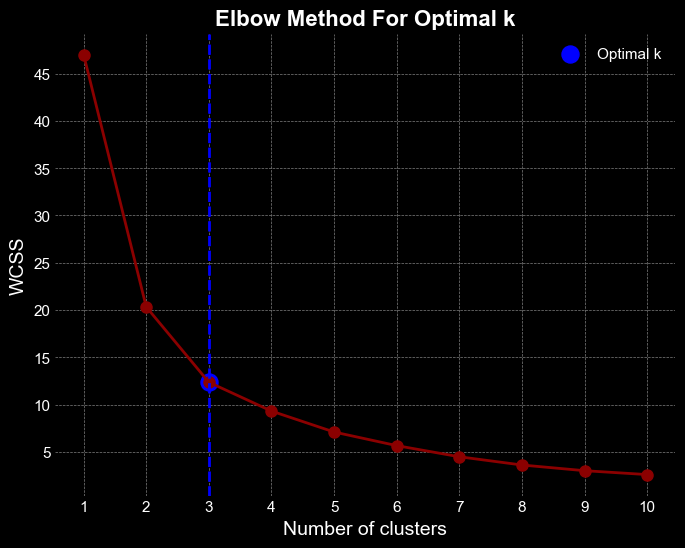

In [ ]:
# Ignore deprecation warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
from sklearn.cluster import KMeans

# extract 'longitude' and 'latitude'
coordinates = filtered_accidents[['longitude', 'latitude']]


def elbow_plot(coordinates):
    # Calculate within-cluster sum of squares (WCSS) for different numbers of clusters
    wcss = []
    for i in range(1, 11):  # Checking for 1 to 10 clusters
        kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
        kmeans.fit(coordinates)
        wcss.append(kmeans.inertia_)  # inertia_ is the WCSS

    # Adjust the style here if needed, or use plt.style.use('default') for a basic style
    plt.style.use('seaborn-darkgrid')

    # Create the plot
    fig, ax = plt.subplots(figsize=(8, 6), facecolor='black')
    ax.plot(range(1, 11), wcss, marker='o', linestyle='-', color='darkred', linewidth=2, markersize=8)
    ax.set_title('Elbow Method For Optimal k', fontsize=16, fontweight='bold', color='white')
    ax.set_xlabel('Number of clusters', fontsize=14, color='white')
    ax.set_ylabel('WCSS', fontsize=14, color='white')
    ax.set_xticks(range(1, 11))
    ax.set_facecolor('black')
    ax.set_yticks(range(0, int(max(wcss)), 5))

    # Configure tick color
    ax.tick_params(axis='both', colors='white')

    # Highlight the optimal k value if it's known
    optimal_k = 3
    ax.axvline(x=optimal_k, color='blue', linestyle='--', linewidth=2)
    ax.scatter(optimal_k, wcss[optimal_k-1], s=150, c='blue', label='Optimal k')

    # Setting the grid to be faint
    ax.grid(True, linestyle='--', linewidth=0.5, color='grey')

    # Set legend with white color
    legend = ax.legend()
    plt.setp(legend.get_texts(), color='white')

    plt.show()

elbow_plot(coordinates)

<h3 style="color: blue ">  Gaussian Mixture Models: Implementation
</h3>

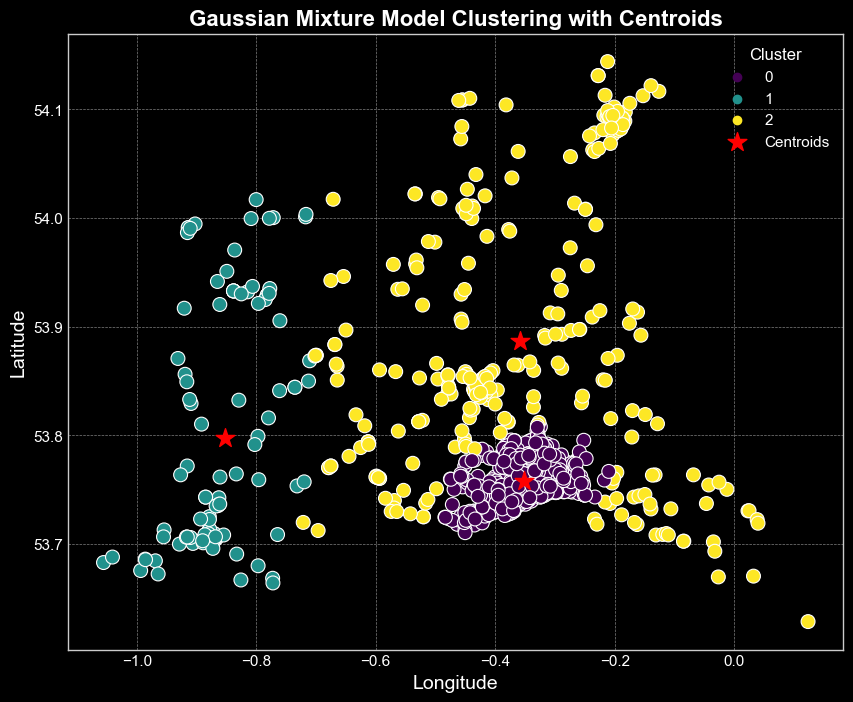

In [ ]:
# import gaussian misture from sklearn
from sklearn.mixture import GaussianMixture
warnings.filterwarnings("ignore", category=DeprecationWarning) # Ignore deprecation warnings

def ggm_clustring(coordinates):
    # Initialize GMM with 3 components
    gmm = GaussianMixture(n_components=3, random_state=0)
    gmm.fit(coordinates)

    # Predict the cluster for each data point
    cluster_labels = gmm.predict(coordinates)
    filtered_accidents['cluster'] = cluster_labels

    # Set the style
    plt.style.use('seaborn-whitegrid')

    # Plotting the clusters
    fig, ax = plt.subplots(figsize=(10, 8), facecolor ='black')
    sns.scatterplot(data=filtered_accidents, x='longitude', y='latitude', hue='cluster', palette='viridis', ax=ax, s=100)

    # Extracting and plotting centroids
    centroids = gmm.means_
    ax.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=200, color='red', label='Centroids')  # Centroids as red stars

    # Configure tick color
    ax.tick_params(axis='both', colors='white')

    # Setting the grid to be faint
    ax.grid(True, linestyle='--', linewidth=0.5, color='grey')

    ax.set_xlabel('Longitude', fontsize=14, color='white')
    ax.set_ylabel('Latitude', fontsize=14, color='white')
    ax.set_title('Gaussian Mixture Model Clustering with Centroids', fontsize=16, fontweight='bold', color='white')

    # Legend configuration with white text
    legend = ax.legend(title='Cluster')
    plt.setp(legend.get_texts(), color='white')
    plt.setp(legend.get_title(), color='white')

    ax.set_facecolor('black')

    plt.show()

# call function to visualize model
ggm_clustring(coordinates)

<h3 style="color: blue ">  Kmeans Model: Implementation
</h3>

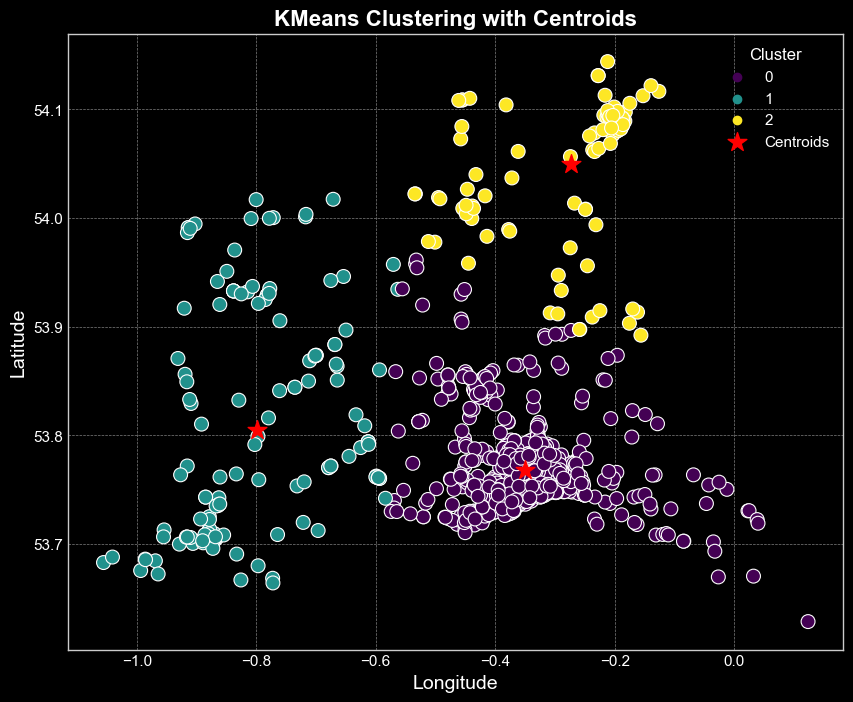

In [ ]:
# function to model and visualize clustring prediction
def kmean_clustring(coordinates):
    # Clustering
    kmeans = KMeans(n_clusters=3, random_state=0)
    kmeans.fit(coordinates)
    filtered_accidents['cluster'] = kmeans.labels_

    # Set the style
    plt.style.use('seaborn-whitegrid')

    # Plotting the data points and centroids
    fig, ax = plt.subplots(figsize=(10, 8), facecolor='black')
    sns.scatterplot(data=filtered_accidents, x='longitude', y='latitude', hue='cluster', palette='viridis', ax=ax, s=100)

    # Extracting centroids for plotting
    centroids = kmeans.cluster_centers_

    # Plot centroids on the same graph
    ax.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=200, color='red', label='Centroids')  # Centroids as red stars

    # Configure tick color
    ax.tick_params(axis='both', colors='white')

    # Setting the grid to be faint
    ax.grid(True, linestyle='--', linewidth=0.5, color='grey')

    ax.set_xlabel('Longitude', fontsize=14, color='white')
    ax.set_ylabel('Latitude', fontsize=14, color='white')
    ax.set_title('KMeans Clustering with Centroids', fontsize=16, fontweight='bold', color='white')

    # Legend configuration with white text
    legend = ax.legend(title='Cluster')
    plt.setp(legend.get_texts(), color='white')
    plt.setp(legend.get_title(), color='white')

    ax.set_facecolor('black')

    plt.show()

# call function to visualize model prediction
kmean_clustring(coordinates)

<h3 style="color: blue ">  DBSCAN Model: Implementation
</h3>

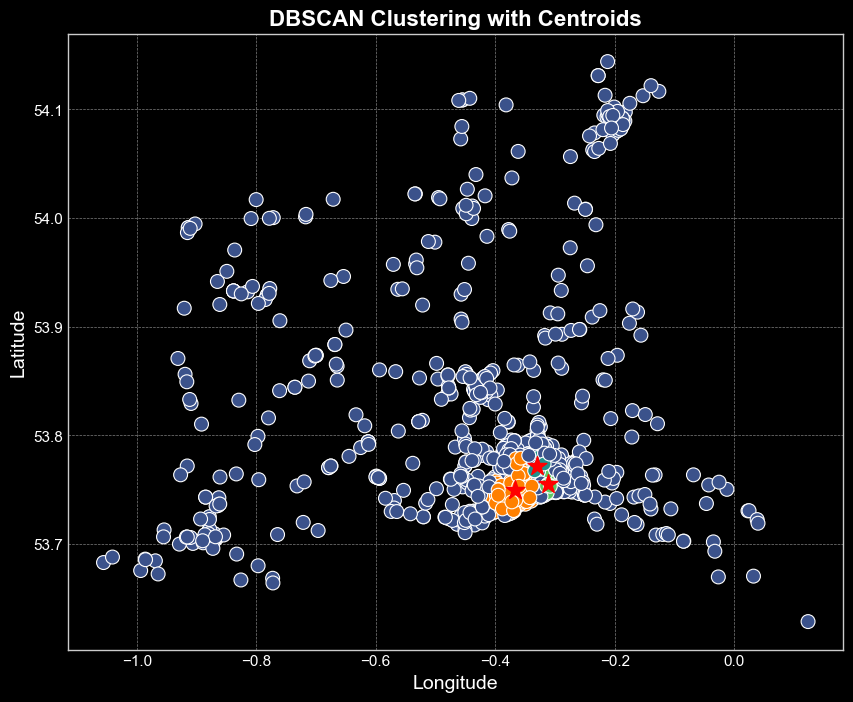

In [ ]:
from sklearn.cluster import DBSCAN

# function to model and visualize clustring prediction
def ddscan_clustring(coordinates):
    # Configure DBSCAN
    dbscan = DBSCAN(eps=0.01, min_samples=31)

    # Fit DBSCAN to the data
    cluster_labels = dbscan.fit_predict(coordinates)
    filtered_accidents['cluster'] = cluster_labels

    # Set the style
    plt.style.use('seaborn-whitegrid')

    # Visualize the clusters
    fig, ax = plt.subplots(figsize=(10, 8), facecolor='black')
    palette = sns.color_palette('viridis', np.unique(cluster_labels).max() + 1)
    cluster_colors = [palette[x] if x >= 0 else (1, 0.5, 0) for x in cluster_labels]  # Noise marked as orange
    sns.scatterplot(x='longitude', y='latitude', hue=cluster_labels, palette=cluster_colors, data=filtered_accidents, legend=None, ax=ax, s=100)

    # Calculate and plot centroids for each cluster (excluding noise with label -1)
    for cluster in set(cluster_labels):
        if cluster != -1:  # Exclude noise
            points_in_cluster = coordinates[cluster_labels == cluster]
            centroid = points_in_cluster.mean(axis=0)
            ax.scatter(centroid['longitude'], centroid['latitude'], marker='*', s=200, color='red')  # Centroids as red stars

    # Configure tick color
    ax.tick_params(axis='both', colors='white')

    # Setting the grid to be faint
    ax.grid(True, linestyle='--', linewidth=0.5, color='grey')

    ax.set_xlabel('Longitude', fontsize=14, color='white')
    ax.set_ylabel('Latitude', fontsize=14, color='white')
    ax.set_title('DBSCAN Clustering with Centroids', fontsize=16, fontweight='bold', color='white')

    ax.set_facecolor('black')

    plt.show()

# call function to show model prediction
ddscan_clustring(coordinates)

<h3 style="color: blue ">  Kmeans Model Based on Weather Condition and Speed Limit: Implementation
</h3>

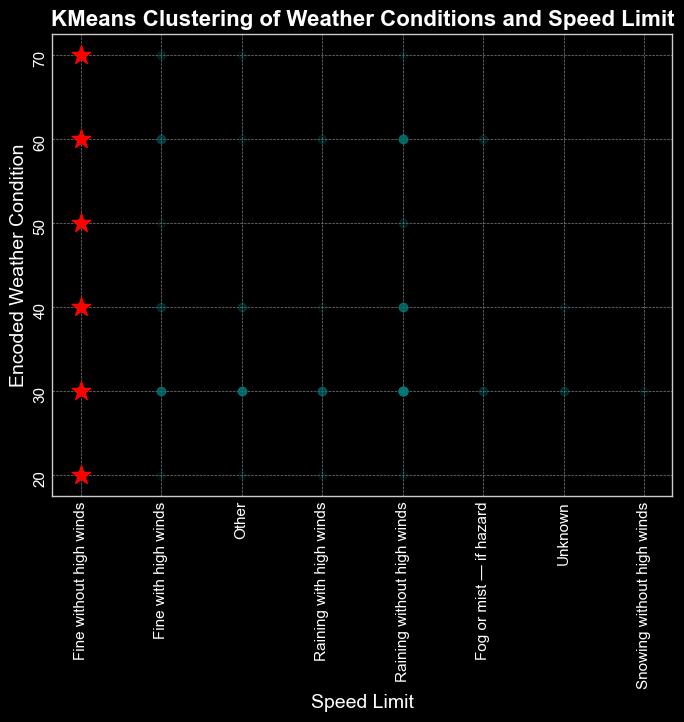

In [ ]:
from sklearn.preprocessing import OneHotEncoder

# function to model weather and speed effect on accident
def kmean_weather_speed(weather_conditions,speed_limit):
    # One-hot encode the 'weather_conditions' as they are categorical
    encoder = OneHotEncoder(sparse=False)
    weather_encoded = encoder.fit_transform(filtered_accidents[['weather_conditions']])
    weather_encoded_df = pd.DataFrame(weather_encoded, columns=encoder.get_feature_names_out())

    # Include 'speed_limit' in your DataFrame
    X_encoded = pd.concat([weather_encoded_df, filtered_accidents['speed_limit'].reset_index(drop=True)], axis=1)

    # Fit KMeans
    kmeans = KMeans(n_clusters=6, random_state=42)
    kmeans.fit(X_encoded)

    # Predict clusters
    clusters = kmeans.predict(X_encoded)

    # Set the style
    plt.style.use('seaborn-whitegrid')

    # Plotting
    fig, ax = plt.subplots(figsize=(8, 6), facecolor = 'black')

    # Background and grid
    ax.set_facecolor('black')  # Set the background color
    ax.grid(True, linestyle='--', linewidth=0.5, color='grey')  # Customize the grid

    # Plot individual data points
    ax.scatter(filtered_accidents['weather_conditions'], filtered_accidents['speed_limit'], alpha=0.1, c='teal', label='Data Points')

    # Plot centroids
    for idx, centroid in enumerate(kmeans.cluster_centers_):
        speed_limit_centroid = centroid[-1]  # Assuming 'speed_limit' is the last feature in the encoded DataFrame
        weather_centroid = np.argmax(centroid[:-1])  # Ignoring the 'speed_limit' in the last position
        decoded_weather = encoder.inverse_transform([centroid[:-1]])[0][0]
        ax.scatter(decoded_weather, speed_limit_centroid, marker='*', s=200, color='red', label=f'Cluster Center {idx}' if idx == 0 else "")

    # Enhancements
    ax.set_title('KMeans Clustering of Weather Conditions and Speed Limit', fontsize=16, fontweight='bold', color='white')
    ax.set_xlabel('Speed Limit', fontsize=14, color='white')
    ax.set_ylabel('Encoded Weather Condition', fontsize=14, color='white')
    ax.tick_params(axis='both', colors='white', rotation = 90)
    ax.grid(True, linestyle='--', linewidth=0.5, color='grey')
    # legend = ax.legend(title='Clusters and Data Points')
    # plt.setp(legend.get_texts(), color='white')
    # plt.setp(legend.get_title(), color='white')
    ax.set_facecolor('black')

    plt.show()

# call function
kmean_weather_speed('weather_conditions','speed_limit')

<h1 style="color: blue ">6.  Outlier Detection Methods
</h1>

##### We employed various methods for the outlier detection during our data cleaning above, some of them include:
- **Grubbs Test**
- **IQR Test**
- **Boxplot - Used for the visualization**

<h1 style="color: blue "> 7. Classification Modelling
</h1>

<h3 style="color: blue ">  SelectKBest Method
</h3>

**SelectKBest is used to select the top k features based on their chi-squared scores, which are calculated to assess the dependency between each feature and the target variable (in this case, 'Fatal Accident'). This feature selection step helps to identify the most relevant features for predicting survival on the accident dataset, in order to pick the best features, we will use total_data dataframe that housed the accident, casualty and vehicle dataframees.**

In [ ]:
# Ignore deprecation warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# check the dataframe we will be using
total_data.head(1)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,location_easting_osgr_binned,location_northing_osgr_binned,longitude_binned,latitude_binned,casualty_index,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,vehicle_index,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type,hour
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1,1,2020-02-04,Tuesday,09:00,10,Wandsworth,Wandsworth,Unclassified,0,Single carriageway,20,Not at or within 20 metres of junction,Authorised person,Unknown second road class,-9999,Unknown,Unknown,Daylight,Unknown,Unknown,None,None,Urban Area,No – self reporting,Non-trunk road,E01004576,"(465545.0, 530168.0]","(174569.0, 208599.0]","(-1.047, -0.125]","(51.457, 51.763]",484748,1,Pedestrian,Male,31,6,Slight,"In carriageway, not crossing","In carriageway, stationary - not crossing (sta...",Not a car passenger,Not a bus or coach passenger,Not applicable,0,Unknown,4,681716,1,Car,Unknown,Moving off,North,South,On main carriageway - not in restricted lane,"Not at, or within 20 metres of, junction","No skidding, jack-knifing or overturning",None,Did not leave carriageway,None,Nearside,Unknown,Not known,Female,32,6,1968,2,6,AUDI Q5,4,Unknown,9


<h4 style="color: blue "> Data Selection and Preparation for SelectKBest Method
</h4>

In [ ]:
# Features pick from total_data to apply selectBest

categorical_columns = [

    "day_of_week", "time",  "local_authority_ons_district",
    "local_authority_highway", "first_road_class", "road_type", "junction_detail",
    "junction_control", "second_road_class", "pedestrian_crossing_human_control",
    "pedestrian_crossing_physical_facilities", "light_conditions", "weather_conditions",
    "road_surface_conditions", "special_conditions_at_site", "carriageway_hazards",
    "urban_or_rural_area",  "trunk_road_flag", 'police_force',


 "pedestrian_location",
    "pedestrian_movement", "car_passenger", "bus_or_coach_passenger",

  "vehicle_type",
    "towing_and_articulation", "vehicle_manoeuvre", "vehicle_direction_from",
    "vehicle_direction_to", "vehicle_location_restricted_lane", "junction_location",
    "skidding_and_overturning",
    "vehicle_left_hand_drive",
  "sex_of_driver", "age_band_of_driver",

]

numerical_columns = [
    "number_of_vehicles", "number_of_casualties", "first_road_number",
     "speed_limit",  "age_of_driver",
    "engine_capacity_cc", "age_of_vehicle", "hour"
]


In [ ]:
y = total_data['accident_severity']

In [ ]:
# check and count our target column
total_data['accident_severity'].value_counts()

accident_severity
Slight     171376
Serious     44828
Fatal        4231
Name: count, dtype: int64

In [ ]:
from sklearn.preprocessing import LabelEncoder


# Convert categorical columns to type string
for col in categorical_columns:
    total_data[col] = total_data[col].astype(str)

# Convert numerical columns to type int (consider using .astype(float) if decimals are involved or expected)
for col in numerical_columns:
    total_data[col] = total_data[col].astype(int)

# Apply one-hot encoding to the categorical columns using pd.get_dummies
accident_encoded = pd.get_dummies(total_data, columns=categorical_columns, drop_first=True)

# Create the feature DataFrame 'x' from the updated accident DataFrame
x_columns = numerical_columns + [col for col in accident_encoded.columns if col.startswith(tuple(categorical_columns))]
x = accident_encoded[x_columns]

# Apply Label Encoding to the target variable
if total_data['accident_severity'].dtype == 'object':
    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(total_data['accident_severity'])
else:
    y = total_data['accident_severity'].values


<h4 style="color: blue ">  SelectKBest Selection and Feature Transformation
</h4>

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2

# Create a SelectKBest object
selector = SelectKBest(score_func=chi2, k=30)

# Fit the selector to the data
X_fitted = selector.fit(x, y)

# Transform the data to select the top k features
Xdata_new = selector.transform(x)

<h4 style="color: blue "> Get Top 30 Features selected by SelectKBest Method
</h4>

In [ ]:
# Get the mask of selected features - this boolean mask represents selected features
features_selected = selector.get_support()

# Map these indices to the correct column names
selected_columns = x.columns[features_selected]

# Print the names of the selected features
print("Selected features:", selected_columns)


Selected features: Index(['number_of_casualties', 'first_road_number', 'speed_limit',
       'age_of_driver', 'engine_capacity_cc', 'time_06:04', 'time_13:17',
       'local_authority_highway_Unknown Highway',
       'junction_detail_Not at or within 20 metres of junction',
       'junction_control_Automatic traffic signal',
       'second_road_class_Unknown second road class',
       'pedestrian_crossing_human_control_Unknown',
       'pedestrian_crossing_physical_facilities_Unknown',
       'urban_or_rural_area_Rural Area', 'urban_or_rural_area_Urban Area',
       'police_force_Metropolitan Police', 'police_force_Unknown_Station',
       'vehicle_type_Goods vehicle 7.5 tonnes mgw and over',
       'vehicle_type_Motorcycle over 500cc',
       'vehicle_manoeuvre_Going ahead left hand bend',
       'vehicle_manoeuvre_Going ahead right hand bend',
       'vehicle_manoeuvre_Unknown', 'vehicle_direction_from_Unknown',
       'vehicle_direction_to_Unknown',
       'vehicle_location_restrict

In [ ]:
# we are selecting 27 features

# Categorical Features
categorical_features = [
    'light_conditions', 'vehicle_left_hand_drive', 'junction_detail',
    'vehicle_direction_from', 'pedestrian_crossing_human_control',
    'vehicle_manoeuvre', 'vehicle_type', 'road_surface_conditions',
    'vehicle_direction_to', 'police_force', 'second_road_class',
    'pedestrian_crossing_physical_facilities', 'day_of_week', 'junction_location',
    'vehicle_location_restricted_lane', 'road_type', 'skidding_and_overturning',
    'urban_or_rural_area', 'weather_conditions', 'junction_control'
]

# Numerical Features
numerical_features = [
    'engine_capacity_cc', 'speed_limit', 'number_of_casualties',
    'first_road_number', 'number_of_vehicles', 'age_of_driver', 'hour'
]

# Convert categorical columns to type string
for col in categorical_columns:
    total_data[col] = total_data[col].astype(str)

# Convert numerical columns to type int (consider using .astype(float) if decimals are involved or expected)
for col in numerical_columns:
    total_data[col] = total_data[col].astype(int)

# Apply one-hot encoding to the categorical columns using pd.get_dummies
accident_encoded = pd.get_dummies(total_data, columns=categorical_columns, drop_first=True)

# Create the feature DataFrame 'x' from the updated accident DataFrame
x_columns = numerical_columns + [col for col in accident_encoded.columns if col.startswith(tuple(categorical_columns))]
x = accident_encoded[x_columns]



<h3 style="color: blue "> Data Spliting and Preparation for Machine Learning Model
</h3>

In [ ]:
from sklearn.model_selection import train_test_split

# Split the transformed data into training and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, stratify=y, random_state=64)


In [ ]:
# check y_train for class imbalance
np.unique(y_train, return_counts=True)

(array([0, 1, 2]), array([  3808,  40345, 154238], dtype=int64))

<h3 style="color: blue "> Data Transformation and SMOTE Method for Class Imbalance
</h3>

In [ ]:
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

# Scaling the training data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(x_train)

# Applying SMOTE to the scaled training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

# Scaling the test data (only transform, we do not want to fit to avoid data leak)
X_test_scaled = scaler.transform(x_test)

<h2 style="color: blue "> Traditional Machine Learning Models
</h2>

<h3 style="color: blue "> Random Forest Classifier
</h3>

In [ ]:
# import random forest classifier class method from sklearn
from sklearn.ensemble import RandomForestClassifier

# instantiate random forest classifier
clf = RandomForestClassifier(n_estimators=100,
    random_state=42,
    class_weight={0: 10, 1: 2, 2: 1})

# train model
clf.fit(X_train_resampled, y_train_resampled)  # Using resampled data from SMOTE

# Predict on the test data
y_pred_clf = clf.predict(X_test_scaled)

<h4 style="color: blue "> Evaluate Model Random Forest Classifier Model
</h4>

In [ ]:
# Import necessary libraries
from sklearn.metrics import confusion_matrix, classification_report
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# class to evaluate the model
class ModelEvaluator:
    def __init__(self, model_name):
        self.model_name = model_name

    def plot_confusion_matrix(self, true_labels, predictions):
        print(f'\tClassification Report for {self.model_name}:\n\n{classification_report(true_labels, predictions, digits=2)}\n\n')
        cm = confusion_matrix(true_labels, predictions)
        colors = ['blue', 'teal', 'purple']  # Colors for the classes
        cmap = ListedColormap(colors[:len(np.unique(true_labels))])  # Use colors based on the number of classes

        fig, ax = plt.subplots(figsize=(6, 6))
        color_grid = np.array([[0, 1, 2], [1, 2, 0], [2, 0, 1]])
        ax.matshow(color_grid, cmap=cmap)

        # Populate the confusion matrix with values
        for (i, j), val in np.ndenumerate(cm):
            ax.text(j, i, str(val), ha='center', va='center', color='white', fontsize=16)

        # Set the tick labels
        ax.set_xticks(np.arange(len(np.unique(true_labels))))
        ax.set_xticklabels(['Fatal', 'Serious', 'Slight'], color='white')
        ax.xaxis.set_label_position('bottom')
        ax.xaxis.tick_bottom()

        ax.set_yticks(np.arange(len(np.unique(true_labels))))
        ax.set_yticklabels(['Fatal', 'Serious', 'Slight'], rotation=90, va='center', color='white')

        # Title and labels
        ax.set_title(f'Confusion Matrix for {self.model_name}', color='white', fontsize=12)
        ax.set_xlabel('Predicted Label', color='white', fontsize=14)
        ax.set_ylabel('True Label', color='white', fontsize=14)
        ax.grid(False)
        ax.set_facecolor('black')
        fig.set_facecolor('black')
        plt.tick_params(axis='both', which='both', length=0)

        # Legend configuration
#         legend_elements = [Patch(facecolor=cmap.colors[i], label=f'Class {i}') for i in range(len(np.unique(true_labels)))]
#         ax.legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.15), loc='upper center', fontsize=10, facecolor='black', labelcolor='white', ncol=3)
        plt.tight_layout()
        plt.show()


	Classification Report for Random Forest Classifier Model:

              precision    recall  f1-score   support

           0       1.00      0.66      0.79       423
           1       0.98      0.47      0.63      4483
           2       0.87      1.00      0.93     17138

    accuracy                           0.88     22044
   macro avg       0.95      0.71      0.79     22044
weighted avg       0.90      0.88      0.87     22044





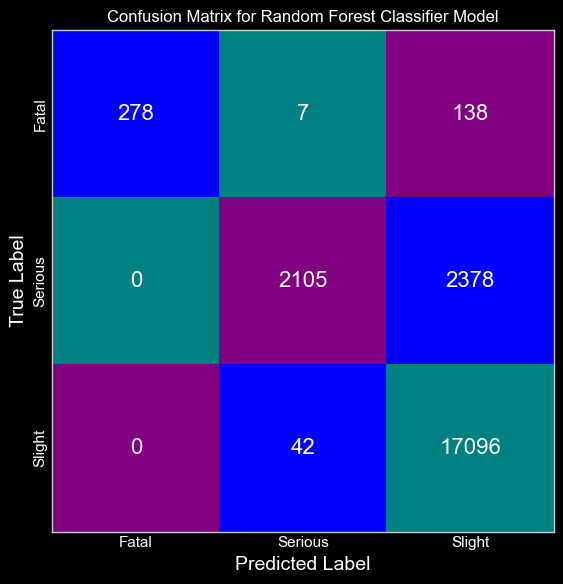

In [ ]:
# create class object and evaluate model using test data
model_evaluator = ModelEvaluator('Random Forest Classifier Model')
model_evaluator.plot_confusion_matrix(y_test, y_pred_clf)


<h3 style="color: blue "> Decision Tree Classifier
</h3>

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dtree = DecisionTreeClassifier()

dtree.fit(X_train_scaled, y_train)
# Predict on the test data
y_pred_dtree = dtree.predict(X_test_scaled)

<h4 style="color: blue "> Evaluate Model Decision Tree Classifier Model
</h4>

	Classification Report for Decision Tree Classifier Model:

              precision    recall  f1-score   support

           0       0.76      0.68      0.72       423
           1       0.63      0.59      0.61      4483
           2       0.89      0.91      0.90     17138

    accuracy                           0.84     22044
   macro avg       0.76      0.73      0.74     22044
weighted avg       0.84      0.84      0.84     22044





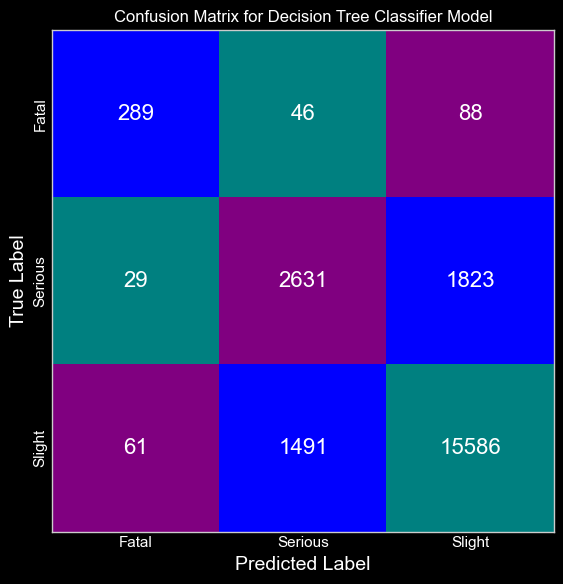

In [ ]:
# create class object and evaluate model using test data
model_evaluator = ModelEvaluator('Decision Tree Classifier Model')
model_evaluator.plot_confusion_matrix(y_test, y_pred_dtree)

<h2 style="color: blue "> Deep Learning Model
</h2>

<h4 style="color: blue "> Data Preparation for Deep Learning
</h4>

In [ ]:
# Convert inputs to float32
x_train = np.array(X_train_resampled, dtype=np.float32)
x_test = np.array(X_test_scaled, dtype=np.float32)

# ensuring y are integers for 'sparse_categorical_crossentropy'
y_train = np.array(y_train_resampled, dtype=np.int32)
y_test = np.array(y_test, dtype=np.int32)


<h4 style="color: blue "> Build and Train Deep Learning Model
</h4>

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Nadam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, LearningRateScheduler, TensorBoard
from sklearn.utils.class_weight import compute_class_weight

# Define a simple learning rate decay function
def scheduler(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

# Model construction
model = Sequential([
    Dense(1536, activation='relu', input_shape=(x_train.shape[1],)),
    BatchNormalization(),
    Dropout(0.3),
    Dense(1280, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(768, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(3, activation='softmax')
])

# Optimizer with a dynamically adjusting learning rate using Nadam
optimizer = Nadam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)
checkpoint = ModelCheckpoint(
    'best_model.h5',
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    mode='min',
    save_weights_only=False
)
lr_scheduler = LearningRateScheduler(scheduler)
tensor_board = TensorBoard(log_dir='./logs', histogram_freq=1)

# train model
classes = np.unique(y_train)
class_weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)  # Balance y_train based on class weight
class_weight_dict = dict(zip(classes, class_weights))
history = model.fit(
    x_train,
    y_train,
    epochs=50,
    batch_size=128,
    validation_split=0.2,
    callbacks=[early_stopping, reduce_lr, checkpoint, lr_scheduler, tensor_board],
    class_weight=class_weight_dict
)


Epoch 1/50
2892/2892 [==============================] - ETA: 0s - loss: 0.3984 - accuracy: 0.8246
Epoch 1: val_loss improved from inf to 1.01034, saving model to best_model.h5
2892/2892 [==============================] - 236s 80ms/step - loss: 0.3984 - accuracy: 0.8246 - val_loss: 1.0103 - val_accuracy: 0.3947 - lr: 0.0010
Epoch 2/50
2892/2892 [==============================] - ETA: 0s - loss: 0.2599 - accuracy: 0.8857
Epoch 2: val_loss improved from 1.01034 to 0.50349, saving model to best_model.h5
2892/2892 [==============================] - 271s 94ms/step - loss: 0.2599 - accuracy: 0.8857 - val_loss: 0.5035 - val_accuracy: 0.7142 - lr: 0.0010
Epoch 3/50
2892/2892 [==============================] - ETA: 0s - loss: 0.1994 - accuracy: 0.9159
Epoch 3: val_loss improved from 0.50349 to 0.33246, saving model to best_model.h5
2892/2892 [==============================] - 222s 77ms/step - loss: 0.1994 - accuracy: 0.9159 - val_loss: 0.3325 - val_accuracy: 0.8272 - lr: 0.0010
Epoch 4/50
2892/2

2892/2892 [==============================] - ETA: 0s - loss: 0.0045 - accuracy: 0.9984
Epoch 26: val_loss did not improve from 0.00077
2892/2892 [==============================] - 228s 79ms/step - loss: 0.0045 - accuracy: 0.9984 - val_loss: 7.7593e-04 - val_accuracy: 0.9998 - lr: 2.0190e-04
Epoch 27/50
2892/2892 [==============================] - ETA: 0s - loss: 0.0039 - accuracy: 0.9986
Epoch 27: val_loss improved from 0.00077 to 0.00059, saving model to best_model.h5
2892/2892 [==============================] - 229s 79ms/step - loss: 0.0039 - accuracy: 0.9986 - val_loss: 5.9437e-04 - val_accuracy: 0.9999 - lr: 1.8268e-04
Epoch 28/50
2892/2892 [==============================] - ETA: 0s - loss: 0.0039 - accuracy: 0.9987
Epoch 28: val_loss did not improve from 0.00059
2892/2892 [==============================] - 221s 76ms/step - loss: 0.0039 - accuracy: 0.9987 - val_loss: 6.5538e-04 - val_accuracy: 0.9998 - lr: 1.6530e-04
Epoch 29/50
2892/2892 [==============================] - ETA: 0s 

In [ ]:
# Evaluation
test_loss, test_acc = model.evaluate(x_test, y_test)
print(f"Test accuracy: {test_acc}")

# Prediction
predictions = model.predict(x_test)
predicted_classes = np.argmax(predictions, axis=1)

689/689 [==============================] - 6s 9ms/step - loss: 0.4266 - accuracy: 0.9432
Test accuracy: 0.9431591629981995
689/689 [==============================] - 5s 7ms/step


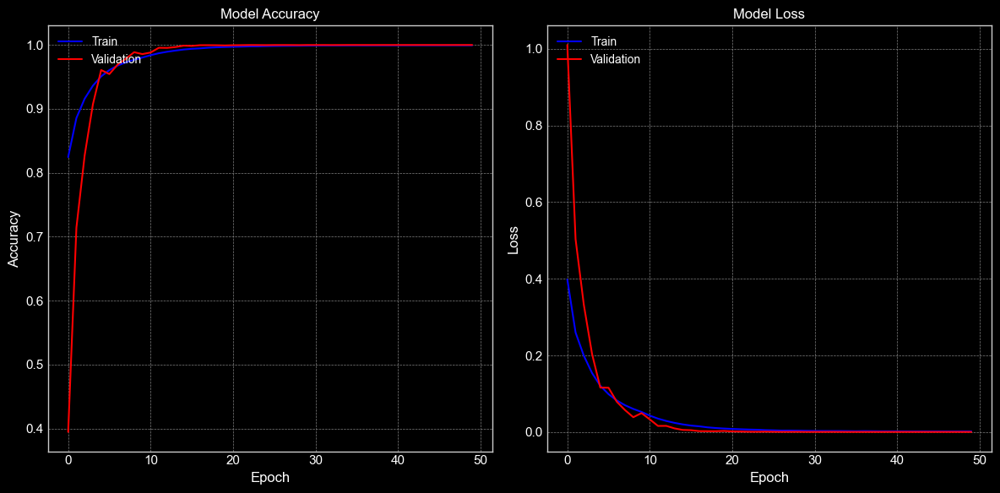

In [ ]:
# function to plot training history
def plot_history(history):
    """
    Plots the training and validation accuracy and loss from a Keras training history.

    Args:
    history : A Keras History object returned from the `fit` method of models in Keras.
              The history attribute of this object contains 'accuracy', 'val_accuracy', 'loss', and 'val_loss' as keys.
    """
    history_dict = history.history

    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    fig.patch.set_facecolor('black')

    # Accuracy subplot
    axs[0].plot(history_dict['accuracy'], color='blue')
    axs[0].plot(history_dict['val_accuracy'], color='red')
    axs[0].set_title('Model Accuracy', color='white')
    axs[0].set_ylabel('Accuracy', color='white')
    axs[0].set_xlabel('Epoch', color='white')
    axs[0].legend(['Train', 'Validation'], loc='upper left', facecolor='black', edgecolor='white', fontsize=10, labelcolor='white')
    axs[0].set_facecolor('black')
    axs[0].grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
    axs[0].tick_params(colors='white', which='both')

    # Loss subplot
    axs[1].plot(history_dict['loss'], color='blue')
    axs[1].plot(history_dict['val_loss'], color='red')
    axs[1].set_title('Model Loss', color='white')
    axs[1].set_ylabel('Loss', color='white')
    axs[1].set_xlabel('Epoch', color='white')
    axs[1].legend(['Train', 'Validation'], loc='upper left', facecolor='black', edgecolor='white', fontsize=10, labelcolor='white')
    axs[1].set_facecolor('black')
    axs[1].grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
    axs[1].tick_params(colors='white', which='both')

    plt.tight_layout()
    plt.show()


# call function
plot_history(history)

<h4 style="color: blue "> Evaluate Deep Learning Model
</h4>

689/689 [==============================] - 5s 7ms/step
	Classification Report for Deep Learning Model:

              precision    recall  f1-score   support

           0       0.99      0.80      0.89       423
           1       0.91      0.82      0.86      4483
           2       0.95      0.98      0.96     17138

    accuracy                           0.94     22044
   macro avg       0.95      0.87      0.90     22044
weighted avg       0.94      0.94      0.94     22044





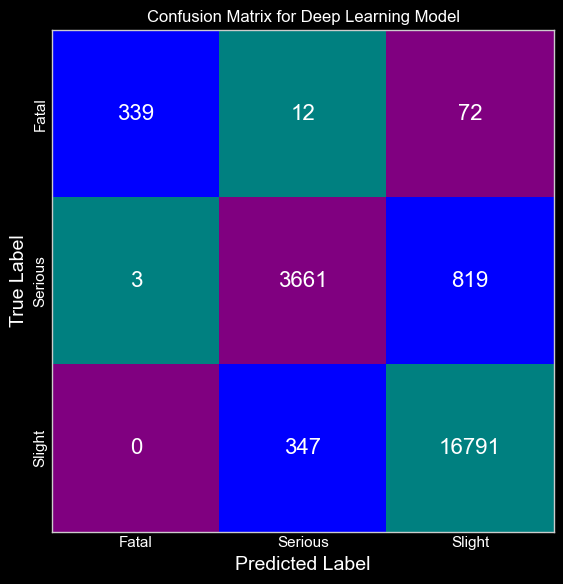

In [ ]:
from tensorflow.keras.models import load_model

# Load the best model for prediction
best_model = load_model('best_model.h5')

# Use the best model for prediction
deep_learning_model = best_model.predict(x_test)
predicted_classes = np.argmax(deep_learning_model, axis=1)

# create class object and evaluate
model_evaluator = ModelEvaluator('Deep Learning Model')
model_evaluator.plot_confusion_matrix(y_test, predicted_classes)


<h4 style="color: blue "> Feature Importances
</h4>

We'll check the top 10 features that contributed to the model development

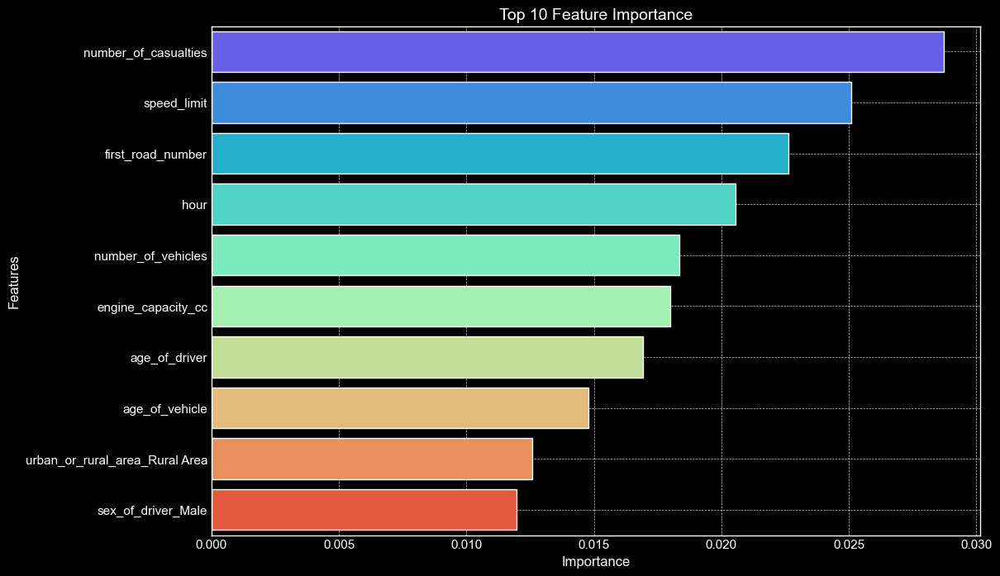

In [ ]:
# Feature names from the DataFrame after encoding
feature_names = x.columns

# Get feature importances from the model
importances = clf.feature_importances_

def feature_important(feature_names, importances):
    # Check that the lengths match
    if len(feature_names) == len(importances):
        # Create a DataFrame to view the importances clearly
        feature_importance_df = pd.DataFrame({
            'Feature': feature_names,
            'Importance': importances
        })

        # Sort the DataFrame by importance and select the top 10
        feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False).head(10)

        # Plotting the top 10 feature importances
        plt.figure(figsize=(12, 8), facecolor='black')
        sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='rainbow')
        plt.title('Top 10 Feature Importance', color='white', fontsize=14)
        plt.xlabel('Importance', color='white', fontsize=12)
        plt.ylabel('Features', color='white', fontsize=12)
        ax = plt.gca()
        ax.spines['bottom'].set_color('white')
        ax.spines['top'].set_color('white')
        ax.spines['right'].set_color('white')
        ax.spines['left'].set_color('white')
        ax.set_facecolor('black')
        ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray')
        plt.tick_params(axis='x', colors='white')
        plt.tick_params(axis='y', colors='white')
        plt.show()
    else:
        print("Mismatch in the number of features and importances. Length of features: {}, Length of importances: {}".format(len(feature_names), len(importances)))

# Call function to plot feature importance
feature_important(feature_names, importances)
